# Azure Computer Vision 4 (Florence)

## Fashion Visual Search - Images embeddings

![Image](florence.jpg)

![Image](fashionheader.png)

<br>
<i>Note: this image was generated with Azure Open AI Dall-e 2</i>

### Visual search with vector embeddings
**Vector embeddings** are a way of representing content such as text or images as vectors of real numbers in a high-dimensional space. These embeddings are often learned from large amounts of textual and visual data using machine learning algorithms like neural networks. Each dimension of the vector corresponds to a different feature or attribute of the content, such as its semantic meaning, syntactic role, or context in which it commonly appears. By representing content as vectors, we can perform mathematical operations on them to compare their similarity or use them as inputs to machine learning models.

![Image](embeddings.jpg)


### Business applications
- **Digital asset management**: Image retrieval can be used to manage large collections of digital images, such as in museums, archives, or online galleries. Users can search for images based on visual features and retrieve the images that match their criteria.
- **Medical image retrieval**: Image retrieval can be used in medical imaging to search for images based on their diagnostic features or disease patterns. This can help doctors or researchers to identify similar cases or track disease progression.
- **Security and surveillance**: Image retrieval can be used in security and surveillance systems to search for images based on specific features or patterns, such as in, people & object tracking, or threat detection.
- **Forensic image retrieval**: Image retrieval can be used in forensic investigations to search for images based on their visual content or metadata, such as in cases of cyber-crime.
- **E-commerce**: Image retrieval can be used in online shopping applications to search for similar products based on their features or descriptions or provide recommendations based on previous purchases.
- **Fashion and design**: Image retrieval can be used in fashion and design to search for images based on their visual features, such as color, pattern, or texture. This can help designers or retailers to identify similar products or trends.

### Visual Search Process
![Image](fashionprocess.png)

### Image Retrieval with Azure Computer Vision Documentation
- https://learn.microsoft.com/en-us/azure/cognitive-services/computer-vision/concept-image-retrieval
- https://learn.microsoft.com/en-us/azure/cognitive-services/computer-vision/how-to/image-retrieval

### Demo images
Demo images are a sample of this collection of images: https://www.kaggle.com/competitions/h-and-m-personalized-fashion-recommendations/data
<br><br>
> Serge Retkowsky | Microsoft | https://github.com/retkowsky | 3rd of May, 2023

## 1. <a name="chapt1"></a> Librairies

In [29]:
import datetime
import glob
import json
import multiprocessing
import numpy as np
import nomic
import os
#import plotly
#import plotly.plotly as py
#import plotly.express as px
import sys
import time

from concurrent.futures import ThreadPoolExecutor
from dotenv import load_dotenv
from nomic import atlas
from PIL import Image
from tqdm import tqdm
from umap import UMAP

In [5]:
load_dotenv("azure.env")

key = os.getenv("azure_cv_key")
endpoint = os.getenv("azure_cv_endpoint")

### Importing our specific functions

In [6]:
pyfile = "azure.py"

print("Python file:", pyfile, "Date:", time.ctime(os.path.getmtime(pyfile)))

Python file: azure.py Date: Thu Jul  6 20:15:21 2023


In [7]:
from azure import (
    image_embedding_batch,
    view_image,
)

## 2. <a name="chapt2"></a> Informations

In [8]:
sys.version

'3.11.1 (main, Mar 24 2023, 00:55:06) [GCC 11.3.0]'

In [9]:
print("Today is", datetime.datetime.today())

Today is 2023-07-07 22:47:11.909314


## 3. <a name="chapt3"></a> Our products images

In [10]:
IMAGES_DIR = "fashion"

In [11]:
image_files = glob.glob(IMAGES_DIR + "/*")

print("Directory of images:", IMAGES_DIR)
print("Total number of catalog images =", "{:,}".format(len(image_files)))

Directory of images: fashion
Total number of catalog images = 1,473


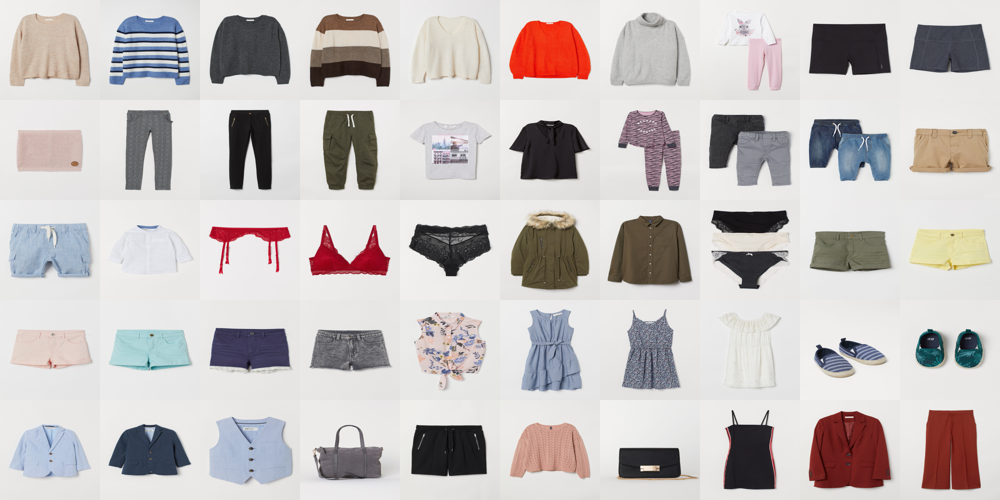

In [12]:
num_images_per_row = 10
num_images_per_col = 5
img_size = 200
start = 1000

samples = image_files[start : start + (num_images_per_row * num_images_per_col)]

samples_images = Image.new(
    "RGB", (num_images_per_row * img_size, num_images_per_col * img_size)
)

# Load and resize the images
sample_images = [
    Image.open(image_file).resize((img_size, img_size)) for image_file in samples
]

# Paste the images onto the new image
for idx, img in enumerate(sample_images):
    x = (idx % num_images_per_row) * img_size
    y = (idx // num_images_per_row) * img_size
    samples_images.paste(img, (x, y))

samples_images

## 4. <a name="chapt4"></a> Vectors embedding generation for the catalog images

In [13]:
num_cores = multiprocessing.cpu_count()

print("Number of CPU cores =", num_cores)

Number of CPU cores = 16


In [15]:
def process_image(image_file, max_retries=20):
    """
    Process image with error management
    """
    num_retries = 0

    while num_retries < max_retries:
        try:
            embedding, response = image_embedding_batch(image_file)

            if response.status_code == 200:
                return embedding

            else:
                num_retries += 1
                print(
                    f"Error processing {image_file}: {response.status_code}.\
                Retrying... (attempt {num_retries} of {max_retries})"
                )

        except Exception as e:
            print(f"An error occurred while processing {image_file}: {e}")
            print(f"Retrying... (attempt {num_retries} of {max_retries})")
            num_retries += 1

    return None

In [16]:
def process_all_images(image_files, max_workers=4, max_retries=20):
    """
    Running the full process using pool
    """
    with ThreadPoolExecutor(max_workers=max_workers) as executor:
        embeddings = list(
            tqdm(
                executor.map(lambda x: process_image(x, max_retries), image_files),
                total=len(image_files),
            )
        )

    return [emb for emb in embeddings if emb is not None]

### Running the images vectors embeddings

In [17]:
print(
    datetime.datetime.today().strftime("%d-%b-%Y %H:%M:%S"),
    "Starting to compute vector embeddings for our",
    "{:,}".format(len(image_files)),
    "catalog images...",
)
start = time.time()

# Running the images vector embeddings for all the images files
list_emb = process_all_images(image_files, max_workers=4, max_retries=20)

# End of job
print(datetime.datetime.today().strftime("%d-%b-%Y %H:%M:%S"), "Done")
elapsed = time.time() - start
print(f"\nElapsed time: {int(elapsed / 60)} minutes, {int(elapsed % 60)} seconds")
print("Number of processed images =", len(list_emb))
print(f"Processing time per image = {(elapsed / len(list_emb)):.5f} sec")

07-Jul-2023 22:47:33 Starting to compute vector embeddings for our 1,473 catalog images...


  0%|          | 0/1473 [00:00<?, ?it/s]

An error occurred while processing fashion/0391750016.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0392269012.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0392168001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0391032009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0391750016.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0392168001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0392269012.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0391032009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0391750016.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0392269012.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred wh

  0%|          | 1/1473 [00:09<3:47:47,  9.28s/it]

An error occurred while processing fashion/0391032009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0391750016.jpg: 'vector'
Retrying... (attempt 19 of 20)


  0%|          | 3/1473 [00:09<1:01:08,  2.50s/it]

An error occurred while processing fashion/0392168001.jpg: 'vector'An error occurred while processing fashion/0392269012.jpg: 'vector'
Retrying... (attempt 19 of 20)

Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0392938035.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0393447010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0394292008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0393447015.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0392938035.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0393447010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0394292008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0393447015.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

  0%|          | 5/1473 [00:17<1:17:23,  3.16s/it]

An error occurred while processing fashion/0392938035.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0394292008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0393447010.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0393447015.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0394522001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0395127001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0393447015.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0393447010.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0394522001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0395127001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

  0%|          | 6/1473 [00:18<1:03:49,  2.61s/it]

An error occurred while processing fashion/0393447010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0395127001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0395127006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0394522001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0395127001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0395658035.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0395127006.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0394522001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0395127001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0395127006.jpg: 'vector'An error occurred while processing fashion/0395658

  1%|          | 9/1473 [00:24<58:08,  2.38s/it]  

An error occurred while processing fashion/0395658035.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0395127001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0395127006.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0394522001.jpg: 'vector'
Retrying... (attempt 19 of 20)


  1%|          | 10/1473 [00:25<48:36,  1.99s/it]

An error occurred while processing fashion/0395658035.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0395127001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0395127006.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0395658038.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0395658035.jpg: 'vector'
Retrying... (attempt 14 of 20)


  1%|          | 11/1473 [00:25<40:11,  1.65s/it]

An error occurred while processing fashion/0395658042.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0395658038.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0395127006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0395658035.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0395658042.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0395658038.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0395730018.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0395658042.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0395658035.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0395658038.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred

  1%|          | 12/1473 [00:27<41:35,  1.71s/it]

An error occurred while processing fashion/0395730018.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0395658035.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0395658042.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0395658038.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0395730018.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0395730037.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0395658042.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0395658038.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0395730037.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0395730018.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred w

  1%|          | 13/1473 [00:32<59:30,  2.45s/it]

An error occurred while processing fashion/0395730037.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0395658042.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0395658038.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0395730018.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0395730037.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0395658042.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0395730040.jpg: 'vector'
Retrying... (attempt 0 of 20)


  1%|          | 14/1473 [00:32<46:59,  1.93s/it]

An error occurred while processing fashion/0395730018.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0395730037.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0395658042.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0395730040.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0395730037.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0395730018.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0395730040.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0395864060.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0395730037.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0395730040.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occur

  1%|          | 15/1473 [00:34<46:04,  1.90s/it]

An error occurred while processing fashion/0395730037.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0395730040.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0395864060.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0395730018.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0395730037.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0395730040.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0396135007.jpg: 'vector'
Retrying... (attempt 0 of 20)


  1%|          | 16/1473 [00:35<36:31,  1.50s/it]

An error occurred while processing fashion/0395864060.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0395730037.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0395730040.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0396135007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0396690020.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0395730040.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0395864060.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0396135007.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0396690020.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0395730040.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred w

  1%|          | 17/1473 [00:39<57:54,  2.39s/it]

An error occurred while processing fashion/0395730040.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0395864060.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0396135007.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0396690020.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0397068032.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0396135007.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0396690020.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0395864060.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0397068032.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0396135007.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occ

  1%|          | 18/1473 [00:44<1:12:35,  2.99s/it]

An error occurred while processing fashion/0398074056.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0397068032.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0395864060.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0398074048.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0398074056.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0398074069.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0397068032.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0398074048.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0397068032.jpg: 'vector'An error occurred while processing fashion/0398074069.jpg: 'vector'
Retrying... (attempt 1 of 20)

Retrying... (attempt 13 of 20)
An error occurre

  1%|▏         | 21/1473 [00:47<46:45,  1.93s/it]  

An error occurred while processing fashion/0398074069.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0397068032.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0398074056.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0398074048.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0398074069.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0398089004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0398074048.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0398074069.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0398074056.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0398089004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

  1%|▏         | 22/1473 [00:50<51:54,  2.15s/it]

An error occurred while processing fashion/0398074069.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0398074048.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0398074056.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0398089004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0398074069.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0398127007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0398074069.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0398074056.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0398089004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0398127007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

  2%|▏         | 23/1473 [00:53<56:38,  2.34s/it]

An error occurred while processing fashion/0398074056.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0398089004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0398127007.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0398959003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0398127007.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0399061017.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0398089004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0398959003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0398127007.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0398959003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurre

  2%|▏         | 25/1473 [00:57<52:47,  2.19s/it]

An error occurred while processing fashion/0398089004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0398127007.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0399061017.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0398959003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0399061018.jpg: 'vector'
Retrying... (attempt 0 of 20)


  2%|▏         | 26/1473 [00:57<43:34,  1.81s/it]

An error occurred while processing fashion/0398127007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0399061017.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0398959003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0399061018.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0399061023.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0398959003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0399061017.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0399061018.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0399061023.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0398959003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurr

  2%|▏         | 27/1473 [00:59<41:56,  1.74s/it]

An error occurred while processing fashion/0399061017.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0399061018.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0398959003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0399061023.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0399061018.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0399061023.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0399061017.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0399061033.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0399061018.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0399061023.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred

  2%|▏         | 28/1473 [01:02<52:36,  2.18s/it]

An error occurred while processing fashion/0399061033.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0399061018.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0399061023.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0399087010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0399061033.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0399061023.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0399061018.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0399087010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0399061033.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0399061023.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurr

  2%|▏         | 29/1473 [01:05<54:25,  2.26s/it]

An error occurred while processing fashion/0399061023.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0399061018.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0399087010.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0399061033.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0399087028.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0399087030.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0399087010.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0399087028.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0399061033.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0399087030.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

  2%|▏         | 31/1473 [01:08<47:05,  1.96s/it]

An error occurred while processing fashion/0399087010.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0399061033.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0399087030.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0399087028.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0399087010.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0399136004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0399087028.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0399136004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0399087030.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0399087010.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurr

  2%|▏         | 32/1473 [01:11<53:17,  2.22s/it]

An error occurred while processing fashion/0399087030.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0399087010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0399087028.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0399136004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0399087030.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0399136060.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0399087028.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0399136004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0399087030.jpg: 'vector'
Retrying... (attempt 17 of 20)


  2%|▏         | 33/1473 [01:12<45:23,  1.89s/it]

An error occurred while processing fashion/0399136060.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0399087028.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0399136004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0399087030.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0399136060.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0399201033.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0399136004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0399087030.jpg: 'vector'
Retrying... (attempt 19 of 20)


  2%|▏         | 34/1473 [01:12<36:31,  1.52s/it]

An error occurred while processing fashion/0399136060.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0399201033.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0399136004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0399201042.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0399136060.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0399201033.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0399136004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0399201042.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0399136060.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0399201033.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred 

  2%|▏         | 35/1473 [01:15<47:21,  1.98s/it]

An error occurred while processing fashion/0399136004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0399136060.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0399201042.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0399201033.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0399223025.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0399136060.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0399201042.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0399201033.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0399223025.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0399136060.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurre

  2%|▏         | 36/1473 [01:19<58:06,  2.43s/it]

An error occurred while processing fashion/0399136060.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0399201033.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0399223025.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0399201042.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0399223030.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0399201033.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0399223025.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0399201042.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0399223025.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0399223030.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

  3%|▎         | 37/1473 [01:21<55:37,  2.32s/it]

An error occurred while processing fashion/0399223030.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0399223025.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0399201033.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0399256009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0399223030.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0399256019.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0399223025.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0399256009.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0399256019.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0399223030.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred

  3%|▎         | 39/1473 [01:23<41:55,  1.75s/it]

An error occurred while processing fashion/0399256009.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0399256019.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0399223030.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0399223025.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0399256009.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0399256019.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0399223030.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620004001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0399256009.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0399256019.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred w

  3%|▎         | 40/1473 [01:28<59:19,  2.48s/it]

An error occurred while processing fashion/0399223030.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620004001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0399256019.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0399256009.jpg: 'vector'
Retrying... (attempt 19 of 20)


  3%|▎         | 41/1473 [01:28<45:13,  1.89s/it]

An error occurred while processing fashion/0620008004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620004001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0620076005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620036002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620008004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620004001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0620036002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620076005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620004001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620008004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred

  3%|▎         | 43/1473 [01:31<38:49,  1.63s/it]

An error occurred while processing fashion/0620036002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620076005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620004001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620008004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620036002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620076005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620081010.jpg: 'vector'An error occurred while processing fashion/0620008004.jpg: 'vector'
Retrying... (attempt 7 of 20)

Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620036002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620076005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred w

  3%|▎         | 44/1473 [01:36<58:23,  2.45s/it]

An error occurred while processing fashion/0620008004.jpg: 'vector'
Retrying... (attempt 19 of 20)


  3%|▎         | 45/1473 [01:36<45:21,  1.91s/it]

An error occurred while processing fashion/0620081010.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0620076005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620036002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620094001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620081010.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620139003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620094001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620095002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620139003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620081010.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurr

  3%|▎         | 47/1473 [01:40<45:07,  1.90s/it]

An error occurred while processing fashion/0620095002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620081010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620139003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0620094001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620170001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620095002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620139003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620094001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0620170001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620139003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurr

  3%|▎         | 48/1473 [01:44<59:22,  2.50s/it]

An error occurred while processing fashion/0620094001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620170001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620179001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620095002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0620170001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0620180004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620179001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0620095002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0620170001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0620179001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occur

  3%|▎         | 49/1473 [01:46<53:59,  2.27s/it]

An error occurred while processing fashion/0620179001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620095002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620180004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620170001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0620179001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620187001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620180004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0620170001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0620179001.jpg: 'vector'
Retrying... (attempt 9 of 20)


  3%|▎         | 51/1473 [01:47<36:06,  1.52s/it]

An error occurred while processing fashion/0620187001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620180004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620170001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620179001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0620187001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620191003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620179001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620180004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620187001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620191003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

  4%|▎         | 52/1473 [01:50<46:02,  1.94s/it]

An error occurred while processing fashion/0620187001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620179001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620180004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0620191003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620187001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0620191008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620191003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620180004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0620191008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620187001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurr

  4%|▎         | 53/1473 [01:53<50:59,  2.15s/it]

An error occurred while processing fashion/0620191003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620180004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620187001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0620191008.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620191003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0620197007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620191008.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620187001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0620191003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0620197007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

  4%|▎         | 54/1473 [01:54<46:40,  1.97s/it]

An error occurred while processing fashion/0620197007.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620187001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620191008.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620197016.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620197007.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0620191008.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620197034.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620197007.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620197016.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620197034.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

  4%|▍         | 56/1473 [01:58<44:00,  1.86s/it]

An error occurred while processing fashion/0620197034.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620191008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620197007.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620197016.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620197034.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620197036.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620197007.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0620197016.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620197036.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620197034.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred

  4%|▍         | 57/1473 [02:01<49:29,  2.10s/it]

An error occurred while processing fashion/0620197036.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620197007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620197034.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0620197016.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0620197036.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620208007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620197034.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620197036.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620197016.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620208007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

  4%|▍         | 58/1473 [02:04<53:44,  2.28s/it]

An error occurred while processing fashion/0620197016.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620208041.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620197036.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0620208042.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620208007.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620208041.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620197036.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620208007.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620208041.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620197036.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurre

  4%|▍         | 60/1473 [02:05<39:58,  1.70s/it]

An error occurred while processing fashion/0620208007.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0620208042.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620208041.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620197036.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620208007.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620208042.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0620208041.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620216017.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620208007.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620208042.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurre

  4%|▍         | 61/1473 [02:09<49:24,  2.10s/it]

An error occurred while processing fashion/0620208042.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620208007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620208041.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620216017.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620208042.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0620216031.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620208041.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0620216017.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620208042.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0620216031.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

  4%|▍         | 62/1473 [02:11<47:19,  2.01s/it]

An error occurred while processing fashion/0620216017.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620208041.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620208042.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0620216031.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0620216017.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0620216039.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620216031.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620208042.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0620216017.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0620216039.jpg: 'vector'
Retrying... (attempt 1 of 20)


  4%|▍         | 63/1473 [02:12<41:09,  1.75s/it]

An error occurred while processing fashion/0620216031.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620208042.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620216039.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620216017.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620216031.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620216052.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620216017.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0620216039.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620216031.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620216052.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

  4%|▍         | 64/1473 [02:13<41:03,  1.75s/it]

An error occurred while processing fashion/0620216031.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0620216052.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620216017.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620216039.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620216031.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620216052.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0620216073.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620216039.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620216031.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620216052.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurre

  4%|▍         | 65/1473 [02:17<56:46,  2.42s/it]

An error occurred while processing fashion/0620216031.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620216052.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620216073.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620216039.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620231001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620216073.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620216052.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0620216039.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0620231001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620216073.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurr

  4%|▍         | 66/1473 [02:20<54:34,  2.33s/it]

An error occurred while processing fashion/0620216052.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0620216039.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620231001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0620216073.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620216052.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0620238001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620231001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620216073.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0620216052.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0620238001.jpg: 'vector'
Retrying... (attempt 1 of 20)


  5%|▍         | 67/1473 [02:20<44:44,  1.91s/it]

An error occurred while processing fashion/0620231001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620216073.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0620216052.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620238001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620231001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620216073.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620238006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620238001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620231001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620216073.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurre

  5%|▍         | 68/1473 [02:23<45:42,  1.95s/it]

An error occurred while processing fashion/0620238001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620216073.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620238006.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620231001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620239001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620231001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620238001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620238006.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0620231001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0620239001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

  5%|▍         | 69/1473 [02:26<59:06,  2.53s/it]

An error occurred while processing fashion/0620239001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620231001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620238006.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620238001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0620239001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620238006.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620242001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620238001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620239001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620238006.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occur

  5%|▍         | 70/1473 [02:28<54:38,  2.34s/it]

An error occurred while processing fashion/0620242001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620238001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620239001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0620238006.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0620242001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0620242002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620239001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0620238006.jpg: 'vector'
Retrying... (attempt 18 of 20)


  5%|▍         | 71/1473 [02:29<44:07,  1.89s/it]

An error occurred while processing fashion/0620242002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620239001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620238006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620242001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620242002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620239001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0620242001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620257001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620242002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620239001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurre

  5%|▍         | 72/1473 [02:31<42:17,  1.81s/it]

An error occurred while processing fashion/0620242002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620239001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620242001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620257001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620242002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620319010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620242001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620242002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620257001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620319010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

  5%|▍         | 73/1473 [02:36<1:03:21,  2.72s/it]

An error occurred while processing fashion/0620242001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620257001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620337001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620319010.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0620361003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620257001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0620337001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620319010.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620361003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620319010.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occur

  5%|▌         | 75/1473 [02:39<54:06,  2.32s/it]  

An error occurred while processing fashion/0620257001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620424032.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0620424040.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620337001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620361003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620424032.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620424040.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620424032.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620337001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620361003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred 

  5%|▌         | 77/1473 [02:45<57:35,  2.48s/it]

An error occurred while processing fashion/0620337001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620424032.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0620424040.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0620424056.jpg: 'vector'
Retrying... (attempt 1 of 20)


  5%|▌         | 79/1473 [02:45<38:14,  1.65s/it]

An error occurred while processing fashion/0620424061.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620424032.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620424056.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620424040.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620424061.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620424071.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620424056.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620424040.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0620424061.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620424071.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

  5%|▌         | 80/1473 [02:47<37:34,  1.62s/it]

An error occurred while processing fashion/0620424056.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620424040.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620424061.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620424071.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0620424056.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620424061.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620424074.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620424071.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620424056.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620424074.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

  5%|▌         | 81/1473 [02:52<58:46,  2.53s/it]

An error occurred while processing fashion/0620424061.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0620424074.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0620424056.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620424071.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0620424061.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0620424074.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620425023.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620424071.jpg: 'vector'
Retrying... (attempt 17 of 20)


  6%|▌         | 82/1473 [02:53<49:48,  2.15s/it]

An error occurred while processing fashion/0620424061.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620425023.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620424074.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620424071.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0620425038.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620424074.jpg: 'vector'
Retrying... (attempt 13 of 20)


  6%|▌         | 83/1473 [02:54<40:24,  1.74s/it]

An error occurred while processing fashion/0620425023.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620424071.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620425038.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620424074.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0620425023.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620447002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620425038.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620424074.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620425023.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0620447002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

  6%|▌         | 84/1473 [02:56<43:31,  1.88s/it]

An error occurred while processing fashion/0620447002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0620425023.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620424074.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620425038.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620447002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620425023.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620425038.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620510004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620447002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620425023.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred w

  6%|▌         | 85/1473 [03:01<1:00:43,  2.63s/it]

An error occurred while processing fashion/0620425023.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620510004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620425038.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0620447002.jpg: 'vector'
Retrying... (attempt 16 of 20)


  6%|▌         | 86/1473 [03:01<46:56,  2.03s/it]  

An error occurred while processing fashion/0620552001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620510004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620425038.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620447002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0620552001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620447002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0620510004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0620553001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620447002.jpg: 'vector'
Retrying... (attempt 19 of 20)


  6%|▌         | 87/1473 [03:02<38:36,  1.67s/it]

An error occurred while processing fashion/0620552001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620553001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620510004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620569002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620552001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620569002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620553001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620510004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620569002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620552001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred 

  6%|▌         | 88/1473 [03:06<55:19,  2.40s/it]

An error occurred while processing fashion/0620569002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620552001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0620553001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0620510004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620569002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620552001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620585013.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620553001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620569002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0620552001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error oc

  6%|▌         | 89/1473 [03:10<1:08:08,  2.95s/it]

An error occurred while processing fashion/0620552001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620608001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0620701001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620585013.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0620608001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620703005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620701001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620608001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620585013.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620701001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred

  6%|▌         | 92/1473 [03:15<49:56,  2.17s/it]  

An error occurred while processing fashion/0620701001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620608001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0620585013.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620703005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620701001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0620608001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0620754002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620701001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0620703005.jpg: 'vector'
Retrying... (attempt 9 of 20)


  6%|▋         | 93/1473 [03:16<43:02,  1.87s/it]

An error occurred while processing fashion/0620608001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620754002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620701001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620794003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620703005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0620754002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620701001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0620794003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620754002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620701001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurr

  6%|▋         | 94/1473 [03:17<41:11,  1.79s/it]

An error occurred while processing fashion/0620703005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620754002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620701001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620794003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0620851002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620794003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620754002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620703005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0620851002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620754002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred

  6%|▋         | 95/1473 [03:21<50:50,  2.21s/it]

An error occurred while processing fashion/0620703005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620794003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0620851002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620754002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620889001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620794003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0620851002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0620754002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0620889001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620794003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occu

  7%|▋         | 96/1473 [03:23<48:54,  2.13s/it]

An error occurred while processing fashion/0620754002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620889001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0620794003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0620851002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0620911002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620889001.jpg: 'vector'
Retrying... (attempt 5 of 20)


  7%|▋         | 97/1473 [03:23<39:00,  1.70s/it]

An error occurred while processing fashion/0620851002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620794003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620911002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620889001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620851002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0620911002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620928008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620889001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620851002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0620911002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurre

  7%|▋         | 98/1473 [03:25<36:45,  1.60s/it]

An error occurred while processing fashion/0620851002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620928008.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620911002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620889001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0620928012.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620911002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620928008.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620889001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620928012.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620911002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred

  7%|▋         | 99/1473 [03:28<49:20,  2.15s/it]

An error occurred while processing fashion/0620911002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0620889001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620928012.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620911002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620933004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620928008.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0620928012.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0620911002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0620933004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620928012.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occu

  7%|▋         | 100/1473 [03:30<46:44,  2.04s/it]

An error occurred while processing fashion/0620928012.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0620933004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620911002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620928008.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0620928012.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0620933004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0620963003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620928008.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0620933004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620963003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

  7%|▋         | 101/1473 [03:33<51:17,  2.24s/it]

An error occurred while processing fashion/0620963003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620981001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620933004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620928008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620963003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620981001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620933004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620963003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0621020003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620981001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred

  7%|▋         | 103/1473 [03:36<44:25,  1.95s/it]

An error occurred while processing fashion/0620933004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620963003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0621020003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620981001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620963003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0621048001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620981001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0621020003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620963003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0620981001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occur

  7%|▋         | 104/1473 [03:37<41:19,  1.81s/it]

An error occurred while processing fashion/0621048001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620963003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621020003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620981001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0621048001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0621073001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620981001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0621020003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0621073001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621048001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurre

  7%|▋         | 105/1473 [03:40<45:04,  1.98s/it]

An error occurred while processing fashion/0621048001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620981001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621020003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0621073001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0621048001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0621250001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621020003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0621073001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621250001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621048001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred

  7%|▋         | 106/1473 [03:42<45:56,  2.02s/it]

An error occurred while processing fashion/0621073001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621048001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0621020003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621250001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0621073001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0621048001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0621250001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621332001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621073001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621250001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurr

  7%|▋         | 107/1473 [03:45<55:55,  2.46s/it]

An error occurred while processing fashion/0621332001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621048001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621250001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0621073001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0621332001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0621340002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621250001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0621073001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0621332001.jpg: 'vector'
Retrying... (attempt 8 of 20)


  7%|▋         | 108/1473 [03:47<47:23,  2.08s/it]

An error occurred while processing fashion/0621340002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621250001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0621073001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621332001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621340002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0621250001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0621359001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621332001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0621250001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0621340002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurr

  7%|▋         | 109/1473 [03:48<40:14,  1.77s/it]

An error occurred while processing fashion/0621332001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621250001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621359001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0621340002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0621332001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0621359003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621359001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0621340002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0621332001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0621359001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurre

  7%|▋         | 110/1473 [03:51<53:58,  2.38s/it]

An error occurred while processing fashion/0621332001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621359003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621359001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621340002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0621381001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621359001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0621340002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0621359003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0621381001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621359001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occur

  8%|▊         | 111/1473 [03:54<53:41,  2.37s/it]

An error occurred while processing fashion/0621381001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0621359001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0621340002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621359003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621381001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0621359001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0621400003.jpg: 'vector'
Retrying... (attempt 0 of 20)


  8%|▊         | 112/1473 [03:55<43:18,  1.91s/it]

An error occurred while processing fashion/0621381001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621400003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621359001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621359003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0621381001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0621400003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0621410002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621359003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0621381001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0621400003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred

  8%|▊         | 113/1473 [03:58<55:53,  2.47s/it]

An error occurred while processing fashion/0621410002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0621359003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621400003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621381001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0621474008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621410002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0621400003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0621474008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621381001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0621410002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurr

  8%|▊         | 114/1473 [04:00<52:23,  2.31s/it]

An error occurred while processing fashion/0621400003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0621381001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621474008.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0621410002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0621400003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0621476001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621474008.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621400003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0621410002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0621474008.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occur

  8%|▊         | 115/1473 [04:01<43:11,  1.91s/it]

An error occurred while processing fashion/0621400003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621474008.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0621410002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0621476001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0621522003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621474008.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621410002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0621522003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621476001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0621474008.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurre

  8%|▊         | 116/1473 [04:04<45:56,  2.03s/it]

An error occurred while processing fashion/0621474008.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0621410002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621522003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621476001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0621474008.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0621522009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621522003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0621474008.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0621476001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0621522009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

  8%|▊         | 117/1473 [04:05<43:13,  1.91s/it]

An error occurred while processing fashion/0621522009.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0621476001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0621522003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0621474008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621522009.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0621522003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621522030.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621476001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621522009.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0621522003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occur

  8%|▊         | 118/1473 [04:10<59:48,  2.65s/it]

An error occurred while processing fashion/0621476001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621522031.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0621522030.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621522009.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0621522032.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621522031.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0621522030.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0621522009.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0621522032.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621522030.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occur

  8%|▊         | 120/1473 [04:11<41:41,  1.85s/it]

An error occurred while processing fashion/0621522031.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0621522009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621522032.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0621522030.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0621522031.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621522030.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0621522032.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0621522036.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621522031.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0621522030.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurre

  8%|▊         | 121/1473 [04:14<44:00,  1.95s/it]

An error occurred while processing fashion/0621522031.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0621522030.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621522032.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0621522036.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0621522031.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621523005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621522032.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621522036.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0621522031.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0621523005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

  8%|▊         | 122/1473 [04:17<52:28,  2.33s/it]

An error occurred while processing fashion/0621522032.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0621522036.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0621523005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0621522031.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621522032.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0621522036.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0621523005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621523016.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621522032.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0621522036.jpg: 'vector'
Retrying... (attempt 14 of 20)


  8%|▊         | 123/1473 [04:18<43:26,  1.93s/it]

An error occurred while processing fashion/0621523005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0621523016.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621522032.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621522036.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0621523005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621523016.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0621530001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621522036.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0621523005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0621523016.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occur

  8%|▊         | 124/1473 [04:19<41:03,  1.83s/it]

An error occurred while processing fashion/0621530001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0621522036.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621523005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0621523016.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621530001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0621729003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621523005.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0621523016.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0621530001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0621729003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

  8%|▊         | 125/1473 [04:21<38:23,  1.71s/it]

An error occurred while processing fashion/0621530001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0621729003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0621523005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621523016.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0621530001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0621729003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0621734003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621523016.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621530001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621729003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred

  9%|▊         | 126/1473 [04:24<49:04,  2.19s/it]

An error occurred while processing fashion/0621734003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621523016.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621729003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0621530001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0621734003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0621735016.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621530001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0621729003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0621734003.jpg: 'vector'
Retrying... (attempt 8 of 20)


  9%|▊         | 127/1473 [04:25<41:17,  1.84s/it]

An error occurred while processing fashion/0621735016.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621729003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0621530001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621734003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621735016.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0621748002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621729003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0621734003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0621735016.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0621729003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurr

  9%|▊         | 128/1473 [04:27<41:44,  1.86s/it]

An error occurred while processing fashion/0621729003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621748002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0621735016.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0621734003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0621748002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0621735016.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0621750001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621734003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0621748002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621735016.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred

  9%|▉         | 129/1473 [04:30<47:30,  2.12s/it]

An error occurred while processing fashion/0621735016.jpg: 'vector'An error occurred while processing fashion/0621748002.jpg: 'vector'
Retrying... (attempt 10 of 20)

Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0621734003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621750001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0621748002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621735016.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0621759002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621750001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0621748002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0621759002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

  9%|▉         | 130/1473 [04:32<50:33,  2.26s/it]

An error occurred while processing fashion/0621759002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0621735016.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621748002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0621750001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621759002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621759009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621748002.jpg: 'vector'
Retrying... (attempt 18 of 20)


  9%|▉         | 131/1473 [04:33<40:15,  1.80s/it]

An error occurred while processing fashion/0621750001.jpg: 'vector'An error occurred while processing fashion/0621759002.jpg: 'vector'
Retrying... (attempt 7 of 20)

Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0621759009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621748002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621759002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0621759009.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0621760008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621750001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621759002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621759009.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred

  9%|▉         | 132/1473 [04:38<1:01:29,  2.75s/it]

An error occurred while processing fashion/0621750001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621760009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621760008.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621759009.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0621760009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621766001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621759009.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0621760008.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0621760009.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0621759009.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occur

  9%|▉         | 134/1473 [04:40<44:55,  2.01s/it]  

An error occurred while processing fashion/0621766001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0621760008.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0621759009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621760009.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621766001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0621760009.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0621760008.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0621766003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621766001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0621760009.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred

  9%|▉         | 135/1473 [04:42<40:52,  1.83s/it]

An error occurred while processing fashion/0621760008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621766001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621766003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0621760009.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0621766004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621766001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0621766003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0621760009.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621766004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621760009.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurre

  9%|▉         | 136/1473 [04:46<52:33,  2.36s/it]

An error occurred while processing fashion/0621760009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621766004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621766001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0621766003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621767001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621766004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0621767001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621766004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621766001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0621766003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occur

  9%|▉         | 137/1473 [04:50<1:03:27,  2.85s/it]

An error occurred while processing fashion/0621766004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0621767001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621766001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621766003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0621766004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621767001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0621767004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621766003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0621767001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621768001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occu

  9%|▉         | 138/1473 [04:52<59:26,  2.67s/it]  

An error occurred while processing fashion/0621767001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0621767004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0621768001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0621766003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621767001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0621767004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621767001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0621820002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621768001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0621767004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurre

 10%|▉         | 140/1473 [04:53<38:51,  1.75s/it]

An error occurred while processing fashion/0621767001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621767004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621820002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0621768001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621914001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621767004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0621820002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0621768001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0621767004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621914001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 10%|▉         | 141/1473 [04:57<49:03,  2.21s/it]

An error occurred while processing fashion/0621767004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621820002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0621768001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0621914001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0621914009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621820002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621768001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0621914009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621914001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621820002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occur

 10%|▉         | 142/1473 [04:59<49:34,  2.23s/it]

An error occurred while processing fashion/0621820002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0621768001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621914009.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621914001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0621820002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0621915004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621914009.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0621914001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0621915004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621820002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occur

 10%|▉         | 143/1473 [05:01<45:38,  2.06s/it]

An error occurred while processing fashion/0621915004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0621914001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0621914009.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0621820002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621915004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0621914009.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621914001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0621920003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621915004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0621914009.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occur

 10%|▉         | 144/1473 [05:02<39:54,  1.80s/it]

An error occurred while processing fashion/0621920003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0621915004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0621914001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621914009.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0621920003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0621915004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0621926001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621914009.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0621920003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0621915004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred

 10%|▉         | 145/1473 [05:04<41:52,  1.89s/it]

An error occurred while processing fashion/0621920003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0621914009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621926001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0621915004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0621920003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0621939010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621926001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0621915004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0621920003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621939010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 10%|▉         | 146/1473 [05:07<46:25,  2.10s/it]

An error occurred while processing fashion/0621920003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0621939010.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0621915004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621926001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0621939010.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621920003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0621926001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621963002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621939010.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0621920003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occur

 10%|▉         | 147/1473 [05:09<48:06,  2.18s/it]

An error occurred while processing fashion/0621920003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621926001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0621939010.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0621963002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0621926001.jpg: 'vector'An error occurred while processing fashion/0621939010.jpg: 'vector'
Retrying... (attempt 13 of 20)

Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0622026001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621963002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621939010.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0622026001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 10%|█         | 148/1473 [05:11<45:16,  2.05s/it]

An error occurred while processing fashion/0621939010.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0621926001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622026001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0621963002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0621939010.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0622043003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622026001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0621939010.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0621963002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0622043003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 10%|█         | 149/1473 [05:12<39:27,  1.79s/it]

An error occurred while processing fashion/0621963002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0622043003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0622026001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0621939010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622043003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0621963002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0622026001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0622043008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622043003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0622026001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred

 10%|█         | 150/1473 [05:15<51:17,  2.33s/it]

An error occurred while processing fashion/0622043008.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621963002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622026001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0622043003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0622043008.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0622078005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622026001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0622043003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0622043008.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0622078005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occu

 10%|█         | 151/1473 [05:17<45:54,  2.08s/it]

An error occurred while processing fashion/0622043003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0622026001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622043008.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0622078005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0622043003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0622101003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622043008.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0622078005.jpg: 'vector'
Retrying... (attempt 5 of 20)


 10%|█         | 152/1473 [05:18<36:00,  1.64s/it]

An error occurred while processing fashion/0622043003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622101003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622043008.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0622078005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0622101003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0622149011.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622043008.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0622078005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0622101003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0622043008.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurre

 10%|█         | 153/1473 [05:19<34:05,  1.55s/it]

An error occurred while processing fashion/0622043008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622078005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0622101003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0622149011.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0622078005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0622154001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622101003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0622149011.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0622078005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0622101003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred

 10%|█         | 154/1473 [05:23<50:44,  2.31s/it]

An error occurred while processing fashion/0622078005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622101003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0622154001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0622149011.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0622101003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0622174003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622154001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0622149011.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0622101003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0622154001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occu

 11%|█         | 155/1473 [05:24<45:11,  2.06s/it]

An error occurred while processing fashion/0622154001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0622101003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622174003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0622149011.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0622154001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0622220001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622174003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0622149011.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0622154001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0622220001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 11%|█         | 156/1473 [05:27<51:05,  2.33s/it]

An error occurred while processing fashion/0622149011.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622154001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0622220001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0622220007.jpg: 'vector'
Retrying... (attempt 0 of 20)


 11%|█         | 157/1473 [05:28<39:20,  1.79s/it]

An error occurred while processing fashion/0622174003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0622154001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622220007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622220001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0622228001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622174003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0622220007.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0622220001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0622228001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622220007.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred w

 11%|█         | 158/1473 [05:34<1:06:38,  3.04s/it]

An error occurred while processing fashion/0622228001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0622238009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622174003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622220007.jpg: 'vector'
Retrying... (attempt 18 of 20)


 11%|█         | 160/1473 [05:34<38:16,  1.75s/it]  

An error occurred while processing fashion/0622228001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0622238009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622238018.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622220007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622228001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0622238009.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0622238018.jpg: 'vector'
Retrying... (attempt 1 of 20)


 11%|█         | 161/1473 [05:35<31:31,  1.44s/it]

An error occurred while processing fashion/0622271001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622228001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622238009.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0622238018.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0622271001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622284003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622238009.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0622238018.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0622271001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0622284003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 11%|█         | 162/1473 [05:41<1:00:16,  2.76s/it]

An error occurred while processing fashion/0622284003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0622238009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622238018.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0622271001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0622284003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0622341002.jpg: 'vector'
Retrying... (attempt 0 of 20)


 11%|█         | 163/1473 [05:42<46:11,  2.12s/it]  

An error occurred while processing fashion/0622238018.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622271001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0622284003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0622341002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622373003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622271001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0622284003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0622341002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0622373003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622284003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occur

 11%|█         | 164/1473 [05:43<40:17,  1.85s/it]

An error occurred while processing fashion/0622444001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622271001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622373003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0622341002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0622444001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622544001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622373003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0622341002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0622444001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0622544001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 11%|█▏        | 166/1473 [05:49<51:33,  2.37s/it]

An error occurred while processing fashion/0622444001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0622341002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622373003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622544001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0622444001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0622678005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622544001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0622745003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622444001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0622678005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occu

 11%|█▏        | 168/1473 [05:50<36:37,  1.68s/it]

An error occurred while processing fashion/0622444001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622678005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0622544001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0622745003.jpg: 'vector'
Retrying... (attempt 1 of 20)


 11%|█▏        | 169/1473 [05:51<31:17,  1.44s/it]

An error occurred while processing fashion/0622825010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622678005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0622544001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622745003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0622825010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622678005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0622845004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622825010.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0622745003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0622678005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred w

 12%|█▏        | 170/1473 [05:57<53:51,  2.48s/it]

An error occurred while processing fashion/0622678005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622825010.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0622845004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0622745003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0622825010.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0622877006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622845004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0622745003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0622825010.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0622845004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error oc

 12%|█▏        | 171/1473 [05:59<55:18,  2.55s/it]

An error occurred while processing fashion/0622878016.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0622879001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0622745003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622877006.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0622878016.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0622879001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0622877006.jpg: 'vector'An error occurred while processing fashion/0622878016.jpg: 'vector'
Retrying... (attempt 5 of 20)

Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0622890003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622879001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred w

 12%|█▏        | 174/1473 [06:06<53:10,  2.46s/it]

An error occurred while processing fashion/0622896002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622896001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622877006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622890003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0622896002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622896001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622890003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0622907002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622896002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0622896001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred

 12%|█▏        | 177/1473 [06:08<35:35,  1.65s/it]

An error occurred while processing fashion/0622907002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0622896002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0622896001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0622890003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622896002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0622907002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0622896001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0622955001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622896002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0622955001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 12%|█▏        | 179/1473 [06:14<42:09,  1.95s/it]

An error occurred while processing fashion/0622896001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622907002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0622896002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622955001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0622955007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622955001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0622958001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622907002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0622955007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622955001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occu

 12%|█▏        | 180/1473 [06:17<46:01,  2.14s/it]

An error occurred while processing fashion/0622961003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622958001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0622955007.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0622907002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622961003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622961009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622958001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0622955007.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0622961003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0622958001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred w

 12%|█▏        | 183/1473 [06:23<40:15,  1.87s/it]

An error occurred while processing fashion/0622955007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622961003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0622961009.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0622958001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622963002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622961003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0622961009.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0622964005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622963002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622961009.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occu

 12%|█▏        | 184/1473 [06:24<40:14,  1.87s/it]

An error occurred while processing fashion/0622961003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622964005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0622963002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0622961009.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0622966009.jpg: 'vector'
Retrying... (attempt 0 of 20)


 13%|█▎        | 185/1473 [06:25<33:30,  1.56s/it]

An error occurred while processing fashion/0622964005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0622963002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0622961009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622966009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622964005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0622963002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0622969007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622966009.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0622964005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0622963002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred w

 13%|█▎        | 187/1473 [06:31<40:36,  1.89s/it]

An error occurred while processing fashion/0622963002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622964005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622966009.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0622969007.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0622972005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622981018.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622969007.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0622966009.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0622981018.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622972005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 13%|█▎        | 188/1473 [06:33<42:39,  1.99s/it]

An error occurred while processing fashion/0622972005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0622966009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622981018.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0622969007.jpg: 'vector'
Retrying... (attempt 18 of 20)


 13%|█▎        | 189/1473 [06:33<33:20,  1.56s/it]

An error occurred while processing fashion/0622972005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0622969007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622981018.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0622981024.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622972005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0622981018.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0623012002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622981024.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622972005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0622981018.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred w

 13%|█▎        | 190/1473 [06:40<1:03:25,  2.97s/it]

An error occurred while processing fashion/0623012009.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0622981024.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0622972005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623012002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0623012009.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0622981024.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0623085001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623012002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0623012009.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0623085001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 13%|█▎        | 192/1473 [06:41<42:15,  1.98s/it]  

An error occurred while processing fashion/0623012009.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0622981024.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623012002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0623085001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0623012009.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0623142007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623012002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0623085001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0623012009.jpg: 'vector'
Retrying... (attempt 10 of 20)


 13%|█▎        | 193/1473 [06:42<36:28,  1.71s/it]

An error occurred while processing fashion/0623142007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623085001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0623012002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623012009.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0623142007.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0623085001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0623248007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623012009.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0623142007.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0623085001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred

 13%|█▎        | 194/1473 [06:45<43:33,  2.04s/it]

An error occurred while processing fashion/0623012009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623142007.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0623085001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0623248007.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0623275008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623142007.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0623085001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0623248007.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0623275008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623142007.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occur

 13%|█▎        | 195/1473 [06:47<41:38,  1.96s/it]

An error occurred while processing fashion/0623142007.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0623275008.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0623085001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623248007.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0623142007.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0623275008.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0623278001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623248007.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0623142007.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0623275008.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occur

 13%|█▎        | 196/1473 [06:49<42:48,  2.01s/it]

An error occurred while processing fashion/0623248007.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0623278001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0623275008.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0623142007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623278001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0623248007.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0623275008.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0623281002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623278001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0623248007.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurre

 13%|█▎        | 197/1473 [06:50<37:34,  1.77s/it]

An error occurred while processing fashion/0623281002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623278001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0623248007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623275008.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0623278001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0623281002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0623275008.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0623282008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623278001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0623281002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred

 13%|█▎        | 198/1473 [06:53<44:31,  2.10s/it]

An error occurred while processing fashion/0623278001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0623275008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623281002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0623278001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0623282008.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0623284009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623281002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0623278001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0623284009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623282008.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurre

 14%|█▎        | 199/1473 [06:55<41:07,  1.94s/it]

An error occurred while processing fashion/0623281002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0623284009.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0623278001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623282008.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0623281002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0623284009.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0623285002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623284009.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0623281002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0623282008.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurre

 14%|█▎        | 200/1473 [06:58<51:57,  2.45s/it]

An error occurred while processing fashion/0623284009.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0623282008.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0623285002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0623281002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623284009.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0623284009.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0623285002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0623282008.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0623317001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623284009.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occu

 14%|█▎        | 201/1473 [07:01<55:23,  2.61s/it]

An error occurred while processing fashion/0623282008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623332001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623317001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0623285002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0623350001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623332001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623317001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0623350001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623285002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0623332001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred

 14%|█▍        | 203/1473 [07:04<43:42,  2.06s/it]

An error occurred while processing fashion/0623317001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0623285002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623332001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0623350001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0623374005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623317001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0623332001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0623350001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0623374005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623332001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurre

 14%|█▍        | 204/1473 [07:08<54:26,  2.57s/it]

An error occurred while processing fashion/0623317001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623350001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0623374005.jpg: 'vector'
Retrying... (attempt 10 of 20)


 14%|█▍        | 205/1473 [07:09<41:25,  1.96s/it]

An error occurred while processing fashion/0623332001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623397006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623350001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0623374005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0623434007.jpg: 'vector'
Retrying... (attempt 0 of 20)


 14%|█▍        | 206/1473 [07:09<33:45,  1.60s/it]

An error occurred while processing fashion/0623350001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623397006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623374005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0623434007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623480002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623397006.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0623374005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0623434007.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0623480002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623374005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurre

 14%|█▍        | 207/1473 [07:12<43:14,  2.05s/it]

An error occurred while processing fashion/0623434007.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0623374005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623480002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0623397006.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0623434007.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0623559001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623480002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0623397006.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0623434007.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0623559001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 14%|█▍        | 208/1473 [07:18<1:04:54,  3.08s/it]

An error occurred while processing fashion/0623695002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623480002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0623397006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623559001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0623695002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0623720001.jpg: 'vector'An error occurred while processing fashion/0623480002.jpg: 'vector'
Retrying... (attempt 18 of 20)

Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623559001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0623695002.jpg: 'vector'
Retrying... (attempt 3 of 20)


 14%|█▍        | 210/1473 [07:19<41:39,  1.98s/it]  

An error occurred while processing fashion/0623720001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623559001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0623695002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0623480002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623559001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0623720001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0623695002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0623745004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623559001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0623720001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurre

 14%|█▍        | 211/1473 [07:21<40:57,  1.95s/it]

An error occurred while processing fashion/0623559001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623720001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0623695002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0623745004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0623765032.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623720001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0623695002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0623765032.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623720001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0623745004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred 

 14%|█▍        | 212/1473 [07:25<50:12,  2.39s/it]

An error occurred while processing fashion/0623720001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0623695002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623745004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0623765032.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0623720001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0623781010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623765032.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0623745004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0623720001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0623781010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

 14%|█▍        | 213/1473 [07:26<42:13,  2.01s/it]

An error occurred while processing fashion/0623720001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623781010.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0623745004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0623765032.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0623784004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623781010.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0623765032.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0623745004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0623784004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623781010.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurr

 15%|█▍        | 214/1473 [07:29<48:59,  2.33s/it]

An error occurred while processing fashion/0623745004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623820009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623781010.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0623784004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0623842002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623820009.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0623781010.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0623784004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0623842002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623820009.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred

 15%|█▍        | 216/1473 [07:32<41:56,  2.00s/it]

An error occurred while processing fashion/0623842002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0623781010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623784004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0623820009.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0623842002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0623820009.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0623850004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623784004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0623842002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0623850004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 15%|█▍        | 217/1473 [07:35<47:12,  2.25s/it]

An error occurred while processing fashion/0623850004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0623842002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0623784004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623820009.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0623850004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0623842002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0623820009.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0623859014.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623850004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0623842002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occur

 15%|█▍        | 218/1473 [07:37<44:08,  2.11s/it]

An error occurred while processing fashion/0623859014.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0623820009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623850004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0623842002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0623859014.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0623860004.jpg: 'vector'
Retrying... (attempt 0 of 20)


 15%|█▍        | 219/1473 [07:38<36:31,  1.75s/it]

An error occurred while processing fashion/0623850004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0623842002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623859014.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0623860004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623850004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0623859014.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0623864002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623860004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0623850004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0623859014.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurre

 15%|█▍        | 220/1473 [07:41<47:25,  2.27s/it]

An error occurred while processing fashion/0623864002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0623860004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0623859014.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0623850004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623860004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0623864002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0623859014.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0623860004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0623864004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623859014.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occur

 15%|█▌        | 221/1473 [07:43<44:14,  2.12s/it]

An error occurred while processing fashion/0623860004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0623864004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0623859014.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623864002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0623860004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0623869002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623864004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0623864002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0623860004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0623869002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 15%|█▌        | 222/1473 [07:45<42:57,  2.06s/it]

An error occurred while processing fashion/0623864002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0623860004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623869002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0623864004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0623888001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623864002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0623869002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0623888001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623864004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0623869002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred

 15%|█▌        | 223/1473 [07:48<48:03,  2.31s/it]

An error occurred while processing fashion/0623864002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623869002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0623888001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0623864004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0623869002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0623888001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0623891009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623864004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0623869002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0623888001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occu

 15%|█▌        | 224/1473 [07:51<55:08,  2.65s/it]

An error occurred while processing fashion/0623864004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623891018.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0623888001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0623891009.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0623891022.jpg: 'vector'
Retrying... (attempt 0 of 20)


 15%|█▌        | 226/1473 [07:52<33:32,  1.61s/it]

An error occurred while processing fashion/0623891018.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0623888001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623891022.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623891009.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0623891018.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0623934002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623891022.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0623891009.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0623891018.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0623934002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 15%|█▌        | 227/1473 [07:58<55:03,  2.65s/it]

An error occurred while processing fashion/0623934002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0623891022.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0623891009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623891018.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0623934002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0623891022.jpg: 'vector'
Retrying... (attempt 16 of 20)


 15%|█▌        | 228/1473 [07:58<43:00,  2.07s/it]

An error occurred while processing fashion/0623891018.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623950004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623934002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0623891022.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0623934002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0623891022.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0623980021.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623950004.jpg: 'vector'
Retrying... (attempt 1 of 20)


 16%|█▌        | 229/1473 [08:00<38:24,  1.85s/it]

An error occurred while processing fashion/0623934002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0623891022.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623980021.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623950004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0623934002.jpg: 'vector'
Retrying... (attempt 18 of 20)


 16%|█▌        | 230/1473 [08:00<30:42,  1.48s/it]

An error occurred while processing fashion/0623980021.jpg: 'vector'An error occurred while processing fashion/0623980030.jpg: 'vector'
Retrying... (attempt 0 of 20)

Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0623934002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623950004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0623980030.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623980021.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0623997001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623950004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0623980030.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0623997001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 16%|█▌        | 231/1473 [08:09<1:11:42,  3.46s/it]

An error occurred while processing fashion/0624062002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624050003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0624042003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0623950004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624062002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0624050003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624062007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624042003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624050003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0624062002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred w

 16%|█▌        | 235/1473 [08:17<54:51,  2.66s/it]  

An error occurred while processing fashion/0624042003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624063003.jpg: 'vector'
Retrying... (attempt 3 of 20)


 16%|█▌        | 238/1473 [08:17<33:37,  1.63s/it]

An error occurred while processing fashion/0624062007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624065002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624110004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624063003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0624120001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624065002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0624110004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624063003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0624120001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624065002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred w

 16%|█▌        | 239/1473 [08:25<51:27,  2.50s/it]

An error occurred while processing fashion/0624063003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624110004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0624065002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0624120001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0624122004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624120001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0624065002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0624110004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0624122004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624122004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occu

 16%|█▋        | 240/1473 [08:26<48:30,  2.36s/it]

An error occurred while processing fashion/0624122004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624120001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624065002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624110004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0624122004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0624122009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624140002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624110004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0624122004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0624122009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 16%|█▋        | 241/1473 [08:27<42:30,  2.07s/it]

An error occurred while processing fashion/0624122004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0624110004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624122009.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0624122004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0624140002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0624150001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624122009.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624122004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0624150001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624140002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred w

 16%|█▋        | 243/1473 [08:32<46:39,  2.28s/it]

An error occurred while processing fashion/0624122004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624122009.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0624150001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0624140002.jpg: 'vector'An error occurred while processing fashion/0624216001.jpg: 'vector'
Retrying... (attempt 0 of 20)

Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0624122009.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0624150001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0624216001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624122009.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0624150001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occ

 17%|█▋        | 244/1473 [08:34<44:01,  2.15s/it]

An error occurred while processing fashion/0624122009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624150001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0624216001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0624140002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0624150001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624251001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624216001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0624140002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0624257005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624251001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 17%|█▋        | 245/1473 [08:36<40:40,  1.99s/it]

An error occurred while processing fashion/0624216001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0624140002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624257005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0624216001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0624251001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624311004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624257005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624216001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0624311004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624251001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred w

 17%|█▋        | 247/1473 [08:39<40:02,  1.96s/it]

An error occurred while processing fashion/0624251001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0624311004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0624257005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0624216001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624251001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0624257005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0624311004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0624251001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0624351001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624257005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error oc

 17%|█▋        | 248/1473 [08:42<42:28,  2.08s/it]

An error occurred while processing fashion/0624311004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0624351001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0624251001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624257005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0624311004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0624351001.jpg: 'vector'
Retrying... (attempt 5 of 20)


 17%|█▋        | 249/1473 [08:42<34:26,  1.69s/it]

An error occurred while processing fashion/0624383005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624257005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624311004.jpg: 'vector'
Retrying... (attempt 18 of 20)


 17%|█▋        | 250/1473 [08:43<27:32,  1.35s/it]

An error occurred while processing fashion/0624383005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624351001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0624311004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624408001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624443028.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624383005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0624351001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0624408001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624443028.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624383005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred w

 17%|█▋        | 251/1473 [08:49<55:54,  2.74s/it]

An error occurred while processing fashion/0624408001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0624383005.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0624443028.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0624351001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624408001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0624383005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0624443028.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0624486006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624383005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0624408001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error oc

 17%|█▋        | 252/1473 [08:50<46:17,  2.28s/it]

An error occurred while processing fashion/0624383005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624408001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0624486006.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0624486008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624486051.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624408001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0624486006.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624486008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624486051.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624408001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurre

 17%|█▋        | 253/1473 [08:52<40:30,  1.99s/it]

An error occurred while processing fashion/0624486008.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624408001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624486006.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0624486051.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624486008.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0624486089.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624486051.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0624486006.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0624486008.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0624486089.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 17%|█▋        | 255/1473 [08:58<50:31,  2.49s/it]

An error occurred while processing fashion/0624486051.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0624486006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624486008.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0624486089.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0624486051.jpg: 'vector'
Retrying... (attempt 18 of 20)


 17%|█▋        | 257/1473 [08:58<30:45,  1.52s/it]

An error occurred while processing fashion/0624486008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624486089.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0624486091.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624486051.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624486092.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624486089.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0624537007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624486091.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624486092.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624486089.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurr

 18%|█▊        | 258/1473 [09:00<31:10,  1.54s/it]

An error occurred while processing fashion/0624486089.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624486092.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624537007.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624486091.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0624543035.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624486092.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0624537007.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0624486091.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0624543035.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624486092.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred w

 18%|█▊        | 259/1473 [09:07<59:12,  2.93s/it]

An error occurred while processing fashion/0624543035.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0624486092.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624543038.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624486091.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624543035.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0624543039.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624543038.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624543063.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624543035.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0624543039.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 18%|█▊        | 262/1473 [09:08<30:33,  1.51s/it]

An error occurred while processing fashion/0624543063.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624543035.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624543039.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0624543038.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624543063.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0624543039.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624564004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624543038.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0624543063.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624543039.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred w

 18%|█▊        | 263/1473 [09:13<47:38,  2.36s/it]

An error occurred while processing fashion/0624543039.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0624543038.jpg: 'vector'
Retrying... (attempt 19 of 20)


 18%|█▊        | 264/1473 [09:13<37:36,  1.87s/it]

An error occurred while processing fashion/0624564004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0624543063.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0624543039.jpg: 'vector'
Retrying... (attempt 19 of 20)


 18%|█▊        | 265/1473 [09:14<29:42,  1.48s/it]

An error occurred while processing fashion/0624632001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624543063.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624638001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624564004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0624632001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624645001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624638001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624564004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0624632001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0624645001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 18%|█▊        | 266/1473 [09:17<41:21,  2.06s/it]

An error occurred while processing fashion/0624632001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0624564004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624645001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0624638001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0624632001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0624645001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0624652001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624638001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0624632001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0624645001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occur

 18%|█▊        | 267/1473 [09:22<53:56,  2.68s/it]

An error occurred while processing fashion/0624645001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624652001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0624638001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0624632001.jpg: 'vector'
Retrying... (attempt 19 of 20)


 18%|█▊        | 268/1473 [09:22<41:00,  2.04s/it]

An error occurred while processing fashion/0624657004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624652001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0624638001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624660003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624652001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0624657004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624660003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624674011.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624652001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0624674011.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 18%|█▊        | 270/1473 [09:25<37:16,  1.86s/it]

An error occurred while processing fashion/0624652001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624660003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0624657004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0624674011.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0624678002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624660003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0624674011.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0624657004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0624660003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0624678002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 18%|█▊        | 271/1473 [09:31<56:56,  2.84s/it]

An error occurred while processing fashion/0624684005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0624657004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624678002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0624688001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624684005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0624691007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624678002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0624688001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0624684005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0624691007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 19%|█▊        | 274/1473 [09:35<40:20,  2.02s/it]

An error occurred while processing fashion/0624691007.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0624684005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0624688001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0624678002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624684005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0624691007.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0624723003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624688001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0624684005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0624691007.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurr

 19%|█▊        | 275/1473 [09:38<43:56,  2.20s/it]

An error occurred while processing fashion/0624684005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624723003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0624688001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0624691007.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0624828001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624723003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0624688001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0624691007.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0624828001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624723003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurr

 19%|█▊        | 276/1473 [09:39<40:48,  2.05s/it]

An error occurred while processing fashion/0624828001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624688001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624723003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0624691007.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0624828001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0624828002.jpg: 'vector'An error occurred while processing fashion/0624723003.jpg: 'vector'
Retrying... (attempt 12 of 20)

Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624828001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0624691007.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0624723003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occur

 19%|█▉        | 277/1473 [09:41<40:51,  2.05s/it]

An error occurred while processing fashion/0624723003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0624828002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0624828001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0624691007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624723003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0624828002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0624828001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0624828004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624723003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0624828002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurr

 19%|█▉        | 278/1473 [09:42<35:00,  1.76s/it]

An error occurred while processing fashion/0624723003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624828002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0624828004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0624828001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0624837001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624828002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0624828004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624828001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0624828002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0624837001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 19%|█▉        | 279/1473 [09:46<44:10,  2.22s/it]

An error occurred while processing fashion/0624837001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0624828001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624828004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0624828002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0624837001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0624901016.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624828002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0624828004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0624837001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0624901016.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 19%|█▉        | 280/1473 [09:47<40:12,  2.02s/it]

An error occurred while processing fashion/0624828004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0624828002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624837001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0624901016.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0624828004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0624837001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0624901016.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0624932001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624828004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0624837001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occu

 19%|█▉        | 281/1473 [09:49<39:46,  2.00s/it]

An error occurred while processing fashion/0624828004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624837001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0624901016.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0624932001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0624959018.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624837001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0624901016.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0624932001.jpg: 'vector'
Retrying... (attempt 5 of 20)


 19%|█▉        | 282/1473 [09:50<33:09,  1.67s/it]

An error occurred while processing fashion/0624959018.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624837001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624901016.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0624932001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0624959018.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0624983002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624901016.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0624959018.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624932001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0624983002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 19%|█▉        | 283/1473 [09:53<41:05,  2.07s/it]

An error occurred while processing fashion/0624932001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0624901016.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624959018.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0624983002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0624932001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0624959018.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0624983002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0624983004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624932001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0624959018.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occur

 19%|█▉        | 284/1473 [09:57<48:14,  2.43s/it]

An error occurred while processing fashion/0624959018.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0624983002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0624983004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0624932001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624959018.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0624983002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0624983004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0625027008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624959018.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0624983002.jpg: 'vector'
Retrying... (attempt 16 of 20)


 19%|█▉        | 285/1473 [09:58<40:03,  2.02s/it]

An error occurred while processing fashion/0624983004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0624983002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0624959018.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625027008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624983004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0624983002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0625027017.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625027008.jpg: 'vector'
Retrying... (attempt 2 of 20)


 19%|█▉        | 286/1473 [09:58<32:24,  1.64s/it]

An error occurred while processing fashion/0624983004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0624983002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625027017.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625027008.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0625032002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624983004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625027017.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625027008.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625027017.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0625032002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 19%|█▉        | 287/1473 [10:03<48:03,  2.43s/it]

An error occurred while processing fashion/0624983004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625027017.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625032002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625027008.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625027017.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625047001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625032002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625027008.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0625027017.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0625047001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

 20%|█▉        | 288/1473 [10:06<51:13,  2.59s/it]

An error occurred while processing fashion/0625032002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0625027008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625075003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625047001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0625032002.jpg: 'vector'
Retrying... (attempt 18 of 20)


 20%|█▉        | 290/1473 [10:06<30:21,  1.54s/it]

An error occurred while processing fashion/0625075003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625090005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625047001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625032002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625075003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625115001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625047001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625090005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625075003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0625115001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 20%|█▉        | 291/1473 [10:11<46:11,  2.34s/it]

An error occurred while processing fashion/0625090005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625115001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625075003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0625047001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625115001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625090005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625075003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0625116001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625115001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0625075003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error oc

 20%|█▉        | 292/1473 [10:13<41:54,  2.13s/it]

An error occurred while processing fashion/0625075003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625116001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0625115001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0625090005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0625117003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625116001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625115001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0625090005.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0625116001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625115001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occur

 20%|█▉        | 293/1473 [10:15<41:12,  2.10s/it]

An error occurred while processing fashion/0625117010.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625090005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625117003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625116001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625117010.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0625135001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625117003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625116001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625117010.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625135001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 20%|██        | 295/1473 [10:18<38:18,  1.95s/it]

An error occurred while processing fashion/0625117010.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625116001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625117003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625117010.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625135001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625145007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625117003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625117010.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0625135001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625117003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occu

 20%|██        | 296/1473 [10:21<43:23,  2.21s/it]

An error occurred while processing fashion/0625145008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625117003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625145007.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0625135001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0625145008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625176003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625145007.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625135001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0625176003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625145008.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred

 20%|██        | 298/1473 [10:23<32:57,  1.68s/it]

An error occurred while processing fashion/0625145007.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625135001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625176003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625145008.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625145007.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625176003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625178002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625145008.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625145007.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625176003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurre

 20%|██        | 299/1473 [10:27<43:19,  2.21s/it]

An error occurred while processing fashion/0625145007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625176003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0625178002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625145008.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625179001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625176003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0625145008.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625178002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625176003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0625179001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 20%|██        | 300/1473 [10:31<50:29,  2.58s/it]

An error occurred while processing fashion/0625179002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0625179001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625178002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0625145008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625179002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625189003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625179001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625178002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0625179002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625189003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 21%|██        | 302/1473 [10:33<40:08,  2.06s/it]

An error occurred while processing fashion/0625179001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625178002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625189003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625179001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625179002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625192002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625189003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0625192002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625179001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0625179002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurr

 21%|██        | 303/1473 [10:36<44:30,  2.28s/it]

An error occurred while processing fashion/0625179001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625192002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625189003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625179002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0625193005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625192002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625189003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625179002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0625192002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625193005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 21%|██        | 304/1473 [10:39<44:15,  2.27s/it]

An error occurred while processing fashion/0625193005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625192002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0625179002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625189003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0625193005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625192002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0625193008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625189003.jpg: 'vector'
Retrying... (attempt 18 of 20)


 21%|██        | 305/1473 [10:40<37:45,  1.94s/it]

An error occurred while processing fashion/0625192002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0625193005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0625193008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625189003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625192002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0625193005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625196007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625193008.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625192002.jpg: 'vector'
Retrying... (attempt 18 of 20)


 21%|██        | 306/1473 [10:40<32:11,  1.66s/it]

An error occurred while processing fashion/0625196007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625193005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625192002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625193008.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0625196007.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625216002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625193005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625193008.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625196007.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0625216002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 21%|██        | 307/1473 [10:45<49:03,  2.52s/it]

An error occurred while processing fashion/0625193005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625216002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625196007.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0625216022.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625193008.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0625196007.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0625216002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625216022.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625193008.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0625196007.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occ

 21%|██        | 308/1473 [10:48<50:01,  2.58s/it]

An error occurred while processing fashion/0625235001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625216022.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0625193008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625216002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0625235001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625216022.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625238001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625216002.jpg: 'vector'
Retrying... (attempt 18 of 20)


 21%|██        | 310/1473 [10:49<30:43,  1.59s/it]

An error occurred while processing fashion/0625235001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625216022.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625238001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625216002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625235001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0625216022.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625238001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625269003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625235001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625216022.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred 

 21%|██        | 311/1473 [10:53<44:15,  2.28s/it]

An error occurred while processing fashion/0625269003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625238001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625235001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0625216022.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625269003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625238001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625280001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625235001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0625269003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625238001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occ

 21%|██        | 312/1473 [10:56<45:54,  2.37s/it]

An error occurred while processing fashion/0625280001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625235001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625238001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0625269003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0625280001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625316006.jpg: 'vector'
Retrying... (attempt 0 of 20)


 21%|██        | 313/1473 [10:56<36:05,  1.87s/it]

An error occurred while processing fashion/0625238001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625280001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0625269003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0625316006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625321003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625280001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625269003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0625316006.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625321003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625280001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred

 21%|██▏       | 314/1473 [10:57<32:15,  1.67s/it]

An error occurred while processing fashion/0625280001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625269003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625316006.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625321003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0625280001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625316006.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625321003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625358003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625280001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625316006.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred

 21%|██▏       | 315/1473 [11:01<41:06,  2.13s/it]

An error occurred while processing fashion/0625280001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625316006.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0625358003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0625321003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625409002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625316006.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0625321003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0625358003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625409002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625316006.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occur

 21%|██▏       | 316/1473 [11:03<40:31,  2.10s/it]

An error occurred while processing fashion/0625358003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625409002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625316006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625321003.jpg: 'vector'
Retrying... (attempt 18 of 20)


 22%|██▏       | 317/1473 [11:03<31:14,  1.62s/it]

An error occurred while processing fashion/0625358003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625409002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625321003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625420001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625409002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0625358003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625435001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625420001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625409002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625358003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurre

 22%|██▏       | 318/1473 [11:08<47:51,  2.49s/it]

An error occurred while processing fashion/0625435001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625409002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0625358003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625420001.jpg: 'vector'
Retrying... (attempt 11 of 20)


 22%|██▏       | 319/1473 [11:08<36:16,  1.89s/it]

An error occurred while processing fashion/0625435001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625409002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625480002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625420001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625480002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625435001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625482005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625420001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625480002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625435001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occur

 22%|██▏       | 320/1473 [11:12<45:57,  2.39s/it]

An error occurred while processing fashion/0625420001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625435001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625482005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0625480002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625506002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625483003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625480002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625482005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625506002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625480002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurr

 22%|██▏       | 322/1473 [11:15<39:22,  2.05s/it]

An error occurred while processing fashion/0625506002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625483003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625480002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625482005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625506002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625506013.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625483003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0625482005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0625506002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625506013.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 22%|██▏       | 323/1473 [11:18<44:17,  2.31s/it]

An error occurred while processing fashion/0625482005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625483003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625506002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0625506013.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625522002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625506002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0625506013.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625483003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625522002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625506002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occur

 22%|██▏       | 324/1473 [11:22<53:14,  2.78s/it]

An error occurred while processing fashion/0625483003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625532002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625506013.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625522002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625532002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625534001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625568001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625522002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625532002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625534001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 22%|██▏       | 327/1473 [11:25<34:23,  1.80s/it]

An error occurred while processing fashion/0625522002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625532002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0625534001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0625568001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0625634001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625532002.jpg: 'vector'
Retrying... (attempt 18 of 20)


 22%|██▏       | 328/1473 [11:26<30:25,  1.59s/it]

An error occurred while processing fashion/0625534001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625568001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625532002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625634001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625534001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625568001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625646001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625634001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625534001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625568001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred w

 22%|██▏       | 329/1473 [11:31<44:19,  2.32s/it]

An error occurred while processing fashion/0625534001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625634001.jpg: 'vector'
Retrying... (attempt 14 of 20)


 22%|██▏       | 330/1473 [11:31<35:24,  1.86s/it]

An error occurred while processing fashion/0625646001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625648002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625568001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625634001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0625646001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625648002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625653017.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625634001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0625646001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0625648002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occur

 22%|██▏       | 331/1473 [11:34<42:08,  2.21s/it]

An error occurred while processing fashion/0625653018.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625634001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625648002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625653017.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625653018.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625653024.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625648002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625653017.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625653018.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0625653024.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 23%|██▎       | 333/1473 [11:38<38:15,  2.01s/it]

An error occurred while processing fashion/0625648002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625653018.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625653017.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0625653024.jpg: 'vector'
Retrying... (attempt 10 of 20)


 23%|██▎       | 334/1473 [11:38<32:06,  1.69s/it]

An error occurred while processing fashion/0625653018.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625662004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625653024.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625653017.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625662004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625653018.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625653024.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625671001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625662004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625653018.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occur

 23%|██▎       | 335/1473 [11:41<36:46,  1.94s/it]

An error occurred while processing fashion/0625653018.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625653024.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625671001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625662004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625671004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625702004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625671001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625662004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625671004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625702004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 23%|██▎       | 337/1473 [11:45<36:47,  1.94s/it]

An error occurred while processing fashion/0625662004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625671001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0625671004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625702004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625671001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0625705003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625671004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625702004.jpg: 'vector'
Retrying... (attempt 11 of 20)


 23%|██▎       | 338/1473 [11:46<32:12,  1.70s/it]

An error occurred while processing fashion/0625671001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625702004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625671004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625722001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625705003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625702004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625671004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625722001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625705003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625702004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occur

 23%|██▎       | 339/1473 [11:49<36:54,  1.95s/it]

An error occurred while processing fashion/0625705003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0625702004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625671004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625722001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625760002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625705003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625795002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625722001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625760002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625722001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred 

 23%|██▎       | 341/1473 [11:55<46:17,  2.45s/it]

An error occurred while processing fashion/0625705003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625795002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0625760002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0625803002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625819002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625795002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0625760002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0625803002.jpg: 'vector'
Retrying... (attempt 6 of 20)


 23%|██▎       | 343/1473 [11:56<31:47,  1.69s/it]

An error occurred while processing fashion/0625819002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625795002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0625760002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625803002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625819002.jpg: 'vector'
Retrying... (attempt 2 of 20)


 23%|██▎       | 344/1473 [11:56<26:38,  1.42s/it]

An error occurred while processing fashion/0625795002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625819003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625803002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625819002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0625819003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625908001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625803002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625819002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625819003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625908001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 23%|██▎       | 345/1473 [12:01<41:44,  2.22s/it]

An error occurred while processing fashion/0625803002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625819003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625908001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625819002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0625930001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625819003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625908001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625819002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0625930001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625819003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occ

 23%|██▎       | 346/1473 [12:03<38:34,  2.05s/it]

An error occurred while processing fashion/0625819002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625930001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625819003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0625908001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0625939002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625930001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625819003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0625908001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0625939002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625930001.jpg: 'vector'
Retrying... (attempt 6 of 20)


 24%|██▎       | 347/1473 [12:03<32:30,  1.73s/it]

An error occurred while processing fashion/0625819003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625908001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0625939002.jpg: 'vector'
Retrying... (attempt 2 of 20)


 24%|██▎       | 348/1473 [12:04<25:51,  1.38s/it]

An error occurred while processing fashion/0625930001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625939017.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625908001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625939002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0625930001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625939017.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625939002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625950001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625930001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625939017.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred w

 24%|██▎       | 349/1473 [12:08<42:35,  2.27s/it]

An error occurred while processing fashion/0625939017.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625950001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625939002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0625930001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625939017.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625950001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625939002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0625950002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625939017.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0625950001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error oc

 24%|██▍       | 350/1473 [12:10<38:21,  2.05s/it]

An error occurred while processing fashion/0625950001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0625939017.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0625939002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625950002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625950001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0625939017.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0625958002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625950002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0625950001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0625939017.jpg: 'vector'An error occurred while processing fashion/06

 24%|██▍       | 351/1473 [12:11<34:44,  1.86s/it]

An error occurred while processing fashion/0625939017.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625958002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625950002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625950001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0625961009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625958002.jpg: 'vector'
Retrying... (attempt 3 of 20)


 24%|██▍       | 352/1473 [12:12<28:02,  1.50s/it]

An error occurred while processing fashion/0625950001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625950002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0625958002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625961009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625969001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625950002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625958002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625961009.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625969001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625961009.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred w

 24%|██▍       | 353/1473 [12:18<55:00,  2.95s/it]

An error occurred while processing fashion/0625950002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626030006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625969001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0626165001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625961009.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0626030006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626165001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625969001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0625961009.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0626030006.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurr

 24%|██▍       | 355/1473 [12:20<36:27,  1.96s/it]

An error occurred while processing fashion/0625969001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0625961009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626165001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0626030006.jpg: 'vector'
Retrying... (attempt 4 of 20)


 24%|██▍       | 356/1473 [12:20<29:31,  1.59s/it]

An error occurred while processing fashion/0625969001.jpg: 'vector'An error occurred while processing fashion/0626165001.jpg: 'vector'
Retrying... (attempt 5 of 20)

Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626165002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626030006.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0626165001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0626030006.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0626165002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626193003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626165001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0626030006.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred w

 24%|██▍       | 357/1473 [12:27<51:30,  2.77s/it]

An error occurred while processing fashion/0626030006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626194001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0626193003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0626165002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0626210001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626194001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626193003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0626165002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0626194001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0626210001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 24%|██▍       | 359/1473 [12:29<40:40,  2.19s/it]

An error occurred while processing fashion/0626193003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0626210001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0626194001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0626165002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626193003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0626194001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626257008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626210001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0626194001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0626193003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occur

 24%|██▍       | 360/1473 [12:31<36:18,  1.96s/it]

An error occurred while processing fashion/0626194001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0626257008.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0626193003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626210001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0626194001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0626257008.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626257013.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626210001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0626194001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0626257008.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurre

 25%|██▍       | 361/1473 [12:33<39:56,  2.15s/it]

An error occurred while processing fashion/0626257013.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0626257008.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0626194001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626210001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0626257013.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0626257008.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626261001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626257013.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0626210001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0626257008.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurr

 25%|██▍       | 362/1473 [12:35<38:17,  2.07s/it]

An error occurred while processing fashion/0626257008.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0626257013.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0626210001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626257008.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0626261001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0626261002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626257013.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0626257008.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0626261001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0626261002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 25%|██▍       | 363/1473 [12:37<35:37,  1.93s/it]

An error occurred while processing fashion/0626261002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626257013.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0626257008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626261001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0626261002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0626257013.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0626263014.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626261002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0626261001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0626257013.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurre

 25%|██▍       | 364/1473 [12:38<30:22,  1.64s/it]

An error occurred while processing fashion/0626257013.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626261001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0626263014.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0626261002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0626263027.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626263014.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626261002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0626261001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626263014.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0626263027.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 25%|██▍       | 365/1473 [12:43<47:41,  2.58s/it]

An error occurred while processing fashion/0626263027.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626261001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626263014.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0626346005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626386002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626263027.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0626263014.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0626346005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626386002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626263014.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occur

 25%|██▍       | 367/1473 [12:45<34:46,  1.89s/it]

An error occurred while processing fashion/0626386002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626263014.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626346005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0626263027.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0626386002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0626406001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626346005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0626263027.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0626386002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0626406001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 25%|██▍       | 368/1473 [12:47<37:35,  2.04s/it]

An error occurred while processing fashion/0626263027.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626406001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0626346005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0626386002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0626410001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626406001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0626346005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0626386002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0626410001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626406001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurr

 25%|██▌       | 369/1473 [12:50<41:43,  2.27s/it]

An error occurred while processing fashion/0626410001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0626386002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0626406001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0626346005.jpg: 'vector'
Retrying... (attempt 19 of 20)


 25%|██▌       | 370/1473 [12:50<32:14,  1.75s/it]

An error occurred while processing fashion/0626410001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0626386002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626410002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626406001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0626410001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0626410003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626410002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626406001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0626410001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626410003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 25%|██▌       | 371/1473 [12:52<33:58,  1.85s/it]

An error occurred while processing fashion/0626410001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0626406001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626410003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0626410002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0626410001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0626425004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626410002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0626410003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0626410001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0626425004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 25%|██▌       | 372/1473 [12:55<35:29,  1.93s/it]

An error occurred while processing fashion/0626410001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626410003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0626425004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0626410002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0626427003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626410003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626425004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0626410002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0626427003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626410003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurr

 25%|██▌       | 373/1473 [12:58<43:14,  2.36s/it]

An error occurred while processing fashion/0626427003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0626410002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626425004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0626410003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0626427003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0626440001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 25%|██▌       | 374/1473 [12:58<32:57,  1.80s/it]

An error occurred while processing fashion/0626425004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0626410003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626427003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626440001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626440003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626427003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0626425004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0626440001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0626440003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626427003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occur

 25%|██▌       | 375/1473 [13:00<33:23,  1.82s/it]

An error occurred while processing fashion/0626427003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0626425004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626440001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0626440003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0626427003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0626440010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626440003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0626440001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0626427003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0626440003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurre

 26%|██▌       | 376/1473 [13:02<30:19,  1.66s/it]

An error occurred while processing fashion/0626440003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0626427003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626440010.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0626440001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0626440003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0626441016.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626440001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626440010.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626440003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626440001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurre

 26%|██▌       | 378/1473 [13:05<29:18,  1.61s/it]

An error occurred while processing fashion/0626440010.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626440001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626440003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626441016.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0626442002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626440010.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0626442013.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626441016.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0626442002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626442013.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 26%|██▌       | 379/1473 [13:09<40:09,  2.20s/it]

An error occurred while processing fashion/0626441016.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0626440010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626442002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0626442013.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626441016.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0626442021.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626442002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626442013.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0626442021.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626441016.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occu

 26%|██▌       | 380/1473 [13:10<34:17,  1.88s/it]

An error occurred while processing fashion/0626442021.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0626442002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0626441016.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626442013.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0626442021.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626442002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0626443007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626442013.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0626442021.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0626442002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occur

 26%|██▌       | 381/1473 [13:13<38:06,  2.09s/it]

An error occurred while processing fashion/0626442002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626442021.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626443009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626443007.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0626444008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626442021.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0626443009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626443007.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0626444008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626442021.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurre

 26%|██▌       | 383/1473 [13:16<34:41,  1.91s/it]

An error occurred while processing fashion/0626443007.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0626443009.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0626442021.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626444008.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0626443007.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0626443009.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0626444014.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626444008.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0626443007.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0626443009.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurr

 26%|██▌       | 384/1473 [13:17<30:53,  1.70s/it]

An error occurred while processing fashion/0626444008.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0626443007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626443009.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0626444014.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626445006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626444008.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0626443009.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0626444014.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0626445006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626444008.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occur

 26%|██▌       | 385/1473 [13:20<35:15,  1.94s/it]

An error occurred while processing fashion/0626444008.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0626443009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626444014.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626445006.jpg: 'vector'
Retrying... (attempt 7 of 20)


 26%|██▌       | 386/1473 [13:20<26:42,  1.47s/it]

An error occurred while processing fashion/0626444008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626445018.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626444014.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0626445006.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0626445020.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626444014.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0626445018.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626445006.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0626445020.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626444014.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurre

 26%|██▋       | 387/1473 [13:23<35:17,  1.95s/it]

An error occurred while processing fashion/0626445018.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0626445020.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0626445006.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0626444014.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626445020.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0626445018.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0626484004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626445006.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0626445020.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0626445006.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurre

 26%|██▋       | 388/1473 [13:25<35:16,  1.95s/it]

An error occurred while processing fashion/0626445006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626484004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626445020.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0626445018.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626484004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0626445020.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0626485002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626445018.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0626484004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0626445020.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occur

 26%|██▋       | 389/1473 [13:29<47:41,  2.64s/it]

An error occurred while processing fashion/0626486003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0626484004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0626445018.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626485002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0626484004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0626486003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626563002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626485002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0626484004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0626563002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 27%|██▋       | 391/1473 [13:31<31:32,  1.75s/it]

An error occurred while processing fashion/0626484004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626486003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0626563002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626485002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626574001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626563002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0626486003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0626485002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0626574001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626563002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred

 27%|██▋       | 392/1473 [13:35<43:38,  2.42s/it]

An error occurred while processing fashion/0626486003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0626485002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626574001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0626563002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0626592003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626574001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0626486003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0626563002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0626592003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626574001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occ

 27%|██▋       | 393/1473 [13:38<42:59,  2.39s/it]

An error occurred while processing fashion/0626486003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626593001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626574001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0626592003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0626615006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626574001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0626593001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0626592003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0626615006.jpg: 'vector'
Retrying... (attempt 1 of 20)


 27%|██▋       | 395/1473 [13:39<28:35,  1.59s/it]

An error occurred while processing fashion/0626574001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626593001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626615006.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0626592003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0626593001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0626615007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626592003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0626615006.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626593001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0626615007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 27%|██▋       | 396/1473 [13:43<40:42,  2.27s/it]

An error occurred while processing fashion/0626592003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626615006.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0626593001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0626615007.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0626615006.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0626648001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626615007.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0626593001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0626615006.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0626615007.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error oc

 27%|██▋       | 397/1473 [13:45<38:14,  2.13s/it]

An error occurred while processing fashion/0626615006.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0626593001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626615007.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0626648001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0626615006.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0626615007.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0626648002.jpg: 'vector'
Retrying... (attempt 0 of 20)


 27%|██▋       | 398/1473 [13:45<30:51,  1.72s/it]

An error occurred while processing fashion/0626615006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626648001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626615007.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0626648002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626648003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626615007.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0626648001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0626648002.jpg: 'vector'
Retrying... (attempt 2 of 20)


 27%|██▋       | 399/1473 [13:46<26:06,  1.46s/it]

An error occurred while processing fashion/0626648003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626615007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626648001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0626648003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0626648002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626650009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626648003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626648001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0626650009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626648002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred w

 27%|██▋       | 400/1473 [13:54<56:15,  3.15s/it]

An error occurred while processing fashion/0626648001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626683001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 27%|██▋       | 401/1473 [13:54<42:50,  2.40s/it]

An error occurred while processing fashion/0626683001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626654003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0626648002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626702001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626683001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0626703007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626702001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626654003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626683001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626703007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 27%|██▋       | 404/1473 [14:02<44:34,  2.50s/it]

An error occurred while processing fashion/0626703009.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0626654003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626704002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626704001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626705001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626704002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626703009.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626704001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626705001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626704002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred w

 28%|██▊       | 408/1473 [14:10<40:45,  2.30s/it]

An error occurred while processing fashion/0626704001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626703009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626810001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0626705004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0626813009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626813004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626810001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626705004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626813009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626813004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 28%|██▊       | 412/1473 [14:19<39:59,  2.26s/it]

An error occurred while processing fashion/0626813004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0626959001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0626705004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626825001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0626813004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0626959001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626825001.jpg: 'vector'
Retrying... (attempt 5 of 20)


 28%|██▊       | 414/1473 [14:20<31:59,  1.81s/it]

An error occurred while processing fashion/0626990001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626813004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626825001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0626959001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0626990001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0627009003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626825001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0626959001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0626990001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0627009003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 28%|██▊       | 416/1473 [14:25<34:51,  1.98s/it]

An error occurred while processing fashion/0626825001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627009003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626959001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0626990001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0627009006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627009003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0626959001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0627009006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626990001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0627009003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occ

 28%|██▊       | 417/1473 [14:27<34:42,  1.97s/it]

An error occurred while processing fashion/0627009006.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0627009003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0626959001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626990001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0627009006.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0627067001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627009003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0626990001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0627009006.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0627067001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 28%|██▊       | 418/1473 [14:28<32:40,  1.86s/it]

An error occurred while processing fashion/0627009006.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0627009003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0627067001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626990001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627009006.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0627009003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0627067001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0627092001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627009006.jpg: 'vector'
Retrying... (attempt 10 of 20)


 28%|██▊       | 419/1473 [14:29<28:28,  1.62s/it]

An error occurred while processing fashion/0627009003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627067001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0627092001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0627009006.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0627107002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627067001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0627092001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0627107002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0627009006.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0627067001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred

 29%|██▊       | 420/1473 [14:33<39:17,  2.24s/it]

An error occurred while processing fashion/0627067001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0627009006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627107002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0627092001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0627067001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0627143001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627107002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0627092001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0627067001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0627143001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occu

 29%|██▊       | 421/1473 [14:35<36:10,  2.06s/it]

An error occurred while processing fashion/0627107002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0627092001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0627143001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0627067001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627107002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0627092001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0627143001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0627147002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627107002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0627092001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occu

 29%|██▊       | 422/1473 [14:37<35:19,  2.02s/it]

An error occurred while processing fashion/0627092001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627107002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0627143001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0627147002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0627165001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627107002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0627147002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0627143001.jpg: 'vector'
Retrying... (attempt 9 of 20)


 29%|██▊       | 423/1473 [14:38<30:59,  1.77s/it]

An error occurred while processing fashion/0627165001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0627143001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0627107002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627147002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0627165001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0627143001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0627147002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0627165001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0627197001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627143001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurre

 29%|██▉       | 424/1473 [14:41<37:27,  2.14s/it]

An error occurred while processing fashion/0627147002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0627165001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0627143001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627197001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0627147002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0627165001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0627197005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627147002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0627197001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0627165001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occu

 29%|██▉       | 425/1473 [14:42<34:49,  1.99s/it]

An error occurred while processing fashion/0627197001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0627147002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627165001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0627197005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0627206003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627197001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0627165001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0627197005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0627206003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0627165001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurr

 29%|██▉       | 426/1473 [14:44<32:07,  1.84s/it]

An error occurred while processing fashion/0627165001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627197005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0627206003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0627197001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0627197005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0627404002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627206003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0627197001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0627197005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0627206003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurre

 29%|██▉       | 427/1473 [14:47<37:32,  2.15s/it]

An error occurred while processing fashion/0627404002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0627206003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0627197005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0627197001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627206003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0627404002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0627197005.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0627408003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627206003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0627197005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occu

 29%|██▉       | 428/1473 [14:48<33:47,  1.94s/it]

An error occurred while processing fashion/0627404002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0627206003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0627197005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627408003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0627206003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0627404002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0627554001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627408003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0627206003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0627404002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurr

 29%|██▉       | 429/1473 [14:49<29:42,  1.71s/it]

An error occurred while processing fashion/0627554001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0627408003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0627206003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627404002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0627554001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0627408003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0627554023.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627404002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0627554001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0627408003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred

 29%|██▉       | 430/1473 [14:53<40:05,  2.31s/it]

An error occurred while processing fashion/0627404002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627554023.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0627554001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0627408003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0627554034.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627554023.jpg: 'vector'
Retrying... (attempt 11 of 20)


 29%|██▉       | 431/1473 [14:54<30:58,  1.78s/it]

An error occurred while processing fashion/0627554001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0627408003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627554034.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0627554023.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0627554001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0627563006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627554034.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0627554023.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0627554001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0627563006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 29%|██▉       | 432/1473 [14:55<27:49,  1.60s/it]

An error occurred while processing fashion/0627554023.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0627554001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627563006.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0627554034.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0627554023.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0627579002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627563006.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0627554034.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0627554023.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0627579002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 29%|██▉       | 433/1473 [14:56<25:37,  1.48s/it]

An error occurred while processing fashion/0627554034.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0627554023.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627579002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0627563006.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0627554034.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0627581001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627579002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0627563006.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0627554034.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0627581001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 29%|██▉       | 434/1473 [15:00<40:07,  2.32s/it]

An error occurred while processing fashion/0627563006.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0627554034.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627579002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0627581001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0627563006.jpg: 'vector'
Retrying... (attempt 18 of 20)


 30%|██▉       | 435/1473 [15:01<31:45,  1.84s/it]

An error occurred while processing fashion/0627579002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0627563006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627581001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0627734001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627579002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0627759007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627581001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0627734001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0627579002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0627759007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 30%|██▉       | 436/1473 [15:02<29:01,  1.68s/it]

An error occurred while processing fashion/0627581001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0627579002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627759007.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0627734001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0627581001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0627759008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627759007.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0627759008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0627581001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0627734001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurre

 30%|██▉       | 437/1473 [15:05<32:15,  1.87s/it]

An error occurred while processing fashion/0627581001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627734001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0627759007.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0627759008.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0627771005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627759007.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0627759008.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0627734001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0627771005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0627759007.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred

 30%|██▉       | 438/1473 [15:11<54:36,  3.17s/it]

An error occurred while processing fashion/0627771005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0627734001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628324001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0628331011.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0627771005.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0628331012.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628324001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0628331011.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0627771005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0628331012.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 30%|██▉       | 441/1473 [15:12<28:15,  1.64s/it]

An error occurred while processing fashion/0628324001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0628331011.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0627771005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628331012.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0628324001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0628331011.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0628331031.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628331012.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0628324001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0628331011.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred 

 30%|███       | 442/1473 [15:17<38:18,  2.23s/it]

An error occurred while processing fashion/0628331012.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628324001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628331011.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0628331031.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0628331012.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0628340001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628331031.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0628331011.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0628331012.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0628340001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

 30%|███       | 443/1473 [15:19<37:20,  2.17s/it]

An error occurred while processing fashion/0628331011.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628331031.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0628331012.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0628340001.jpg: 'vector'
Retrying... (attempt 4 of 20)


 30%|███       | 444/1473 [15:19<30:47,  1.80s/it]

An error occurred while processing fashion/0628331031.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0628331012.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628425004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628340001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0628331031.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0628425020.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628425004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628340001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0628331031.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0628340001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurre

 30%|███       | 445/1473 [15:21<30:28,  1.78s/it]

An error occurred while processing fashion/0628340001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0628425020.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0628331031.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628425004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0628340001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0628425021.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628425004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0628425020.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0628340001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0628425021.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 30%|███       | 446/1473 [15:26<44:08,  2.58s/it]

An error occurred while processing fashion/0628340001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628425021.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0628425004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0628425020.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628425026.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628425021.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0628425004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0628425020.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0628425026.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628425021.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occu

 30%|███       | 447/1473 [15:28<41:06,  2.40s/it]

An error occurred while processing fashion/0628425021.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0628425004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628425020.jpg: 'vector'
Retrying... (attempt 18 of 20)


 30%|███       | 448/1473 [15:28<31:04,  1.82s/it]

An error occurred while processing fashion/0628425026.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0628425027.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628425020.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628425021.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0628425026.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0628425027.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628499007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628425021.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0628425026.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0628425027.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred

 30%|███       | 449/1473 [15:30<30:40,  1.80s/it]

An error occurred while processing fashion/0628499007.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0628425026.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0628425027.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0628425021.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628425026.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0628499007.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0628425027.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0628499008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628425026.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0628499007.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurre

 31%|███       | 450/1473 [15:33<37:07,  2.18s/it]

An error occurred while processing fashion/0628425026.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628425027.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628499008.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0628499007.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0628425027.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0628499008.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0628499012.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628499007.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628425027.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0628499008.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occur

 31%|███       | 451/1473 [15:35<37:41,  2.21s/it]

An error occurred while processing fashion/0628425027.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628499008.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628499012.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0628499007.jpg: 'vector'
Retrying... (attempt 18 of 20)


 31%|███       | 452/1473 [15:36<29:02,  1.71s/it]

An error occurred while processing fashion/0628499008.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0628499014.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628499007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628499012.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0628499008.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0628499014.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628499012.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0628499017.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628499008.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0628499012.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurre

 31%|███       | 453/1473 [15:38<30:30,  1.79s/it]

An error occurred while processing fashion/0628499014.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0628499012.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0628499008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628499017.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0628499014.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0628549001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628499012.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0628499017.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0628549001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628499014.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred 

 31%|███       | 454/1473 [15:42<45:27,  2.68s/it]

An error occurred while processing fashion/0628499017.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628499012.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628549001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0628499014.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628499017.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0628561001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628549001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628499014.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0628561001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628499017.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occ

 31%|███       | 455/1473 [15:45<47:49,  2.82s/it]

An error occurred while processing fashion/0628499014.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628561001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0628568003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628594001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628561001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0628631002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628568003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0628594001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0628561001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0628568003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred 

 31%|███       | 458/1473 [15:49<32:31,  1.92s/it]

An error occurred while processing fashion/0628561001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628631002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0628568003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0628594001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0628633002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628631002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0628568003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628633002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628594001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0628568003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occur

 31%|███       | 459/1473 [15:52<35:32,  2.10s/it]

An error occurred while processing fashion/0628631002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0628568003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628594001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0628633002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0628722002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628631002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0628633002.jpg: 'vector'
Retrying... (attempt 8 of 20)


 31%|███       | 460/1473 [15:52<29:20,  1.74s/it]

An error occurred while processing fashion/0628594001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628722002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628633002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0628722005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628722002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0628631002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628633002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0628722005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628722002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0628633002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurre

 31%|███▏      | 461/1473 [15:56<38:57,  2.31s/it]

An error occurred while processing fashion/0628722005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0628722002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0628633002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628631002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628722005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0628722002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0628724001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628734007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628722005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0628724001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 31%|███▏      | 463/1473 [16:01<37:06,  2.20s/it]

An error occurred while processing fashion/0628724001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0628722002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628722005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0628734007.jpg: 'vector'
Retrying... (attempt 8 of 20)


 32%|███▏      | 464/1473 [16:01<30:32,  1.82s/it]

An error occurred while processing fashion/0628724001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0628734008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628722005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628734007.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0628724001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0628734008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628734007.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0628750003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628724001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0628734008.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurre

 32%|███▏      | 466/1473 [16:05<28:32,  1.70s/it]

An error occurred while processing fashion/0628750003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0628724001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628734008.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0628734007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628750003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0628755002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628734008.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0628761002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628750003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0628755002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 32%|███▏      | 467/1473 [16:08<33:19,  1.99s/it]

An error occurred while processing fashion/0628761002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0628750003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0628755002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0628734008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628761002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0628750003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0628755002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0628788008.jpg: 'vector'
Retrying... (attempt 0 of 20)


 32%|███▏      | 468/1473 [16:08<26:54,  1.61s/it]

An error occurred while processing fashion/0628761002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0628750003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628755002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0628788008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628761002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0628755002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0628788008.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0628801001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628761002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0628755002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occur

 32%|███▏      | 469/1473 [16:12<35:11,  2.10s/it]

An error occurred while processing fashion/0628755002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628788008.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0628801001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0628761002.jpg: 'vector'
Retrying... (attempt 18 of 20)


 32%|███▏      | 470/1473 [16:12<27:29,  1.64s/it]

An error occurred while processing fashion/0628813011.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628788008.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0628761002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628801001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0628813011.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628788008.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0628813014.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628813011.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0628788008.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628813014.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 32%|███▏      | 471/1473 [16:15<33:19,  2.00s/it]

An error occurred while processing fashion/0628813011.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0628813014.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0628788008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628813011.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0628801001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0628813014.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0628816006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628813011.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0628813014.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0628816006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 32%|███▏      | 472/1473 [16:20<47:37,  2.86s/it]

An error occurred while processing fashion/0628801001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628927002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628816006.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0628926003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0628816006.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628930001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628927002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628926003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0628816006.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0628926003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurre

 32%|███▏      | 475/1473 [16:23<29:46,  1.79s/it]

An error occurred while processing fashion/0628927002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0628816006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628926003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0628930001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0628935001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628926003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0628927002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0628930001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0628926003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0628935001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 32%|███▏      | 476/1473 [16:26<36:23,  2.19s/it]

An error occurred while processing fashion/0628926003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628935001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0628930001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628927002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0628941003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628935001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0628927002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0628941003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628930001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0628935001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occur

 32%|███▏      | 477/1473 [16:28<35:22,  2.13s/it]

An error occurred while processing fashion/0628930001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0628927002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628935001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628941003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0628941006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628930001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0628935001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0628941003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0628941006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628935001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occur

 32%|███▏      | 478/1473 [16:30<32:48,  1.98s/it]

An error occurred while processing fashion/0628941006.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0628941003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0628935001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0628930001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628941006.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0628941003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0628935001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0628978003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628941006.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0628935001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurre

 33%|███▎      | 479/1473 [16:31<29:42,  1.79s/it]

An error occurred while processing fashion/0628978003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628935001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628941006.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0628941003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0628978003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0628978004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628941006.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0628941003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0628978003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0628978004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 33%|███▎      | 480/1473 [16:36<43:06,  2.60s/it]

An error occurred while processing fashion/0628941006.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0628978004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0628941003.jpg: 'vector'
Retrying... (attempt 19 of 20)


 33%|███▎      | 481/1473 [16:36<31:50,  1.93s/it]

An error occurred while processing fashion/0628978003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0628941006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628978004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0629023003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628978003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0628978004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0629023006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629023003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628978003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628978004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occu

 33%|███▎      | 482/1473 [16:40<40:28,  2.45s/it]

An error occurred while processing fashion/0629023003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0628978003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629023008.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0629023006.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0629023003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0629023014.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629023006.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0629023008.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0629023003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0629023014.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 33%|███▎      | 484/1473 [16:43<35:19,  2.14s/it]

An error occurred while processing fashion/0629023006.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0629023003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629023008.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0629023014.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0629023006.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0629061003.jpg: 'vector'
Retrying... (attempt 0 of 20)


 33%|███▎      | 485/1473 [16:44<28:58,  1.76s/it]

An error occurred while processing fashion/0629023014.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0629023008.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0629023006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629061003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629023014.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0629023008.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0629100002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629061003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0629023014.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0629023008.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occur

 33%|███▎      | 486/1473 [16:46<32:15,  1.96s/it]

An error occurred while processing fashion/0629061003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0629023008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629023014.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0629100002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0629061003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0629101002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629023014.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0629100002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0629061003.jpg: 'vector'
Retrying... (attempt 10 of 20)


 33%|███▎      | 487/1473 [16:47<27:07,  1.65s/it]

An error occurred while processing fashion/0629101002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629023014.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629061003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0629101002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0629100002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0629381003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629101002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0629061003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0629381003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629100002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred

 33%|███▎      | 488/1473 [16:50<33:54,  2.07s/it]

An error occurred while processing fashion/0629381003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0629101002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0629100002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0629061003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629381003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0629101002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0629100002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0629390001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629101002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0629381003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occur

 33%|███▎      | 489/1473 [16:53<36:44,  2.24s/it]

An error occurred while processing fashion/0629101002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0629100002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629390001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0629101002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0629416001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 33%|███▎      | 490/1473 [16:54<28:36,  1.75s/it]

An error occurred while processing fashion/0629390001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0629101002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629416001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629420001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629416001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0629390001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0629420001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629416001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0629420001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0629390001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred w

 33%|███▎      | 491/1473 [17:00<50:00,  3.06s/it]

An error occurred while processing fashion/0629420001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0629381003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629416001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629420001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0629390001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0629420013.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629420019.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629420001.jpg: 'vector'
Retrying... (attempt 19 of 20)


 33%|███▎      | 492/1473 [17:01<39:16,  2.40s/it]

An error occurred while processing fashion/0629420013.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629390001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629420019.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629445003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629420013.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0629474001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629445003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629420013.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0629420019.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0629474001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 34%|███▎      | 495/1473 [17:07<36:56,  2.27s/it]

An error occurred while processing fashion/0629420013.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629474001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0629445003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0629420019.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0629476001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629474001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0629445003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0629420019.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0629476001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629445003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occ

 34%|███▎      | 496/1473 [17:09<35:34,  2.19s/it]

An error occurred while processing fashion/0629420019.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629482001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0629476001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0629474001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0629482001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0629485001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 34%|███▍      | 498/1473 [17:10<25:33,  1.57s/it]

An error occurred while processing fashion/0629482001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0629474001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629476001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0629485001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629482001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0629485002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629485001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0629476001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0629482001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0629485002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 34%|███▍      | 499/1473 [17:18<45:47,  2.82s/it]

An error occurred while processing fashion/0629476001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629485003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0629485002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0629551003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629485003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0629485001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0629485002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629551003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629485003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0629603001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurre

 34%|███▍      | 501/1473 [17:20<34:45,  2.15s/it]

An error occurred while processing fashion/0629485001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629603001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629551003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0629485003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0629551003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0629603001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0629603002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629485003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0629551003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0629603001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred w

 34%|███▍      | 503/1473 [17:27<41:56,  2.59s/it]

An error occurred while processing fashion/0629603001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0629485003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629551003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0629603002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0629603001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0629656005.jpg: 'vector'
Retrying... (attempt 0 of 20)


 34%|███▍      | 504/1473 [17:27<34:40,  2.15s/it]

An error occurred while processing fashion/0629551003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629603002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0629603001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0629656005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629603001.jpg: 'vector'
Retrying... (attempt 18 of 20)


 34%|███▍      | 505/1473 [17:28<30:08,  1.87s/it]

An error occurred while processing fashion/0629603001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629669001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629723001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629723001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629669001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629656005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0629603002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0629723001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0629656005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0629669001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred 

 34%|███▍      | 506/1473 [17:32<39:05,  2.43s/it]

An error occurred while processing fashion/0629656005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0629603002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629723001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0629669001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0629724003.jpg: 'vector'An error occurred while processing fashion/0629656005.jpg: 'vector'
Retrying... (attempt 10 of 20)

Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629723001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0629669001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0629656005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0629724003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 34%|███▍      | 507/1473 [17:36<45:38,  2.84s/it]

An error occurred while processing fashion/0629723001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0629656005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629724003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0629669001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0629723001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0629751001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629724003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0629669001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0629723001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629724003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occu

 34%|███▍      | 508/1473 [17:38<42:11,  2.62s/it]

An error occurred while processing fashion/0629758005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629751001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0629669001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629724003.jpg: 'vector'An error occurred while processing fashion/0629758005.jpg: 'vector'
Retrying... (attempt 2 of 20)

Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0629751001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0629771002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629758005.jpg: 'vector'An error occurred while processing fashion/0629724003.jpg: 'vector'
Retrying... (attempt 14 of 20)

Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0629771002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 35%|███▍      | 510/1473 [17:41<33:05,  2.06s/it]

An error occurred while processing fashion/0629758005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0629724003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629751001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0629758005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0629771002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0629751001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0629786006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629758005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0629751001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0629771002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurr

 35%|███▍      | 511/1473 [17:44<38:54,  2.43s/it]

An error occurred while processing fashion/0629786006.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0629751001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629771002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0629758005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0629786006.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0629771002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0629758005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0629802001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629786006.jpg: 'vector'
Retrying... (attempt 9 of 20)


 35%|███▍      | 512/1473 [17:45<33:51,  2.11s/it]

An error occurred while processing fashion/0629771002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0629758005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629786006.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0629802001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629771002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0629786006.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0629802001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0629823003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629771002.jpg: 'vector'
Retrying... (attempt 18 of 20)


 35%|███▍      | 513/1473 [17:47<29:55,  1.87s/it]

An error occurred while processing fashion/0629802001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0629771002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629786006.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0629823003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629802001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0629786006.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0629824001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629823003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0629802001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0629786006.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurre

 35%|███▍      | 514/1473 [17:50<37:08,  2.32s/it]

An error occurred while processing fashion/0629823003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0629786006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629802001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0629824001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0629823003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0629881002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629802001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0629881002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629824001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0629823003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred

 35%|███▍      | 515/1473 [17:55<46:17,  2.90s/it]

An error occurred while processing fashion/0629823003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0629802001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629824001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0629881002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0629900003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629823003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0629881002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0629824001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0629900003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629881002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occur

 35%|███▌      | 516/1473 [17:57<44:00,  2.76s/it]

An error occurred while processing fashion/0629824001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0629900003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0629881002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0629823003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629900003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0629824001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0629881002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0629975001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629900003.jpg: 'vector'
Retrying... (attempt 7 of 20)


 35%|███▌      | 517/1473 [17:58<35:10,  2.21s/it]

An error occurred while processing fashion/0629824001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629881002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0629975001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629900003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0640021011.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629900003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0629881002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0629975001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640021011.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629900003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurre

 35%|███▌      | 518/1473 [18:00<37:09,  2.33s/it]

An error occurred while processing fashion/0629900003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0629881002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629975001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0640021011.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0629900003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0640021018.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629975001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0629900003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640021011.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0629975001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurre

 35%|███▌      | 519/1473 [18:02<35:27,  2.23s/it]

An error occurred while processing fashion/0629900003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640021018.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0640021011.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640021019.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629975001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640021011.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640021018.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0629975001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0640021019.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640021018.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurre

 35%|███▌      | 520/1473 [18:08<48:43,  3.07s/it]

An error occurred while processing fashion/0629975001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640021019.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640021011.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0640021018.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0640021020.jpg: 'vector'
Retrying... (attempt 0 of 20)


 35%|███▌      | 521/1473 [18:08<37:40,  2.37s/it]

An error occurred while processing fashion/0640021018.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0640021019.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640021011.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640021020.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640021018.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0640029002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640021019.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0640021020.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640029002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640021019.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occur

 35%|███▌      | 522/1473 [18:12<41:48,  2.64s/it]

An error occurred while processing fashion/0640021018.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640029002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0640021020.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0640021019.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0640033001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640029002.jpg: 'vector'
Retrying... (attempt 8 of 20)


 36%|███▌      | 523/1473 [18:12<32:58,  2.08s/it]

An error occurred while processing fashion/0640021020.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640021019.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640029002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640033001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640021020.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640029002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640033002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640033001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640033002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640033001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred

 36%|███▌      | 524/1473 [18:17<46:22,  2.93s/it]

An error occurred while processing fashion/0640054004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640033002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640033001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0640021020.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640054004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640033001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0640033002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0640054004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640033001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0640098001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occur

 36%|███▌      | 526/1473 [18:20<33:38,  2.13s/it]

An error occurred while processing fashion/0640033002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640054004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0640033001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640098001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0640033002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0640054004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0640131004.jpg: 'vector'An error occurred while processing fashion/0640098001.jpg: 'vector'
Retrying... (attempt 6 of 20)

Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640033002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0640054004.jpg: 'vector'
Retrying... (attempt 9 of 20)


 36%|███▌      | 527/1473 [18:21<29:07,  1.85s/it]

An error occurred while processing fashion/0640098001.jpg: 'vector'An error occurred while processing fashion/0640131004.jpg: 'vector'
Retrying... (attempt 1 of 20)

Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0640033002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640054004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640098001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0640131004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640054004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0640154009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640098001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640131004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred

 36%|███▌      | 528/1473 [18:24<35:54,  2.28s/it]

An error occurred while processing fashion/0640054004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640098001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0640131004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0640154009.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0640156007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640098001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0640131004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0640154009.jpg: 'vector'
Retrying... (attempt 8 of 20)


 36%|███▌      | 529/1473 [18:25<29:42,  1.89s/it]

An error occurred while processing fashion/0640098001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640156007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640131004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0640154009.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640156009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640131004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0640156007.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640156009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640154009.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640131004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurr

 36%|███▌      | 530/1473 [18:27<31:44,  2.02s/it]

An error occurred while processing fashion/0640131004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640156009.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0640156007.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0640154009.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0640157002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640156009.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0640157002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640156007.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0640154009.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0640156009.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred

 36%|███▌      | 531/1473 [18:30<36:14,  2.31s/it]

An error occurred while processing fashion/0640156007.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0640157002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0640154009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640156009.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0640156007.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0640157002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0640156009.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0640158005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640156007.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0640157002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occur

 36%|███▌      | 532/1473 [18:34<41:15,  2.63s/it]

An error occurred while processing fashion/0640156007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640157002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0640158005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0640162004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640164001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640158005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0640157002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640162004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0640164001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640157002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurre

 36%|███▋      | 534/1473 [18:35<28:45,  1.84s/it]

An error occurred while processing fashion/0640164001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0640162004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0640157002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640158005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0640162004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0640176002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640164001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0640158005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0640162004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0640176002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 36%|███▋      | 535/1473 [18:39<36:36,  2.34s/it]

An error occurred while processing fashion/0640158005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640164001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0640176002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0640162004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0640193001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640164001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0640176002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640162004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0640164001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0640176002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occu

 36%|███▋      | 536/1473 [18:42<39:17,  2.52s/it]

An error occurred while processing fashion/0640193001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0640162004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640176002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0640164001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0640193004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640193001.jpg: 'vector'
Retrying... (attempt 6 of 20)


 36%|███▋      | 537/1473 [18:43<31:17,  2.01s/it]

An error occurred while processing fashion/0640176002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640164001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640193004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640193001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0640194001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640176002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0640193004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640193001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0640194001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640193004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred

 37%|███▋      | 538/1473 [18:45<29:00,  1.86s/it]

An error occurred while processing fashion/0640176002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640194001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0640193004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0640193001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640203003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640194001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0640193004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0640203003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640193001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0640194001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred

 37%|███▋      | 539/1473 [18:49<41:59,  2.70s/it]

An error occurred while processing fashion/0640193001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640193004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0640194001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640203003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0640208002.jpg: 'vector'
Retrying... (attempt 0 of 20)


 37%|███▋      | 540/1473 [18:50<32:02,  2.06s/it]

An error occurred while processing fashion/0640193004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640194001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0640203003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0640208002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640244002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640194001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0640203003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0640208002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640244002.jpg: 'vector'
Retrying... (attempt 1 of 20)


 37%|███▋      | 541/1473 [18:51<27:11,  1.75s/it]

An error occurred while processing fashion/0640194001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640203003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640244002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640208002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0640251009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640203003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0640208002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0640244002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0640251009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640203003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurre

 37%|███▋      | 542/1473 [18:52<24:41,  1.59s/it]

An error occurred while processing fashion/0640203003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640251009.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640208002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0640244002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0640252007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640208002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0640251009.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0640244002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0640252007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640208002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred w

 37%|███▋      | 543/1473 [18:57<40:35,  2.62s/it]

An error occurred while processing fashion/0640208002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640252007.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0640244002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0640251009.jpg: 'vector'
Retrying... (attempt 12 of 20)


 37%|███▋      | 544/1473 [18:58<30:47,  1.99s/it]

An error occurred while processing fashion/0640258012.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640252007.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0640244002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640251009.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0640258012.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640252007.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0640291005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640258012.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640251009.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0640252007.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occur

 37%|███▋      | 545/1473 [19:01<35:12,  2.28s/it]

An error occurred while processing fashion/0640258012.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0640251009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640314004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640291005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0640258012.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640314005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640314004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640291005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0640258012.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640258012.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred

 37%|███▋      | 547/1473 [19:05<33:21,  2.16s/it]

An error occurred while processing fashion/0640314005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0640314004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0640291005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0640258012.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640314004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640331007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640314005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0640291005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0640314004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640331007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 37%|███▋      | 548/1473 [19:07<34:44,  2.25s/it]

An error occurred while processing fashion/0640314004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0640331007.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0640291005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640314005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0640314004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0640331007.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0640373001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640314004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0640314005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0640331007.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occur

 37%|███▋      | 549/1473 [19:10<35:45,  2.32s/it]

An error occurred while processing fashion/0640331007.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640373001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0640314004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640314005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0640331007.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640373001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0640419003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640314005.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640331007.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0640373001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurr

 37%|███▋      | 550/1473 [19:12<34:28,  2.24s/it]

An error occurred while processing fashion/0640331007.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0640314005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640373001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640419003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0640331007.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0640424002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640419003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0640373001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640331007.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640424002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 37%|███▋      | 551/1473 [19:14<33:35,  2.19s/it]

An error occurred while processing fashion/0640419003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0640424002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0640373001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0640331007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640419003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640424002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0640425002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640373001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0640419003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640424002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurre

 37%|███▋      | 552/1473 [19:16<36:03,  2.35s/it]

An error occurred while processing fashion/0640419003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0640373001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640425002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0640424002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0640467002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640425002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0640419003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0640424002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0640467002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640425002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurr

 38%|███▊      | 553/1473 [19:19<35:51,  2.34s/it]

An error occurred while processing fashion/0640467002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0640419003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640425002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0640424002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0640467002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0640497002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640425002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0640424002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0640467002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0640497002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 38%|███▊      | 554/1473 [19:20<29:11,  1.91s/it]

An error occurred while processing fashion/0640467002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0640497002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640425002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0640536001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640467002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640497002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0640425002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640536001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640467002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640497002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred

 38%|███▊      | 555/1473 [19:22<28:57,  1.89s/it]

An error occurred while processing fashion/0640467002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0640497002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0640425002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640536001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0640467002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0640497002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0640542001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640536001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0640467002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0640497002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurre

 38%|███▊      | 556/1473 [19:24<30:14,  1.98s/it]

An error occurred while processing fashion/0640467002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640536001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640497002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0640542001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0640562001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640536001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0640497002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0640542001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0640562001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640536001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occur

 38%|███▊      | 557/1473 [19:26<30:43,  2.01s/it]

An error occurred while processing fashion/0640562001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0640536001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640497002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640542001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0640562001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0640536001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0640570002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640542001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0640562001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0640536001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occur

 38%|███▊      | 558/1473 [19:27<25:28,  1.67s/it]

An error occurred while processing fashion/0640562001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0640536001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640570002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640542001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0640562001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640613002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640570002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0640542001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640562001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640613002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 38%|███▊      | 559/1473 [19:28<25:33,  1.68s/it]

An error occurred while processing fashion/0640570002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0640542001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640562001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0640613002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0640570002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0640639001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640562001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0640613002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0640570002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0640639001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 38%|███▊      | 560/1473 [19:31<30:55,  2.03s/it]

An error occurred while processing fashion/0640570002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0640639001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0640613002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640562001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640570002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0640639001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0640613002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640570002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0640662001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640639001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurr

 38%|███▊      | 561/1473 [19:33<32:00,  2.11s/it]

An error occurred while processing fashion/0640662001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0640613002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0640570002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640639001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0640613002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640662001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0640639001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0640662006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640613002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0640639001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occu

 38%|███▊      | 562/1473 [19:35<28:34,  1.88s/it]

An error occurred while processing fashion/0640639001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0640613002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640662006.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640662001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0640639001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640662007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640639001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0640662006.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0640662001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0640639001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurr

 38%|███▊      | 563/1473 [19:36<25:19,  1.67s/it]

An error occurred while processing fashion/0640662001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0640639001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640662007.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640662006.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0640662001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640662008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640662007.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0640662006.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0640662008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640662001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred 

 38%|███▊      | 564/1473 [19:42<44:24,  2.93s/it]

An error occurred while processing fashion/0640662006.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0640662001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640662007.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0640662008.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0640662006.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0640662012.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640662007.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0640662008.jpg: 'vector'
Retrying... (attempt 13 of 20)


 38%|███▊      | 565/1473 [19:43<34:03,  2.25s/it]

An error occurred while processing fashion/0640662006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640662012.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640662007.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640662008.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0640674004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640662012.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640662007.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0640662008.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0640674004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640662012.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurr

 38%|███▊      | 566/1473 [19:44<31:17,  2.07s/it]

An error occurred while processing fashion/0640662007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640662008.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0640674004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0640662012.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0640674005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640662008.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0640662012.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0640674004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0640674005.jpg: 'vector'
Retrying... (attempt 1 of 20)


 38%|███▊      | 567/1473 [19:45<26:01,  1.72s/it]

An error occurred while processing fashion/0640662008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640674004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0640674005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640662012.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0640735001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640674004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0640674005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0640662012.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0640735001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640674004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred w

 39%|███▊      | 568/1473 [19:51<46:07,  3.06s/it]

An error occurred while processing fashion/0640674004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0640674005.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640662012.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640735001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0640674005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0640674004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0640735003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640735001.jpg: 'vector'
Retrying... (attempt 13 of 20)


 39%|███▊      | 569/1473 [19:52<36:23,  2.42s/it]

An error occurred while processing fashion/0640674005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0640674004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640735003.jpg: 'vector'
Retrying... (attempt 1 of 20)


 39%|███▊      | 570/1473 [19:52<26:44,  1.78s/it]

An error occurred while processing fashion/0640735001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0640674005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640735007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640735003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640735001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0640743005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640735003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0640735007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640735001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640743005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 39%|███▉      | 571/1473 [19:55<29:17,  1.95s/it]

An error occurred while processing fashion/0640735007.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0640743005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0640735001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640735003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0640744001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640743005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0640735007.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0640735003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0640744001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640744001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred w

 39%|███▉      | 572/1473 [20:01<49:03,  3.27s/it]

An error occurred while processing fashion/0640744001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0640735007.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0640743005.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640735003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640744001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0640735007.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640769002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640744001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640743005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0640735007.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error oc

 39%|███▉      | 573/1473 [20:03<43:14,  2.88s/it]

An error occurred while processing fashion/0640744001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640807001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640769002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0640735007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640824004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640807001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640769002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0640882003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640824004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640769002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred 

 39%|███▉      | 576/1473 [20:09<35:35,  2.38s/it]

An error occurred while processing fashion/0640769002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640882003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0640807001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0640824004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0640958003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640882003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0640807001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0640958003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640882003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640824004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occ

 39%|███▉      | 577/1473 [20:11<35:15,  2.36s/it]

An error occurred while processing fashion/0640807001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640958003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0640989002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640824004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0640990001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640958003.jpg: 'vector'
Retrying... (attempt 6 of 20)


 39%|███▉      | 578/1473 [20:12<30:00,  2.01s/it]

An error occurred while processing fashion/0640989002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640990001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640824004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640958003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0640989002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0640990001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0641006005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640958003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0640989002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0640990001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred w

 39%|███▉      | 580/1473 [20:17<32:19,  2.17s/it]

An error occurred while processing fashion/0640989002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640990001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0640958003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641006005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0640989002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0640990001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0641006005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0640989002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0641008012.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640990001.jpg: 'vector'
Retrying... (attempt 17 of 20)


 39%|███▉      | 581/1473 [20:18<28:18,  1.90s/it]

An error occurred while processing fashion/0641006005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0640989002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640990001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0641008012.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0641006005.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0641008016.jpg: 'vector'
Retrying... (attempt 0 of 20)


 40%|███▉      | 582/1473 [20:19<23:00,  1.55s/it]

An error occurred while processing fashion/0640990001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641006005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0641008012.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0641008016.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0641008027.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641006005.jpg: 'vector'
Retrying... (attempt 18 of 20)


 40%|███▉      | 583/1473 [20:19<19:57,  1.35s/it]

An error occurred while processing fashion/0641008016.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0641008012.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0641008027.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0641006005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641008016.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0641008027.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0641008012.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0641017004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641008016.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0641008027.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred w

 40%|███▉      | 584/1473 [20:26<42:37,  2.88s/it]

An error occurred while processing fashion/0641071004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0641187002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641017004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0641008012.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641071004.jpg: 'vector'
Retrying... (attempt 2 of 20)


 40%|███▉      | 587/1473 [20:27<21:15,  1.44s/it]

An error occurred while processing fashion/0641017004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641187004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641187002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0641071004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0641202002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641187004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0641071004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0641187002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0641202002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0641187004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred w

 40%|███▉      | 588/1473 [20:33<35:16,  2.39s/it]

An error occurred while processing fashion/0641187004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0641071004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641202002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0641187002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0641187004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0641202002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0641204001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641187004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0641187002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0641187004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error oc

 40%|███▉      | 589/1473 [20:35<35:16,  2.39s/it]

An error occurred while processing fashion/0641187002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641220002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0641204001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0641226003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641202002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0641220002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0641226003.jpg: 'vector'
Retrying... (attempt 1 of 20)


 40%|████      | 591/1473 [20:36<23:53,  1.63s/it]

An error occurred while processing fashion/0641204001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0641202002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641220002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0641226003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0641220002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0641228003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641204001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0641226003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0641228003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0641220002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred w

 40%|████      | 592/1473 [20:44<44:56,  3.06s/it]

An error occurred while processing fashion/0641228003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641298005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0641204001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641263002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0641330001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641298005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0641263002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0641426006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641330001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0641298005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred 

 40%|████      | 596/1473 [20:50<31:27,  2.15s/it]

An error occurred while processing fashion/0641298005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0641263002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641426006.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0641330001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0641298005.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0641521002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641426006.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0641298005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0641330001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0641521002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

 41%|████      | 597/1473 [20:51<29:15,  2.00s/it]

An error occurred while processing fashion/0641330001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0641298005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641426006.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0641521002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0641330001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0641705004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641521002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0641426006.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0641330001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0641705004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 41%|████      | 598/1473 [20:53<28:50,  1.98s/it]

An error occurred while processing fashion/0641426006.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0641330001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641521002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0641705004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0641708001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 41%|████      | 599/1473 [20:54<24:01,  1.65s/it]

An error occurred while processing fashion/0641426006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641705004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0641521002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0641708001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0641748010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641521002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0641705004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0641748010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0641708001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0641521002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred

 41%|████      | 600/1473 [20:58<32:34,  2.24s/it]

An error occurred while processing fashion/0641521002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641708001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0641748010.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0641705004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0641748019.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641708001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0641748010.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0641705004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0641748019.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0641708001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occ

 41%|████      | 601/1473 [21:00<31:30,  2.17s/it]

An error occurred while processing fashion/0641748019.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0641705004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641748010.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0641708001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0641748019.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0641815002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641748010.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0641708001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0641748019.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0641815002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 41%|████      | 602/1473 [21:02<31:38,  2.18s/it]

An error occurred while processing fashion/0641815002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0641708001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641891001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641748019.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0641815002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0641892001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641891001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0641748019.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0641815002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0641892001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 41%|████      | 604/1473 [21:06<30:29,  2.11s/it]

An error occurred while processing fashion/0641892001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0641891001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0641748019.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641815002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0641892001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0641891001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0641815002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0641926002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641892001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0641891001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occur

 41%|████      | 605/1473 [21:08<30:02,  2.08s/it]

An error occurred while processing fashion/0641926002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0641892001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0641891001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0641927002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641892001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0641891001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0641926002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0641927002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0641891001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0641892001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occur

 41%|████      | 606/1473 [21:10<30:32,  2.11s/it]

An error occurred while processing fashion/0641892001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0641891001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641927002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0641926002.jpg: 'vector'
Retrying... (attempt 7 of 20)


 41%|████      | 607/1473 [21:11<24:04,  1.67s/it]

An error occurred while processing fashion/0641892001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641927002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0641972002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641926002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0642016001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641927002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0641972002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642016001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0641926002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0641927002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred w

 41%|████▏     | 608/1473 [21:17<41:44,  2.90s/it]

An error occurred while processing fashion/0641926002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641972002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0642051001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642016001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0642052005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642051001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0641972002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0642016001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0642052005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642051001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurr

 41%|████▏     | 610/1473 [21:20<32:20,  2.25s/it]

An error occurred while processing fashion/0642016001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0642052005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0641972002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642051001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0642016001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0642052005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0642105001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642051001.jpg: 'vector'
Retrying... (attempt 8 of 20)


 41%|████▏     | 611/1473 [21:20<26:43,  1.86s/it]

An error occurred while processing fashion/0642016001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642052005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0642105001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642051001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0642156002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642052005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0642105001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0642051001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0642156002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642052005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred 

 42%|████▏     | 612/1473 [21:25<36:36,  2.55s/it]

An error occurred while processing fashion/0642105001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0642051001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642156002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0642105001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0642052005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0642224003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642156002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0642105001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0642224003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642052005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occ

 42%|████▏     | 613/1473 [21:26<32:53,  2.29s/it]

An error occurred while processing fashion/0642052005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642105001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0642224003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0642156002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0642230003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642105001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0642224003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0642156002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0642230003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642105001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occur

 42%|████▏     | 614/1473 [21:29<31:54,  2.23s/it]

An error occurred while processing fashion/0642230003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0642105001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642224003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0642156002.jpg: 'vector'
Retrying... (attempt 18 of 20)


 42%|████▏     | 615/1473 [21:29<24:52,  1.74s/it]

An error occurred while processing fashion/0642230003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0642230008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642224003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0642156002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642230003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0642230008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642224003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0642268001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642230003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0642230008.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred w

 42%|████▏     | 616/1473 [21:33<34:53,  2.44s/it]

An error occurred while processing fashion/0642268001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0642224003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642230003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0642230008.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0642268001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0642430001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642230003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0642230008.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0642268001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0642230003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occu

 42%|████▏     | 617/1473 [21:35<30:07,  2.11s/it]

An error occurred while processing fashion/0642268001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0642230003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642230008.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0642430001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0642268001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0642497004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642230008.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0642430001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0642497004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642268001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occur

 42%|████▏     | 618/1473 [21:36<28:18,  1.99s/it]

An error occurred while processing fashion/0642230008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642430001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0642497004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0642268001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0642523001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642497004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0642430001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0642523001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642268001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0642497004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred

 42%|████▏     | 619/1473 [21:38<26:42,  1.88s/it]

An error occurred while processing fashion/0642497004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0642268001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642430001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0642523001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0642497004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0642430001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0642523001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0642617001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642497004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0642430001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurr

 42%|████▏     | 620/1473 [21:42<35:24,  2.49s/it]

An error occurred while processing fashion/0642617001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0642430001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642523001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0642497004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0642617001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0642523001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0642497004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0642631001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 42%|████▏     | 621/1473 [21:43<28:31,  2.01s/it]

An error occurred while processing fashion/0642523001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0642617001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0642497004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642631001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642523001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0642631001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0642631002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642617001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0642523001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0642523001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurr

 42%|████▏     | 622/1473 [21:44<27:36,  1.95s/it]

An error occurred while processing fashion/0642617001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0642631001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0642631002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0642523001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642617001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0642631001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0642667001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642631002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0642617001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0642631001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurre

 42%|████▏     | 623/1473 [21:48<33:49,  2.39s/it]

An error occurred while processing fashion/0642617001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642631001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0642667001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0642684001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642631002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0642631001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0642684001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642667001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0642631002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0642631001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occur

 42%|████▏     | 624/1473 [21:51<36:45,  2.60s/it]

An error occurred while processing fashion/0642631001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642684001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0642667001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0642631002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0642684001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0642739003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642667001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0642631002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0642684001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0642739003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 42%|████▏     | 625/1473 [21:53<34:21,  2.43s/it]

An error occurred while processing fashion/0642739003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0642684001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0642631002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642667001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0642739003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0642684001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0642667001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0642770003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642739003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0642684001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occur

 42%|████▏     | 626/1473 [21:56<34:41,  2.46s/it]

An error occurred while processing fashion/0642684001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642739003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0642667001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642770003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0642779001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642739003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0642853001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642779001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642770003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0642739003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurre

 43%|████▎     | 628/1473 [22:00<33:37,  2.39s/it]

An error occurred while processing fashion/0642853001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0642739003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642779001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0642770003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0642853001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0642857001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642779001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0642853001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0642770003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0642779001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occ

 43%|████▎     | 629/1473 [22:05<41:35,  2.96s/it]

An error occurred while processing fashion/0642770003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642857001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0642864004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642862001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0642879001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642857001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0642864004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642862001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0642857001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0642879001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 43%|████▎     | 632/1473 [22:09<31:15,  2.23s/it]

An error occurred while processing fashion/0642864004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0642857001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642862001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0642879001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0642864004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0642862001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0642910008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642864004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0642879001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0642862001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error oc

 43%|████▎     | 633/1473 [22:12<32:42,  2.34s/it]

An error occurred while processing fashion/0642879001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0642862001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642910008.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0642864004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0642879001.jpg: 'vector'
Retrying... (attempt 16 of 20)


 43%|████▎     | 634/1473 [22:13<26:58,  1.93s/it]

An error occurred while processing fashion/0642929001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642864004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642910008.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0642879001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0642929001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642910008.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0642942001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642879001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0642929001.jpg: 'vector'
Retrying... (attempt 2 of 20)


 43%|████▎     | 635/1473 [22:14<23:54,  1.71s/it]

An error occurred while processing fashion/0642910008.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0642879001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642942001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642929001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0642910008.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0642971002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642910008.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0642942001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0642929001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0642971002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 43%|████▎     | 636/1473 [22:19<36:55,  2.65s/it]

An error occurred while processing fashion/0642929001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0642910008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642971002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0642942001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0642929001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0642973002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642971002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0642942001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0642973002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642929001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occ

 43%|████▎     | 637/1473 [22:22<37:54,  2.72s/it]

An error occurred while processing fashion/0642929001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642973002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0642971002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642942001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0642975002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642973002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0642942001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0643046004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642975002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642973002.jpg: 'vector'
Retrying... (attempt 9 of 20)


 43%|████▎     | 638/1473 [22:23<31:57,  2.30s/it]

An error occurred while processing fashion/0642942001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642975002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0643046004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642973002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0643133001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642973002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0642975002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0643046004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0643133001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642975002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred

 43%|████▎     | 640/1473 [22:27<29:56,  2.16s/it]

An error occurred while processing fashion/0642973002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643133001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0642975002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0643046004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0643135001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643133001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0642975002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0643046004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0643135001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642975002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurr

 44%|████▎     | 641/1473 [22:30<32:20,  2.33s/it]

An error occurred while processing fashion/0643046004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0643133001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0642975002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643135001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0643145003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643133001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0643046004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0643135001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0643145003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0643133001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occur

 44%|████▎     | 642/1473 [22:32<32:16,  2.33s/it]

An error occurred while processing fashion/0643046004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643145003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0643135001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0643193005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643202004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643145003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0643193005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0643135001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0643202004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0643145003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred

 44%|████▎     | 644/1473 [22:37<33:07,  2.40s/it]

An error occurred while processing fashion/0643202004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0643135001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643145003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0643193005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0643202004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0643213001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 44%|████▍     | 645/1473 [22:38<26:47,  1.94s/it]

An error occurred while processing fashion/0643145003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643193005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0643202004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0643213001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0643193005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0643235001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643202004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0643213001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0643193005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0643202004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occu

 44%|████▍     | 646/1473 [22:41<30:41,  2.23s/it]

An error occurred while processing fashion/0643283001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643193005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643235001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0643213001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0643283001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0643308001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643235001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0643213001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0643308001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0643283001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred 

 44%|████▍     | 648/1473 [22:45<28:49,  2.10s/it]

An error occurred while processing fashion/0643308001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0643235001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0643283001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0643213001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643308001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0643235001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0643283001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0643308001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0643344002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643283001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occ

 44%|████▍     | 649/1473 [22:46<27:35,  2.01s/it]

An error occurred while processing fashion/0643235001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643283001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0643344002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0643308001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0643350001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643283001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0643308001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0643344002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0643350001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0643283001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occur

 44%|████▍     | 650/1473 [22:48<26:01,  1.90s/it]

An error occurred while processing fashion/0643350001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0643344002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0643283001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643308001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643350001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0643396001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643401001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643344002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0643350001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0643396001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 44%|████▍     | 652/1473 [22:55<35:08,  2.57s/it]

An error occurred while processing fashion/0643350001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643396001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0643344002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643401001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0643396001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0643421001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643575001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643401001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0643396001.jpg: 'vector'
Retrying... (attempt 18 of 20)


 44%|████▍     | 654/1473 [22:56<24:38,  1.80s/it]

An error occurred while processing fashion/0643401001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0643421001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0643396001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643575001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0643401001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0643582002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643575001.jpg: 'vector'
Retrying... (attempt 2 of 20)


 44%|████▍     | 655/1473 [22:57<21:22,  1.57s/it]

An error occurred while processing fashion/0643421001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0643401001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643582002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0643597001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643575001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0643582002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0643421001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0643597001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0643582002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0643575001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred w

 45%|████▍     | 656/1473 [23:06<47:01,  3.45s/it]

An error occurred while processing fashion/0643628003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0643669001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0643421001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643678003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0643628003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0643678035.jpg: 'vector'An error occurred while processing fashion/0643669001.jpg: 'vector'
Retrying... (attempt 6 of 20)

Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643678003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0643628003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0643669001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred w

 45%|████▍     | 660/1473 [23:13<33:01,  2.44s/it]

An error occurred while processing fashion/0643678035.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0643678003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0643628003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643702004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0643678035.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0643678003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0643704001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643702004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0643678035.jpg: 'vector'
Retrying... (attempt 17 of 20)


 45%|████▍     | 662/1473 [23:14<25:35,  1.89s/it]

An error occurred while processing fashion/0643678003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643704001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0643702004.jpg: 'vector'An error occurred while processing fashion/0643678035.jpg: 'vector'
Retrying... (attempt 18 of 20)

Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0643851001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 45%|████▌     | 663/1473 [23:15<22:43,  1.68s/it]

An error occurred while processing fashion/0643704001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0643678035.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643702004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0643851001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0643704001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0643702004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0643858003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643851001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0643704001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0643702004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred w

 45%|████▌     | 664/1473 [23:21<33:00,  2.45s/it]

An error occurred while processing fashion/0643702004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643704001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0643858003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0643851001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0643704001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0643858003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0643985004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643851001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0643704001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0643858003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error oc

 45%|████▌     | 665/1473 [23:23<31:39,  2.35s/it]

An error occurred while processing fashion/0643858003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0643704001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643851001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643985004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0643858003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0644021001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 45%|████▌     | 667/1473 [23:23<20:55,  1.56s/it]

An error occurred while processing fashion/0644023001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643985004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0643858003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0644021001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0644023001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0643985004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0644032001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0644021001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0644023001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0644032001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 45%|████▌     | 668/1473 [23:30<37:04,  2.76s/it]

An error occurred while processing fashion/0644023001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0644032001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0643985004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0644021001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0644023001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0644036001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0644032001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0644021001.jpg: 'vector'
Retrying... (attempt 18 of 20)


 45%|████▌     | 669/1473 [23:31<30:43,  2.29s/it]

An error occurred while processing fashion/0644023001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0644036001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0644021001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0644032001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0644062001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0644036001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0644064003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0644032001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0644062001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0644036001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurre

 46%|████▌     | 671/1473 [23:32<20:19,  1.52s/it]

An error occurred while processing fashion/0644032001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0644062001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0644036001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0644064003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0644183001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0644062001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0644036001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0644064003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0644183001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0644062001.jpg: 'vector'An error occurred while processing fashion/0644036

 46%|████▌     | 672/1473 [23:38<33:03,  2.48s/it]

An error occurred while processing fashion/0644036001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0644064003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0644062001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0644183001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0644323005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0644064003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0644062001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0644183001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0644064003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0644323005.jpg: 'vector'
Retrying... (attempt 1 of 20)


 46%|████▌     | 673/1473 [23:39<28:23,  2.13s/it]

An error occurred while processing fashion/0644183001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0644062001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0644370001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0644323005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0644183001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0644464001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 46%|████▌     | 675/1473 [23:39<18:25,  1.39s/it]

An error occurred while processing fashion/0644370001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0644183001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0644323005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0644370001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0644464001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0644499002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0644323005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0644370001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0644464001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0644499002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 46%|████▌     | 676/1473 [23:47<36:24,  2.74s/it]

An error occurred while processing fashion/0644499002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0644636001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0644323005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0644464001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0644499002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0644636001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0644645002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0644499002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0644464001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0644636001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occur

 46%|████▌     | 678/1473 [23:48<24:40,  1.86s/it]

An error occurred while processing fashion/0644636001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0644464001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0644645002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0644678006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0644636001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0644797006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0644645002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0644678006.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0644636001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0644797006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 46%|████▌     | 680/1473 [23:56<34:50,  2.64s/it]

An error occurred while processing fashion/0644636001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0644797006.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0644645002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0644678006.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0644798001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0644797006.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0644678006.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0644645002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0644798001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0644797006.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occ

 46%|████▌     | 681/1473 [23:57<31:23,  2.38s/it]

An error occurred while processing fashion/0644797006.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0644678006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0644645002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0644798001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0644797006.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0644873003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645056002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0644798001.jpg: 'vector'
Retrying... (attempt 4 of 20)


 46%|████▋     | 683/1473 [23:58<21:00,  1.60s/it]

An error occurred while processing fashion/0644797006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645056002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0644873003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0644798001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0645065001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645056002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0644798001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0644873003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0645056002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0645065001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 46%|████▋     | 684/1473 [24:03<30:32,  2.32s/it]

An error occurred while processing fashion/0644873003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0644798001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645056002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0645065001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0644873003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0645065020.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645056002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0645065001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0644873003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0645065020.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

 47%|████▋     | 685/1473 [24:06<32:16,  2.46s/it]

An error occurred while processing fashion/0644873003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645065001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0645188002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0645065020.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0645230001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645065001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0645188002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0645065020.jpg: 'vector'
Retrying... (attempt 7 of 20)


 47%|████▋     | 687/1473 [24:06<21:47,  1.66s/it]

An error occurred while processing fashion/0645065001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645230001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645188002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0645065020.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0645230001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0645422003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645065020.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0645188002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0645230001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0645422003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 47%|████▋     | 688/1473 [24:12<32:36,  2.49s/it]

An error occurred while processing fashion/0645188002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0645065020.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645230001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0645422003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0645188002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0645423003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645230001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0645422003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0645188002.jpg: 'vector'
Retrying... (attempt 18 of 20)


 47%|████▋     | 689/1473 [24:13<28:24,  2.17s/it]

An error occurred while processing fashion/0645423003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645230001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0645188002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645422003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0645423003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0645230001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0645424001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645422003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0645423003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0645230001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occur

 47%|████▋     | 690/1473 [24:15<26:21,  2.02s/it]

An error occurred while processing fashion/0645230001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645424001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0645422003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0645423003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0645431001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645424001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0645422003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0645423003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0645431001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645424001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred

 47%|████▋     | 691/1473 [24:16<22:48,  1.75s/it]

An error occurred while processing fashion/0645423003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0645431001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0645424001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0645477001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645423003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0645477001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645431001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0645424001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0645423003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0645477001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred w

 47%|████▋     | 692/1473 [24:21<36:05,  2.77s/it]

An error occurred while processing fashion/0645424001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0645423003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645477001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0645431001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0645424001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0645595001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645477001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0645431001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0645424001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0645595001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

 47%|████▋     | 693/1473 [24:22<30:05,  2.31s/it]

An error occurred while processing fashion/0645424001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645431001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0645595001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0645477001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0645431001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0645629002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645595001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0645477001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0645595001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0645477001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occur

 47%|████▋     | 694/1473 [24:24<28:10,  2.17s/it]

An error occurred while processing fashion/0645431001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645595001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0645629002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0645709007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645629003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645595001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0645629002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0645709007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645595001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0645629003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred w

 47%|████▋     | 696/1473 [24:28<28:08,  2.17s/it]

An error occurred while processing fashion/0645595001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645709007.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0645629003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0645709010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645629002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0645709007.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0645709010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645629003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0645629002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0645709007.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occ

 47%|████▋     | 697/1473 [24:32<33:15,  2.57s/it]

An error occurred while processing fashion/0645629002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645709011.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0645629003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0645709010.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0645731001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645709011.jpg: 'vector'
Retrying... (attempt 3 of 20)


 47%|████▋     | 698/1473 [24:33<26:21,  2.04s/it]

An error occurred while processing fashion/0645629003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645709010.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0645731001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645709011.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0645709010.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0645738002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645731001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0645709011.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0645709010.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0645731001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurre

 48%|████▊     | 700/1473 [24:36<23:08,  1.80s/it]

An error occurred while processing fashion/0645709011.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0645731001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0645738002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0645709010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645709011.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0645731001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0645758002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645738002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0645709011.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0645731001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurre

 48%|████▊     | 701/1473 [24:38<25:20,  1.97s/it]

An error occurred while processing fashion/0645738002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0645709011.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645731001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0645758002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0645879002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645738002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0645731001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0645758002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0645879002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645731001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurr

 48%|████▊     | 702/1473 [24:40<26:03,  2.03s/it]

An error occurred while processing fashion/0645731001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645758002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0645879002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0645891001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645738002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0645758002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0645879002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0645891001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645758002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0645879002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurr

 48%|████▊     | 703/1473 [24:44<30:51,  2.40s/it]

An error occurred while processing fashion/0645738002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645879002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0645891001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0645895003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645920004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645879002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0645891001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0645920004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645895003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0645879002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurre

 48%|████▊     | 705/1473 [24:47<25:15,  1.97s/it]

An error occurred while processing fashion/0645879002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645920004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0645895003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0645891001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0645920004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0645920007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645891001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0645895003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0645920004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0645920007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 48%|████▊     | 706/1473 [24:48<24:20,  1.90s/it]

An error occurred while processing fashion/0645920004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0645895003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0645891001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645920007.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0645920004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0645895003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0645951001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645920004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0645920007.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0645895003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occu

 48%|████▊     | 707/1473 [24:52<29:35,  2.32s/it]

An error occurred while processing fashion/0645920007.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0645895003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645971001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645951001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0645920007.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0646015006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645971001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0645951001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0645920007.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0645971001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurre

 48%|████▊     | 709/1473 [24:55<25:54,  2.04s/it]

An error occurred while processing fashion/0645971001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0645951001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0646015006.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0645920007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645971001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0645951001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0646015007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646015006.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0645971001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0646015007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 48%|████▊     | 710/1473 [24:57<26:00,  2.05s/it]

An error occurred while processing fashion/0645971001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646015007.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0645951001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646015006.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0645971001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0646015007.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0645971001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0646015008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646015006.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0646015007.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occur

 48%|████▊     | 711/1473 [24:59<25:01,  1.97s/it]

An error occurred while processing fashion/0646015007.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0646015008.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0645971001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646015006.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0646015007.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0646015008.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0646015006.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646015010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646015007.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0646015006.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurr

 48%|████▊     | 712/1473 [25:02<27:22,  2.16s/it]

An error occurred while processing fashion/0646015006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646015008.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0646015007.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0646015010.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0646016002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646015007.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0646015008.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0646015010.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646016002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646015007.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurre

 48%|████▊     | 713/1473 [25:03<24:31,  1.94s/it]

An error occurred while processing fashion/0646015010.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0646015007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646016002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0646015008.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0646015010.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0646024001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646016002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0646015008.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0646015010.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0646024001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 48%|████▊     | 714/1473 [25:07<32:31,  2.57s/it]

An error occurred while processing fashion/0646015008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646016002.jpg: 'vector'An error occurred while processing fashion/0646015010.jpg: 'vector'
Retrying... (attempt 16 of 20)

Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0646024001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0646084001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646016002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0646024001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0646015010.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0646084001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646016002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occur

 49%|████▊     | 715/1473 [25:09<30:16,  2.40s/it]

An error occurred while processing fashion/0646016002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646015010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646024001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0646085004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646084001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0646016002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0646024001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0646085004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646084001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0646016002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occur

 49%|████▊     | 716/1473 [25:12<30:43,  2.44s/it]

An error occurred while processing fashion/0646016002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646024001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0646085004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646084001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0646157001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646024001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0646085004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0646084001.jpg: 'vector'
Retrying... (attempt 10 of 20)


 49%|████▊     | 717/1473 [25:13<25:22,  2.01s/it]

An error occurred while processing fashion/0646157001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646085004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0646024001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646084001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0646157001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0646085004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0646164001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646157001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0646084001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0646085004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurre

 49%|████▊     | 718/1473 [25:16<32:02,  2.55s/it]

An error occurred while processing fashion/0646085004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0646164001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0646157001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0646084001.jpg: 'vector'
Retrying... (attempt 19 of 20)


 49%|████▉     | 719/1473 [25:17<23:03,  1.84s/it]

An error occurred while processing fashion/0646085004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646157001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0646164001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0646186001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646195001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646157001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646186001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646164001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0646157001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0646195001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 49%|████▉     | 720/1473 [25:19<24:13,  1.93s/it]

An error occurred while processing fashion/0646157001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646195001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0646186001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646164001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0646429003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646186001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0646164001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646195001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0646429003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646186001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred

 49%|████▉     | 721/1473 [25:22<28:10,  2.25s/it]

An error occurred while processing fashion/0646164001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646186001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646195001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0646564001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646429003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646186001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0646564001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646195001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0646186001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0646429003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occur

 49%|████▉     | 722/1473 [25:24<27:38,  2.21s/it]

An error occurred while processing fashion/0646186001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646564001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0646195001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646564004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646429003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0646564001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646564004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646195001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0646564001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0646429003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurr

 49%|████▉     | 723/1473 [25:27<32:16,  2.58s/it]

An error occurred while processing fashion/0646564004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0646429003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0646564001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0646195001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646564004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0646564001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646580001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646429003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0646564004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0646564001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occur

 49%|████▉     | 724/1473 [25:30<31:53,  2.56s/it]

An error occurred while processing fashion/0646564004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0646564001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646429003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646580001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0646564004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646592007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646592013.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646580001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646564004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0646592007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 49%|████▉     | 726/1473 [25:32<23:42,  1.90s/it]

An error occurred while processing fashion/0646564004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646580001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0646592013.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0646592007.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0646608002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646580001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0646592013.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0646592007.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0646608002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646580001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurre

 49%|████▉     | 727/1473 [25:36<28:18,  2.28s/it]

An error occurred while processing fashion/0646580001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646592007.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0646608002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0646592013.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0646645001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646592007.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0646608002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0646592013.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0646645001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646592007.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occur

 49%|████▉     | 728/1473 [25:40<35:59,  2.90s/it]

An error occurred while processing fashion/0646645001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0646592007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646608002.jpg: 'vector'
Retrying... (attempt 19 of 20)


 50%|████▉     | 730/1473 [25:40<20:49,  1.68s/it]

An error occurred while processing fashion/0646676003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646754002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646645001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0646756002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646676003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0646754002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646645001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0646756002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646676003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0646754002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred wh

 50%|████▉     | 731/1473 [25:47<35:31,  2.87s/it]

An error occurred while processing fashion/0646676003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0646756002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0646645001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646754002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0646676003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0646756002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0646754002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0646763001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 50%|████▉     | 732/1473 [25:48<28:24,  2.30s/it]

An error occurred while processing fashion/0646676003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646756002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0646754002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0646763001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646768001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646756002.jpg: 'vector'
Retrying... (attempt 18 of 20)


 50%|████▉     | 734/1473 [25:48<17:04,  1.39s/it]

An error occurred while processing fashion/0646754002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646763001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0646768001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646756002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646763001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0646779002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646768001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0646786003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646763001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0646786003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 50%|████▉     | 735/1473 [25:56<37:29,  3.05s/it]

An error occurred while processing fashion/0646763001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646786003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0646768001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0646779002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0646792004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646786003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0646768001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0646779002.jpg: 'vector'
Retrying... (attempt 13 of 20)


 50%|████▉     | 736/1473 [25:57<30:31,  2.48s/it]

An error occurred while processing fashion/0646792004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646786003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646768001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646779002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646801002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646792004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0646810002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646779002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0646801002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646792004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurre

 50%|█████     | 737/1473 [25:59<30:00,  2.45s/it]

An error occurred while processing fashion/0646779002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646792004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0646801002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646810002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0646810003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646801002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0646792004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0646810002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646810003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646801002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred w

 50%|█████     | 739/1473 [26:05<31:30,  2.58s/it]

An error occurred while processing fashion/0646811010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646810003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646792004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646810002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0646811010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646810003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0646811017.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646811010.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0646810002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0646810003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occur

 50%|█████     | 741/1473 [26:07<23:37,  1.94s/it]

An error occurred while processing fashion/0646810002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646811010.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0646811017.jpg: 'vector'
Retrying... (attempt 3 of 20)


 50%|█████     | 742/1473 [26:07<19:00,  1.56s/it]

An error occurred while processing fashion/0646810003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646811020.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646811010.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646811017.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0646813001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646811020.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646811010.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0646811017.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0646813001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646811020.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred w

 50%|█████     | 743/1473 [26:12<29:15,  2.41s/it]

An error occurred while processing fashion/0646811020.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0646811017.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646811010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646813001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0646811020.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646811017.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0646813001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646821005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646811020.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0646811017.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error oc

 51%|█████     | 744/1473 [26:14<29:33,  2.43s/it]

An error occurred while processing fashion/0646821005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0646813001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0646811020.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0646811017.jpg: 'vector'
Retrying... (attempt 19 of 20)


 51%|█████     | 745/1473 [26:15<22:40,  1.87s/it]

An error occurred while processing fashion/0646821005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0646813001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0646811020.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646823007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646821005.jpg: 'vector'
Retrying... (attempt 5 of 20)


 51%|█████     | 746/1473 [26:15<17:36,  1.45s/it]

An error occurred while processing fashion/0646813001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646824001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646821005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646823007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646824002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646824001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646821005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0646823007.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0646824002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646824001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred w

 51%|█████     | 747/1473 [26:21<31:53,  2.64s/it]

An error occurred while processing fashion/0646823007.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0646821005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646824002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0646824001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646823007.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0646832002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646824002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646824001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0646823007.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646824002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error oc

 51%|█████     | 748/1473 [26:24<34:22,  2.84s/it]

An error occurred while processing fashion/0646915001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646890001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646823007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646832002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646915001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646890001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0647082002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646832002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0646915001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0646890001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred w

 51%|█████     | 751/1473 [26:30<28:19,  2.35s/it]

An error occurred while processing fashion/0646832002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646890001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0646915001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0647082002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0647082003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646890001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0646915001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0647082002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0647082003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646890001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occ

 51%|█████     | 752/1473 [26:32<27:12,  2.26s/it]

An error occurred while processing fashion/0646890001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646915001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0647082002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0647082003.jpg: 'vector'
Retrying... (attempt 4 of 20)


 51%|█████     | 753/1473 [26:32<22:11,  1.85s/it]

An error occurred while processing fashion/0646915001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647136001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647082002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0647082003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0647182001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 51%|█████     | 754/1473 [26:33<18:42,  1.56s/it]

An error occurred while processing fashion/0647136001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0647082002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647082003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0647182001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0647136001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0647190003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647182001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0647082003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0647190003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0647136001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred w

 51%|█████▏    | 755/1473 [26:39<32:59,  2.76s/it]

An error occurred while processing fashion/0647190003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0647082003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647136001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0647182001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0647190003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0647206001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647182001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0647136001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0647190003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0647206001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

 51%|█████▏    | 756/1473 [26:42<34:44,  2.91s/it]

An error occurred while processing fashion/0647136001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647206002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0647206001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0647207008.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0647237001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647206001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0647206002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0647207008.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0647237001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0647206001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred 

 52%|█████▏    | 759/1473 [26:47<24:57,  2.10s/it]

An error occurred while processing fashion/0647237001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0647206002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0647206001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647207008.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0647237001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0647206002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0647250001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647207008.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0647237001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0647206002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error oc

 52%|█████▏    | 760/1473 [26:49<24:28,  2.06s/it]

An error occurred while processing fashion/0647250001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0647207008.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0647206002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647237001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0647250001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0647207008.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0647237001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0647334001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647250001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0647207008.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occur

 52%|█████▏    | 761/1473 [26:50<22:04,  1.86s/it]

An error occurred while processing fashion/0647334001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0647250001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0647237001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647207008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647334001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0647380001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647396002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647250001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0647334001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0647380001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 52%|█████▏    | 763/1473 [26:56<27:10,  2.30s/it]

An error occurred while processing fashion/0647250001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647380001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0647396002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0647334001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0647416005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647380001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0647396002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0647334001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0647416005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0647380001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occ

 52%|█████▏    | 764/1473 [26:58<28:09,  2.38s/it]

An error occurred while processing fashion/0647334001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647461001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0647462002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647416005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0647471001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647461001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0647462002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0647416005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0647471001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0647461001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred w

 52%|█████▏    | 767/1473 [27:04<24:30,  2.08s/it]

An error occurred while processing fashion/0647416005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647461001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0647471001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0647462002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0647461001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0647471001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0647462002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0647486001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647461001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0647471001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error oc

 52%|█████▏    | 768/1473 [27:05<23:32,  2.00s/it]

An error occurred while processing fashion/0647461001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647471001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0647486001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0647498003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647462002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0647471001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0647498003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0647486001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0647462002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0647471001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occur

 52%|█████▏    | 769/1473 [27:07<22:37,  1.93s/it]

An error occurred while processing fashion/0647462002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647471001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647498003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0647486001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0647505001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647504002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647498003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0647505001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0647498003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0647504002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 52%|█████▏    | 771/1473 [27:15<32:24,  2.77s/it]

An error occurred while processing fashion/0647504002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0647486001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647505001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647526002.jpg: 'vector'
Retrying... (attempt 4 of 20)


 52%|█████▏    | 773/1473 [27:16<22:38,  1.94s/it]

An error occurred while processing fashion/0647585001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647526002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0647504002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647676001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647585001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0647526002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0647684012.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647676001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0647585001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0647526002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred w

 53%|█████▎    | 775/1473 [27:22<26:15,  2.26s/it]

An error occurred while processing fashion/0647684012.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0647526002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647676001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0647585001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0647684012.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0647756003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647676001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0647585001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0647684012.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0647756003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

 53%|█████▎    | 776/1473 [27:24<25:53,  2.23s/it]

An error occurred while processing fashion/0647676001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0647756003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0647585001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647684012.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0647676001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0647781002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647756003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0647684012.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647676001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0647781002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 53%|█████▎    | 777/1473 [27:25<23:46,  2.05s/it]

An error occurred while processing fashion/0647676001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647781002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0647781004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0647756003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0647837001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647781002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0647781004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0647756003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0647837001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0647781002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred w

 53%|█████▎    | 779/1473 [27:33<30:29,  2.64s/it]

An error occurred while processing fashion/0647756003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647781004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0647781002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0647837001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0647881001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647781004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0647781002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0647837001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0647881001.jpg: 'vector'
Retrying... (attempt 1 of 20)


 53%|█████▎    | 780/1473 [27:34<26:53,  2.33s/it]

An error occurred while processing fashion/0647781004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0647781002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647881001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0647837001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0647781004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0647837001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0647907007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647881001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0647781004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0647907007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 53%|█████▎    | 781/1473 [27:36<25:45,  2.23s/it]

An error occurred while processing fashion/0647781004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647908003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647881001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0647907007.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0647908003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0647881001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0647907007.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0647946004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647908003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0647881001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred w

 53%|█████▎    | 783/1473 [27:41<28:39,  2.49s/it]

An error occurred while processing fashion/0647881001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647908003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0647907007.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0647946004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0647982001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647908003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0647946004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0647907007.jpg: 'vector'
Retrying... (attempt 18 of 20)


 53%|█████▎    | 784/1473 [27:43<25:21,  2.21s/it]

An error occurred while processing fashion/0647982001.jpg: 'vector'An error occurred while processing fashion/0647908003.jpg: 'vector'
Retrying... (attempt 15 of 20)

Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0647946004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0647907007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647908003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0647982001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0647946004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0648173003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647908003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0647982001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occur

 53%|█████▎    | 785/1473 [27:44<24:09,  2.11s/it]

An error occurred while processing fashion/0648173003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0647946004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0647908003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647982001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0648173003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0647946004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0648192001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647982001.jpg: 'vector'
Retrying... (attempt 6 of 20)


 53%|█████▎    | 786/1473 [27:45<20:30,  1.79s/it]

An error occurred while processing fashion/0648173003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0647946004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648192001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0647982001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0648173003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0648200001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647982001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0648192001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0648173003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0648200001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 53%|█████▎    | 787/1473 [27:50<29:15,  2.56s/it]

An error occurred while processing fashion/0648173003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0648200001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0648192001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0647982001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648173003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0648192001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0648200001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0648203003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648173003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0648192001.jpg: 'vector'
Retrying... (attempt 14 of 20)


 53%|█████▎    | 788/1473 [27:51<24:32,  2.15s/it]

An error occurred while processing fashion/0648173003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648200001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0648203003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648192001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0648203003.jpg: 'vector'An error occurred while processing fashion/0648192001.jpg: 'vector'
Retrying... (attempt 16 of 20)

Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0648254004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648200001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0648192001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0648203003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occur

 54%|█████▎    | 789/1473 [27:53<24:20,  2.14s/it]

An error occurred while processing fashion/0648200001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0648192001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648254004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0648203003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0648200001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0648203003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0648254004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0648256003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648203003.jpg: 'vector'An error occurred while processing fashion/0648200001.jpg: 'vector'
Retrying... (attempt 15 of 20)

Retrying... (attempt 7 of 20)
An error occurre

 54%|█████▎    | 790/1473 [27:56<26:06,  2.29s/it]

An error occurred while processing fashion/0648200001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648203003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0648254004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0648256003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0648256006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648203003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0648256003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0648254004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0648256006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648203003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurre

 54%|█████▎    | 791/1473 [27:59<27:25,  2.41s/it]

An error occurred while processing fashion/0648203003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648256003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0648256006.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0648254004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0648273001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648256003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0648256006.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0648273001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648254004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0648256006.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurre

 54%|█████▍    | 792/1473 [28:03<33:32,  2.96s/it]

An error occurred while processing fashion/0648254004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648273001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0648256006.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0648256003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0648279002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648273001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0648256006.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0648256003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0648279002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648273001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occu

 54%|█████▍    | 793/1473 [28:04<27:05,  2.39s/it]

An error occurred while processing fashion/0648279002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0648273001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0648256003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648256006.jpg: 'vector'
Retrying... (attempt 18 of 20)


 54%|█████▍    | 794/1473 [28:04<21:15,  1.88s/it]

An error occurred while processing fashion/0648279002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0648273001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0648256006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648300002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648279002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0648300002.jpg: 'vector'An error occurred while processing fashion/0648273001.jpg: 'vector'
Retrying... (attempt 14 of 20)

Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648300003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648279002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0648273001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurre

 54%|█████▍    | 795/1473 [28:07<24:17,  2.15s/it]

An error occurred while processing fashion/0648273001.jpg: 'vector'An error occurred while processing fashion/0648300002.jpg: 'vector'
Retrying... (attempt 6 of 20)

Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648279002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0648300003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0648300002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0648279002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0648306004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648300003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0648300002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0648279002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurre

 54%|█████▍    | 796/1473 [28:11<28:38,  2.54s/it]

An error occurred while processing fashion/0648300002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0648306004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0648279002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648300003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0648300002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0648320001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648306004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0648300003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0648300002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0648300003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occu

 54%|█████▍    | 797/1473 [28:13<26:35,  2.36s/it]

An error occurred while processing fashion/0648300002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648300003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0648320001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0648306004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0648300003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0648336001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648320001.jpg: 'vector'
Retrying... (attempt 3 of 20)


 54%|█████▍    | 798/1473 [28:13<21:01,  1.87s/it]

An error occurred while processing fashion/0648306004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0648300003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648336001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648320001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0648306004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0648336002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648320001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0648336002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648336001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0648306004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurre

 54%|█████▍    | 799/1473 [28:18<30:35,  2.72s/it]

An error occurred while processing fashion/0648320001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0648306004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648336001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0648336002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0648320001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0648372002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648336002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0648336001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0648336002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0648320001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occu

 54%|█████▍    | 800/1473 [28:22<33:20,  2.97s/it]

An error occurred while processing fashion/0648320001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648372002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0648336001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0648336002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0648374001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648336002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648372002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0648336001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0648374001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648385001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurr

 54%|█████▍    | 801/1473 [28:24<32:32,  2.91s/it]

An error occurred while processing fashion/0648385001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0648336001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648372002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0648374001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0648429001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648385001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0648372002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0648374001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0648429001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648385001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred

 55%|█████▍    | 803/1473 [28:28<25:40,  2.30s/it]

An error occurred while processing fashion/0648429001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0648374001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0648385001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0648372002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648429001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0648374001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0648446002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648385001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0648429001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0648374001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occur

 55%|█████▍    | 804/1473 [28:29<22:51,  2.05s/it]

An error occurred while processing fashion/0648429001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0648385001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0648374001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648446002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0648429001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0648452001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648385001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0648446002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0648429001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0648452001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 55%|█████▍    | 805/1473 [28:32<24:29,  2.20s/it]

An error occurred while processing fashion/0648452001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0648429001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0648385001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648446002.jpg: 'vector'
Retrying... (attempt 9 of 20)


 55%|█████▍    | 806/1473 [28:32<18:39,  1.68s/it]

An error occurred while processing fashion/0648452001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0648429001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648446002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0648481001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648614001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648452001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0648446002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0648481001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648452001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0648614001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 55%|█████▍    | 807/1473 [28:36<26:47,  2.41s/it]

An error occurred while processing fashion/0648481001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0648446002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648614001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0648452001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0648481001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0648614005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648614001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0648481001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0648452001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0648614005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 55%|█████▍    | 808/1473 [28:38<23:34,  2.13s/it]

An error occurred while processing fashion/0648481001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0648452001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648614001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0648614005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0648481001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0648616001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648614001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0648614005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0648481001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0648616001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 55%|█████▍    | 809/1473 [28:40<25:49,  2.33s/it]

An error occurred while processing fashion/0648481001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648614001.jpg: 'vector'
Retrying... (attempt 19 of 20)


 55%|█████▍    | 810/1473 [28:41<18:53,  1.71s/it]

An error occurred while processing fashion/0648616001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0648627002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648614005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0648630004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648616001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0648627002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648614005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0648630004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648616001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0648627002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred wh

 55%|█████▌    | 811/1473 [28:46<30:43,  2.79s/it]

An error occurred while processing fashion/0648630004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0648616001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648614005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648627002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0648630004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0648635001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648627002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0648683001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648630004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0648635001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occu

 55%|█████▌    | 813/1473 [28:48<22:36,  2.05s/it]

An error occurred while processing fashion/0648627002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648703010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648635001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0648683001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0648751001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648703010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648751001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648635001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0648683001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0648703010.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred w

 55%|█████▌    | 815/1473 [28:55<27:11,  2.48s/it]

An error occurred while processing fashion/0648683001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0648751001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0648703010.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0648635001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648683001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0648751001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0648703010.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0648769001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648683001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0648751001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error oc

 55%|█████▌    | 816/1473 [28:56<24:00,  2.19s/it]

An error occurred while processing fashion/0648683001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648751001.jpg: 'vector'
Retrying... (attempt 18 of 20)


 56%|█████▌    | 818/1473 [28:56<14:29,  1.33s/it]

An error occurred while processing fashion/0648703010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648769001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0648769002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648751001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648823001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648769001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0648769002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648891010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648823001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648769001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred 

 56%|█████▌    | 819/1473 [29:03<29:31,  2.71s/it]

An error occurred while processing fashion/0648769001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648769002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0648823001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0648891010.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0648891021.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648769002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0648823001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0648891010.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0648891021.jpg: 'vector'
Retrying... (attempt 1 of 20)


 56%|█████▌    | 820/1473 [29:03<23:22,  2.15s/it]

An error occurred while processing fashion/0648769002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648823001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648891010.jpg: 'vector'
Retrying... (attempt 18 of 20)


 56%|█████▌    | 822/1473 [29:04<14:14,  1.31s/it]

An error occurred while processing fashion/0648891021.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0648920001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648921002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648891010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648920001.jpg: 'vector'An error occurred while processing fashion/0648891021.jpg: 'vector'
Retrying... (attempt 3 of 20)

Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648921002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648944002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648920001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0648891021.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred w

 56%|█████▌    | 823/1473 [29:11<29:17,  2.70s/it]

An error occurred while processing fashion/0648920001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0648944002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0648921002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0648891021.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648920001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0648921002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0648944002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0648973001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648920001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0648921002.jpg: 'vector'
Retrying... (attempt 18 of 20)


 56%|█████▌    | 825/1473 [29:12<17:58,  1.66s/it]

An error occurred while processing fashion/0648973001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648920001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648944002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0648921002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648973001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0648973003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648944002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0648973001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0648994002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648973003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 56%|█████▌    | 826/1473 [29:14<20:04,  1.86s/it]

An error occurred while processing fashion/0648973003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0648973001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0648944002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648994002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0648973003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0648973001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0648994006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648973003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0648994002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0648973001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred w

 56%|█████▌    | 827/1473 [29:19<28:21,  2.63s/it]

An error occurred while processing fashion/0648994006.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0648973001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648994002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0648973003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0648994006.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0648995009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648973003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0648994002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0648994006.jpg: 'vector'
Retrying... (attempt 12 of 20)


 56%|█████▌    | 828/1473 [29:20<23:27,  2.18s/it]

An error occurred while processing fashion/0648995009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648973003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648994006.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0648994002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0648995009.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0649098007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648994006.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0648995009.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0648994002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0648994006.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occur

 56%|█████▋    | 829/1473 [29:23<26:16,  2.45s/it]

An error occurred while processing fashion/0648994006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648995009.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0648994002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649098007.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0649203001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648995009.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0649209003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649098007.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0648995009.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0649203001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 56%|█████▋    | 831/1473 [29:27<24:26,  2.28s/it]

An error occurred while processing fashion/0649203001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0648995009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649209003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0649098007.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0649203001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0649254001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649209003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0649098007.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0649254001.jpg: 'vector'An error occurred while processing fashion/0649203001.jpg: 'vector'
Retrying... (attempt 11 of 20)

Retrying... (attempt 1 of 20)
An error occu

 56%|█████▋    | 832/1473 [29:29<23:36,  2.21s/it]

An error occurred while processing fashion/0649203001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0649209003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0649254001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0649098007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649203001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0649209003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0649254001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0649271001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649203001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0649209003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occu

 57%|█████▋    | 833/1473 [29:32<24:06,  2.26s/it]

An error occurred while processing fashion/0649299001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649203001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649271001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0649254001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0649299001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0649369002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649254001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0649271001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0649369002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0649299001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred

 57%|█████▋    | 835/1473 [29:35<22:10,  2.09s/it]

An error occurred while processing fashion/0649299001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0649254001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649369002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0649271001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0649400005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649299001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0649369002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0649271001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0649400005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0649299001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occur

 57%|█████▋    | 836/1473 [29:38<22:37,  2.13s/it]

An error occurred while processing fashion/0649299001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0649271001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649400005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0649369002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0649407001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649369002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0649400005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0649299001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0649407001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0649369002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occur

 57%|█████▋    | 837/1473 [29:40<23:50,  2.25s/it]

An error occurred while processing fashion/0649400005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0649299001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649437009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0649407001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0649400005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0649439002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649407001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0649400005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0649437009.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0649439002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 57%|█████▋    | 839/1473 [29:43<20:34,  1.95s/it]

An error occurred while processing fashion/0649407001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0649400005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649437009.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0649407001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0649439002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0649440002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649437009.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0649407001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0649440002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0649439002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurre

 57%|█████▋    | 840/1473 [29:46<22:34,  2.14s/it]

An error occurred while processing fashion/0649437009.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0649440002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0649439002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0649407001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649437009.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0649440002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0649439002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0649440014.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649437009.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0649440002.jpg: 'vector'An error occurred while processing fashion/06

 57%|█████▋    | 841/1473 [29:49<26:03,  2.47s/it]

An error occurred while processing fashion/0649439002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649437009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649440002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0649440014.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0649440030.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649440041.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649440002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0649440014.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0649440030.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0649440041.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 57%|█████▋    | 843/1473 [29:52<21:07,  2.01s/it]

An error occurred while processing fashion/0649440030.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0649440041.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0649440002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649440014.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0649440030.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0649440041.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0649445001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649440014.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0649440030.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0649440041.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred

 57%|█████▋    | 844/1473 [29:54<20:16,  1.93s/it]

An error occurred while processing fashion/0649440030.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0649440041.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0649445001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0649440014.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649440030.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0649440041.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0649445001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0649445004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649440030.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0649440041.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occu

 57%|█████▋    | 846/1473 [29:57<17:00,  1.63s/it]

An error occurred while processing fashion/0649440030.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649445001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0649440041.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649445004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0649445001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0649551007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649551015.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649445004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0649551007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0649445001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurr

 58%|█████▊    | 847/1473 [30:00<21:52,  2.10s/it]

An error occurred while processing fashion/0649551015.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0649445004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0649551007.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0649445001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649551007.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0649551015.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0649445004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0649555002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649551007.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0649555002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 58%|█████▊    | 848/1473 [30:05<29:15,  2.81s/it]

An error occurred while processing fashion/0649445004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649555002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0649551007.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0649551015.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0649600002.jpg: 'vector'
Retrying... (attempt 0 of 20)


 58%|█████▊    | 849/1473 [30:06<23:04,  2.22s/it]

An error occurred while processing fashion/0649555002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0649551007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649600002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0649551015.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0649555002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0649600002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0649551015.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0649615005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649600002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0649555002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occur

 58%|█████▊    | 850/1473 [30:08<23:20,  2.25s/it]

An error occurred while processing fashion/0649615005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0649555002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0649600002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0649551015.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649615005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0649600002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0649622001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649555002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0649615005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0649600002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred

 58%|█████▊    | 851/1473 [30:09<21:08,  2.04s/it]

An error occurred while processing fashion/0649622001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0649555002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649600002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0649622001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0649615005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0649665001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649600002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0649622001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0649665001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0649600002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurre

 58%|█████▊    | 852/1473 [30:12<23:50,  2.30s/it]

An error occurred while processing fashion/0649600002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649622001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0649665001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0649671004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649615005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0649622001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0649665001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0649671004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0649615005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0649622001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occur

 58%|█████▊    | 853/1473 [30:17<31:01,  3.00s/it]

An error occurred while processing fashion/0649665001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0649671004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0649615005.jpg: 'vector'
Retrying... (attempt 19 of 20)


 58%|█████▊    | 855/1473 [30:17<17:06,  1.66s/it]

An error occurred while processing fashion/0649684002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0649665001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649671004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0649684002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0649690004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649732003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649671004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0649684002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0649690004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0649732003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 58%|█████▊    | 856/1473 [30:21<22:29,  2.19s/it]

An error occurred while processing fashion/0649684002.jpg: 'vector'An error occurred while processing fashion/0649690004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0649732003.jpg: 'vector'
Retrying... (attempt 6 of 20)

Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0649671004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649732003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0649684002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0649690004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0649751003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649732003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0649690004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred

 58%|█████▊    | 857/1473 [30:25<27:39,  2.69s/it]

An error occurred while processing fashion/0649751003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0649732003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0649690004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0649684002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649751003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0649732003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0649690004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0649900001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649751003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0649732003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occur

 58%|█████▊    | 858/1473 [30:26<22:40,  2.21s/it]

An error occurred while processing fashion/0649732003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0649751003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0649690004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649900001.jpg: 'vector'
Retrying... (attempt 2 of 20)


 58%|█████▊    | 859/1473 [30:26<17:31,  1.71s/it]

An error occurred while processing fashion/0649732003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649751003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0649900001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0649922006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649751003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690108001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649900001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0649922006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0649900001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0649751003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurre

 58%|█████▊    | 860/1473 [30:30<23:30,  2.30s/it]

An error occurred while processing fashion/0649751003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690108001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0649922006.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0649900001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0690108003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690108001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0649900001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0649922006.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690108003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0649900001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurre

 58%|█████▊    | 861/1473 [30:32<23:17,  2.28s/it]

An error occurred while processing fashion/0649900001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649922006.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0690108003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0690108001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0690114002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690108003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0649922006.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0690114002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690108001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0690108003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurr

 59%|█████▊    | 862/1473 [30:36<25:59,  2.55s/it]

An error occurred while processing fashion/0690114002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0690108003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0690108001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0649922006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690114002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690108003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0690158001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690108001.jpg: 'vector'
Retrying... (attempt 19 of 20)


 59%|█████▊    | 863/1473 [30:36<19:18,  1.90s/it]

An error occurred while processing fashion/0690114002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690108003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0690193005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690158001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690114002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690108003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0690193005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690158001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0690114002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690108003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurre

 59%|█████▊    | 864/1473 [30:38<19:29,  1.92s/it]

An error occurred while processing fashion/0690114002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0690108003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690193005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0690158001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0690114002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0690193005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0690212002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690158001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0690114002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0690193005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurre

 59%|█████▊    | 865/1473 [30:41<23:26,  2.31s/it]

An error occurred while processing fashion/0690158001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690114002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690193005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690212002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0690158001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0690193005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0690228002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690212002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690158001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0690193005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occu

 59%|█████▉    | 866/1473 [30:44<26:16,  2.60s/it]

An error occurred while processing fashion/0690193005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0690212002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0690158001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690228002.jpg: 'vector'
Retrying... (attempt 6 of 20)


 59%|█████▉    | 867/1473 [30:45<19:55,  1.97s/it]

An error occurred while processing fashion/0690260001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690193005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690212002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0690228002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690276001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690228002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690260001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690212002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0690276001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690260001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred

 59%|█████▉    | 868/1473 [30:48<21:34,  2.14s/it]

An error occurred while processing fashion/0690212002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690228002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0690260001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0690276001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0690299001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690260001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690228002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0690276001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0690299001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690260001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred

 59%|█████▉    | 869/1473 [30:50<23:24,  2.33s/it]

An error occurred while processing fashion/0690276001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690228002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690299001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690260001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0690276001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690311001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690299001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690260001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0690276001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0690311001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 59%|█████▉    | 870/1473 [30:53<23:27,  2.33s/it]

An error occurred while processing fashion/0690276001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0690311001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0690299001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0690260001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690276001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0690299001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0690407001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690311001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0690276001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0690299001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occu

 59%|█████▉    | 871/1473 [30:54<21:14,  2.12s/it]

An error occurred while processing fashion/0690311001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690299001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0690276001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690407001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0690311001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690430001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690299001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0690407001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0690311001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690299001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurre

 59%|█████▉    | 872/1473 [30:56<20:27,  2.04s/it]

An error occurred while processing fashion/0690299001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690430001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0690407001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0690311001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690449009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690430001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0690407001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690311001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0690449009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690430001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred

 59%|█████▉    | 873/1473 [31:00<26:14,  2.62s/it]

An error occurred while processing fashion/0690311001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690407001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0690449009.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690430001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0690472001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690407001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0690449009.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690430001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0690472001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690407001.jpg: 'vector'
Retrying... (attempt 18 of 20)


 59%|█████▉    | 874/1473 [31:01<22:10,  2.22s/it]

An error occurred while processing fashion/0690430001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0690472001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0690449009.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690407001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690430001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0690472001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0690498002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690449009.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0690430001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0690472001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occur

 59%|█████▉    | 875/1473 [31:03<19:27,  1.95s/it]

An error occurred while processing fashion/0690472001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0690498002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0690430001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690449009.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0690472001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0690498002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0690506002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690449009.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0690472001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690498002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred

 59%|█████▉    | 876/1473 [31:04<18:56,  1.90s/it]

An error occurred while processing fashion/0690506002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0690498002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690449009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690472001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690506002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0690498002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690511002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690472001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0690506002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0690498002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred

 60%|█████▉    | 877/1473 [31:08<24:39,  2.48s/it]

An error occurred while processing fashion/0690472001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690498002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0690511002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690506002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0690518001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690498002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0690506002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0690511002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690518001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690498002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occur

 60%|█████▉    | 878/1473 [31:09<20:44,  2.09s/it]

An error occurred while processing fashion/0690518001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0690498002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690506002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0690511002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690545002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690518001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0690506002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0690511002.jpg: 'vector'
Retrying... (attempt 12 of 20)


 60%|█████▉    | 879/1473 [31:11<17:57,  1.81s/it]

An error occurred while processing fashion/0690545002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690518001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0690511002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0690506002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690545002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0690518001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0690617001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690511002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0690545002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0690518001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred

 60%|█████▉    | 880/1473 [31:14<21:08,  2.14s/it]

An error occurred while processing fashion/0690518001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690545002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690511002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690617001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0690545002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690518001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690617002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690617001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0690545002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690518001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurre

 60%|█████▉    | 881/1473 [31:18<28:05,  2.85s/it]

An error occurred while processing fashion/0690545002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0690617001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0690518001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690617002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690545002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0690617001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0690617002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690624001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690545002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0690617001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occu

 60%|█████▉    | 882/1473 [31:20<24:10,  2.45s/it]

An error occurred while processing fashion/0690545002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690617001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0690617002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690624001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0690627002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690617001.jpg: 'vector'
Retrying... (attempt 18 of 20)


 60%|█████▉    | 883/1473 [31:20<18:58,  1.93s/it]

An error occurred while processing fashion/0690617002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0690624001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0690627002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690617001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690617002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0690624001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0690627002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0690692002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690617002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0690624001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurre

 60%|██████    | 884/1473 [31:23<21:21,  2.18s/it]

An error occurred while processing fashion/0690627002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0690624001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690617002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690692002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0690627002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690624001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690713011.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690692002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0690627002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690624001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred

 60%|██████    | 885/1473 [31:27<26:49,  2.74s/it]

An error occurred while processing fashion/0690627002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0690624001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690713011.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690692002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0690627002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0690730002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690713011.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690692002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0690627002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0690730002.jpg: 'vector'
Retrying... (attempt 1 of 20)


 60%|██████    | 886/1473 [31:28<22:10,  2.27s/it]

An error occurred while processing fashion/0690692002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0690713011.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690627002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690730002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0690692002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0690713011.jpg: 'vector'
Retrying... (attempt 11 of 20)


 60%|██████    | 887/1473 [31:29<17:53,  1.83s/it]

An error occurred while processing fashion/0690730002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0690732001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690692002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690713011.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0690730002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0690782001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690713011.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0690732001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690782001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690730002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred

 60%|██████    | 888/1473 [31:32<21:07,  2.17s/it]

An error occurred while processing fashion/0690732001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0690713011.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690782001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690730002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690783003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690782001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690730002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690732001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690782001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690783003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 60%|██████    | 889/1473 [31:36<27:32,  2.83s/it]

An error occurred while processing fashion/0690782001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0690730002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690783003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690732001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0690782001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0690789004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690783003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690782001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690732001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0690789004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occu

 60%|██████    | 890/1473 [31:39<27:30,  2.83s/it]

An error occurred while processing fashion/0690783003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0690789004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0690732001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690822001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0690783003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0690789004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690886002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690822001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0690783003.jpg: 'vector'
Retrying... (attempt 18 of 20)


 61%|██████    | 892/1473 [31:40<17:25,  1.80s/it]

An error occurred while processing fashion/0690789004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690886002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690783003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690822001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690789004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690886002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0690822001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690904001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690789004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690886002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred 

 61%|██████    | 893/1473 [31:45<23:14,  2.40s/it]

An error occurred while processing fashion/0690789004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690904001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690886002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0690822001.jpg: 'vector'
Retrying... (attempt 18 of 20)


 61%|██████    | 894/1473 [31:45<18:52,  1.96s/it]

An error occurred while processing fashion/0690914001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690886002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0690822001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690904001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690933001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690886002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0690914001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690904001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690933001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690886002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurre

 61%|██████    | 895/1473 [31:48<20:32,  2.13s/it]

An error occurred while processing fashion/0690914001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0690933001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0690886002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690904001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0690933001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0690933003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690914001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0690904001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0690933001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690933003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 61%|██████    | 896/1473 [31:51<23:03,  2.40s/it]

An error occurred while processing fashion/0690933001.jpg: 'vector'An error occurred while processing fashion/0690933003.jpg: 'vector'
Retrying... (attempt 6 of 20)

Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0690904001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690914001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0690933003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690933001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0690914001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0690933005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690933003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690933001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occur

 61%|██████    | 897/1473 [31:55<28:12,  2.94s/it]

An error occurred while processing fashion/0690933005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0690914001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690933003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0690936007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690936014.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690933005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690933003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0690936007.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0690936014.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690933003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurre

 61%|██████    | 899/1473 [31:57<18:42,  1.96s/it]

An error occurred while processing fashion/0690933003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690933005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690936007.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0690936014.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0690950004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690933005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690936014.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0690936007.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0690950004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690933005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurre

 61%|██████    | 900/1473 [32:01<23:54,  2.50s/it]

An error occurred while processing fashion/0690950004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690936014.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0690933005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690936007.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0690936014.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0690950004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690951001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690936007.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0690936014.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0690951001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 61%|██████    | 901/1473 [32:04<23:47,  2.50s/it]

An error occurred while processing fashion/0690936007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690951005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690951001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0690953012.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690950004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0690951005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0690951001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690953012.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690950004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0690951005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred

 61%|██████▏   | 903/1473 [32:06<19:20,  2.04s/it]

An error occurred while processing fashion/0690951001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0690953012.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0690951005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690950004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690951001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0690953012.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690964002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690951005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690951001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0690953012.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurre

 61%|██████▏   | 904/1473 [32:09<20:30,  2.16s/it]

An error occurred while processing fashion/0690964002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0690951005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0690951001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690953012.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0690964002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0690951005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0690953012.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0690964016.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690964002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690951005.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occur

 61%|██████▏   | 905/1473 [32:11<19:29,  2.06s/it]

An error occurred while processing fashion/0690951005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690953012.jpg: 'vector'
Retrying... (attempt 18 of 20)


 62%|██████▏   | 906/1473 [32:11<15:22,  1.63s/it]

An error occurred while processing fashion/0690964002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690964016.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0690953012.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690966003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690964002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0690964016.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0690968002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690966003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690964002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0690964016.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurre

 62%|██████▏   | 907/1473 [32:14<19:54,  2.11s/it]

An error occurred while processing fashion/0690964002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690964016.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690966003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0690968002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0690996001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690964016.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690966003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690968002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690996001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690964016.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurre

 62%|██████▏   | 908/1473 [32:19<27:06,  2.88s/it]

An error occurred while processing fashion/0690996001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690964016.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690968002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0690966003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0690996001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0691018001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690968002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0690966003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0690996001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0690968002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error oc

 62%|██████▏   | 909/1473 [32:21<25:03,  2.67s/it]

An error occurred while processing fashion/0690966003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690996001.jpg: 'vector'
Retrying... (attempt 15 of 20)


 62%|██████▏   | 910/1473 [32:22<18:24,  1.96s/it]

An error occurred while processing fashion/0690968002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691018001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0690996001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0691072001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691129001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690996001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0691072001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691018001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0691129001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690996001.jpg: 'vector'
Retrying... (attempt 18 of 20)


 62%|██████▏   | 911/1473 [32:23<15:59,  1.71s/it]

An error occurred while processing fashion/0691072001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0691129001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0690996001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691018001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0691072001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0691129001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0691268001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691018001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0691072001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0691129001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred w

 62%|██████▏   | 912/1473 [32:31<33:59,  3.64s/it]

An error occurred while processing fashion/0691018001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691300001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0691268001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691396003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691343004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0691300001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0691418001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691396003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691343004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0691396003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred 

 62%|██████▏   | 916/1473 [32:40<25:13,  2.72s/it]

An error occurred while processing fashion/0691418001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0691343004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0691300001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691438002.jpg: 'vector'
Retrying... (attempt 1 of 20)


 62%|██████▏   | 917/1473 [32:40<21:04,  2.27s/it]

An error occurred while processing fashion/0691418001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0691343004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691438002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0691446002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691418001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0691455001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691446002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691438002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0691418001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0691455001.jpg: 'vector'
Retrying... (attempt 1 of 20)


 62%|██████▏   | 919/1473 [32:41<15:42,  1.70s/it]

An error occurred while processing fashion/0691446002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0691438002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0691418001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691455001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0691446002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0691438002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0691461001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691455001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0691446002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0691438002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred w

 62%|██████▏   | 920/1473 [32:47<23:53,  2.59s/it]

An error occurred while processing fashion/0691461001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0691455001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0691438002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691446002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0691461001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0691455001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0691446002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0691469001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 63%|██████▎   | 921/1473 [32:48<20:17,  2.21s/it]

An error occurred while processing fashion/0691461001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0691446002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691455001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0691469001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691461001.jpg: 'vector'
Retrying... (attempt 15 of 20)


 63%|██████▎   | 922/1473 [32:49<16:42,  1.82s/it]

An error occurred while processing fashion/0691471002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691455001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691469001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0691461001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0691471002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691523001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691469001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0691461001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0691471002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0691469001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred

 63%|██████▎   | 923/1473 [32:51<16:57,  1.85s/it]

An error occurred while processing fashion/0691471002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0691461001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691469001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0691523001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0691527002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691471002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0691469001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0691523001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0691527002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691471002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred w

 63%|██████▎   | 924/1473 [32:58<30:14,  3.31s/it]

An error occurred while processing fashion/0691523001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0691527002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0691471002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0691469001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691523001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0691527002.jpg: 'vector'
Retrying... (attempt 17 of 20)


 63%|██████▎   | 925/1473 [32:59<23:20,  2.55s/it]

An error occurred while processing fashion/0691471002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691546002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691527002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0691523001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0691550001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691527002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691546002.jpg: 'vector'
Retrying... (attempt 1 of 20)


 63%|██████▎   | 926/1473 [32:59<18:18,  2.01s/it]

An error occurred while processing fashion/0691523001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691550001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691579004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691566001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691546002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0691550001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0691566001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691579004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691550001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0691546002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred w

 63%|██████▎   | 928/1473 [33:08<28:38,  3.15s/it]

An error occurred while processing fashion/0691671002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691585001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0691546002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691673001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691671002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0691585001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0691671002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0691695002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691585001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0691673001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred w

 63%|██████▎   | 932/1473 [33:16<21:41,  2.40s/it]

An error occurred while processing fashion/0691695002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0691673001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0691695008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691585001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691695002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0691673001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0691695008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691713005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691695002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0691673001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occu

 63%|██████▎   | 934/1473 [33:17<17:30,  1.95s/it]

An error occurred while processing fashion/0691695008.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0691673001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691695002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691713005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0691695008.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0691724006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691713005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0691724002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691695008.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0691713005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred 

 64%|██████▎   | 936/1473 [33:24<20:45,  2.32s/it]

An error occurred while processing fashion/0691713005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0691695008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691724002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0691724006.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0691713005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0691724009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691724002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0691724006.jpg: 'vector'
Retrying... (attempt 16 of 20)


 64%|██████▎   | 937/1473 [33:24<18:05,  2.02s/it]

An error occurred while processing fashion/0691713005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691724002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0691724009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691724006.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0691730001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691724002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0691724009.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0691724006.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0691730001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691724002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occur

 64%|██████▎   | 938/1473 [33:26<17:05,  1.92s/it]

An error occurred while processing fashion/0691724009.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0691724002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691730001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0691735001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691724009.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0691757001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691730001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0691735001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691724009.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0691757001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 64%|██████▍   | 940/1473 [33:31<19:48,  2.23s/it]

An error occurred while processing fashion/0691735001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0691730001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0691724009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691757001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0691735001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0691730001.jpg: 'vector'
Retrying... (attempt 18 of 20)


 64%|██████▍   | 941/1473 [33:32<16:46,  1.89s/it]

An error occurred while processing fashion/0691761001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691757001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0691730001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691735001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0691757001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0691761001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691764001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691735001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0691757001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0691761001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occur

 64%|██████▍   | 942/1473 [33:34<16:58,  1.92s/it]

An error occurred while processing fashion/0691764001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0691735001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691834010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691761001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0691764001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0691844006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691761001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0691834010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691844006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691764001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred w

 64%|██████▍   | 944/1473 [33:41<21:42,  2.46s/it]

An error occurred while processing fashion/0691761001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691844006.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0691764001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0691855012.jpg: 'vector'
Retrying... (attempt 0 of 20)


 64%|██████▍   | 945/1473 [33:41<18:08,  2.06s/it]

An error occurred while processing fashion/0691834010.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0691844006.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0691855012.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691764001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691834010.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0691855012.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0691844006.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0691861001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691834010.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0691855012.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occur

 64%|██████▍   | 946/1473 [33:44<19:28,  2.22s/it]

An error occurred while processing fashion/0691834010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691861004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691855012.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0691861001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0691861004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0691871002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691855012.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0691861001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0691861004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0691855012.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred 

 64%|██████▍   | 948/1473 [33:49<19:44,  2.26s/it]

An error occurred while processing fashion/0691861004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0691855012.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691861001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0691871002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0691861004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0691910001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691871002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0691861004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0691861001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0691910001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occu

 64%|██████▍   | 949/1473 [33:52<21:32,  2.47s/it]

An error occurred while processing fashion/0691910001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0691861001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691861004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691871002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0691910001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0691989002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691989003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691871002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0691910001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0691989002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 65%|██████▍   | 951/1473 [33:54<16:02,  1.84s/it]

An error occurred while processing fashion/0691989003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0691989002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0691871002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691910001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0691989003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0691989002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0692002005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691910001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0691989003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0691989002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred

 65%|██████▍   | 952/1473 [33:58<20:28,  2.36s/it]

An error occurred while processing fashion/0691989003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0692002005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0691910001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691989002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0691989003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0692045001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692002005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0691989002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0691989003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0692045001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occu

 65%|██████▍   | 953/1473 [34:01<21:53,  2.53s/it]

An error occurred while processing fashion/0691989002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692046002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0692045001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0692002005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0692102001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692046002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0692045001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0692002005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0692102001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692046002.jpg: 'vector'
Retrying... (attempt 4 of 20)


 65%|██████▍   | 955/1473 [34:02<14:59,  1.74s/it]

An error occurred while processing fashion/0692102001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0692045001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0692002005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692046002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0692102001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0692045001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0692114008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692046002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0692102001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0692114008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 65%|██████▍   | 956/1473 [34:06<19:34,  2.27s/it]

An error occurred while processing fashion/0692114008.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0692045001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692102001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0692046002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0692114008.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0692158001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692102001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0692046002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0692114008.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0692158001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 65%|██████▍   | 957/1473 [34:09<19:59,  2.32s/it]

An error occurred while processing fashion/0692158001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0692114008.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0692102001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0692046002.jpg: 'vector'
Retrying... (attempt 19 of 20)


 65%|██████▌   | 958/1473 [34:09<15:27,  1.80s/it]

An error occurred while processing fashion/0692158001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0692102001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692114008.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0692179001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692158001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0692200002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692114008.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0692179001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692158001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0692200002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 65%|██████▌   | 959/1473 [34:11<15:01,  1.75s/it]

An error occurred while processing fashion/0692114008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692179001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0692158001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0692200002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0692179001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0692202001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692158001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0692200002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0692179001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0692202001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 65%|██████▌   | 960/1473 [34:14<19:25,  2.27s/it]

An error occurred while processing fashion/0692179001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0692158001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692200002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0692202001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0692179001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0692216005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692200002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0692179001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0692202001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0692216005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 65%|██████▌   | 961/1473 [34:17<20:54,  2.45s/it]

An error occurred while processing fashion/0692179001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692200002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0692216005.jpg: 'vector'
Retrying... (attempt 6 of 20)


 65%|██████▌   | 962/1473 [34:17<15:54,  1.87s/it]

An error occurred while processing fashion/0692202001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0692288002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692200002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692216005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0692288002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692202001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0692392001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692216005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0692288002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0692392001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 65%|██████▌   | 963/1473 [34:21<20:12,  2.38s/it]

An error occurred while processing fashion/0692202001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692216005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0692288002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0692392001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0692393002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692216005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0692288002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0692392001.jpg: 'vector'
Retrying... (attempt 11 of 20)


 65%|██████▌   | 964/1473 [34:22<16:25,  1.94s/it]

An error occurred while processing fashion/0692393002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692216005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692288002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0692392001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0692393002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0692392001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0692288002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0692401001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692393002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0692288002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occur

 66%|██████▌   | 965/1473 [34:25<18:17,  2.16s/it]

An error occurred while processing fashion/0692288002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692392001.jpg: 'vector'
Retrying... (attempt 18 of 20)


 66%|██████▌   | 966/1473 [34:25<14:05,  1.67s/it]

An error occurred while processing fashion/0692393002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0692401001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0692401002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692392001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692393002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0692401001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0692467001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692401002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692393002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0692467001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 66%|██████▌   | 967/1473 [34:30<22:41,  2.69s/it]

An error occurred while processing fashion/0692467001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0692401002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0692393002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692401001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0692467001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0692499001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692401002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0692401001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0692467001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0692499001.jpg: 'vector'
Retrying... (attempt 1 of 20)


 66%|██████▌   | 968/1473 [34:31<18:50,  2.24s/it]

An error occurred while processing fashion/0692467001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0692499001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0692401001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692401002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0692467001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0692499001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0692467001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0692401002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0692687002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692499001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occur

 66%|██████▌   | 969/1473 [34:35<20:56,  2.49s/it]

An error occurred while processing fashion/0692499001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0692687002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0692688001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0692401002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692499001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0692705001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692687002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0692688001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0692499001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0692705001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 66%|██████▌   | 971/1473 [34:39<18:51,  2.25s/it]

An error occurred while processing fashion/0692705001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0692499001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692687002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0692688001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0692705001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0692721002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692687002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0692688001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0692705001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0692721002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 66%|██████▌   | 972/1473 [34:42<22:22,  2.68s/it]

An error occurred while processing fashion/0692705001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0692688001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0692721002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0692687002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692705001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692688001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0692745003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692721002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0692833008.jpg: 'vector'
Retrying... (attempt 0 of 20)


 66%|██████▌   | 973/1473 [34:43<18:14,  2.19s/it]

An error occurred while processing fashion/0692688001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692745003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692721002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0692833008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692833019.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692745003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0692721002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0692833008.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0692745003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0692721002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurre

 66%|██████▌   | 975/1473 [34:46<15:08,  1.82s/it]

An error occurred while processing fashion/0692745003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0692721002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692833008.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0692745003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0692833019.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0692834008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692745003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0692833008.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0692834008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692833019.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred 

 66%|██████▋   | 976/1473 [34:50<18:50,  2.27s/it]

An error occurred while processing fashion/0692834008.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0692745003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692833008.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0692833019.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0692834008.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0692833008.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0692834016.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692833019.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0692834008.jpg: 'vector'
Retrying... (attempt 11 of 20)


 66%|██████▋   | 977/1473 [34:51<15:52,  1.92s/it]

An error occurred while processing fashion/0692833008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692834016.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692833019.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0692834008.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0692840022.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692834016.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0692834008.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0692833019.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0692840022.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692834008.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occur

 66%|██████▋   | 978/1473 [34:53<16:48,  2.04s/it]

An error occurred while processing fashion/0692834016.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0692833019.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692834008.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0692840022.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0692834008.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0692840023.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692834016.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0692840022.jpg: 'vector'
Retrying... (attempt 5 of 20)


 66%|██████▋   | 979/1473 [34:54<14:46,  1.79s/it]

An error occurred while processing fashion/0692834008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692834016.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0692840023.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692840022.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0692841002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692834016.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0692841002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692840023.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0692840022.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0692834016.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred w

 67%|██████▋   | 980/1473 [35:00<25:26,  3.10s/it]

An error occurred while processing fashion/0692834016.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692841002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0692840023.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0692840022.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0692841005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692841002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0692840023.jpg: 'vector'
Retrying... (attempt 14 of 20)


 67%|██████▋   | 981/1473 [35:01<19:44,  2.41s/it]

An error occurred while processing fashion/0692840022.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692841005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692841002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0692840023.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0692842010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692841005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0692841002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0692840023.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0692842010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692841005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurr

 67%|██████▋   | 982/1473 [35:03<18:44,  2.29s/it]

An error occurred while processing fashion/0692840023.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692843004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692842010.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0692841005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0692843004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0692844006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692842010.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0692841005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0692843004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0692844006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 67%|██████▋   | 984/1473 [35:10<23:29,  2.88s/it]

An error occurred while processing fashion/0692844006.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0692841005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692843004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692842010.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0692844006.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0692844010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692844013.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692842010.jpg: 'vector'
Retrying... (attempt 18 of 20)


 67%|██████▋   | 985/1473 [35:12<20:07,  2.48s/it]

An error occurred while processing fashion/0692844010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692844006.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0692844013.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692842010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692844010.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0692844006.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0692846002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692844013.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0692844010.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0692846002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 67%|██████▋   | 987/1473 [35:14<15:15,  1.88s/it]

An error occurred while processing fashion/0692844010.jpg: 'vector'An error occurred while processing fashion/0692844006.jpg: 'vector'
Retrying... (attempt 19 of 20)

Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0692846002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0692844013.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0692844010.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0692846007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692846002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0692844013.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0692844010.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0692846007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 67%|██████▋   | 988/1473 [35:19<20:51,  2.58s/it]

An error occurred while processing fashion/0692844010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692846002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0692844013.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0692846007.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0692849001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692846002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0692844013.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0692846007.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0692849001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692846002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occu

 67%|██████▋   | 989/1473 [35:20<18:27,  2.29s/it]

An error occurred while processing fashion/0692844013.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692846007.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0692849001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0692895005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692903001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692846007.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0692849001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0692895005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692903001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692846007.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurre

 67%|██████▋   | 991/1473 [35:23<16:12,  2.02s/it]

An error occurred while processing fashion/0692846007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692903001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0692849001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0692895005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0693060003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692903001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0693060003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692849001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0692895005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0693060003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred

 67%|██████▋   | 992/1473 [35:29<22:14,  2.77s/it]

An error occurred while processing fashion/0692895005.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0692849001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693060003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0692903001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0692895005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0693074002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693060003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0692903001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0692895005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0693060003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error oc

 67%|██████▋   | 993/1473 [35:30<18:57,  2.37s/it]

An error occurred while processing fashion/0693060003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0692895005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692903001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0693074002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0693208012.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693060003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693074002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0692903001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0693060003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0693208012.jpg: 'vector'
Retrying... (attempt 1 of 20)


 67%|██████▋   | 994/1473 [35:31<16:34,  2.08s/it]

An error occurred while processing fashion/0693074002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0692903001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693060003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0693208012.jpg: 'vector'
Retrying... (attempt 2 of 20)


 68%|██████▊   | 995/1473 [35:31<13:07,  1.65s/it]

An error occurred while processing fashion/0693074002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0693235001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693060003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693208012.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693235001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693074002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693208012.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693235023.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693235001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0693074002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred w

 68%|██████▊   | 996/1473 [35:38<24:06,  3.03s/it]

An error occurred while processing fashion/0693208012.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0693235001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0693074002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693235023.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0693208012.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0693235001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0693241003.jpg: 'vector'
Retrying... (attempt 0 of 20)


 68%|██████▊   | 997/1473 [35:39<18:32,  2.34s/it]

An error occurred while processing fashion/0693235023.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693208012.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693241003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693235001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693235023.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693242002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693241003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0693242006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693235023.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0693242002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 68%|██████▊   | 999/1473 [35:40<12:45,  1.61s/it]

An error occurred while processing fashion/0693241003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693242002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0693235023.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693242006.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0693241003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0693242002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693242006.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693242014.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693241003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693242002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred w

 68%|██████▊   | 1000/1473 [35:45<19:48,  2.51s/it]

An error occurred while processing fashion/0693242002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0693241003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693242006.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0693242014.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0693242002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693242016.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693242006.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693242014.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693242002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693242016.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

 68%|██████▊   | 1001/1473 [35:48<19:04,  2.43s/it]

An error occurred while processing fashion/0693242014.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693242002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693242016.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693242006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693243002.jpg: 'vector'An error occurred while processing fashion/0693242014.jpg: 'vector'
Retrying... (attempt 16 of 20)

Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693242016.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0693243012.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693243002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693242014.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurr

 68%|██████▊   | 1003/1473 [35:50<14:42,  1.88s/it]

An error occurred while processing fashion/0693243002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693242016.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0693242014.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693243012.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693243002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0693242016.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0693243012.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693243002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693246001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693242016.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred 

 68%|██████▊   | 1004/1473 [35:55<20:02,  2.56s/it]

An error occurred while processing fashion/0693242016.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693243002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0693243012.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0693246001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0693243002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0693261001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693243012.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693246001.jpg: 'vector'
Retrying... (attempt 11 of 20)


 68%|██████▊   | 1005/1473 [35:56<16:40,  2.14s/it]

An error occurred while processing fashion/0693243002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693261001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693243012.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693261001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0693322001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693246001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693243012.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0693261001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693322001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693246001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurr

 68%|██████▊   | 1006/1473 [35:57<15:11,  1.95s/it]

An error occurred while processing fashion/0693246001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0693261001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0693243012.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693322001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693246001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693261001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693322001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693322006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693246001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693261001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurre

 68%|██████▊   | 1007/1473 [35:59<15:15,  1.97s/it]

An error occurred while processing fashion/0693261001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0693322006.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693322001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0693246001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693261001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0693322001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0693337002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693322006.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693261001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693322001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurr

 68%|██████▊   | 1008/1473 [36:03<19:15,  2.48s/it]

An error occurred while processing fashion/0693322001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693261001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693337002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0693322001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0693322006.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0693337002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0693339001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693322001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0693322006.jpg: 'vector'
Retrying... (attempt 11 of 20)


 68%|██████▊   | 1009/1473 [36:04<15:42,  2.03s/it]

An error occurred while processing fashion/0693337002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0693322001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693339001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693322006.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693337002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0693339002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693339001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0693322006.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693337002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0693339002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 69%|██████▊   | 1010/1473 [36:08<21:05,  2.73s/it]

An error occurred while processing fashion/0693322006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693339001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0693337002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0693339002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0693366001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 69%|██████▊   | 1011/1473 [36:09<15:58,  2.07s/it]

An error occurred while processing fashion/0693337002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693339001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0693339002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0693366001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693384001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693339002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0693339001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0693366001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0693384001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693339002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurr

 69%|██████▊   | 1012/1473 [36:14<22:22,  2.91s/it]

An error occurred while processing fashion/0693339001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693366001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693387003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693384001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693394004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693366001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0693387003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693384001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693394004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693366001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occur

 69%|██████▉   | 1014/1473 [36:16<16:57,  2.22s/it]

An error occurred while processing fashion/0693366001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693384001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0693387003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0693394004.jpg: 'vector'
Retrying... (attempt 5 of 20)


 69%|██████▉   | 1015/1473 [36:17<14:12,  1.86s/it]

An error occurred while processing fashion/0693387003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0693384001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693436002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693394004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693387003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0693437001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693394004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0693436002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693387003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693387003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurr

 69%|██████▉   | 1016/1473 [36:21<17:15,  2.26s/it]

An error occurred while processing fashion/0693436002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693387003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693437001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693394004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693436002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0693485001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693437001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0693394004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0693485001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693436002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred

 69%|██████▉   | 1017/1473 [36:23<18:32,  2.44s/it]

An error occurred while processing fashion/0693394004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693485001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0693436002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693437001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693487003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693485001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0693436002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0693437001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0693487003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693485001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurr

 69%|██████▉   | 1018/1473 [36:27<20:58,  2.77s/it]

An error occurred while processing fashion/0693436002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693487003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0693485001.jpg: 'vector'
Retrying... (attempt 14 of 20)


 69%|██████▉   | 1019/1473 [36:27<15:42,  2.08s/it]

An error occurred while processing fashion/0693437001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693488001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693485001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693487003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693494002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693488001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693485001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693494002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693488001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0693487003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred

 69%|██████▉   | 1020/1473 [36:29<14:48,  1.96s/it]

An error occurred while processing fashion/0693494002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693488001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0693485001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693487003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0693494002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0693488001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693497003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693494002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693487003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0693497003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 69%|██████▉   | 1021/1473 [36:34<21:54,  2.91s/it]

An error occurred while processing fashion/0693497003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693487003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693488001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693494002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693497003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0693508003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693500002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693510001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693497003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693508003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 70%|██████▉   | 1024/1473 [36:36<12:19,  1.65s/it]

An error occurred while processing fashion/0693497003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693508003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0693500002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693510001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693547004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693508003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693500002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0693510001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0693508003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0693547004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 70%|██████▉   | 1025/1473 [36:43<20:38,  2.76s/it]

An error occurred while processing fashion/0693510001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0693547004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0693575005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693500002.jpg: 'vector'
Retrying... (attempt 19 of 20)


 70%|██████▉   | 1027/1473 [36:44<13:20,  1.79s/it]

An error occurred while processing fashion/0693510001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693547004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693575005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693575009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693575010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693575005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0693575009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693547004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693575010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693575009.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred

 70%|██████▉   | 1028/1473 [36:46<14:28,  1.95s/it]

An error occurred while processing fashion/0693575010.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693575005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0693575009.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0693547004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693575010.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0693575005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0693575009.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693575011.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693575010.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693575005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred 

 70%|██████▉   | 1029/1473 [36:51<19:10,  2.59s/it]

An error occurred while processing fashion/0693575005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693575010.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693575009.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693575011.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0693575010.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693578002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693575009.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0693575011.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0693575010.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0693578002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

 70%|██████▉   | 1031/1473 [36:53<13:12,  1.79s/it]

An error occurred while processing fashion/0693575009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693575011.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693578002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693575010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693575011.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0693578004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693578002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693602004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693575011.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693578004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 70%|███████   | 1032/1473 [36:55<14:15,  1.94s/it]

An error occurred while processing fashion/0693602004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693575011.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693578002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0693578004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0693602004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0693578002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0693604007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693578004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693602004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693578002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred 

 70%|███████   | 1033/1473 [37:00<19:58,  2.72s/it]

An error occurred while processing fashion/0693578002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693604007.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0693602004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693578004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0693604007.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0693605001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693602004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693578004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693604007.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0693605001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occu

 70%|███████   | 1034/1473 [37:02<19:20,  2.64s/it]

An error occurred while processing fashion/0693606006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693605001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693578004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693604007.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693606006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693649001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693605001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0693606006.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0693604007.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693649001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 70%|███████   | 1036/1473 [37:04<14:20,  1.97s/it]

An error occurred while processing fashion/0693606006.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693604007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693649001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0693605001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0693606006.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0693649006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693649001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693606006.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0693605001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0693649006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 70%|███████   | 1037/1473 [37:11<22:34,  3.11s/it]

An error occurred while processing fashion/0693605001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693679001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693649006.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693679005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693680002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693679001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0693649006.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693679005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693680002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693679001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred

 71%|███████   | 1040/1473 [37:13<13:32,  1.88s/it]

An error occurred while processing fashion/0693679005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693679001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0693649006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693680002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693679005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693679001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693749001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693680002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693679001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0693679005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred w

 71%|███████   | 1041/1473 [37:20<19:47,  2.75s/it]

An error occurred while processing fashion/0693749001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693679001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693680002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693679005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0693749001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0693754001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693680002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693679005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0693749001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693754001.jpg: 'vector'
Retrying... (attempt 1 of 20)


 71%|███████   | 1042/1473 [37:21<17:05,  2.38s/it]

An error occurred while processing fashion/0693680002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0693679005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693749001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693754001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0693749001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0693754001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693767001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693680002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0693749001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0693754001.jpg: 'vector'
Retrying... (attempt 4 of 20)


 71%|███████   | 1043/1473 [37:22<15:22,  2.14s/it]

An error occurred while processing fashion/0693767001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693680002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693749001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693754001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0693805001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693911002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693767001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0693754001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693805001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693911002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 71%|███████   | 1045/1473 [37:28<17:06,  2.40s/it]

An error occurred while processing fashion/0693805001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693911002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693754001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693767001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693805001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0693911002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0693913002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693767001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693805001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693911002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error oc

 71%|███████   | 1046/1473 [37:31<18:05,  2.54s/it]

An error occurred while processing fashion/0693917001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693767001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693913002.jpg: 'vector'An error occurred while processing fashion/0693915002.jpg: 'vector'
Retrying... (attempt 2 of 20)

Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0693917001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0693951004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693915002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693913002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0693917001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693951004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 71%|███████   | 1049/1473 [37:35<14:49,  2.10s/it]

An error occurred while processing fashion/0693913002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693915002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693951004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693917001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693963008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693915002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693917001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693951004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693963008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693915002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occ

 71%|███████▏  | 1050/1473 [37:37<14:24,  2.04s/it]

An error occurred while processing fashion/0693951004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693963008.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693915002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693917001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693963008.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693951004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0694069001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694045001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693963008.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0693951004.jpg: 'vector'An error occurred while processing fashion/0694

 71%|███████▏  | 1052/1473 [37:39<11:43,  1.67s/it]

An error occurred while processing fashion/0693963008.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0693951004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694069001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0694045001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693963008.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694069001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694084001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694045001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693963008.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694069001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred 

 71%|███████▏  | 1053/1473 [37:43<14:42,  2.10s/it]

An error occurred while processing fashion/0693963008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694045001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694069001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0694084001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694091001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694045001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694069001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0694084001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694091001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694069001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occur

 72%|███████▏  | 1054/1473 [37:47<16:50,  2.41s/it]

An error occurred while processing fashion/0694045001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694119001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694084001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0694091001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694124001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694119001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694084001.jpg: 'vector'An error occurred while processing fashion/0694091001.jpg: 'vector'
Retrying... (attempt 11 of 20)

Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0694119001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694124001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 72%|███████▏  | 1056/1473 [37:48<12:29,  1.80s/it]

An error occurred while processing fashion/0694119001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694084001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694124001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0694091001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0694119001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694124005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694091001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0694124001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0694119001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694124005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 72%|███████▏  | 1057/1473 [37:50<12:31,  1.81s/it]

An error occurred while processing fashion/0694124001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694124005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0694091001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694119001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0694124001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694124005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694131014.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694119001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0694124001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694124005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred

 72%|███████▏  | 1058/1473 [37:52<12:33,  1.82s/it]

An error occurred while processing fashion/0694124001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694124005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694119001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694131014.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0694124005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694124001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694131016.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694131014.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0694124005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694131016.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 72%|███████▏  | 1059/1473 [37:55<15:17,  2.22s/it]

An error occurred while processing fashion/0694124001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694124005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0694131016.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694131014.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694131017.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694124005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0694131016.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694131014.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694131017.jpg: 'vector'
Retrying... (attempt 1 of 20)


 72%|███████▏  | 1060/1473 [37:56<12:47,  1.86s/it]

An error occurred while processing fashion/0694124005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694131016.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694131014.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0694131017.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0694153005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694131016.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694131014.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0694131017.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0694153005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694131016.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occur

 72%|███████▏  | 1061/1473 [37:59<14:11,  2.07s/it]

An error occurred while processing fashion/0694131017.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694153005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0694131016.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0694131014.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694131017.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694153005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694131016.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0694169013.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694131017.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694153005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred

 72%|███████▏  | 1062/1473 [38:01<14:45,  2.16s/it]

An error occurred while processing fashion/0694131016.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694131017.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694169013.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0694153005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694182004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694131017.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694153005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694169013.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0694182004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694131017.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurr

 72%|███████▏  | 1063/1473 [38:04<16:28,  2.41s/it]

An error occurred while processing fashion/0694131017.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694169013.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694153005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0694182004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694194001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694169013.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694153005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0694182004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694194001.jpg: 'vector'
Retrying... (attempt 1 of 20)


 72%|███████▏  | 1064/1473 [38:05<13:49,  2.03s/it]

An error occurred while processing fashion/0694169013.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694153005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694182004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694194001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0694169013.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694211003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694182004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694194001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0694169013.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0694211003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 72%|███████▏  | 1065/1473 [38:08<14:38,  2.15s/it]

An error occurred while processing fashion/0694211003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694169013.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694182004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0694194001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694211003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694220002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694182004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0694194001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694211003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694220002.jpg: 'vector'
Retrying... (attempt 1 of 20)


 72%|███████▏  | 1066/1473 [38:09<12:13,  1.80s/it]

An error occurred while processing fashion/0694182004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694194001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694211003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694220002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0694237002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694194001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694211003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694220002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0694237002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694194001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurr

 72%|███████▏  | 1067/1473 [38:12<14:48,  2.19s/it]

An error occurred while processing fashion/0694220002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694237002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694211003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0694194001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694220002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694237002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694211003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0694291002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694220002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694237002.jpg: 'vector'
Retrying... (attempt 9 of 20)


 73%|███████▎  | 1068/1473 [38:13<11:55,  1.77s/it]

An error occurred while processing fashion/0694211003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694291002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694220002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694237002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694297002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694291002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0694220002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694237002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694297002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694291002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurr

 73%|███████▎  | 1069/1473 [38:17<16:37,  2.47s/it]

An error occurred while processing fashion/0694237002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0694220002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694291002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694297002.jpg: 'vector'
Retrying... (attempt 8 of 20)


 73%|███████▎  | 1070/1473 [38:17<12:16,  1.83s/it]

An error occurred while processing fashion/0694237002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694297006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694297002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694291002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694298002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694297002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694298002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694291002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694297006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694297002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurr

 73%|███████▎  | 1071/1473 [38:21<16:45,  2.50s/it]

An error occurred while processing fashion/0694297006.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694298002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694291002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694297002.jpg: 'vector'
Retrying... (attempt 18 of 20)


 73%|███████▎  | 1072/1473 [38:22<12:31,  1.87s/it]

An error occurred while processing fashion/0694298002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694297006.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694298016.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694297002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694298002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694297006.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694298016.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694298034.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694298002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694297006.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurre

 73%|███████▎  | 1073/1473 [38:27<19:12,  2.88s/it]

An error occurred while processing fashion/0694298046.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0694298034.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694297006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694298016.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694298034.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694298046.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0694298016.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694300003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694298034.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694298046.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occur

 73%|███████▎  | 1075/1473 [38:31<16:03,  2.42s/it]

An error occurred while processing fashion/0694298016.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694298046.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694300003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694499001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694298046.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694499007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694499001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0694298046.jpg: 'vector'An error occurred while processing fashion/0694300003.jpg: 'vector'
Retrying... (attempt 7 of 20)

Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694499001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurre

 73%|███████▎  | 1077/1473 [38:34<13:37,  2.06s/it]

An error occurred while processing fashion/0694499001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694499007.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694298046.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694300003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694499001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694499007.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694500001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694499001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694300003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694499007.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurre

 73%|███████▎  | 1078/1473 [38:37<15:06,  2.30s/it]

An error occurred while processing fashion/0694500001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694499001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0694300003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694499007.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694499001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0694500001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694502001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694499007.jpg: 'vector'
Retrying... (attempt 14 of 20)


 73%|███████▎  | 1079/1473 [38:37<12:40,  1.93s/it]

An error occurred while processing fashion/0694499001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694500001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694502001.jpg: 'vector'An error occurred while processing fashion/0694499007.jpg: 'vector'
Retrying... (attempt 15 of 20)

Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694509001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694500001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694499007.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0694502001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0694509001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694500001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurre

 73%|███████▎  | 1080/1473 [38:40<12:56,  1.97s/it]

An error occurred while processing fashion/0694502001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0694500001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694499007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694509001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0694515002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694502001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694500001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694509001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694515002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694500001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurre

 73%|███████▎  | 1081/1473 [38:43<15:04,  2.31s/it]

An error occurred while processing fashion/0694500001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694515002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694560001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694509001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694502001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694515002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694560001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694515002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694502001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694509001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occur

 73%|███████▎  | 1082/1473 [38:47<19:04,  2.93s/it]

An error occurred while processing fashion/0694509001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694560001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694502001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694560004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694560008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694560001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694560004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694589002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694560008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694560001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurr

 74%|███████▎  | 1085/1473 [38:51<12:20,  1.91s/it]

An error occurred while processing fashion/0694560008.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694560004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694560001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694589002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694560008.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694560004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694662008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694589002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694560008.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694560004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred w

 74%|███████▎  | 1086/1473 [38:55<15:31,  2.41s/it]

An error occurred while processing fashion/0694662008.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694560008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694589002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0694560004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694662008.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694662009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694668005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694589002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0694662008.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694662009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occu

 74%|███████▍  | 1088/1473 [38:57<12:14,  1.91s/it]

An error occurred while processing fashion/0694589002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694662008.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0694662009.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694668005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694662008.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0694672001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694662009.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694668005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694662008.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0694672001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 74%|███████▍  | 1089/1473 [38:58<11:06,  1.74s/it]

An error occurred while processing fashion/0694668005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694662008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694672001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0694662009.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694668005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694672002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694672001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0694662009.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694668005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694672002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 74%|███████▍  | 1090/1473 [39:03<15:32,  2.44s/it]

An error occurred while processing fashion/0694668005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0694672001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694672002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694662009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694672002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694672001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0694676001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694668005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0694672002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694672001.jpg: 'vector'
Retrying... (attempt 15 of 20)


 74%|███████▍  | 1091/1473 [39:04<13:17,  2.09s/it]

An error occurred while processing fashion/0694668005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694676001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694672002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694672001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0694676001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0694676004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694672002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0694672001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0694676001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0694676004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 74%|███████▍  | 1092/1473 [39:05<12:27,  1.96s/it]

An error occurred while processing fashion/0694672002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0694672001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694676001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694676004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0694672002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0694709003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694676004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0694676001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694672002.jpg: 'vector'
Retrying... (attempt 18 of 20)


 74%|███████▍  | 1093/1473 [39:06<10:48,  1.71s/it]

An error occurred while processing fashion/0694676004.jpg: 'vector'An error occurred while processing fashion/0694676001.jpg: 'vector'
Retrying... (attempt 7 of 20)

Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694672002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694709003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694676001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694676004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694709007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694709003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0694676001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694676004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred w

 74%|███████▍  | 1094/1473 [39:12<16:57,  2.69s/it]

An error occurred while processing fashion/0694709007.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694676001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694709003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694676004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0694709007.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694709017.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694676004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0694709003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694709017.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694709007.jpg: 'vector'
Retrying... (attempt 11 of 20)


 74%|███████▍  | 1095/1473 [39:13<13:38,  2.17s/it]

An error occurred while processing fashion/0694676004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694709003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694709017.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0694737002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694709007.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694709003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0694709017.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0694737002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694709007.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694709003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occur

 74%|███████▍  | 1096/1473 [39:16<15:08,  2.41s/it]

An error occurred while processing fashion/0694737002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694709017.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694709003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694709007.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0694737002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694709017.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694739001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 74%|███████▍  | 1097/1473 [39:16<11:36,  1.85s/it]

An error occurred while processing fashion/0694709007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694737002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694709017.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694739001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694739003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694737002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694709017.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694739001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0694739003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694737002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurre

 75%|███████▍  | 1098/1473 [39:20<15:51,  2.54s/it]

An error occurred while processing fashion/0694739003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694709017.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694737002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0694739001.jpg: 'vector'
Retrying... (attempt 11 of 20)


 75%|███████▍  | 1099/1473 [39:21<12:00,  1.93s/it]

An error occurred while processing fashion/0694739003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694737002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694739020.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694739001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694739003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694739030.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694739020.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694739003.jpg: 'vector'An error occurred while processing fashion/0694739001.jpg: 'vector'
Retrying... (attempt 13 of 20)

Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694739030.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 75%|███████▍  | 1100/1473 [39:24<14:20,  2.31s/it]

An error occurred while processing fashion/0694739001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694739030.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694739003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0694739020.jpg: 'vector'
Retrying... (attempt 8 of 20)


 75%|███████▍  | 1101/1473 [39:25<11:29,  1.85s/it]

An error occurred while processing fashion/0694739030.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694739051.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694739020.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694739003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694739030.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694739020.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694741009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694739051.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694739030.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694739020.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred

 75%|███████▍  | 1102/1473 [39:29<15:12,  2.46s/it]

An error occurred while processing fashion/0694739030.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0694741009.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694739020.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694739051.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694739030.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0694741009.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694739051.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694741017.jpg: 'vector'
Retrying... (attempt 0 of 20)


 75%|███████▍  | 1103/1473 [39:29<11:56,  1.94s/it]

An error occurred while processing fashion/0694739030.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694741009.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694739051.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694741017.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694813002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694739051.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694741009.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694813002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694741017.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0694739051.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occur

 75%|███████▍  | 1104/1473 [39:33<15:18,  2.49s/it]

An error occurred while processing fashion/0694739051.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694813002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694741009.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0694741017.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694840003.jpg: 'vector'
Retrying... (attempt 0 of 20)


 75%|███████▌  | 1105/1473 [39:34<11:50,  1.93s/it]

An error occurred while processing fashion/0694813002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694741009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694741017.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694840003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694813002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694848006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694840003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0694741017.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694813002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694848006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 75%|███████▌  | 1106/1473 [39:39<17:49,  2.91s/it]

An error occurred while processing fashion/0694741017.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694840003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0694860002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694848006.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694915005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694840003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0694848006.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0694860002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0694915005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694840003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occur

 75%|███████▌  | 1108/1473 [39:41<12:22,  2.03s/it]

An error occurred while processing fashion/0694860002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694840003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694848006.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0694915005.jpg: 'vector'
Retrying... (attempt 5 of 20)


 75%|███████▌  | 1109/1473 [39:41<09:57,  1.64s/it]

An error occurred while processing fashion/0694860002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694923001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694848006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694915005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694935002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694915005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694923001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694860002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694935002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694915005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred w

 75%|███████▌  | 1110/1473 [39:49<19:46,  3.27s/it]

An error occurred while processing fashion/0694923001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0694860002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694936002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0694935002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0694923001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0694966002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694936002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0694935002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0694966002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694923001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occur

 75%|███████▌  | 1112/1473 [39:51<13:36,  2.26s/it]

An error occurred while processing fashion/0694936002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694923001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694966002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0694974002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694936002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694974005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694966002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694974002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0694936002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694974005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 76%|███████▌  | 1114/1473 [39:56<14:01,  2.34s/it]

An error occurred while processing fashion/0694974005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694974002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694966002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0694936002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694974005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694974002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694966002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0694995004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694974005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694974002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occ

 76%|███████▌  | 1115/1473 [39:58<12:53,  2.16s/it]

An error occurred while processing fashion/0694974002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0694966002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694974005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0694974002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0694995004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695001001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694974005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0694974002.jpg: 'vector'
Retrying... (attempt 18 of 20)


 76%|███████▌  | 1116/1473 [39:59<11:14,  1.89s/it]

An error occurred while processing fashion/0695001001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694974005.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0694995004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0694974002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695001001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0694974005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695038001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694995004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695001001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0694974005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurre

 76%|███████▌  | 1117/1473 [39:59<09:46,  1.65s/it]

An error occurred while processing fashion/0694974005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695038001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695001001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694995004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695039001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695038001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695001001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694995004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695039001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695038001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred w

 76%|███████▌  | 1118/1473 [40:06<16:49,  2.84s/it]

An error occurred while processing fashion/0695039001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695041001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694995004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695038001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695039001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695041001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695043004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695039001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695038001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0695041001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occur

 76%|███████▌  | 1120/1473 [40:07<10:46,  1.83s/it]

An error occurred while processing fashion/0695038001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695041001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695043004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695039001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0695044001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695041001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695043004.jpg: 'vector'
Retrying... (attempt 3 of 20)


 76%|███████▌  | 1121/1473 [40:07<09:26,  1.61s/it]

An error occurred while processing fashion/0695039001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695044001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695041001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695043004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695051001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695044001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695041001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695043004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695044001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695051001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 76%|███████▌  | 1122/1473 [40:14<16:23,  2.80s/it]

An error occurred while processing fashion/0695051001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695041001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695043004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695044001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695051001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695063001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695044001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695051001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695166014.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695063001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occu

 76%|███████▋  | 1124/1473 [40:15<10:47,  1.86s/it]

An error occurred while processing fashion/0695051001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695166014.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695063001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695044001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695051001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695063001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695166025.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695166014.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695051001.jpg: 'vector'
Retrying... (attempt 18 of 20)


 76%|███████▋  | 1125/1473 [40:16<09:48,  1.69s/it]

An error occurred while processing fashion/0695166025.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695063001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695051001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695166014.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695166025.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695063001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695182004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695166014.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695166025.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695063001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred w

 76%|███████▋  | 1126/1473 [40:22<16:21,  2.83s/it]

An error occurred while processing fashion/0695166025.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695166014.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695063001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695182004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0695166025.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695166025.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0695166014.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695182009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695182004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695166025.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error oc

 77%|███████▋  | 1127/1473 [40:25<16:13,  2.81s/it]

An error occurred while processing fashion/0695182009.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695195008.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695166014.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695182004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695182009.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695195008.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695255001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695182004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695195008.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695182009.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred

 77%|███████▋  | 1129/1473 [40:27<11:48,  2.06s/it]

An error occurred while processing fashion/0695195008.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695255001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695182004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695182009.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695195008.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695258001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695255001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695182009.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695195008.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0695258001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 77%|███████▋  | 1130/1473 [40:34<18:16,  3.20s/it]

An error occurred while processing fashion/0695258001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695182009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695255001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695263003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695258001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695270001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695255001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695258001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695263003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695270001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 77%|███████▋  | 1132/1473 [40:37<13:59,  2.46s/it]

An error occurred while processing fashion/0695263003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695255001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695270001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695288001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695263003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695299001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695270001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695288001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695263003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695299001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 77%|███████▋  | 1134/1473 [40:43<14:41,  2.60s/it]

An error occurred while processing fashion/0695270001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695299001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0695288001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695263003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695309001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695313002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695288001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695299001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0695309001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695313002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 77%|███████▋  | 1136/1473 [40:45<12:17,  2.19s/it]

An error occurred while processing fashion/0695313002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695309001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695288001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695299001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695313002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695309001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695324007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695299001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695313002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695309001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred

 77%|███████▋  | 1137/1473 [40:47<11:54,  2.13s/it]

An error occurred while processing fashion/0695299001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695324007.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695313002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0695309001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695324016.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695313002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695309001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695324007.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695313002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695309001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occu

 77%|███████▋  | 1138/1473 [40:50<13:13,  2.37s/it]

An error occurred while processing fashion/0695309001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695313002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0695324007.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0695324016.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695326001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695313002.jpg: 'vector'
Retrying... (attempt 19 of 20)


 77%|███████▋  | 1139/1473 [40:51<10:55,  1.96s/it]

An error occurred while processing fashion/0695324007.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0695324016.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695326001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695341004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695324007.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695324016.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695326001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695341004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695324007.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695324016.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred

 77%|███████▋  | 1140/1473 [40:55<13:27,  2.42s/it]

An error occurred while processing fashion/0695324016.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695324007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695341004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695326001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695324016.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695341004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0695411001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695326001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0695324016.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695341004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occu

 77%|███████▋  | 1141/1473 [40:57<12:38,  2.28s/it]

An error occurred while processing fashion/0695341004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695324016.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695411001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695326001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695341004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695421004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695411001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695326001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695341004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695421004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 78%|███████▊  | 1142/1473 [41:00<14:07,  2.56s/it]

An error occurred while processing fashion/0695421027.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695326001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695421004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695411001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0695421027.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695421004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695442001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695411001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0695421027.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695421004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurre

 78%|███████▊  | 1144/1473 [41:04<12:44,  2.32s/it]

An error occurred while processing fashion/0695421004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0695442001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695411001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695421027.jpg: 'vector'
Retrying... (attempt 12 of 20)


 78%|███████▊  | 1145/1473 [41:05<10:28,  1.91s/it]

An error occurred while processing fashion/0695421004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695457004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695442001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695421027.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695539001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695457004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695442001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0695421027.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695539001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695457004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurre

 78%|███████▊  | 1146/1473 [41:08<11:52,  2.18s/it]

An error occurred while processing fashion/0695421027.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695457004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695442001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695539001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695544001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695457004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695539001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695442001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695544001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695457004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurre

 78%|███████▊  | 1147/1473 [41:10<11:22,  2.09s/it]

An error occurred while processing fashion/0695544001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695539001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695457004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695442001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695544001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695539001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695457004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695544009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695544001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695539001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occur

 78%|███████▊  | 1148/1473 [41:12<12:34,  2.32s/it]

An error occurred while processing fashion/0695539001.jpg: 'vector'An error occurred while processing fashion/0695457004.jpg: 'vector'
Retrying... (attempt 19 of 20)

Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695544001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0695544009.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695544011.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695573012.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695544001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695544009.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695544011.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695544001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurr

 78%|███████▊  | 1150/1473 [41:16<10:57,  2.03s/it]

An error occurred while processing fashion/0695544001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695544009.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695573012.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695544011.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695574001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695544009.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695544011.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695573012.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695574001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695544009.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurre

 78%|███████▊  | 1151/1473 [41:18<11:17,  2.10s/it]

An error occurred while processing fashion/0695544009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695573012.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0695544011.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695574001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695577002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695544011.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695574001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695573012.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0695577002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695544011.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occur

 78%|███████▊  | 1152/1473 [41:20<11:33,  2.16s/it]

An error occurred while processing fashion/0695544011.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695574001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0695573012.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695577002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695583005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695574001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695577002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695573012.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695583005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695574001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occur

 78%|███████▊  | 1153/1473 [41:23<11:41,  2.19s/it]

An error occurred while processing fashion/0695583005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695574001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695577002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0695573012.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695583005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695574001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695627001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695577002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0695583005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695574001.jpg: 'vector'
Retrying... (attempt 18 of 20)


 78%|███████▊  | 1154/1473 [41:24<09:59,  1.88s/it]

An error occurred while processing fashion/0695627001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695577002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695583005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695574001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695627001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695577002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695583005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695632008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695627001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695577002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurre

 78%|███████▊  | 1155/1473 [41:27<11:20,  2.14s/it]

An error occurred while processing fashion/0695632008.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695583005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695627001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695577002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695583005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695632008.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695627001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0695632009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695583005.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695632008.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurr

 78%|███████▊  | 1156/1473 [41:28<10:37,  2.01s/it]

An error occurred while processing fashion/0695632008.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695627001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695632009.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695583005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695632008.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0695627001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695632009.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695632015.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695632008.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0695627001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occur

 79%|███████▊  | 1157/1473 [41:30<10:43,  2.04s/it]

An error occurred while processing fashion/0695632009.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695632015.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695627001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695632009.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695632008.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695632015.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695632019.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695632009.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0695632015.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695632019.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 79%|███████▊  | 1158/1473 [41:33<11:07,  2.12s/it]

An error occurred while processing fashion/0695632008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695632009.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695632015.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0695632035.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695632009.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695632015.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695632035.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695632009.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695632015.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695632035.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occu

 79%|███████▊  | 1159/1473 [41:34<09:52,  1.89s/it]

An error occurred while processing fashion/0695632015.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695632035.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695632009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695632015.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695632035.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695632041.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695632015.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695632035.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695632015.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695632035.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurr

 79%|███████▉  | 1160/1473 [41:36<09:16,  1.78s/it]

An error occurred while processing fashion/0695632035.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695632015.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695632041.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695632035.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695632035.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695632089.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695632041.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695632035.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0695632089.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695632019.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred 

 79%|███████▉  | 1161/1473 [41:44<19:14,  3.70s/it]

An error occurred while processing fashion/0695632041.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695632089.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695632019.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695632095.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695632041.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695632095.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695632113.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695632089.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695632095.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0695632041.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occu

 79%|███████▉  | 1163/1473 [41:45<12:12,  2.36s/it]

An error occurred while processing fashion/0695632041.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695632113.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695632095.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695632089.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0695651001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 79%|███████▉  | 1164/1473 [41:46<10:23,  2.02s/it]

An error occurred while processing fashion/0695632095.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695632113.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695632089.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695651001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695632095.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695632113.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695662003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695632095.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695651001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695632113.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurre

 79%|███████▉  | 1165/1473 [41:49<10:49,  2.11s/it]

An error occurred while processing fashion/0695662003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695632095.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695632113.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695651001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695662003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695662009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695632113.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695662003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695651001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695662009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 79%|███████▉  | 1166/1473 [41:56<17:23,  3.40s/it]

An error occurred while processing fashion/0695632113.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695662003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0695662009.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695651001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695662010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695662003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695651001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0695662009.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695662010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695681002.jpg: 'vector'
Retrying... (attempt 0 of 20)


 79%|███████▉  | 1167/1473 [41:57<14:42,  2.88s/it]

An error occurred while processing fashion/0695651001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695662009.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695662010.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695681002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695662009.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695682005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695662010.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695681002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695662009.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0695682005.jpg: 'vector'
Retrying... (attempt 1 of 20)


 79%|███████▉  | 1169/1473 [41:58<09:27,  1.87s/it]

An error occurred while processing fashion/0695662010.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695681002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695662009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695682005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695681002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695662010.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695682007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695682005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695681002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695662010.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred w

 79%|███████▉  | 1170/1473 [42:06<16:38,  3.30s/it]

An error occurred while processing fashion/0695682005.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695662010.jpg: 'vector'
Retrying... (attempt 19 of 20)


 79%|███████▉  | 1171/1473 [42:06<12:39,  2.52s/it]

An error occurred while processing fashion/0695681002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695682007.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695682005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695688001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695733004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695682007.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695688001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695682005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0695733004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695682007.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occur

 80%|███████▉  | 1172/1473 [42:08<10:53,  2.17s/it]

An error occurred while processing fashion/0695682005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695733004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695682007.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695688001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695748002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695733004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695688001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695682007.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0695748002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695733004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred

 80%|███████▉  | 1173/1473 [42:09<09:25,  1.88s/it]

An error occurred while processing fashion/0695682007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695748002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695733004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695688001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695755001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695748002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695733004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695688001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695748002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695755001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 80%|███████▉  | 1174/1473 [42:15<16:13,  3.26s/it]

An error occurred while processing fashion/0695748002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695755001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0695733004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695688001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695748002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695755001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0695733004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0695761001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695748002.jpg: 'vector'
Retrying... (attempt 17 of 20)


 80%|███████▉  | 1175/1473 [42:17<13:30,  2.72s/it]

An error occurred while processing fashion/0695755001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695733004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695761001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695748002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0695755001.jpg: 'vector'
Retrying... (attempt 13 of 20)


 80%|███████▉  | 1176/1473 [42:18<10:30,  2.12s/it]

An error occurred while processing fashion/0695748002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695761001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695762001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695755001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695801001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695762001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695761001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695755001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695801001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695761001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred

 80%|███████▉  | 1177/1473 [42:21<12:17,  2.49s/it]

An error occurred while processing fashion/0695755001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695761001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695762001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695801001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695803004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695761001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695762001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695803004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695801001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695761001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred 

 80%|███████▉  | 1178/1473 [42:28<18:29,  3.76s/it]

An error occurred while processing fashion/0695761001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695762001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695803004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0695801001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695803006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695762001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0695803004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695801001.jpg: 'vector'
Retrying... (attempt 16 of 20)


 80%|████████  | 1179/1473 [42:29<14:29,  2.96s/it]

An error occurred while processing fashion/0695803006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695762001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695803004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695803006.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695801001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695853002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695803004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695801001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0695803006.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695853002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 80%|████████  | 1180/1473 [42:30<12:39,  2.59s/it]

An error occurred while processing fashion/0695801001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695803006.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695853002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695803004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695853003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695803006.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695853002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695803004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695853003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695803006.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred

 80%|████████  | 1181/1473 [42:33<11:49,  2.43s/it]

An error occurred while processing fashion/0695803006.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695803004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695853002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695853003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695803006.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695853002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695853003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695887003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695803006.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695853003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred w

 80%|████████  | 1182/1473 [42:39<17:52,  3.69s/it]

An error occurred while processing fashion/0695803006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695853003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695853002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695887003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0695890001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695853003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695853002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0695890001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695887003.jpg: 'vector'
Retrying... (attempt 11 of 20)


 80%|████████  | 1183/1473 [42:40<14:08,  2.93s/it]

An error occurred while processing fashion/0695853003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0695853002.jpg: 'vector'
Retrying... (attempt 19 of 20)


 80%|████████  | 1184/1473 [42:41<10:24,  2.16s/it]

An error occurred while processing fashion/0695890001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695887003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695853003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695903001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695890001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695887003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695903001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695909006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695890001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695887003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurre

 80%|████████  | 1185/1473 [42:44<12:11,  2.54s/it]

An error occurred while processing fashion/0695903001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695887003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695890001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0695909006.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695903001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695929002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695890001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695903001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0695909006.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695929002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 81%|████████  | 1186/1473 [42:49<15:18,  3.20s/it]

An error occurred while processing fashion/0695903001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695890001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695929002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695909006.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695903001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0695935001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695929002.jpg: 'vector'
Retrying... (attempt 8 of 20)


 81%|████████  | 1187/1473 [42:50<11:42,  2.46s/it]

An error occurred while processing fashion/0695909006.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695903001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695935001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695929002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695973001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695909006.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695935001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695973001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695929002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0695909006.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurr

 81%|████████  | 1188/1473 [42:52<11:19,  2.39s/it]

An error occurred while processing fashion/0695909006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695973001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695929002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695935001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696015002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695973001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695935001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695929002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696015002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695973001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred

 81%|████████  | 1189/1473 [42:55<12:09,  2.57s/it]

An error occurred while processing fashion/0695929002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696015002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695935001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695973001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696051001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695935001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696015002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695973001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696051001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695935001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occur

 81%|████████  | 1190/1473 [42:58<13:32,  2.87s/it]

An error occurred while processing fashion/0695973001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696015002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0695935001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696051001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695973001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696051001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696015002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696107002.jpg: 'vector'
Retrying... (attempt 0 of 20)


 81%|████████  | 1191/1473 [42:59<10:54,  2.32s/it]

An error occurred while processing fashion/0695973001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696051001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696015002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696107002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696051001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696128002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696015002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696107002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696051001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696128002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 81%|████████  | 1192/1473 [43:02<11:16,  2.41s/it]

An error occurred while processing fashion/0696015002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696107002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696051001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696128002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696131001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696051001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696107002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696128002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696131001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696051001.jpg: 'vector'
Retrying... (attempt 18 of 20)


 81%|████████  | 1193/1473 [43:03<09:20,  2.00s/it]

An error occurred while processing fashion/0696107002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696128002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696131001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696051001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696107002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696131001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696132002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696128002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696131001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696107002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred 

 81%|████████  | 1194/1473 [43:08<12:47,  2.75s/it]

An error occurred while processing fashion/0696128002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696107002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696131001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696132002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696128002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696132003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696131001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696132002.jpg: 'vector'
Retrying... (attempt 13 of 20)


 81%|████████  | 1195/1473 [43:08<09:54,  2.14s/it]

An error occurred while processing fashion/0696128002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696132003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696131001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696132002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696135002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696132003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696131001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696132002.jpg: 'vector'
Retrying... (attempt 15 of 20)


 81%|████████  | 1196/1473 [43:09<08:09,  1.77s/it]

An error occurred while processing fashion/0696132003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696135002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696131001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696132002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696132003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696135002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696148002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696132002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696132003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696148002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 81%|████████▏ | 1197/1473 [43:11<07:48,  1.70s/it]

An error occurred while processing fashion/0696148002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696132002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696132003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696135002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696148002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696132003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696153001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696148002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696135002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696132003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred w

 81%|████████▏ | 1198/1473 [43:15<11:13,  2.45s/it]

An error occurred while processing fashion/0696153001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696132003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696135002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696148002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696153001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696155002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696148002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696135002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696153001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696155002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

 81%|████████▏ | 1199/1473 [43:18<12:32,  2.75s/it]

An error occurred while processing fashion/0696155002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696153001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696135002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696176002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696155002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696177010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696178001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696176002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696155002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696177010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 82%|████████▏ | 1202/1473 [43:23<09:13,  2.04s/it]

An error occurred while processing fashion/0696155002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696176002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696177010.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696178001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696178008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696177010.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696178001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696176002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696178008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696177010.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occ

 82%|████████▏ | 1203/1473 [43:27<11:12,  2.49s/it]

An error occurred while processing fashion/0696201003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696178008.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696176002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696202001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696201003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696178008.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696202002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696202001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696201003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696178008.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred

 82%|████████▏ | 1206/1473 [43:31<08:56,  2.01s/it]

An error occurred while processing fashion/0696201003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696178008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696202001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696202002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696201003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696205002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696202002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696202001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696201003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696202002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occur

 82%|████████▏ | 1207/1473 [43:35<09:54,  2.24s/it]

An error occurred while processing fashion/0696202002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696205002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696201003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696202001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696202002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696221003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696205002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696202001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696202002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696234002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occur

 82%|████████▏ | 1208/1473 [43:38<10:35,  2.40s/it]

An error occurred while processing fashion/0696221003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696234002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696202001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696205002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696234002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696221003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696316001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696205002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696234002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696316001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 82%|████████▏ | 1210/1473 [43:42<10:30,  2.40s/it]

An error occurred while processing fashion/0696234002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696316001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696221003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696205002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696234002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696316001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696356009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696221003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696390003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696316001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occ

 82%|████████▏ | 1211/1473 [43:45<10:13,  2.34s/it]

An error occurred while processing fashion/0696221003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696356009.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696316001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696410002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696390003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696356009.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696316001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696410002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696390003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696356009.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred

 82%|████████▏ | 1213/1473 [43:46<07:41,  1.78s/it]

An error occurred while processing fashion/0696356009.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696316001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696390003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696410002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696356009.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696427001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696410002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696390003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696356009.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696427001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 82%|████████▏ | 1214/1473 [43:51<10:14,  2.37s/it]

An error occurred while processing fashion/0696390003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696356009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696410002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696427001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696390003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696410002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696427014.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696427001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696390003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696410002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error oc

 82%|████████▏ | 1215/1473 [43:52<09:20,  2.17s/it]

An error occurred while processing fashion/0696427014.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696410002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696390003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696427001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696428002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696427014.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696429004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696427001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696428002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696429004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 83%|████████▎ | 1217/1473 [43:54<07:04,  1.66s/it]

An error occurred while processing fashion/0696427014.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696429004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696428002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696427001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696429004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696427014.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696428002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696429008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696429004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696428002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred w

 83%|████████▎ | 1218/1473 [44:01<11:48,  2.78s/it]

An error occurred while processing fashion/0696439003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696427014.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696428002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696429008.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696439003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696478002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696500001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696429008.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696439003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696478002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 83%|████████▎ | 1221/1473 [44:05<08:30,  2.03s/it]

An error occurred while processing fashion/0696478002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696429008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696500001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696439003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696478002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696513001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696500001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696439003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696478002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696513001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 83%|████████▎ | 1222/1473 [44:08<09:15,  2.21s/it]

An error occurred while processing fashion/0696513001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696478002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696439003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696500001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696513001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696478002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696520002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696500001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696513001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696478002.jpg: 'vector'
Retrying... (attempt 18 of 20)


 83%|████████▎ | 1223/1473 [44:08<08:03,  1.93s/it]

An error occurred while processing fashion/0696520002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696500001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696513001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696478002.jpg: 'vector'
Retrying... (attempt 19 of 20)


 83%|████████▎ | 1224/1473 [44:09<06:20,  1.53s/it]

An error occurred while processing fashion/0696520002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696500001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696513001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696527002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696520002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696557001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696513001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696527002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696520002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696557001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 83%|████████▎ | 1225/1473 [44:12<07:50,  1.90s/it]

An error occurred while processing fashion/0696513001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696520002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696527002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696557001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696628002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696520002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696527002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696557001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696628002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696520002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurre

 83%|████████▎ | 1226/1473 [44:15<09:26,  2.29s/it]

An error occurred while processing fashion/0696557001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696527002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696628002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696520002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696557001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696527002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696628002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696557001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696631001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696527002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occu

 83%|████████▎ | 1228/1473 [44:17<06:19,  1.55s/it]

An error occurred while processing fashion/0696527002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696631001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696628002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696557001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696678006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696631001.jpg: 'vector'An error occurred while processing fashion/0696681001.jpg: 'vector'
Retrying... (attempt 0 of 20)

Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696628002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696678006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696681001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 83%|████████▎ | 1229/1473 [44:20<08:40,  2.13s/it]

An error occurred while processing fashion/0696681001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696631001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696678006.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696628002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696681001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696631001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696758001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696678006.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696681001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696758001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 84%|████████▎ | 1230/1473 [44:26<12:10,  3.00s/it]

An error occurred while processing fashion/0696631001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696678006.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696681001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696758001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696758003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696678006.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696681001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696758001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696758003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696678006.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occ

 84%|████████▎ | 1231/1473 [44:27<10:07,  2.51s/it]

An error occurred while processing fashion/0696758001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696678006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696758003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696779001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696779003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696758001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696758003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696779001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696758001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696758003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurre

 84%|████████▎ | 1233/1473 [44:29<07:20,  1.84s/it]

An error occurred while processing fashion/0696779003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696779001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696758003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696758001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696779003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696779001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696758003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696780004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696779003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696779001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred w

 84%|████████▍ | 1234/1473 [44:33<09:31,  2.39s/it]

An error occurred while processing fashion/0696780004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696758003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696779003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696779001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696780004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696780006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696779003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696780004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696779001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696780006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occu

 84%|████████▍ | 1235/1473 [44:35<09:05,  2.29s/it]

An error occurred while processing fashion/0696780006.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696779003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696780004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696779001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696780006.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696780004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696784001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696779003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696780006.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696780004.jpg: 'vector'
Retrying... (attempt 17 of 20)


 84%|████████▍ | 1236/1473 [44:36<07:32,  1.91s/it]

An error occurred while processing fashion/0696784001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696780006.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696779003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696780004.jpg: 'vector'
Retrying... (attempt 18 of 20)


 84%|████████▍ | 1237/1473 [44:36<05:52,  1.49s/it]

An error occurred while processing fashion/0696784001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696780006.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696787001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696780004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696784001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696780006.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696787001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696789001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696784001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696780006.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred 

 84%|████████▍ | 1238/1473 [44:40<08:46,  2.24s/it]

An error occurred while processing fashion/0696780006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696787001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696784001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696789001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696787001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696784001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696789001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696804002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696787001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696784001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error oc

 84%|████████▍ | 1239/1473 [44:43<09:03,  2.32s/it]

An error occurred while processing fashion/0696789001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696804002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696787001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696784001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696789001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696893002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696787001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696804002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696789001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696893002.jpg: 'vector'
Retrying... (attempt 1 of 20)


 84%|████████▍ | 1240/1473 [44:44<07:40,  1.98s/it]

An error occurred while processing fashion/0696787001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696789001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696804002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696893002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696909001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696932004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696893002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696804002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696932004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696909001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 84%|████████▍ | 1242/1473 [44:50<09:13,  2.40s/it]

An error occurred while processing fashion/0696932004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696804002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696893002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696909001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696932004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696944001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696893002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696909001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696932004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696944001.jpg: 'vector'
Retrying... (attempt 1 of 20)


 84%|████████▍ | 1243/1473 [44:51<07:39,  2.00s/it]

An error occurred while processing fashion/0696893002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696932004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696944001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696909001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696944005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696932004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696944001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696909001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696944005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696932004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occur

 84%|████████▍ | 1244/1473 [44:53<07:31,  1.97s/it]

An error occurred while processing fashion/0696944001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696944005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696909001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696944007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696944001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696944009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696944005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696944007.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696944001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696944009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 85%|████████▍ | 1246/1473 [44:57<07:58,  2.11s/it]

An error occurred while processing fashion/0696944001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696944009.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696944005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696944007.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696944019.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696944009.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696944019.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696944005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696944007.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696944009.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occ

 85%|████████▍ | 1247/1473 [45:01<09:26,  2.51s/it]

An error occurred while processing fashion/0696944019.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696946001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696944005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696944007.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696944019.jpg: 'vector'
Retrying... (attempt 9 of 20)


 85%|████████▍ | 1248/1473 [45:02<07:39,  2.04s/it]

An error occurred while processing fashion/0696944019.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696946001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696944007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696946005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696944019.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696946001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696961003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696946005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696944019.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696946001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurre

 85%|████████▍ | 1250/1473 [45:05<07:01,  1.89s/it]

An error occurred while processing fashion/0696946001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696961003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696944019.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696946001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696946005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696961003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696966002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696961003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696946001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696966002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 85%|████████▍ | 1251/1473 [45:10<09:42,  2.62s/it]

An error occurred while processing fashion/0696966002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696974005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696946001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696946005.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696966002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696974005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696966002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696980011.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696946005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696974005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occur

 85%|████████▍ | 1252/1473 [45:12<08:48,  2.39s/it]

An error occurred while processing fashion/0696974005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696966002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696946005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696980011.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696966002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696974005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696991013.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696980011.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696966002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696974005.jpg: 'vector'
Retrying... (attempt 6 of 20)


 85%|████████▌ | 1254/1473 [45:13<05:47,  1.59s/it]

An error occurred while processing fashion/0696991013.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696966002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696980011.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696974005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696991013.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696991018.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696980011.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696974005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696991013.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696991018.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 85%|████████▌ | 1255/1473 [45:18<08:30,  2.34s/it]

An error occurred while processing fashion/0696991013.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696974005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696991018.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696980011.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696991013.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696991020.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696991018.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696991013.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696980011.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696991013.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error oc

 85%|████████▌ | 1256/1473 [45:20<08:49,  2.44s/it]

An error occurred while processing fashion/0696991018.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696991020.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696980011.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696991021.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696991018.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696991020.jpg: 'vector'
Retrying... (attempt 5 of 20)


 85%|████████▌ | 1258/1473 [45:21<05:35,  1.56s/it]

An error occurred while processing fashion/0696991028.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696991021.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696991018.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696991020.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696991028.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696991021.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696991030.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696991020.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696991028.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696991021.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred w

 85%|████████▌ | 1259/1473 [45:28<09:44,  2.73s/it]

An error occurred while processing fashion/0696991020.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696991030.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696991021.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696991028.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696991030.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696996004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696991021.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696991028.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696991030.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696996004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

 86%|████████▌ | 1260/1473 [45:30<09:50,  2.77s/it]

An error occurred while processing fashion/0696991028.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696996004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696991021.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696991030.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696996004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697043001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697045001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697045002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696996004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697045001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 86%|████████▌ | 1263/1473 [45:36<08:12,  2.34s/it]

An error occurred while processing fashion/0697045002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696996004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697043001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0697045001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697045002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697050015.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697045001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697045002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697043001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0697045001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error oc

 86%|████████▌ | 1264/1473 [45:40<09:22,  2.69s/it]

An error occurred while processing fashion/0697054002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697050020.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697043001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697050015.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697050020.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697054003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697054002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697050015.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0697050020.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697054003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 86%|████████▌ | 1267/1473 [45:46<08:07,  2.37s/it]

An error occurred while processing fashion/0697050015.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697054002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697054003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697054014.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697054058.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697054003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697054002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697054014.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697054058.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697054003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occur

 86%|████████▌ | 1269/1473 [45:49<06:45,  1.99s/it]

An error occurred while processing fashion/0697054058.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697054002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697054060.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697054014.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0697054058.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697054088.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697054060.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697054014.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0697054058.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697054088.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 86%|████████▋ | 1271/1473 [45:53<06:56,  2.06s/it]

An error occurred while processing fashion/0697054088.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0697054014.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697054060.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697054058.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697054088.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0697054060.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697054058.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697058005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697054088.jpg: 'vector'
Retrying... (attempt 12 of 20)


 86%|████████▋ | 1272/1473 [45:54<06:16,  1.88s/it]

An error occurred while processing fashion/0697054058.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697054060.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697054088.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697058005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697064001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697054060.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697054088.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697058005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697064001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697054060.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occur

 86%|████████▋ | 1273/1473 [45:55<05:56,  1.78s/it]

An error occurred while processing fashion/0697064001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697054060.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697054088.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697058005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697064001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697064002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697054088.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697064001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697058005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697064002.jpg: 'vector'
Retrying... (attempt 1 of 20)


 86%|████████▋ | 1274/1473 [45:57<05:24,  1.63s/it]

An error occurred while processing fashion/0697054088.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697064001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697064002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697058005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697069001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697064001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697064002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697058005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697069001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697064001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred w

 87%|████████▋ | 1275/1473 [46:03<09:00,  2.73s/it]

An error occurred while processing fashion/0697082008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697069001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0697064002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697058005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697082008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697069001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697064002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697082010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697082008.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697069001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occur

 87%|████████▋ | 1277/1473 [46:04<05:57,  1.82s/it]

An error occurred while processing fashion/0697064002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697082010.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697082008.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697069001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697082013.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697082010.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697082008.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697069001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697082013.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697082010.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred

 87%|████████▋ | 1278/1473 [46:05<05:41,  1.75s/it]

An error occurred while processing fashion/0697082008.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697069001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697082013.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697082010.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697082008.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0697091004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697082013.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697082010.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697082008.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0697091004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 87%|████████▋ | 1279/1473 [46:10<07:42,  2.38s/it]

An error occurred while processing fashion/0697082010.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697082008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697082013.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697091004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0697082010.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697091007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697091004.jpg: 'vector'
Retrying... (attempt 12 of 20)


 87%|████████▋ | 1280/1473 [46:10<06:12,  1.93s/it]

An error occurred while processing fashion/0697082013.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697082010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697091007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697082013.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697091004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697092005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697091007.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697092005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697091004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697082013.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occur

 87%|████████▋ | 1281/1473 [46:13<06:37,  2.07s/it]

An error occurred while processing fashion/0697091004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697082013.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697091007.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697092005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697091004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697094005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697092005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697091007.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697091004.jpg: 'vector'
Retrying... (attempt 18 of 20)


 87%|████████▋ | 1282/1473 [46:14<05:39,  1.78s/it]

An error occurred while processing fashion/0697094005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697092005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697091007.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697091004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697092005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697094005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697091007.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0697096018.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697092005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0697094005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred w

 87%|████████▋ | 1283/1473 [46:19<09:10,  2.90s/it]

An error occurred while processing fashion/0697094005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697096018.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0697091007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697097003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697094005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697096018.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0697097003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697097005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697094005.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697097005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 87%|████████▋ | 1285/1473 [46:22<06:44,  2.15s/it]

An error occurred while processing fashion/0697097003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697096018.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697094005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697097005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697097003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697097005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697096018.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697112001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697097003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697097005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred

 87%|████████▋ | 1286/1473 [46:24<06:19,  2.03s/it]

An error occurred while processing fashion/0697097003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0697112001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697097005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0697096018.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697097003.jpg: 'vector'An error occurred while processing fashion/0697112001.jpg: 'vector'
Retrying... (attempt 3 of 20)

Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0697097005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0697138003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697097003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0697112001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred 

 87%|████████▋ | 1287/1473 [46:28<08:05,  2.61s/it]

An error occurred while processing fashion/0697112001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0697138003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0697097003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697097005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697112001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697138003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0697148001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697112001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697141001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697138003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occur

 88%|████████▊ | 1289/1473 [46:30<06:09,  2.01s/it]

An error occurred while processing fashion/0697141001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697148001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697138003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697112001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697141001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697148001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697170001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697138003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697141001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697148001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred

 88%|████████▊ | 1290/1473 [46:32<06:13,  2.04s/it]

An error occurred while processing fashion/0697170001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697138003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697148001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0697170001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697141001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0697175001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697148001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0697170001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697141001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0697175001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 88%|████████▊ | 1291/1473 [46:36<07:43,  2.55s/it]

An error occurred while processing fashion/0697141001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697177001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697175001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0697170001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697182001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697177001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697175001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0697170001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697182001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697177001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurr

 88%|████████▊ | 1293/1473 [46:38<05:12,  1.74s/it]

An error occurred while processing fashion/0697182001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697177001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697175001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697170001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697182001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697177001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697175001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697201001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697182001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697177001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred

 88%|████████▊ | 1294/1473 [46:40<05:22,  1.80s/it]

An error occurred while processing fashion/0697201001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697177001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0697175001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697182001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0697177001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0697201001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697182001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0697201009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697177001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0697182001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occur

 88%|████████▊ | 1295/1473 [46:43<06:13,  2.10s/it]

An error occurred while processing fashion/0697201009.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697177001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697182001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697201001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0697275001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 88%|████████▊ | 1296/1473 [46:43<04:55,  1.67s/it]

An error occurred while processing fashion/0697201009.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697182001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697275001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697201001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0697315002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697275001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697201009.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697201001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0697275001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697315002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 88%|████████▊ | 1297/1473 [46:47<06:57,  2.37s/it]

An error occurred while processing fashion/0697201001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697315002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0697275001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697317001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697201009.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697275001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697315002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0697317001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697201009.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697275001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occur

 88%|████████▊ | 1298/1473 [46:50<06:56,  2.38s/it]

An error occurred while processing fashion/0697317001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697275001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697201009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697315002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697317001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697470003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697486001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697315002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697317001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697486001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 88%|████████▊ | 1300/1473 [46:53<05:47,  2.01s/it]

An error occurred while processing fashion/0697315002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697470003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697486001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0697317001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697498001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697470003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0697486001.jpg: 'vector'An error occurred while processing fashion/0697317001.jpg: 'vector'
Retrying... (attempt 15 of 20)

Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0697498001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697470003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred

 88%|████████▊ | 1301/1473 [46:56<06:29,  2.26s/it]

An error occurred while processing fashion/0697486001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697317001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697470003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697498001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697486001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697470003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697502002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697498001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697486001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697470003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occu

 88%|████████▊ | 1302/1473 [46:59<06:44,  2.36s/it]

An error occurred while processing fashion/0697470003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697502002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697506001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697498001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697502002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697516002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697506001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697498001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697502002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697516002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 89%|████████▊ | 1304/1473 [47:02<05:56,  2.11s/it]

An error occurred while processing fashion/0697506001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697498001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697502002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0697516002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697531002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697506001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697502002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697516002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697531002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697506001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred

 89%|████████▊ | 1305/1473 [47:05<06:29,  2.32s/it]

An error occurred while processing fashion/0697502002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697531002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697516002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0697506001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697531002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0697532004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697516002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697506001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697531002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0697532004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 89%|████████▊ | 1306/1473 [47:08<06:33,  2.36s/it]

An error occurred while processing fashion/0697531002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697506001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697516002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697532004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697531002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697564001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697516002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697531002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697532004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697564001.jpg: 'vector'
Retrying... (attempt 1 of 20)


 89%|████████▊ | 1307/1473 [47:09<05:31,  2.00s/it]

An error occurred while processing fashion/0697531002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697516002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697564001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697532004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697531002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697564006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697531002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697564001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697532004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0697564006.jpg: 'vector'
Retrying... (attempt 1 of 20)


 89%|████████▉ | 1308/1473 [47:10<04:45,  1.73s/it]

An error occurred while processing fashion/0697531002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697564001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697532004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0697564006.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697564009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697564001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697532004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0697564009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697564006.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697564001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred 

 89%|████████▉ | 1309/1473 [47:15<07:25,  2.72s/it]

An error occurred while processing fashion/0697564009.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697532004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697564001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697564006.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697564009.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697564001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697564033.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697564006.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697564009.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697564001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error oc

 89%|████████▉ | 1310/1473 [47:16<06:16,  2.31s/it]

An error occurred while processing fashion/0697564001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697564009.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697564006.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697564033.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697564046.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697564009.jpg: 'vector'
Retrying... (attempt 18 of 20)


 89%|████████▉ | 1312/1473 [47:17<03:31,  1.32s/it]

An error occurred while processing fashion/0697564006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697564033.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697564009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697564046.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697564056.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697564033.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697564046.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697564057.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697564056.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697564033.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred 

 89%|████████▉ | 1313/1473 [47:25<09:04,  3.40s/it]

An error occurred while processing fashion/0697564056.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697564033.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697592001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697564057.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697686010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697689001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697592001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697564057.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697686010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697689001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 89%|████████▉ | 1316/1473 [47:26<04:25,  1.69s/it]

An error occurred while processing fashion/0697564057.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697689001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697592001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697686010.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697801001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697689001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697592001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697686010.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697801001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697689001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred w

 89%|████████▉ | 1317/1473 [47:33<07:04,  2.72s/it]

An error occurred while processing fashion/0697686010.jpg: 'vector'An error occurred while processing fashion/0697801001.jpg: 'vector'
Retrying... (attempt 16 of 20)

Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697592001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697689001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697801001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697813001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697686010.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697813002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697801001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697813001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occu

 89%|████████▉ | 1318/1473 [47:35<06:48,  2.64s/it]

An error occurred while processing fashion/0697813001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697813003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697813002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697686010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697813001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697813003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697813002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697813035.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697813001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697813003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred w

 90%|████████▉ | 1321/1473 [47:42<06:07,  2.42s/it]

An error occurred while processing fashion/0697813003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697813001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697813002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697813035.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697813003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697814001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697813035.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697813003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697831002.jpg: 'vector'
Retrying... (attempt 0 of 20)


 90%|████████▉ | 1323/1473 [47:43<04:28,  1.79s/it]

An error occurred while processing fashion/0697814001.jpg: 'vector'An error occurred while processing fashion/0697813035.jpg: 'vector'
Retrying... (attempt 16 of 20)

Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697813003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697831002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697813035.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697832002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697814001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697831002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697813035.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697832002.jpg: 'vector'
Retrying... (attempt 1 of 20)


 90%|████████▉ | 1324/1473 [47:44<04:04,  1.64s/it]

An error occurred while processing fashion/0697814001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697831002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697813035.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697832002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697814001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697831002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697832002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697882001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697814001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697832002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred w

 90%|████████▉ | 1325/1473 [47:51<07:05,  2.88s/it]

An error occurred while processing fashion/0697831002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697814001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697882001.jpg: 'vector'
Retrying... (attempt 14 of 20)


 90%|█████████ | 1326/1473 [47:51<05:33,  2.27s/it]

An error occurred while processing fashion/0697915002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697831002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697920007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697882001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697915002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697920007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697920035.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697882001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697920007.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697915002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred

 90%|█████████ | 1328/1473 [47:53<04:14,  1.75s/it]

An error occurred while processing fashion/0697915002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697920007.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697920035.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697882001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697915002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697920007.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697920040.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697920035.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697920007.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697915002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred w

 90%|█████████ | 1329/1473 [48:00<07:00,  2.92s/it]

An error occurred while processing fashion/0697920040.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697920055.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697920035.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697915002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697920040.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697920055.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697938001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697920035.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697920040.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697938001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 90%|█████████ | 1331/1473 [48:02<04:55,  2.08s/it]

An error occurred while processing fashion/0697920055.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697938001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697920040.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697920035.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697920055.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697938001.jpg: 'vector'
Retrying... (attempt 4 of 20)


 90%|█████████ | 1332/1473 [48:02<04:04,  1.74s/it]

An error occurred while processing fashion/0697975001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697920040.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697938001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697920055.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0697975001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697975002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697938001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697920055.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0697975001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697975002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 90%|█████████ | 1333/1473 [48:08<05:57,  2.55s/it]

An error occurred while processing fashion/0697938001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697975002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0697975001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697920055.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697938001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697975002.jpg: 'vector'
Retrying... (attempt 13 of 20)


 91%|█████████ | 1334/1473 [48:08<04:44,  2.04s/it]

An error occurred while processing fashion/0697975001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697938001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697980002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697975002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697975001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697981001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697975002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697980002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697975001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697981001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 91%|█████████ | 1335/1473 [48:10<04:25,  1.92s/it]

An error occurred while processing fashion/0697975002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697975001.jpg: 'vector'
Retrying... (attempt 19 of 20)


 91%|█████████ | 1336/1473 [48:10<03:19,  1.46s/it]

An error occurred while processing fashion/0697981001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697975002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697980002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697984002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697981001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697984002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697992001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697980002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697981001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697984002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred w

 91%|█████████ | 1337/1473 [48:17<07:02,  3.11s/it]

An error occurred while processing fashion/0697997001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697992001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697980002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697984002.jpg: 'vector'
Retrying... (attempt 18 of 20)


 91%|█████████ | 1339/1473 [48:18<04:04,  1.82s/it]

An error occurred while processing fashion/0697997001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698011006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697992001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697984002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697997001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698013001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698011006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697992001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697997001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0698013001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 91%|█████████ | 1340/1473 [48:20<04:23,  1.98s/it]

An error occurred while processing fashion/0698013001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697992001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697997001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698013001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0698011006.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0698141003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697997001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698013001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0698011006.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0698141003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 91%|█████████ | 1341/1473 [48:25<05:46,  2.63s/it]

An error occurred while processing fashion/0697997001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698011006.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0698013001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0698141003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0698157001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698013001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698011006.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0698141003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698157001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698160005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occu

 91%|█████████ | 1342/1473 [48:26<05:01,  2.30s/it]

An error occurred while processing fashion/0698141003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0698157001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698160005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0698011006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698141003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0698157001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698177008.jpg: 'vector'An error occurred while processing fashion/0698160005.jpg: 'vector'
Retrying... (attempt 3 of 20)

Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698141003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0698157001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurre

 91%|█████████ | 1344/1473 [48:28<03:37,  1.68s/it]

An error occurred while processing fashion/0698177008.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0698160005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0698141003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698157001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0698177008.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698157001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0698160005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0698177008.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698234002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698157001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred w

 91%|█████████▏| 1345/1473 [48:33<05:08,  2.41s/it]

An error occurred while processing fashion/0698177008.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698157001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698160005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0698234002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698177008.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0698160005.jpg: 'vector'An error occurred while processing fashion/0698234002.jpg: 'vector'
Retrying... (attempt 10 of 20)

Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0698255003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698177008.jpg: 'vector'
Retrying... (attempt 16 of 20)


 91%|█████████▏| 1346/1473 [48:34<04:26,  2.10s/it]

An error occurred while processing fashion/0698160005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698255003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698177008.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0698234002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698177008.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0698260002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698255003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0698234002.jpg: 'vector'
Retrying... (attempt 12 of 20)


 91%|█████████▏| 1347/1473 [48:35<04:01,  1.91s/it]

An error occurred while processing fashion/0698177008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698260002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698255003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698234002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698264001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698260002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0698255003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698234002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698264001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698260002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred

 92%|█████████▏| 1348/1473 [48:38<04:35,  2.20s/it]

An error occurred while processing fashion/0698234002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698260002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0698264001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0698255003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698272001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698260002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0698264001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0698255003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698272001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698260002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred 

 92%|█████████▏| 1349/1473 [48:42<05:28,  2.65s/it]

An error occurred while processing fashion/0698255003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698260002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0698264001.jpg: 'vector'
Retrying... (attempt 17 of 20)


 92%|█████████▏| 1350/1473 [48:42<04:05,  2.00s/it]

An error occurred while processing fashion/0698272001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698294002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698260002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698264001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0698272001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0698294002.jpg: 'vector'
Retrying... (attempt 1 of 20)


 92%|█████████▏| 1351/1473 [48:43<03:07,  1.53s/it]

An error occurred while processing fashion/0698296004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698264001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698272001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698294002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0698328002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698296004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698272001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698294002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698328002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698296004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred

 92%|█████████▏| 1352/1473 [48:45<03:44,  1.86s/it]

An error occurred while processing fashion/0698272001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698294002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0698328002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0698296004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0698328005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698294002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698328002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0698296004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0698294002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698328005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 92%|█████████▏| 1353/1473 [48:50<05:21,  2.68s/it]

An error occurred while processing fashion/0698294002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698328002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0698296004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0698328005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698328006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698328002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0698296004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0698328005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698328006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698328002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occu

 92%|█████████▏| 1354/1473 [48:51<04:27,  2.25s/it]

An error occurred while processing fashion/0698328006.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0698328005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698328008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698296004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698328006.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698328008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698328012.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698328005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0698328008.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0698328006.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred

 92%|█████████▏| 1356/1473 [48:55<04:02,  2.07s/it]

An error occurred while processing fashion/0698328005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698328012.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0698328006.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698328008.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698382001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698328012.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698328006.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0698328008.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698382001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698328012.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occur

 92%|█████████▏| 1357/1473 [48:59<04:49,  2.50s/it]

An error occurred while processing fashion/0698382001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0698328006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698328008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698328012.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0698382001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698387005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698387022.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698328012.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0698382001.jpg: 'vector'
Retrying... (attempt 10 of 20)


 92%|█████████▏| 1359/1473 [49:00<03:16,  1.73s/it]

An error occurred while processing fashion/0698387005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698387022.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698382001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698328012.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698387005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0698382001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0698387022.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0698394002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698387005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698382001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurre

 92%|█████████▏| 1360/1473 [49:04<03:59,  2.12s/it]

An error occurred while processing fashion/0698382001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698387005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0698387022.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698394002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0698387022.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698399001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698387005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698394002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0698387022.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698399001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 92%|█████████▏| 1361/1473 [49:09<05:24,  2.90s/it]

An error occurred while processing fashion/0698399001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698387005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698394002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0698413001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698399001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698413003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698394002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0698413001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698413003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698399001.jpg: 'vector'
Retrying... (attempt 12 of 20)


 93%|█████████▎| 1363/1473 [49:10<03:28,  1.89s/it]

An error occurred while processing fashion/0698413001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0698394002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698413003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0698399001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698413001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0698425001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698413003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698399001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698413001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0698413003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred

 93%|█████████▎| 1364/1473 [49:13<03:56,  2.17s/it]

An error occurred while processing fashion/0698413001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0698399001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698413003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698425001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0698413001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698426002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698413003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698425001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0698413001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698426002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 93%|█████████▎| 1365/1473 [49:15<04:04,  2.26s/it]

An error occurred while processing fashion/0698413001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698413003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0698425001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698426002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0698434001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698413003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0698426002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0698425001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698434001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698413003.jpg: 'vector'
Retrying... (attempt 18 of 20)


 93%|█████████▎| 1366/1473 [49:17<03:30,  1.97s/it]

An error occurred while processing fashion/0698426002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698425001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0698434001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0698413003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698426002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698425001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0698434001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698480002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698426002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698425001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occur

 93%|█████████▎| 1367/1473 [49:18<03:09,  1.79s/it]

An error occurred while processing fashion/0698426002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698425001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698480002.jpg: 'vector'An error occurred while processing fashion/0698434001.jpg: 'vector'
Retrying... (attempt 6 of 20)

Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698426002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698482005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698480002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698434001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0698426002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0698482005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 93%|█████████▎| 1368/1473 [49:20<03:24,  1.95s/it]

An error occurred while processing fashion/0698426002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698434001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698480002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698482005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698523001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698480002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698434001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0698523001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698482005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0698480002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurr

 93%|█████████▎| 1369/1473 [49:24<04:25,  2.55s/it]

An error occurred while processing fashion/0698480002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0698434001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698523001.jpg: 'vector'
Retrying... (attempt 9 of 20)


 93%|█████████▎| 1370/1473 [49:24<03:12,  1.87s/it]

An error occurred while processing fashion/0698482005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698480002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698523001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698543007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698578003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698482005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0698523001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698578003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698543007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698523001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occur

 93%|█████████▎| 1371/1473 [49:28<04:10,  2.45s/it]

An error occurred while processing fashion/0698482005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698543007.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0698578003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698618005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698629001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698543007.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698578003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0698629001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698618005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0698578003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurre

 93%|█████████▎| 1373/1473 [49:34<04:14,  2.54s/it]

An error occurred while processing fashion/0698543007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698629001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698618005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0698647009.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0698647010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698629001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0698618005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698647009.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0698629001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0698647010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 93%|█████████▎| 1375/1473 [49:37<03:35,  2.20s/it]

An error occurred while processing fashion/0698647009.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698706002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698647010.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0698618005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698647009.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698706002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698761002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698647010.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698706002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0698647009.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurre

 93%|█████████▎| 1377/1473 [49:39<02:58,  1.86s/it]

An error occurred while processing fashion/0698647009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698706002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698647010.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698761002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0698774001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698706002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698647010.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0698761002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0698774001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698706002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occur

 94%|█████████▎| 1378/1473 [49:42<03:05,  1.95s/it]

An error occurred while processing fashion/0698774001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0698647010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698706002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0698761002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0698774001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0698706002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0698761002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698774001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0698778006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698706002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occur

 94%|█████████▎| 1379/1473 [49:43<02:47,  1.78s/it]

An error occurred while processing fashion/0698706002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698761002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0698774001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698778006.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0698795002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698761002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0698774001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698795002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698761002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0698778006.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurr

 94%|█████████▎| 1380/1473 [49:45<02:44,  1.77s/it]

An error occurred while processing fashion/0698761002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698795002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698774001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698778006.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0698795002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698798003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698774001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698778006.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0698795002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0698774001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurre

 94%|█████████▍| 1381/1473 [49:47<02:51,  1.87s/it]

An error occurred while processing fashion/0698778006.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698795002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698774001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698798003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698778006.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698795002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698805004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698798003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0698795002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698805004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 94%|█████████▍| 1383/1473 [49:50<02:33,  1.71s/it]

An error occurred while processing fashion/0698805004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698795002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698798003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698820002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698805004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698834001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698798003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698820002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698805004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698798003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occur

 94%|█████████▍| 1384/1473 [49:53<02:50,  1.92s/it]

An error occurred while processing fashion/0698798003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698834001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698805004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0698820002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0698840001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698805004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0698820002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0698834001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0698805004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0698820002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurre

 94%|█████████▍| 1385/1473 [49:54<02:31,  1.72s/it]

An error occurred while processing fashion/0698834001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0698805004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698820002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698840001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0698820002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698858002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698834001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0698840001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698820002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698858002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 94%|█████████▍| 1386/1473 [49:58<03:21,  2.32s/it]

An error occurred while processing fashion/0698840001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698820002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698834001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698858002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0698840001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698863001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698858002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698834001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0698863001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698840001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurr

 94%|█████████▍| 1387/1473 [50:01<03:30,  2.45s/it]

An error occurred while processing fashion/0698834001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698863001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0698840001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0698858002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698867001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698863001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0698858002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0698840001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0698867001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698863001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurr

 94%|█████████▍| 1389/1473 [50:03<02:21,  1.68s/it]

An error occurred while processing fashion/0698867001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698840001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698863001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698858002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698867001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0698872002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698877001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698863001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0698872002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698867001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurre

 94%|█████████▍| 1390/1473 [50:07<03:09,  2.29s/it]

An error occurred while processing fashion/0698867001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0698872002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0698877001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0698863001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698867001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698877001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0698872002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698880001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698867001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698877001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurre

 94%|█████████▍| 1391/1473 [50:09<03:18,  2.42s/it]

An error occurred while processing fashion/0698867001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698877001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698880001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0698872002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0698880003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698877001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0698880001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0698872002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0698880003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698877001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occur

 95%|█████████▍| 1392/1473 [50:11<03:01,  2.25s/it]

An error occurred while processing fashion/0698877001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0698880003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698880001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698872002.jpg: 'vector'
Retrying... (attempt 19 of 20)


 95%|█████████▍| 1393/1473 [50:11<02:10,  1.63s/it]

An error occurred while processing fashion/0698877001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698880001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698880003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698900001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698913001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698880001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698900001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698880003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0698913001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698900001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred

 95%|█████████▍| 1394/1473 [50:15<02:53,  2.19s/it]

An error occurred while processing fashion/0698880001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698900001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698913001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698880003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698900001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698913003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698880003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698913001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698900001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0698913003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occu

 95%|█████████▍| 1395/1473 [50:18<03:03,  2.35s/it]

An error occurred while processing fashion/0698880003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698900001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0698913003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0698913001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0698943005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698900001.jpg: 'vector'
Retrying... (attempt 18 of 20)


 95%|█████████▍| 1396/1473 [50:18<02:23,  1.87s/it]

An error occurred while processing fashion/0698913001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0698913003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0698943005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698900001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698913001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0698943005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0698950001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698913003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0698913001.jpg: 'vector'
Retrying... (attempt 18 of 20)


 95%|█████████▍| 1397/1473 [50:19<02:03,  1.62s/it]

An error occurred while processing fashion/0698943005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698950001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698913001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698913003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0698943005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698950001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0698983005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698913003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698943005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0698950001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred w

 95%|█████████▍| 1398/1473 [50:24<03:19,  2.66s/it]

An error occurred while processing fashion/0698983005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698913003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698943005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0698950001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0698983005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698987001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698943005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0698950001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0698983005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0698987001.jpg: 'vector'
Retrying... (attempt 1 of 20)


 95%|█████████▍| 1399/1473 [50:25<02:39,  2.15s/it]

An error occurred while processing fashion/0698950001.jpg: 'vector'An error occurred while processing fashion/0698943005.jpg: 'vector'
Retrying... (attempt 19 of 20)

Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0698983005.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0698987001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0698950001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0698987003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698987001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698983005.jpg: 'vector'
Retrying... (attempt 17 of 20)


 95%|█████████▌| 1400/1473 [50:26<02:06,  1.74s/it]

An error occurred while processing fashion/0698950001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698987003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698987001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698983005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0699003002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698987003.jpg: 'vector'
Retrying... (attempt 2 of 20)


 95%|█████████▌| 1401/1473 [50:27<01:43,  1.44s/it]

An error occurred while processing fashion/0698987001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0698983005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699003002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698987003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698987001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699003002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0698987003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699069001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699003002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698987001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred w

 95%|█████████▌| 1402/1473 [50:33<03:26,  2.90s/it]

An error occurred while processing fashion/0699069001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0699003002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0698987001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698987003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699069001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699003002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0698987003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0699069003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699003002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699069001.jpg: 'vector'
Retrying... (attempt 13 of 20)


 95%|█████████▌| 1403/1473 [50:34<02:39,  2.28s/it]

An error occurred while processing fashion/0698987003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699069003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699070008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699069001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699075001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699070008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699069003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699075001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699069001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699070008.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred

 95%|█████████▌| 1405/1473 [50:37<02:04,  1.84s/it]

An error occurred while processing fashion/0699069001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699075001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699070008.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699069003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699077001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699070008.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699075001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699077001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699069003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699070008.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred w

 95%|█████████▌| 1406/1473 [50:44<03:29,  3.13s/it]

An error occurred while processing fashion/0699069003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699077008.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699077001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699089002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699145001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699077008.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699077001.jpg: 'vector'
Retrying... (attempt 18 of 20)


 96%|█████████▌| 1409/1473 [50:45<01:46,  1.66s/it]

An error occurred while processing fashion/0699089002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699145001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699077008.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699077001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699089002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699145001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699077008.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699148003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699089002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699148003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 96%|█████████▌| 1410/1473 [50:49<02:22,  2.27s/it]

An error occurred while processing fashion/0699077008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699145001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699148003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699157002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699089002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699145001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699148003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699145001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699157002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699089002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occ

 96%|█████████▌| 1411/1473 [50:53<02:37,  2.53s/it]

An error occurred while processing fashion/0699178005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699157002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699089002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699200005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699178005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699157002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699202003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699200005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699202003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699178005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred w

 96%|█████████▌| 1414/1473 [50:59<02:16,  2.32s/it]

An error occurred while processing fashion/0699202003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699157002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699200005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699178005.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699202003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699202004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699200005.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699178005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699202003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0699202004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

 96%|█████████▌| 1416/1473 [51:01<01:39,  1.75s/it]

An error occurred while processing fashion/0699202004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699237001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699178005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699200005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699202004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699237001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699251001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699253001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699202004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699253001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 96%|█████████▋| 1418/1473 [51:08<02:09,  2.36s/it]

An error occurred while processing fashion/0699202004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699251001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699253001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699237001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699253004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699251001.jpg: 'vector'An error occurred while processing fashion/0699253001.jpg: 'vector'
Retrying... (attempt 16 of 20)

Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699237001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699253004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699251001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occ

 96%|█████████▋| 1419/1473 [51:11<02:17,  2.54s/it]

An error occurred while processing fashion/0699237001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699266002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699253004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699296001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699318002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699253004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699266002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699296001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699318002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699253004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred w

 97%|█████████▋| 1422/1473 [51:16<01:52,  2.20s/it]

An error occurred while processing fashion/0699296001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699266002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699253004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699318002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699296001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699266002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699330001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699318002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699296001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699266002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error oc

 97%|█████████▋| 1423/1473 [51:18<01:46,  2.13s/it]

An error occurred while processing fashion/0699318002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699296001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0699266002.jpg: 'vector'
Retrying... (attempt 19 of 20)


 97%|█████████▋| 1424/1473 [51:18<01:26,  1.77s/it]

An error occurred while processing fashion/0699330001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699318002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0699296001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699347001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699330001.jpg: 'vector'
Retrying... (attempt 5 of 20)


 97%|█████████▋| 1425/1473 [51:19<01:10,  1.47s/it]

An error occurred while processing fashion/0699318002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699347001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699349002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699330001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699358002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699347001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699349002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699330001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699358002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699349002.jpg: 'vector'An error occurred while processing fashion/0699347

 97%|█████████▋| 1426/1473 [51:25<02:01,  2.58s/it]

An error occurred while processing fashion/0699349002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699358002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0699330001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699347001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699349002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699358002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699358004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699347001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699349002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699358002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error oc

 97%|█████████▋| 1427/1473 [51:27<01:48,  2.35s/it]

An error occurred while processing fashion/0699358004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699358002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699347001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699349002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699358004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699360001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699361001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699358002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699358004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699361001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 97%|█████████▋| 1429/1473 [51:28<01:12,  1.66s/it]

An error occurred while processing fashion/0699358002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699361001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699360001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699358004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0699363001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699361001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699360001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699358004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699363001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699361001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred 

 97%|█████████▋| 1430/1473 [51:32<01:32,  2.15s/it]

An error occurred while processing fashion/0699360001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699361001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699363001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0699358004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699360001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699361001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699363001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699363003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699360001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699361001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occ

 97%|█████████▋| 1431/1473 [51:34<01:32,  2.20s/it]

An error occurred while processing fashion/0699363003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699363001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699360001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699420001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699363003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699363001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699426001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699420001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699363003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699363001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurre

 97%|█████████▋| 1433/1473 [51:36<01:04,  1.60s/it]

An error occurred while processing fashion/0699420001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699363003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0699363001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699426001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699363003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699488003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699426001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699420001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699363003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0699488003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 97%|█████████▋| 1434/1473 [51:40<01:25,  2.19s/it]

An error occurred while processing fashion/0699363003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699426001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699488003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0699420001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0699492005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699488003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699426001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699420001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699492005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699488003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occu

 97%|█████████▋| 1435/1473 [51:43<01:36,  2.54s/it]

An error occurred while processing fashion/0699420001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699492005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0699527002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699488003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0699527004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699492005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699488003.jpg: 'vector'
Retrying... (attempt 19 of 20)


 98%|█████████▊| 1437/1473 [51:44<00:57,  1.60s/it]

An error occurred while processing fashion/0699527002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699492005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0699527004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699527002.jpg: 'vector'An error occurred while processing fashion/0699534004.jpg: 'vector'
Retrying... (attempt 0 of 20)

Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699492005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699527004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699527002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699534004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699492005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred

 98%|█████████▊| 1438/1473 [51:47<01:09,  1.98s/it]

An error occurred while processing fashion/0699534004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699492005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699527002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699527004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0699534004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699534005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699527002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0699527004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699534004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699534005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 98%|█████████▊| 1439/1473 [51:51<01:21,  2.40s/it]

An error occurred while processing fashion/0699527002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699534004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699527004.jpg: 'vector'
Retrying... (attempt 19 of 20)


 98%|█████████▊| 1440/1473 [51:51<01:00,  1.83s/it]

An error occurred while processing fashion/0699534005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0699541001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699534004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699570002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699534005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699541001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699570002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699534004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699534005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0699541001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurre

 98%|█████████▊| 1441/1473 [51:53<00:58,  1.82s/it]

An error occurred while processing fashion/0699534005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699534004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699570002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699541001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699534005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699580005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699570002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699541001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699534005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699580005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 98%|█████████▊| 1442/1473 [51:55<01:01,  1.99s/it]

An error occurred while processing fashion/0699541001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699534005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699570002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699580005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699617004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699541001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0699570002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0699580005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699617004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699570002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurre

 98%|█████████▊| 1443/1473 [52:01<01:27,  2.91s/it]

An error occurred while processing fashion/0699580005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0699617004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699541001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699623006.jpg: 'vector'
Retrying... (attempt 3 of 20)


 98%|█████████▊| 1445/1473 [52:01<00:46,  1.66s/it]

An error occurred while processing fashion/0699580005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699617004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699731003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699623006.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699731008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699617004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699731003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699623006.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699617004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699731008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 98%|█████████▊| 1446/1473 [52:03<00:48,  1.80s/it]

An error occurred while processing fashion/0699617004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699731008.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699623006.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0699731003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699731016.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699731008.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699731003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699623006.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699731016.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699731008.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred 

 98%|█████████▊| 1447/1473 [52:07<01:03,  2.44s/it]

An error occurred while processing fashion/0699731008.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699731003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699731016.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0699623006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699731008.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699731003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699755007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699731016.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699731008.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699755007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occu

 98%|█████████▊| 1448/1473 [52:09<00:52,  2.10s/it]

An error occurred while processing fashion/0699731008.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0699755007.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699731003.jpg: 'vector'
Retrying... (attempt 19 of 20)


 98%|█████████▊| 1449/1473 [52:09<00:38,  1.59s/it]

An error occurred while processing fashion/0699731016.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699731008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699755007.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699755012.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699731016.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699755017.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699755007.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699755017.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699731016.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699755012.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 98%|█████████▊| 1450/1473 [52:12<00:45,  1.96s/it]

An error occurred while processing fashion/0699755007.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699755017.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699755012.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699731016.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699755017.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699755007.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0699755023.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699755012.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699755007.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699755017.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurre

 99%|█████████▊| 1451/1473 [52:15<00:52,  2.37s/it]

An error occurred while processing fashion/0699755007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699755012.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699755017.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699755023.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699755039.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699755023.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0699755012.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699755017.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699755039.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699755023.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occur

 99%|█████████▊| 1452/1473 [52:19<00:57,  2.73s/it]

An error occurred while processing fashion/0699755051.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699755023.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699755012.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699755039.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699755051.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699755058.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699755023.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0699755051.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699755039.jpg: 'vector'
Retrying... (attempt 9 of 20)


 99%|█████████▊| 1454/1473 [52:20<00:32,  1.72s/it]

An error occurred while processing fashion/0699755023.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699755058.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699755051.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699755039.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699755058.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699755064.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699755051.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699755039.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0699755064.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699755058.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred

 99%|█████████▉| 1455/1473 [52:25<00:44,  2.49s/it]

An error occurred while processing fashion/0699755064.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0699755051.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699755039.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699755058.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699755064.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699755051.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0699755078.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699755058.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0699755064.jpg: 'vector'
Retrying... (attempt 11 of 20)


 99%|█████████▉| 1456/1473 [52:25<00:34,  2.03s/it]

An error occurred while processing fashion/0699755051.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699755078.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699755058.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699755064.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699755087.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699755078.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699755058.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699755064.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699755087.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699755078.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurr

 99%|█████████▉| 1457/1473 [52:28<00:37,  2.34s/it]

An error occurred while processing fashion/0699755078.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699755087.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699755058.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699755064.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699755078.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0699755087.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699755095.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699823004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699755078.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699755087.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred

 99%|█████████▉| 1459/1473 [52:32<00:29,  2.08s/it]

An error occurred while processing fashion/0699755087.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699755095.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699755078.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699823004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699755087.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699874002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699755095.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699823004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699755087.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0699874002.jpg: 'vector'
Retrying... (attempt 1 of 20)


 99%|█████████▉| 1460/1473 [52:33<00:24,  1.89s/it]

An error occurred while processing fashion/0699823004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0699755095.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0699755087.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699874002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699823004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699923065.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699874002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699755095.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699823004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0699874002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurre

 99%|█████████▉| 1461/1473 [52:39<00:33,  2.78s/it]

An error occurred while processing fashion/0699755095.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699923066.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699874002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699923065.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699923078.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699874002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699923066.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699923065.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699923078.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699874002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occur

 99%|█████████▉| 1463/1473 [52:41<00:20,  2.04s/it]

An error occurred while processing fashion/0699923078.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699874002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699923065.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699923066.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699923078.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699923098.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699923065.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699923066.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699923078.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699923098.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 99%|█████████▉| 1464/1473 [52:42<00:16,  1.83s/it]

An error occurred while processing fashion/0699923066.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699923078.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699923098.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699923065.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699923066.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699923078.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699923098.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699923100.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699923078.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699923066.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred w

 99%|█████████▉| 1465/1473 [52:48<00:23,  2.95s/it]

An error occurred while processing fashion/0699923100.jpg: 'vector'An error occurred while processing fashion/0699923098.jpg: 'vector'
Retrying... (attempt 18 of 20)

Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699923102.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699923066.jpg: 'vector'
Retrying... (attempt 19 of 20)


100%|█████████▉| 1467/1473 [52:48<00:10,  1.77s/it]

An error occurred while processing fashion/0699923100.jpg: 'vector'An error occurred while processing fashion/0699923098.jpg: 'vector'
Retrying... (attempt 19 of 20)

Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699923102.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699923113.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699923100.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699923102.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699930005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699923113.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699923100.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699923102.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurre

100%|█████████▉| 1468/1473 [52:50<00:08,  1.72s/it]

An error occurred while processing fashion/0699923102.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699923113.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699923100.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699930005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699923102.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699923113.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699934001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699930005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699923102.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0699923113.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred w

100%|█████████▉| 1469/1473 [52:54<00:09,  2.36s/it]

An error occurred while processing fashion/0699934001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699923113.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699923102.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699923113.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699930005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699934001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0699962001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699923113.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699934001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699930005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error oc

100%|█████████▉| 1470/1473 [52:56<00:06,  2.09s/it]

An error occurred while processing fashion/0699962001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699930005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699923113.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699934001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699962001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699930005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699934001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699962001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699930005.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699934001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occu

100%|█████████▉| 1471/1473 [52:58<00:04,  2.10s/it]

An error occurred while processing fashion/0699930005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699962001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699962001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0699962001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699962001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0699962001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699962001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699962001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699962001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699962001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occ

100%|██████████| 1473/1473 [53:01<00:00,  2.16s/it]

An error occurred while processing fashion/0699962001.jpg: 'vector'
Retrying... (attempt 19 of 20)
07-Jul-2023 23:40:35 Done

Elapsed time: 53 minutes, 1 seconds
Number of processed images = 0


ZeroDivisionError: float division by zero

In [18]:
print(f"Number of images files = {len(image_files)}")
print(f"Number of vectors embeddings = {len(list_emb)}")

Number of images files = 1473
Number of vectors embeddings = 0


### Exporting the images vectors embeddings into a json file

In [19]:
JSON_DIR = "json"

os.makedirs(JSON_DIR, exist_ok=True)

In [20]:
print("Exporting images vector embeddings")

# Json filename
current_dt = str(datetime.datetime.today().strftime("%d%b%Y_%H%M%S"))
json_file = os.path.join(JSON_DIR, f"img_embed_{current_dt}.json")

# Saving vectors embeddings into this Json file
with open(json_file, "w") as f:
    json.dump(list_emb, f)

print("Done. Vector embeddings have been saved in:", json_file)

Exporting images vector embeddings
Done. Vector embeddings have been saved in: json/img_embed_07Jul2023_234209.json


### Exported file

In [21]:
!ls $json_file -lh

-rw-r--r-- 1 gitpod gitpod 2 Jul  7 23:42 json/img_embed_07Jul2023_234209.json


In [22]:
# List of all Json files
json_list = [
    os.path.join(JSON_DIR, file)
    for file in os.listdir(JSON_DIR)
    if file.endswith(".json")
]

json_list

['json/img_embed_07Jul2023_013227.json',
 'json/img_embed_07Jul2023_184359.json',
 'json/img_embed_07Jul2023_234209.json']

### Importing the embeddings from a local file

In [23]:
print("Importing vectors embeddings...")

JSON_DIR = "json"

jsonfiles = [entry.name for entry in os.scandir(JSON_DIR) if entry.is_file()]
jsonfiles = [f for f in jsonfiles if os.path.isfile(os.path.join(JSON_DIR, f))]

# Get the most recent file
modification_times = [
    (f, os.path.getmtime(os.path.join(JSON_DIR, f))) for f in jsonfiles
]
modification_times.sort(key=lambda x: x[1], reverse=True)
most_recent_file = JSON_DIR + "/" + modification_times[0][0]

# Loading the most recent file
print(f"Loading the most recent file of the vector embeddings: {most_recent_file}")

with open(most_recent_file) as f:
    list_emb = json.load(f)

print(f"\nDone: number of imported vector embeddings = {len(list_emb):,}")

Importing vectors embeddings...
Loading the most recent file of the vector embeddings: json/img_embed_07Jul2023_234209.json

Done: number of imported vector embeddings = 0


## 5. Visualizing the images vectors embeddings

### Using Atlas Nomic (optional)

During indexing, **Atlas** builds a contextual **two-dimensional data map of embeddings**. <br>
This map preserves high-dimensional relationships present between embeddings in a two-dimensional,
human interpretable view.

https://github.com/nomic-ai/nomic

You can get a free key at https://atlas.nomic.ai/cli-login

In [24]:
# Getting the atlas nomic key from our .env file
load_dotenv("azure.env")

atlas_nomic_key = os.getenv("atlas_nomic_key")


In [25]:
nomic.login(atlas_nomic_key)


In [26]:

datapoints = [
    {"filename": image_file_name, "id": i}
    for i, image_file_name in enumerate(image_files)
]

In [27]:
list_emb = process_all_images(image_files, max_workers=4, max_retries=20)

  0%|          | 0/1473 [00:00<?, ?it/s]

An error occurred while processing fashion/0392269012.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0391032009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0392168001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0391750016.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0392168001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0391750016.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0392269012.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0391032009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0392168001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0391750016.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred wh

  0%|          | 1/1473 [00:09<3:56:26,  9.64s/it]

An error occurred while processing fashion/0391032009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0392168001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0391750016.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0392938035.jpg: 'vector'
Retrying... (attempt 0 of 20)


  0%|          | 2/1473 [00:10<1:44:49,  4.28s/it]

An error occurred while processing fashion/0393447010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0393447015.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0391750016.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0392938035.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0393447010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0393447015.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0392938035.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0394292008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0393447010.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0393447015.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred w

  0%|          | 5/1473 [00:16<1:09:08,  2.83s/it]

An error occurred while processing fashion/0392938035.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0394292008.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0393447015.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0393447010.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0394522001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0394292008.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0395127001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0394522001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0393447010.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0394292008.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occu

  0%|          | 6/1473 [00:18<58:53,  2.41s/it]  

An error occurred while processing fashion/0394522001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0394292008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0393447010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0395127001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0394522001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0395127006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0395127001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0394522001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0395658035.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0395127006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

  1%|          | 9/1473 [00:23<51:24,  2.11s/it]

An error occurred while processing fashion/0395127001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0394522001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0395127006.jpg: 'vector'
Retrying... (attempt 16 of 20)


  1%|          | 10/1473 [00:23<42:33,  1.75s/it]

An error occurred while processing fashion/0395658035.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0395127001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0395658038.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0395127006.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0395658042.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0395658035.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0395658038.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0395127006.jpg: 'vector'
Retrying... (attempt 18 of 20)


  1%|          | 11/1473 [00:24<37:34,  1.54s/it]

An error occurred while processing fashion/0395658042.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0395658038.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0395127006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0395658035.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0395658042.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0395658038.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0395658042.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0395658035.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0395730018.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0395658038.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred

  1%|          | 12/1473 [00:28<48:39,  2.00s/it]

An error occurred while processing fashion/0395730018.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0395658042.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0395658035.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0395658038.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0395730037.jpg: 'vector'An error occurred while processing fashion/0395658042.jpg: 'vector'
Retrying... (attempt 12 of 20)

Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0395730018.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0395658038.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0395730037.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0395658042.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occur

  1%|          | 13/1473 [00:31<55:33,  2.28s/it]

An error occurred while processing fashion/0395730037.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0395658042.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0395658038.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0395730018.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0395730037.jpg: 'vector'
Retrying... (attempt 7 of 20)


  1%|          | 14/1473 [00:31<44:44,  1.84s/it]

An error occurred while processing fashion/0395658042.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0395730040.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0395730037.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0395730018.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0395730040.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0395730037.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0395864060.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0395730018.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0395730040.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0395730037.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurre

  1%|          | 15/1473 [00:35<57:09,  2.35s/it]

An error occurred while processing fashion/0395730040.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0395730037.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0395730018.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0395864060.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0395730040.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0395730037.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0396135007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0395730040.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0395864060.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0395730037.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurr

  1%|          | 16/1473 [00:36<47:10,  1.94s/it]

An error occurred while processing fashion/0395730037.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0396135007.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0395864060.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0395730040.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0396690020.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0396135007.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0395730040.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0396690020.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0395864060.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0396135007.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred

  1%|          | 17/1473 [00:38<50:48,  2.09s/it]

An error occurred while processing fashion/0395730040.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0396690020.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0395864060.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0396135007.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0397068032.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0396690020.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0396135007.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0397068032.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0395864060.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0396690020.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurr

  1%|          | 18/1473 [00:43<1:07:16,  2.77s/it]

An error occurred while processing fashion/0396690020.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0395864060.jpg: 'vector'
Retrying... (attempt 19 of 20)


  1%|▏         | 20/1473 [00:43<37:56,  1.57s/it]  

An error occurred while processing fashion/0397068032.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0398074048.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0396690020.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0398074056.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0397068032.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0398074048.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0398074069.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0397068032.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0398074056.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0398074069.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

  1%|▏         | 21/1473 [00:46<48:01,  1.98s/it]

An error occurred while processing fashion/0398074069.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0398074048.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0397068032.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0398074056.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0398074069.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0398074048.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0398074069.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0398089004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0398074056.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0398074048.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred w

  1%|▏         | 22/1473 [00:52<1:12:54,  3.02s/it]

An error occurred while processing fashion/0398074048.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0398127007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0398089004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0398074056.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0398959003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0398127007.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0398089004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0398959003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0398074056.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0398127007.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurr

  2%|▏         | 23/1473 [00:55<1:10:15,  2.91s/it]

An error occurred while processing fashion/0398959003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0398127007.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0398089004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0398074056.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0398959003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0398127007.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0398089004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0399061017.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0398959003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0398127007.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred

  2%|▏         | 25/1473 [00:58<53:16,  2.21s/it]  

An error occurred while processing fashion/0398089004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0398127007.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0398959003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0399061017.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0398127007.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0399061018.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0398959003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0399061017.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0398127007.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0399061018.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

  2%|▏         | 26/1473 [01:00<53:56,  2.24s/it]

An error occurred while processing fashion/0398959003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0399061018.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0399061017.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0398127007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0398959003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0399061018.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0399061023.jpg: 'vector'
Retrying... (attempt 0 of 20)


  2%|▏         | 27/1473 [01:01<44:58,  1.87s/it]

An error occurred while processing fashion/0399061017.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0398959003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0399061023.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0399061018.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0399061017.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0399061033.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0399061023.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0399061018.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0399061017.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0399061023.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred

  2%|▏         | 28/1473 [01:05<58:47,  2.44s/it]

An error occurred while processing fashion/0399061017.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0399061018.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0399061023.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0399061033.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0399087010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0399061018.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0399061023.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0399061033.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0399087010.jpg: 'vector'
Retrying... (attempt 1 of 20)


  2%|▏         | 29/1473 [01:06<48:51,  2.03s/it]

An error occurred while processing fashion/0399061018.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0399061023.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0399061033.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0399087028.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0399087010.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0399061023.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0399061033.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0399087028.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0399061023.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0399087010.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occur

  2%|▏         | 30/1473 [01:07<45:42,  1.90s/it]

An error occurred while processing fashion/0399087028.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0399061023.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0399061033.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0399087010.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0399087028.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0399087030.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0399061033.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0399087028.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0399087010.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0399087030.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

  2%|▏         | 31/1473 [01:10<48:46,  2.03s/it]

An error occurred while processing fashion/0399061033.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0399087030.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0399087010.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0399087028.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0399136004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0399087030.jpg: 'vector'An error occurred while processing fashion/0399087028.jpg: 'vector'
Retrying... (attempt 11 of 20)

Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0399136004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0399087010.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0399087028.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occur

  2%|▏         | 32/1473 [01:14<1:08:11,  2.84s/it]

An error occurred while processing fashion/0399136060.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0399087010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0399136004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0399087030.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0399136060.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0399201033.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0399136004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0399087030.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0399136060.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0399201033.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

  2%|▏         | 34/1473 [01:16<46:46,  1.95s/it]  

An error occurred while processing fashion/0399136004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0399136060.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0399201033.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0399087030.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0399136004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0399136060.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0399201033.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0399201042.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0399136004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0399136060.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurre

  2%|▏         | 35/1473 [01:17<41:41,  1.74s/it]

An error occurred while processing fashion/0399136004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0399136060.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0399201033.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0399201042.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0399223025.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0399136060.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0399201042.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0399201033.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0399136060.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0399223025.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

  2%|▏         | 36/1473 [01:22<57:41,  2.41s/it]

An error occurred while processing fashion/0399223025.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0399136060.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0399201042.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0399201033.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0399223025.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0399201042.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0399223030.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0399201033.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0399223025.jpg: 'vector'
Retrying... (attempt 11 of 20)


  3%|▎         | 37/1473 [01:22<47:47,  2.00s/it]

An error occurred while processing fashion/0399201042.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0399201033.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0399223025.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0399223030.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0399201042.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0399256009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0399223025.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0399223030.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0399201042.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0399256009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

  3%|▎         | 38/1473 [01:24<43:06,  1.80s/it]

An error occurred while processing fashion/0399223030.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0399201042.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0399256009.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0399223025.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0399256019.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0399223025.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0399256009.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0399223030.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0399256019.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0399223025.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurre

  3%|▎         | 39/1473 [01:25<39:43,  1.66s/it]

An error occurred while processing fashion/0399223025.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0399256009.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0399256019.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0399223030.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620004001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0399256009.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0399256019.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0399223030.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620004001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0399256009.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred w

  3%|▎         | 41/1473 [01:31<47:14,  1.98s/it]  

An error occurred while processing fashion/0399223030.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620004001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0399256019.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0399256009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620004001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0620008004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0399256019.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0620036002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620004001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620008004.jpg: 'vector'
Retrying... (attempt 1 of 20)


  3%|▎         | 42/1473 [01:31<38:43,  1.62s/it]

An error occurred while processing fashion/0399256019.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620036002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620008004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620004001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0620076005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620036002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620004001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0620008004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620036002.jpg: 'vector'An error occurred while processing fashion/0620076005.jpg: 'vector'
Retrying... (attempt 1 of 20)

Retrying... (attempt 3 of 20)
An error occurred

  3%|▎         | 43/1473 [01:33<40:17,  1.69s/it]

An error occurred while processing fashion/0620036002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0620076005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620008004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620004001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620036002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620076005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620008004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620081010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620036002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620076005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred w

  3%|▎         | 44/1473 [01:39<1:07:44,  2.84s/it]

An error occurred while processing fashion/0620081010.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0620036002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620076005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0620008004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620081010.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620076005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0620094001.jpg: 'vector'
Retrying... (attempt 0 of 20)


  3%|▎         | 46/1473 [01:39<40:41,  1.71s/it]  

An error occurred while processing fashion/0620095002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620081010.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620076005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620094001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620095002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620139003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620081010.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0620094001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620139003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620095002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred

  3%|▎         | 47/1473 [01:42<47:26,  2.00s/it]

An error occurred while processing fashion/0620081010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620139003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620170001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620094001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620095002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620139003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620170001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620094001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620139003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0620095002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred 

  3%|▎         | 48/1473 [01:48<1:08:35,  2.89s/it]

An error occurred while processing fashion/0620094001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620179001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620170001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620095002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0620180004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620179001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0620170001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0620095002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0620180004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620179001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurr

  3%|▎         | 49/1473 [01:49<57:34,  2.43s/it]  

An error occurred while processing fashion/0620179001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620180004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620095002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620170001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0620179001.jpg: 'vector'
Retrying... (attempt 7 of 20)


  3%|▎         | 51/1473 [01:50<35:18,  1.49s/it]

An error occurred while processing fashion/0620170001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620180004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620187001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620179001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620191003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620179001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620180004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0620187001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620191003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620179001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred 

  4%|▎         | 52/1473 [01:54<50:40,  2.14s/it]

An error occurred while processing fashion/0620191003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0620180004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620179001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620187001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620191003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620191008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620180004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0620187001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0620191003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620191008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occu

  4%|▎         | 53/1473 [01:57<56:10,  2.37s/it]

An error occurred while processing fashion/0620180004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620191003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620191008.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620187001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0620197007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620191008.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620197016.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620197007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620187001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0620191008.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurr

  4%|▎         | 54/1473 [01:59<52:29,  2.22s/it]

An error occurred while processing fashion/0620191008.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620187001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620197007.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0620197016.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620191008.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0620197034.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620197007.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620197016.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0620191008.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0620197007.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurre

  4%|▍         | 56/1473 [02:02<44:41,  1.89s/it]

An error occurred while processing fashion/0620197034.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620191008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620197007.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620197016.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620197034.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620197036.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620197007.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620197016.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620197034.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620197036.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

  4%|▍         | 57/1473 [02:05<53:54,  2.28s/it]

An error occurred while processing fashion/0620197016.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0620197036.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620197007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620197034.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0620197036.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620197016.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620208007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620197034.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620197036.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620197016.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occur

  4%|▍         | 58/1473 [02:07<52:57,  2.25s/it]

An error occurred while processing fashion/0620197016.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620208007.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620197036.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0620208041.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620208042.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620208007.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620197036.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620208041.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620208042.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620208007.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred

  4%|▍         | 60/1473 [02:09<41:02,  1.74s/it]

An error occurred while processing fashion/0620197036.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620208042.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0620208041.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620208007.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0620216017.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620208042.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620208041.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620208007.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620216017.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620208042.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred

  4%|▍         | 61/1473 [02:14<55:29,  2.36s/it]

An error occurred while processing fashion/0620216017.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620208007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620208042.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0620208041.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620216017.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0620216031.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620208041.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0620208042.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620216017.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620216031.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occu

  4%|▍         | 62/1473 [02:16<52:22,  2.23s/it]

An error occurred while processing fashion/0620216031.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620208042.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0620216017.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0620208041.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620216031.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0620216017.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0620208042.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0620216039.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620216031.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620216017.jpg: 'vector'
Retrying... (attempt 15 of 20)


  4%|▍         | 63/1473 [02:16<44:06,  1.88s/it]

An error occurred while processing fashion/0620216039.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620216031.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620208042.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620216017.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0620216039.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620216031.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620216052.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620216017.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0620216039.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620216031.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred

  4%|▍         | 64/1473 [02:18<40:05,  1.71s/it]

An error occurred while processing fashion/0620216031.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620216052.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620216017.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620216039.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620216031.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0620216052.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620216073.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620216039.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620216031.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620216052.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred

  4%|▍         | 65/1473 [02:21<48:36,  2.07s/it]

An error occurred while processing fashion/0620216052.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620216073.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620216039.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0620216031.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620216052.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620216073.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620216039.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620231001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620216052.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0620216073.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occu

  4%|▍         | 66/1473 [02:23<48:24,  2.06s/it]

An error occurred while processing fashion/0620216039.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620231001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0620216052.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0620216073.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0620238001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620231001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620216052.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0620216073.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620238001.jpg: 'vector'
Retrying... (attempt 1 of 20)


  5%|▍         | 67/1473 [02:24<42:21,  1.81s/it]

An error occurred while processing fashion/0620231001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620216052.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620216073.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0620238001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620231001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620238006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620216073.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0620238001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620231001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620238006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

  5%|▍         | 68/1473 [02:25<40:15,  1.72s/it]

An error occurred while processing fashion/0620238006.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620238001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620216073.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620231001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0620238006.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620238001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620239001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620231001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620238006.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0620238001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred

  5%|▍         | 69/1473 [02:29<52:17,  2.23s/it]

An error occurred while processing fashion/0620239001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620231001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620238001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620238006.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620239001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620238001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0620238006.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0620242001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620239001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0620238001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occu

  5%|▍         | 70/1473 [02:30<47:26,  2.03s/it]

An error occurred while processing fashion/0620239001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620238001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620242001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620238006.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0620239001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0620242002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620238006.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0620242001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620239001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0620242002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

  5%|▍         | 71/1473 [02:32<40:56,  1.75s/it]

An error occurred while processing fashion/0620242002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620238006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620239001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0620242002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620242001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620257001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620239001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0620242002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0620242001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620239001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurre

  5%|▍         | 72/1473 [02:33<36:42,  1.57s/it]

An error occurred while processing fashion/0620239001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620242001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620242002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620257001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620319010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620242001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620242002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620319010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620257001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620242002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred w

  5%|▍         | 73/1473 [02:38<1:02:53,  2.70s/it]

An error occurred while processing fashion/0620257001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620242001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620319010.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620337001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620361003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620319010.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0620257001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0620337001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620361003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620319010.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occur

  5%|▌         | 75/1473 [02:42<53:52,  2.31s/it]  

An error occurred while processing fashion/0620424032.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0620361003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620337001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620257001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620424032.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620424040.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620361003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620337001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620424032.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620424040.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

  5%|▌         | 77/1473 [02:47<54:58,  2.36s/it]

An error occurred while processing fashion/0620424032.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0620424056.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620337001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620424040.jpg: 'vector'
Retrying... (attempt 13 of 20)


  5%|▌         | 79/1473 [02:47<35:53,  1.55s/it]

An error occurred while processing fashion/0620424032.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620424056.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620424061.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620424040.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0620424071.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620424056.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620424061.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620424040.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620424071.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620424056.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred

  5%|▌         | 80/1473 [02:49<40:35,  1.75s/it]

An error occurred while processing fashion/0620424056.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620424071.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0620424061.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620424040.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620424056.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620424071.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620424061.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620424074.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620424056.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620424071.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred w

  5%|▌         | 81/1473 [02:54<55:22,  2.39s/it]

An error occurred while processing fashion/0620424056.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620424061.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0620424074.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620424071.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0620425023.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620424061.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0620424074.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620424071.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0620425023.jpg: 'vector'
Retrying... (attempt 1 of 20)


  6%|▌         | 82/1473 [02:55<46:26,  2.00s/it]

An error occurred while processing fashion/0620424061.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620424074.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0620424071.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620425023.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620425038.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620424074.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0620447002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620425023.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620425038.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620424074.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurr

  6%|▌         | 84/1473 [02:57<37:40,  1.63s/it]

An error occurred while processing fashion/0620447002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0620425023.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620425038.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620424074.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620447002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620425023.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620425038.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620510004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620447002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620425023.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred w

  6%|▌         | 85/1473 [03:01<50:24,  2.18s/it]

An error occurred while processing fashion/0620425038.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0620447002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0620425023.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620510004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620425038.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0620447002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0620552001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620425038.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0620447002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0620510004.jpg: 'vector'
Retrying... (attempt 8 of 20)


  6%|▌         | 87/1473 [03:02<32:54,  1.42s/it]

An error occurred while processing fashion/0620552001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620425038.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620447002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620510004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620569002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620553001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620552001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620510004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0620569002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620553001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

  6%|▌         | 88/1473 [03:08<1:03:15,  2.74s/it]

An error occurred while processing fashion/0620569002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0620552001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620510004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620553001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620569002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620552001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620585013.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620553001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620569002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0620552001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error oc

  6%|▌         | 89/1473 [03:13<1:14:21,  3.22s/it]

An error occurred while processing fashion/0620552001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620585013.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620608001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620701001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620585013.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620703005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620701001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620608001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620585013.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0620701001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred 

  6%|▌         | 92/1473 [03:18<55:35,  2.42s/it]  

An error occurred while processing fashion/0620703005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620701001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620585013.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620608001.jpg: 'vector'
Retrying... (attempt 18 of 20)


  6%|▋         | 93/1473 [03:19<46:33,  2.02s/it]

An error occurred while processing fashion/0620703005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0620701001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0620608001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620754002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620701001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0620794003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620703005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620754002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620701001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620794003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

  6%|▋         | 94/1473 [03:21<46:10,  2.01s/it]

An error occurred while processing fashion/0620794003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0620701001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620703005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0620794003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620754002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620851002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620703005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620794003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620851002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620754002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred

  6%|▋         | 95/1473 [03:23<48:33,  2.11s/it]

An error occurred while processing fashion/0620754002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0620794003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620851002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620703005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620754002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620794003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620851002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620889001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620754002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620794003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occu

  7%|▋         | 96/1473 [03:27<57:57,  2.53s/it]

An error occurred while processing fashion/0620911002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620754002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620851002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620889001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620911002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620851002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0620928008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620889001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620911002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620851002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurre

  7%|▋         | 98/1473 [03:28<40:25,  1.76s/it]

An error occurred while processing fashion/0620889001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0620911002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0620851002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620928008.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620889001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620911002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620928012.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620889001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0620928008.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620911002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurre

  7%|▋         | 99/1473 [03:31<44:32,  1.95s/it]

An error occurred while processing fashion/0620889001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620928008.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620928012.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620911002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620933004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620928008.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0620911002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0620928012.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620933004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620928008.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurre

  7%|▋         | 100/1473 [03:34<50:59,  2.23s/it]

An error occurred while processing fashion/0620928012.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620911002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620933004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620928008.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620963003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620928012.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0620933004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620963003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620928008.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0620933004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurr

  7%|▋         | 101/1473 [03:37<54:46,  2.40s/it]

An error occurred while processing fashion/0620933004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620928012.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0620963003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620928008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620933004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0620963003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620981001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620928012.jpg: 'vector'
Retrying... (attempt 18 of 20)


  7%|▋         | 102/1473 [03:38<46:24,  2.03s/it]

An error occurred while processing fashion/0620933004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0620963003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0620981001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0620928012.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620933004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0620963003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620981001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620933004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0621020003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620963003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurre

  7%|▋         | 103/1473 [03:39<43:22,  1.90s/it]

An error occurred while processing fashion/0620963003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621020003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0620981001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620933004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0620963003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0620981001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621020003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0620963003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0621048001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0620981001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurre

  7%|▋         | 104/1473 [03:42<51:08,  2.24s/it]

An error occurred while processing fashion/0621020003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0620963003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621048001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0620981001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0621020003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621073001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621048001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0620981001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0621020003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0621073001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

  7%|▋         | 105/1473 [03:45<52:24,  2.30s/it]

An error occurred while processing fashion/0621048001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0620981001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621020003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0621073001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0621250001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621048001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621073001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621020003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0621250001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621048001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occur

  7%|▋         | 106/1473 [03:47<53:36,  2.35s/it]

An error occurred while processing fashion/0621020003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621250001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621048001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0621073001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621250001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0621332001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621048001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0621073001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0621250001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0621332001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

  7%|▋         | 107/1473 [03:49<48:44,  2.14s/it]

An error occurred while processing fashion/0621250001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0621048001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621073001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0621332001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0621250001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621340002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621250001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0621073001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0621332001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0621340002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

  7%|▋         | 108/1473 [03:52<53:04,  2.33s/it]

An error occurred while processing fashion/0621250001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0621332001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0621073001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621340002.jpg: 'vector'
Retrying... (attempt 7 of 20)


  7%|▋         | 109/1473 [03:52<38:57,  1.71s/it]

An error occurred while processing fashion/0621250001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621359001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621340002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0621332001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621359003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621359001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621340002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621332001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0621359003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621359001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred 

  7%|▋         | 110/1473 [03:57<1:01:25,  2.70s/it]

An error occurred while processing fashion/0621340002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621359001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621359003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621332001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621359001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0621381001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621400003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621359003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0621359001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0621381001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

  8%|▊         | 112/1473 [04:00<47:55,  2.11s/it]  

An error occurred while processing fashion/0621359001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621400003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621381001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621359003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0621410002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621400003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0621381001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0621359003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0621410002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621400003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred

  8%|▊         | 113/1473 [04:02<47:38,  2.10s/it]

An error occurred while processing fashion/0621359003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621400003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621410002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0621381001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621474008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621400003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0621410002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0621381001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0621474008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621400003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occur

  8%|▊         | 114/1473 [04:06<58:40,  2.59s/it]

An error occurred while processing fashion/0621410002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0621474008.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621381001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621476001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621474008.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0621410002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0621522003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621476001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0621474008.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621522003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

  8%|▊         | 116/1473 [04:09<48:05,  2.13s/it]

An error occurred while processing fashion/0621410002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621474008.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0621476001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0621522003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0621522009.jpg: 'vector'
Retrying... (attempt 0 of 20)


  8%|▊         | 117/1473 [04:09<39:56,  1.77s/it]

An error occurred while processing fashion/0621474008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621522003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621522009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621476001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621522030.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621522003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0621522009.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0621522030.jpg: 'vector'An error occurred while processing fashion/0621476001.jpg: 'vector'
Retrying... (attempt 10 of 20)

Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621522003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurre

  8%|▊         | 118/1473 [04:14<58:27,  2.59s/it]

An error occurred while processing fashion/0621476001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621522031.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621522030.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0621522009.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0621522032.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621522031.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0621522030.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0621522009.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0621522032.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621522031.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurr

  8%|▊         | 120/1473 [04:17<43:43,  1.94s/it]

An error occurred while processing fashion/0621522009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621522030.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0621522032.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0621522031.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0621522036.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621522030.jpg: 'vector'
Retrying... (attempt 18 of 20)


  8%|▊         | 121/1473 [04:18<38:42,  1.72s/it]

An error occurred while processing fashion/0621522032.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621522031.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0621522036.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621522030.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621522032.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0621522031.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621522036.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0621523005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621522032.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0621522031.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred 

  8%|▊         | 122/1473 [04:22<52:02,  2.31s/it]

An error occurred while processing fashion/0621522031.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621522032.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0621522036.jpg: 'vector'An error occurred while processing fashion/0621523005.jpg: 'vector'
Retrying... (attempt 10 of 20)

Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0621522032.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0621523016.jpg: 'vector'
Retrying... (attempt 0 of 20)


  8%|▊         | 123/1473 [04:22<43:22,  1.93s/it]

An error occurred while processing fashion/0621522036.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0621523005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621523016.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621522032.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621522036.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0621523005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0621530001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621522036.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0621523016.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0621523005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occu

  8%|▊         | 124/1473 [04:24<42:54,  1.91s/it]

An error occurred while processing fashion/0621530001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0621522036.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621523016.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0621523005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0621530001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0621523016.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621523005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0621729003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621530001.jpg: 'vector'
Retrying... (attempt 6 of 20)


  8%|▊         | 125/1473 [04:25<38:01,  1.69s/it]

An error occurred while processing fashion/0621523016.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0621729003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621523005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621530001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0621523016.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0621530001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0621523016.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621729003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0621734003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621530001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred w

  9%|▊         | 126/1473 [04:30<56:33,  2.52s/it]

An error occurred while processing fashion/0621729003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621523016.jpg: 'vector'
Retrying... (attempt 19 of 20)


  9%|▊         | 127/1473 [04:30<40:57,  1.83s/it]

An error occurred while processing fashion/0621530001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621729003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0621734003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621735016.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621748002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621735016.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621729003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0621734003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0621748002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621729003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurr

  9%|▊         | 128/1473 [04:33<50:02,  2.23s/it]

An error occurred while processing fashion/0621729003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621734003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0621735016.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0621748002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0621750001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621735016.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0621748002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0621734003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0621750001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621735016.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred

  9%|▉         | 129/1473 [04:35<48:21,  2.16s/it]

An error occurred while processing fashion/0621750001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0621734003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621735016.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0621748002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0621759002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621735016.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0621750001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0621748002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0621759002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621735016.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occur

  9%|▉         | 130/1473 [04:38<53:12,  2.38s/it]

An error occurred while processing fashion/0621750001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0621759002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621735016.jpg: 'vector'
Retrying... (attempt 19 of 20)


  9%|▉         | 131/1473 [04:39<38:49,  1.74s/it]

An error occurred while processing fashion/0621748002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621759002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0621759009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621760008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621750001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621759002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0621759009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621760008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621759002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621750001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred 

  9%|▉         | 132/1473 [04:44<1:04:00,  2.86s/it]

An error occurred while processing fashion/0621750001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621760009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621760008.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0621759009.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0621766001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621760009.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0621760008.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0621759009.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0621760009.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0621766001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

  9%|▉         | 134/1473 [04:47<49:34,  2.22s/it]  

An error occurred while processing fashion/0621766001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0621759009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621760009.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0621766004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621766003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621766001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0621760009.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621766004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621766003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621760009.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred 

  9%|▉         | 136/1473 [04:52<52:42,  2.37s/it]

An error occurred while processing fashion/0621766004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621760009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621766003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621766001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0621767001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621766004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0621766003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0621766001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0621766004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0621767001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occu

  9%|▉         | 137/1473 [04:55<54:53,  2.47s/it]

An error occurred while processing fashion/0621767001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621766001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621766004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0621766003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0621767001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0621767004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621766004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621766003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0621767001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0621767004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

  9%|▉         | 138/1473 [04:57<54:04,  2.43s/it]

An error occurred while processing fashion/0621766003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621767001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0621767004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0621768001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0621820002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621767001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0621767004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621768001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0621767001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0621767004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurre

 10%|▉         | 140/1473 [05:00<44:57,  2.02s/it]

An error occurred while processing fashion/0621820002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0621768001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0621767004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0621767001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621820002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621767004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0621768001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621914001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621820002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0621767004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occur

 10%|▉         | 141/1473 [05:03<47:37,  2.15s/it]

An error occurred while processing fashion/0621914001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0621820002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621768001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0621767004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621914001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0621820002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0621914009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621768001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0621914001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621914009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 10%|▉         | 142/1473 [05:04<43:03,  1.94s/it]

An error occurred while processing fashion/0621820002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0621768001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621914001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0621914009.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0621915004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621820002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0621914009.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0621914001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621915004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621820002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurre

 10%|▉         | 143/1473 [05:06<44:31,  2.01s/it]

An error occurred while processing fashion/0621915004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0621820002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621914009.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621914001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0621915004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621920003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621914009.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0621914001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0621915004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0621920003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 10%|▉         | 144/1473 [05:09<48:53,  2.21s/it]

An error occurred while processing fashion/0621915004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0621920003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621914001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621914009.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0621915004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0621920003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0621914009.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0621926001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621915004.jpg: 'vector'
Retrying... (attempt 15 of 20)


 10%|▉         | 145/1473 [05:10<40:44,  1.84s/it]

An error occurred while processing fashion/0621920003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0621914009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621926001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621915004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0621920003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621939010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621926001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0621915004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0621939010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621920003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurre

 10%|▉         | 146/1473 [05:11<38:14,  1.73s/it]

An error occurred while processing fashion/0621920003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621926001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0621915004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621939010.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0621926001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0621920003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0621939010.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0621963002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621926001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621920003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurre

 10%|▉         | 147/1473 [05:15<48:37,  2.20s/it]

An error occurred while processing fashion/0621939010.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0621926001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0621920003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0621963002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621939010.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0621926001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0622026001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621939010.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0621963002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0621926001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occu

 10%|█         | 148/1473 [05:17<48:26,  2.19s/it]

An error occurred while processing fashion/0622026001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0621939010.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0621963002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0621926001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622026001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0621939010.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0622043003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0621963002.jpg: 'vector'
Retrying... (attempt 11 of 20)


 10%|█         | 149/1473 [05:17<38:13,  1.73s/it]

An error occurred while processing fashion/0622026001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0621939010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622043003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0621963002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0622026001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0622043008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622043003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0622026001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0621963002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0622043008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 10%|█         | 150/1473 [05:21<50:45,  2.30s/it]

An error occurred while processing fashion/0622026001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0622043008.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0621963002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622043003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0622026001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0622043008.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0622078005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622043003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0622026001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0622043008.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occ

 10%|█         | 151/1473 [05:22<41:47,  1.90s/it]

An error occurred while processing fashion/0622043003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0622026001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622043008.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0622078005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0622043003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0622101003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622043008.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0622078005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0622043003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0622101003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 10%|█         | 152/1473 [05:25<46:10,  2.10s/it]

An error occurred while processing fashion/0622043008.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0622078005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0622043003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622101003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0622043008.jpg: 'vector'
Retrying... (attempt 18 of 20)


 10%|█         | 153/1473 [05:25<36:35,  1.66s/it]

An error occurred while processing fashion/0622101003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0622078005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0622043008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622149011.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622101003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0622078005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0622154001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622149011.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622101003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0622078005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred 

 10%|█         | 154/1473 [05:29<52:23,  2.38s/it]

An error occurred while processing fashion/0622149011.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0622078005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622101003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0622154001.jpg: 'vector'
Retrying... (attempt 8 of 20)


 11%|█         | 155/1473 [05:30<39:44,  1.81s/it]

An error occurred while processing fashion/0622149011.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0622101003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622174003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622154001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0622149011.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0622220001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622174003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622154001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0622149011.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0622220001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 11%|█         | 156/1473 [05:35<1:02:31,  2.85s/it]

An error occurred while processing fashion/0622149011.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622174003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0622220001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0622220007.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0622228001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622220007.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0622220001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0622174003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0622228001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622220007.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurr

 11%|█         | 158/1473 [05:40<1:00:50,  2.78s/it]

An error occurred while processing fashion/0622238009.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0622220007.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0622228001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0622174003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622238009.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0622220007.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0622228001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0622238018.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622238009.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0622220007.jpg: 'vector'
Retrying... (attempt 18 of 20)


 11%|█         | 160/1473 [05:41<40:57,  1.87s/it]  

An error occurred while processing fashion/0622228001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0622238018.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622238009.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0622220007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622228001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0622238018.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0622238009.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0622271001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622228001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0622238018.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurre

 11%|█         | 161/1473 [05:42<36:06,  1.65s/it]

An error occurred while processing fashion/0622271001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622228001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622238018.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0622238009.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0622271001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0622284003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622238018.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0622238009.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0622271001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0622238018.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred

 11%|█         | 162/1473 [05:46<48:15,  2.21s/it]

An error occurred while processing fashion/0622284003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0622238018.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0622238009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622271001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0622284003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0622238018.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0622341002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622271001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0622284003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0622238018.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occur

 11%|█         | 163/1473 [05:48<45:16,  2.07s/it]

An error occurred while processing fashion/0622341002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0622284003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0622271001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0622238018.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622341002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0622284003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0622271001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0622373003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622341002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0622284003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occur

 11%|█         | 164/1473 [05:50<44:53,  2.06s/it]

An error occurred while processing fashion/0622284003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0622373003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0622271001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622341002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0622373003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0622284003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0622444001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622341002.jpg: 'vector'
Retrying... (attempt 10 of 20)


 11%|█         | 165/1473 [05:51<37:10,  1.71s/it]

An error occurred while processing fashion/0622373003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0622444001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622341002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0622284003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622373003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0622444001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0622341002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0622544001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622373003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0622444001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred

 11%|█▏        | 166/1473 [05:54<44:19,  2.03s/it]

An error occurred while processing fashion/0622373003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0622341002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622444001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0622544001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0622373003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0622678005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622444001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0622544001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0622678005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622373003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occur

 11%|█▏        | 167/1473 [05:55<41:51,  1.92s/it]

An error occurred while processing fashion/0622678005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0622373003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622444001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0622544001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0622678005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0622444001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0622544001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0622745003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622678005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0622544001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occur

 11%|█▏        | 168/1473 [05:58<44:38,  2.05s/it]

An error occurred while processing fashion/0622544001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0622745003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0622444001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622678005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0622544001.jpg: 'vector'
Retrying... (attempt 18 of 20)


 11%|█▏        | 169/1473 [05:58<35:16,  1.62s/it]

An error occurred while processing fashion/0622678005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0622825010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622544001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622745003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0622678005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0622825010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622845004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622678005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0622745003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0622845004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 12%|█▏        | 170/1473 [06:02<47:13,  2.17s/it]

An error occurred while processing fashion/0622678005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622825010.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0622845004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0622745003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0622877006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622845004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0622825010.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0622745003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0622845004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0622877006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 12%|█▏        | 171/1473 [06:06<1:03:14,  2.91s/it]

An error occurred while processing fashion/0622878016.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622825010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622877006.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0622745003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622878016.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622879001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622878016.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0622890003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622877006.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0622879001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 12%|█▏        | 174/1473 [06:11<48:01,  2.22s/it]  

An error occurred while processing fashion/0622890003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0622877006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622879001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0622878016.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0622890003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0622896001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622879001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0622878016.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0622890003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0622896001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occu

 12%|█▏        | 175/1473 [06:14<48:45,  2.25s/it]

An error occurred while processing fashion/0622878016.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622890003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0622896001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0622879001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0622896002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622890003.jpg: 'vector'
Retrying... (attempt 17 of 20)


 12%|█▏        | 176/1473 [06:15<41:08,  1.90s/it]

An error occurred while processing fashion/0622896001.jpg: 'vector'An error occurred while processing fashion/0622879001.jpg: 'vector'
Retrying... (attempt 19 of 20)

Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0622896002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622890003.jpg: 'vector'
Retrying... (attempt 18 of 20)


 12%|█▏        | 177/1473 [06:15<34:38,  1.60s/it]

An error occurred while processing fashion/0622896001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0622896002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0622890003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622907002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622896001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0622896002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0622955001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622896001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0622907002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622896002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred 

 12%|█▏        | 178/1473 [06:20<50:59,  2.36s/it]

An error occurred while processing fashion/0622896002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0622907002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0622896001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622955001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0622955007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622896002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0622955001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0622907002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0622955007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622896002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occu

 12%|█▏        | 179/1473 [06:23<53:52,  2.50s/it]

An error occurred while processing fashion/0622907002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0622896002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622955001.jpg: 'vector'An error occurred while processing fashion/0622955007.jpg: 'vector'
Retrying... (attempt 6 of 20)

Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0622958001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622907002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0622955001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0622955007.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0622958001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622907002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occur

 12%|█▏        | 180/1473 [06:25<52:45,  2.45s/it]

An error occurred while processing fashion/0622961003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622907002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622958001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0622955007.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0622961003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0622961009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622955007.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0622958001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0622961003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0622961009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 12%|█▏        | 182/1473 [06:29<47:57,  2.23s/it]

An error occurred while processing fashion/0622955007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622961009.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0622958001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0622961003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0622963002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622961009.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0622961003.jpg: 'vector'An error occurred while processing fashion/0622958001.jpg: 'vector'
Retrying... (attempt 15 of 20)

Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0622963002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622961009.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occur

 12%|█▏        | 183/1473 [06:31<49:00,  2.28s/it]

An error occurred while processing fashion/0622958001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622963002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0622961009.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0622961003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0622964005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622963002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0622961009.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0622961003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0622964005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622963002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurr

 12%|█▏        | 184/1473 [06:33<44:55,  2.09s/it]

An error occurred while processing fashion/0622961003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622964005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0622963002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0622961009.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0622966009.jpg: 'vector'
Retrying... (attempt 0 of 20)


 13%|█▎        | 185/1473 [06:34<37:35,  1.75s/it]

An error occurred while processing fashion/0622964005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0622961009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622963002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0622966009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622964005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0622969007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622963002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0622966009.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0622964005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0622969007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 13%|█▎        | 186/1473 [06:38<54:53,  2.56s/it]

An error occurred while processing fashion/0622963002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622966009.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0622969007.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0622964005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0622972005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622966009.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0622964005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0622969007.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0622966009.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0622972005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 13%|█▎        | 187/1473 [06:41<54:46,  2.56s/it]

An error occurred while processing fashion/0622972005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0622964005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622966009.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0622969007.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0622972005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0622981018.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622966009.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0622969007.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0622972005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0622981018.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 13%|█▎        | 188/1473 [06:42<47:44,  2.23s/it]

An error occurred while processing fashion/0622981018.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0622972005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0622969007.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0622966009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622981018.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0622972005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0622969007.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0622981024.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622981018.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0622969007.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurre

 13%|█▎        | 189/1473 [06:43<39:51,  1.86s/it]

An error occurred while processing fashion/0622969007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622981024.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0622972005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0622981018.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0623012002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622981018.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0622981024.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0622972005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0623012002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0622981018.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred

 13%|█▎        | 191/1473 [06:48<42:34,  1.99s/it]

An error occurred while processing fashion/0622972005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0622981024.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0622981018.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623012002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0623012009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623085001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0622981024.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0623012002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0623012009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623085001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 13%|█▎        | 192/1473 [06:50<42:55,  2.01s/it]

An error occurred while processing fashion/0623012009.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0623085001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0623012002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0622981024.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623012009.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0623085001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0623012002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0623142007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623012009.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0623085001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred

 13%|█▎        | 193/1473 [06:54<49:53,  2.34s/it]

An error occurred while processing fashion/0623012002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623085001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0623012009.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0623142007.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0623248007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623085001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0623012009.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0623142007.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0623248007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623085001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occur

 13%|█▎        | 194/1473 [06:57<55:20,  2.60s/it]

An error occurred while processing fashion/0623142007.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0623085001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623012009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623248007.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0623142007.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0623275008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623278001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623248007.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0623275008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623142007.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurr

 13%|█▎        | 196/1473 [07:00<43:40,  2.05s/it]

An error occurred while processing fashion/0623142007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623278001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0623275008.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0623248007.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0623281002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623278001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0623275008.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0623248007.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0623281002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623278001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred

 13%|█▎        | 197/1473 [07:01<42:49,  2.01s/it]

An error occurred while processing fashion/0623248007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623278001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0623281002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0623275008.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0623278001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0623282008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623275008.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0623281002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0623278001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0623282008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 14%|█▎        | 199/1473 [07:04<34:39,  1.63s/it]

An error occurred while processing fashion/0623275008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623281002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0623278001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623282008.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0623284009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623281002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0623285002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623282008.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0623284009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623281002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurr

 14%|█▎        | 200/1473 [07:08<48:41,  2.29s/it]

An error occurred while processing fashion/0623282008.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0623281002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623284009.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0623285002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0623282008.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0623284009.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0623285002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0623317001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623282008.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0623284009.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occur

 14%|█▎        | 201/1473 [07:12<54:39,  2.58s/it]

An error occurred while processing fashion/0623284009.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0623282008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623317001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0623285002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0623284009.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0623332001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 14%|█▎        | 202/1473 [07:12<43:45,  2.07s/it]

An error occurred while processing fashion/0623285002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0623317001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0623284009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623332001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623285002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0623350001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623332001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0623317001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0623350001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623332001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred

 14%|█▍        | 203/1473 [07:15<46:00,  2.17s/it]

An error occurred while processing fashion/0623285002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623317001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0623350001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0623332001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0623374005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623317001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0623350001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0623374005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623332001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0623317001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurre

 14%|█▍        | 204/1473 [07:18<53:11,  2.51s/it]

An error occurred while processing fashion/0623332001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0623317001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623350001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0623374005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0623332001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0623397006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623350001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0623374005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0623332001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0623397006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 14%|█▍        | 205/1473 [07:20<49:14,  2.33s/it]

An error occurred while processing fashion/0623332001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623374005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0623350001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0623397006.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0623434007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623374005.jpg: 'vector'
Retrying... (attempt 12 of 20)


 14%|█▍        | 206/1473 [07:21<37:58,  1.80s/it]

An error occurred while processing fashion/0623350001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623434007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623397006.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0623374005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0623480002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623434007.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0623374005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0623397006.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0623434007.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0623480002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 14%|█▍        | 207/1473 [07:23<40:57,  1.94s/it]

An error occurred while processing fashion/0623434007.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0623374005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623397006.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0623434007.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0623480002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0623559001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623397006.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0623434007.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0623559001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623480002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred

 14%|█▍        | 208/1473 [07:27<53:27,  2.54s/it]

An error occurred while processing fashion/0623559001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0623397006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623434007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623480002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0623559001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0623695002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623720001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623559001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0623480002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0623720001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occu

 14%|█▍        | 210/1473 [07:29<41:23,  1.97s/it]

An error occurred while processing fashion/0623480002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623720001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0623559001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0623695002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0623720001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0623745004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623559001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0623695002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0623720001.jpg: 'vector'
Retrying... (attempt 7 of 20)


 14%|█▍        | 211/1473 [07:30<36:29,  1.73s/it]

An error occurred while processing fashion/0623745004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623559001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623695002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0623720001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0623745004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0623765032.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623695002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0623720001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0623765032.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623745004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred w

 14%|█▍        | 212/1473 [07:36<55:20,  2.63s/it]

An error occurred while processing fashion/0623765032.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0623781010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623745004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0623695002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623765032.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0623781010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623745004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0623784004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623765032.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0623781010.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occur

 15%|█▍        | 214/1473 [07:39<45:57,  2.19s/it]

An error occurred while processing fashion/0623784004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0623745004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623820009.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0623781010.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0623784004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0623842002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623820009.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0623781010.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0623784004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0623842002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 15%|█▍        | 216/1473 [07:43<45:03,  2.15s/it]

An error occurred while processing fashion/0623784004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0623820009.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0623781010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623842002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0623784004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0623820009.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0623850004.jpg: 'vector'
Retrying... (attempt 0 of 20)


 15%|█▍        | 217/1473 [07:44<38:19,  1.83s/it]

An error occurred while processing fashion/0623842002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0623784004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623820009.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0623850004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623842002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0623859014.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623820009.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0623850004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0623842002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0623859014.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 15%|█▍        | 218/1473 [07:46<39:30,  1.89s/it]

An error occurred while processing fashion/0623842002.jpg: 'vector'An error occurred while processing fashion/0623859014.jpg: 'vector'
Retrying... (attempt 5 of 20)

Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0623820009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623850004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0623842002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0623859014.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0623860004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623850004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0623842002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0623859014.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurre

 15%|█▍        | 219/1473 [07:47<36:25,  1.74s/it]

An error occurred while processing fashion/0623842002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623859014.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0623850004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0623860004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0623859014.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0623864002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623850004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0623860004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0623859014.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0623850004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurr

 15%|█▍        | 220/1473 [07:50<44:17,  2.12s/it]

An error occurred while processing fashion/0623860004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0623859014.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0623850004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623860004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0623864002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0623859014.jpg: 'vector'
Retrying... (attempt 18 of 20)


 15%|█▌        | 221/1473 [07:51<35:32,  1.70s/it]

An error occurred while processing fashion/0623864004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623860004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0623859014.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623864002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0623860004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0623869002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623864004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623864002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0623860004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0623869002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 15%|█▌        | 222/1473 [07:54<42:23,  2.03s/it]

An error occurred while processing fashion/0623860004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623864004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0623864002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0623869002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0623888001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623869002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0623864004.jpg: 'vector'An error occurred while processing fashion/0623864002.jpg: 'vector'
Retrying... (attempt 13 of 20)

Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0623888001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623869002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred

 15%|█▌        | 223/1473 [07:57<53:25,  2.56s/it]

An error occurred while processing fashion/0623864004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0623864002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623869002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0623888001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0623864004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0623891009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623888001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0623869002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0623891009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623864004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occur

 15%|█▌        | 224/1473 [08:01<1:00:53,  2.93s/it]

An error occurred while processing fashion/0623891009.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0623891018.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0623864004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623888001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0623891009.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0623891018.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0623891022.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623888001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0623891009.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0623891018.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred

 15%|█▌        | 226/1473 [08:03<39:29,  1.90s/it]  

An error occurred while processing fashion/0623891018.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0623891022.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0623888001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623891009.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0623891018.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0623934002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623891022.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0623891009.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0623891018.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0623934002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 15%|█▌        | 227/1473 [08:07<50:45,  2.44s/it]

An error occurred while processing fashion/0623891018.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0623891009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623891022.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0623934002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0623891018.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0623891022.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0623934002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0623950004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623891018.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0623891022.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error oc

 15%|█▌        | 228/1473 [08:08<45:57,  2.21s/it]

An error occurred while processing fashion/0623891018.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623891022.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0623950004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0623934002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0623980021.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623891022.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0623934002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0623980021.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623950004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0623891022.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occur

 16%|█▌        | 229/1473 [08:10<40:11,  1.94s/it]

An error occurred while processing fashion/0623891022.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623980021.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0623934002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0623950004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0623980030.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623980021.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0623934002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0623950004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0623980030.jpg: 'vector'
Retrying... (attempt 1 of 20)


 16%|█▌        | 230/1473 [08:10<34:30,  1.67s/it]

An error occurred while processing fashion/0623980021.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0623934002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623980030.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0623950004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0623997001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623980021.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0623980030.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0623950004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0623980021.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0623997001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 16%|█▌        | 231/1473 [08:18<1:07:03,  3.24s/it]

An error occurred while processing fashion/0623997001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0623980030.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624042003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0623950004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0623997001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0624050003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624062002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624042003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0623997001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0624050003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 16%|█▌        | 234/1473 [08:19<36:01,  1.74s/it]  

An error occurred while processing fashion/0624042003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0624050003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0623997001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624062002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624042003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624050003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0624062007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624062002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0624050003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0624042003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred w

 16%|█▌        | 235/1473 [08:28<1:04:50,  3.14s/it]

An error occurred while processing fashion/0624062007.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0624065002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624063003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0624042003.jpg: 'vector'
Retrying... (attempt 19 of 20)


 16%|█▌        | 238/1473 [08:28<35:22,  1.72s/it]  

An error occurred while processing fashion/0624062007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624065002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0624063003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0624110004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624120001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624065002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624063003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0624110004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624120001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624063003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred w

 16%|█▌        | 239/1473 [08:34<51:38,  2.51s/it]

An error occurred while processing fashion/0624110004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0624063003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624065002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0624120001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0624122004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624110004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0624065002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0624120001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0624122004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624110004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occ

 16%|█▋        | 240/1473 [08:36<47:34,  2.32s/it]

An error occurred while processing fashion/0624122004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624120001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0624110004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0624065002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624122004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0624120001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0624122009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624110004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0624122004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0624120001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occur

 16%|█▋        | 241/1473 [08:38<46:50,  2.28s/it]

An error occurred while processing fashion/0624122009.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0624122004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0624110004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624140002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0624122009.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0624122004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0624150001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624140002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624122009.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0624122004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred

 16%|█▋        | 243/1473 [08:42<43:52,  2.14s/it]

An error occurred while processing fashion/0624122009.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0624140002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0624150001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0624122004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624122009.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0624150001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0624216001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624140002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0624122009.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0624150001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occ

 17%|█▋        | 244/1473 [08:44<42:51,  2.09s/it]

An error occurred while processing fashion/0624122009.jpg: 'vector'An error occurred while processing fashion/0624150001.jpg: 'vector'
Retrying... (attempt 14 of 20)

Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624216001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0624140002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0624150001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0624216001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0624251001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624140002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0624150001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0624216001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occur

 17%|█▋        | 245/1473 [08:46<45:17,  2.21s/it]

An error occurred while processing fashion/0624216001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0624140002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624251001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0624257005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624216001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0624311004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624251001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0624257005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0624216001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0624311004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 17%|█▋        | 247/1473 [08:49<39:43,  1.94s/it]

An error occurred while processing fashion/0624216001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624311004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0624257005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0624251001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0624351001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624311004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0624257005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0624251001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0624311004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0624351001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 17%|█▋        | 248/1473 [08:53<45:43,  2.24s/it]

An error occurred while processing fashion/0624251001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624257005.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0624311004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0624351001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0624383005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624257005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0624311004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0624257005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0624383005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624351001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occur

 17%|█▋        | 250/1473 [08:54<31:08,  1.53s/it]

An error occurred while processing fashion/0624257005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624311004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624383005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0624351001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0624408001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624443028.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624383005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624351001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0624408001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624443028.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 17%|█▋        | 251/1473 [08:59<51:12,  2.51s/it]

An error occurred while processing fashion/0624383005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0624443028.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0624351001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624408001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0624383005.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0624486006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624443028.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0624408001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0624383005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0624486006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

 17%|█▋        | 252/1473 [09:01<45:21,  2.23s/it]

An error occurred while processing fashion/0624383005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624408001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0624486006.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624443028.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0624486008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624408001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0624486006.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0624443028.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0624486008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624486006.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurr

 17%|█▋        | 253/1473 [09:03<48:07,  2.37s/it]

An error occurred while processing fashion/0624408001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624486051.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624486008.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0624486006.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0624486089.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624486051.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0624486008.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0624486006.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0624486089.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624486051.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred

 17%|█▋        | 255/1473 [09:07<44:55,  2.21s/it]

An error occurred while processing fashion/0624486089.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0624486051.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0624486006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624486008.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0624486089.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0624486051.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0624486008.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0624486089.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0624486091.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624486051.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occu

 17%|█▋        | 256/1473 [09:09<42:28,  2.09s/it]

An error occurred while processing fashion/0624486091.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0624486008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624486089.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0624486051.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0624486091.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624486092.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624486089.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0624486051.jpg: 'vector'
Retrying... (attempt 18 of 20)


 17%|█▋        | 257/1473 [09:10<37:06,  1.83s/it]

An error occurred while processing fashion/0624486092.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624486089.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0624486091.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0624486051.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624486092.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0624486089.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0624537007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624486092.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624486091.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0624486089.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurre

 18%|█▊        | 258/1473 [09:12<34:52,  1.72s/it]

An error occurred while processing fashion/0624486089.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624537007.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624486092.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0624486091.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0624543035.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624537007.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0624486092.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0624486091.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0624543035.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624537007.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred w

 18%|█▊        | 259/1473 [09:17<58:04,  2.87s/it]

An error occurred while processing fashion/0624537007.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0624543038.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624543035.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0624486091.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624537007.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0624543038.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624543035.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0624543039.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624537007.jpg: 'vector'
Retrying... (attempt 18 of 20)


 18%|█▊        | 261/1473 [09:19<38:04,  1.88s/it]

An error occurred while processing fashion/0624543038.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0624543035.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0624537007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624543039.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624543038.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624543035.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0624543063.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624543039.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0624543038.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0624543035.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurre

 18%|█▊        | 262/1473 [09:21<38:01,  1.88s/it]

An error occurred while processing fashion/0624543039.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0624543038.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0624543035.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624543063.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624543039.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0624543038.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0624543063.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0624564004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624543039.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0624543038.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred w

 18%|█▊        | 263/1473 [09:26<55:50,  2.77s/it]

An error occurred while processing fashion/0624543063.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0624543039.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0624543038.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624564004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0624543063.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0624543039.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0624632001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624564004.jpg: 'vector'
Retrying... (attempt 10 of 20)


 18%|█▊        | 264/1473 [09:27<45:24,  2.25s/it]

An error occurred while processing fashion/0624543063.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0624543039.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624543063.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0624632001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624564004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0624638001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 18%|█▊        | 265/1473 [09:28<36:29,  1.81s/it]

An error occurred while processing fashion/0624543063.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624632001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0624638001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624564004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0624645001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624632001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624638001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0624645001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624564004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0624632001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred

 18%|█▊        | 266/1473 [09:31<48:41,  2.42s/it]

An error occurred while processing fashion/0624645001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0624564004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624632001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0624638001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0624645001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0624652001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624632001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0624652001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624645001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0624638001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occu

 18%|█▊        | 267/1473 [09:36<1:01:15,  3.05s/it]

An error occurred while processing fashion/0624652001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0624632001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624645001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0624638001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0624652001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0624645001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624657004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624652001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0624638001.jpg: 'vector'
Retrying... (attempt 18 of 20)


 18%|█▊        | 268/1473 [09:37<49:55,  2.49s/it]  

An error occurred while processing fashion/0624660003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624652001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0624638001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624657004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624660003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624652001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0624674011.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624660003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0624657004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0624674011.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 18%|█▊        | 270/1473 [09:42<47:17,  2.36s/it]

An error occurred while processing fashion/0624660003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0624652001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624674011.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0624657004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0624660003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0624674011.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0624678002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624657004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0624660003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0624674011.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occu

 18%|█▊        | 271/1473 [09:47<1:00:25,  3.02s/it]

An error occurred while processing fashion/0624678002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0624684005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0624688001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0624657004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624678002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0624684005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0624688001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624691007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624678002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0624684005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurre

 19%|█▊        | 274/1473 [09:50<42:10,  2.11s/it]  

An error occurred while processing fashion/0624678002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624688001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0624684005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0624691007.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0624723003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624688001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0624684005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0624691007.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0624723003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624684005.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occur

 19%|█▊        | 275/1473 [09:53<42:39,  2.14s/it]

An error occurred while processing fashion/0624688001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0624684005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624723003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0624828001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624691007.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0624688001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0624723003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0624828001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624723003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0624691007.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurr

 19%|█▊        | 276/1473 [09:55<41:39,  2.09s/it]

An error occurred while processing fashion/0624691007.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0624688001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624828001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0624723003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0624691007.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0624828002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624723003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0624828001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0624691007.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0624828002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 19%|█▉        | 277/1473 [09:56<38:05,  1.91s/it]

An error occurred while processing fashion/0624691007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624828002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0624828001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0624723003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0624828004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624828002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624828001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0624723003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0624828004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624828002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred

 19%|█▉        | 278/1473 [09:58<41:23,  2.08s/it]

An error occurred while processing fashion/0624723003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624828004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0624828002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0624828001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0624837001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624828004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0624828002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0624828001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0624837001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624828004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurre

 19%|█▉        | 279/1473 [10:01<41:10,  2.07s/it]

An error occurred while processing fashion/0624828001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624837001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0624828004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0624828002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0624901016.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624837001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0624828004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0624828002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0624901016.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624837001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurr

 19%|█▉        | 280/1473 [10:02<37:40,  1.89s/it]

An error occurred while processing fashion/0624901016.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624837001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0624828004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0624828002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624901016.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0624837001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0624828004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0624932001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624901016.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0624837001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurr

 19%|█▉        | 281/1473 [10:03<32:48,  1.65s/it]

An error occurred while processing fashion/0624828004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624901016.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0624837001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0624932001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0624959018.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624901016.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0624837001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0624932001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0624959018.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624901016.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred

 19%|█▉        | 282/1473 [10:06<38:20,  1.93s/it]

An error occurred while processing fashion/0624837001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624959018.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0624901016.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0624932001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0624983002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624959018.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0624901016.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0624932001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0624983002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624959018.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred

 19%|█▉        | 283/1473 [10:07<37:55,  1.91s/it]

An error occurred while processing fashion/0624932001.jpg: 'vector'An error occurred while processing fashion/0624983002.jpg: 'vector'
Retrying... (attempt 4 of 20)

Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0624959018.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0624901016.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624983002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0624932001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0624959018.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0624983004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624983002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0624959018.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occur

 19%|█▉        | 284/1473 [10:11<45:37,  2.30s/it]

An error occurred while processing fashion/0624983004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0624932001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625027008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624983002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0624983004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625027017.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624983002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0625027008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624983004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625027017.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 19%|█▉        | 286/1473 [10:13<34:25,  1.74s/it]

An error occurred while processing fashion/0624983002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0624983004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625027008.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625027017.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625032002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0624983004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625027008.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625027017.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0625032002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0624983004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurre

 19%|█▉        | 287/1473 [10:17<43:51,  2.22s/it]

An error occurred while processing fashion/0624983004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625027017.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625027008.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625032002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625027017.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0625047001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625032002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625027008.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625047001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625027017.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occur

 20%|█▉        | 288/1473 [10:20<51:50,  2.62s/it]

An error occurred while processing fashion/0625032002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0625075003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625027008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625047001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625075003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0625032002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0625047001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625090005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625075003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625032002.jpg: 'vector'
Retrying... (attempt 18 of 20)


 20%|█▉        | 290/1473 [10:21<33:57,  1.72s/it]

An error occurred while processing fashion/0625047001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625075003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625032002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625090005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625047001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625075003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0625115001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625090005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625075003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625047001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurre

 20%|█▉        | 291/1473 [10:25<42:54,  2.18s/it]

An error occurred while processing fashion/0625075003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0625047001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625115001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625090005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625075003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0625116001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625115001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625075003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0625090005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625116001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 20%|█▉        | 292/1473 [10:26<38:21,  1.95s/it]

An error occurred while processing fashion/0625075003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625116001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0625115001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625090005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625116001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625117003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625115001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0625116001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625090005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625115001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occur

 20%|█▉        | 293/1473 [10:30<45:47,  2.33s/it]

An error occurred while processing fashion/0625117003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0625117010.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625090005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625116001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625117003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625117010.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0625116001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0625135001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625117003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625117010.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred

 20%|██        | 295/1473 [10:32<36:21,  1.85s/it]

An error occurred while processing fashion/0625135001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625117010.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625116001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625117003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625135001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625117010.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625145007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625117003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625117010.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625135001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurre

 20%|██        | 296/1473 [10:35<41:51,  2.13s/it]

An error occurred while processing fashion/0625145007.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0625117003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625117010.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0625135001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625145007.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625117010.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0625135001.jpg: 'vector'
Retrying... (attempt 13 of 20)


 20%|██        | 297/1473 [10:36<34:46,  1.77s/it]

An error occurred while processing fashion/0625145008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625117010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625145007.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625135001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0625145008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625176003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625145007.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625135001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0625176003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625145008.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred

 20%|██        | 298/1473 [10:38<38:07,  1.95s/it]

An error occurred while processing fashion/0625176003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625145007.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625135001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625145008.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625176003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0625145007.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0625145008.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0625176003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625178002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625145007.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurre

 20%|██        | 299/1473 [10:41<41:24,  2.12s/it]

An error occurred while processing fashion/0625145008.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625178002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0625176003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625145007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625145008.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625176003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625179001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625178002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625176003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0625145008.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occur

 20%|██        | 300/1473 [10:45<55:11,  2.82s/it]

An error occurred while processing fashion/0625179002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0625178002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625145008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625179001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625179002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625178002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625179001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625189003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625179002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625178002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurr

 21%|██        | 302/1473 [10:49<46:06,  2.36s/it]

An error occurred while processing fashion/0625178002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625179002.jpg: HTTPSConnectionPool(host='d1234.cognitiveservices.azure.com', port=443): Max retries exceeded with url: //computervision/retrieval:vectorizeImage?api-version=2023-02-01-preview&modelVersion=latest (Caused by SSLError(SSLEOFError(8, 'EOF occurred in violation of protocol (_ssl.c:2393)')))
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625189003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625179002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625179001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0625189003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625192002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while proces

 21%|██        | 303/1473 [10:55<1:01:54,  3.18s/it]

An error occurred while processing fashion/0625179002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0625192002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625179001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625189003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625192002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0625179002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0625193005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625189003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625192002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625179002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occur

 21%|██        | 304/1473 [10:58<1:00:27,  3.10s/it]

An error occurred while processing fashion/0625189003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0625193005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625192002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625179002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625189003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0625193005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625192002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625193008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625189003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0625192002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occur

 21%|██        | 305/1473 [10:59<52:00,  2.67s/it]  

An error occurred while processing fashion/0625189003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625193005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625193008.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0625192002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0625196007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625193005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625192002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0625196007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625193008.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625193005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurre

 21%|██        | 306/1473 [11:01<49:44,  2.56s/it]

An error occurred while processing fashion/0625192002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625196007.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625193008.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625193005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0625216002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625196007.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0625193008.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625193005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0625196007.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625216002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 21%|██        | 307/1473 [11:04<50:12,  2.58s/it]

An error occurred while processing fashion/0625196007.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625193005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625193008.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625216002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625196007.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625216022.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625193008.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0625196007.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625216002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0625216022.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 21%|██        | 308/1473 [11:07<54:46,  2.82s/it]

An error occurred while processing fashion/0625216002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625216022.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625193008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625235001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625216022.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625216002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625238001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625235001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625216022.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625216002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurre

 21%|██        | 310/1473 [11:11<44:48,  2.31s/it]

An error occurred while processing fashion/0625238001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0625235001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625216022.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0625216002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625238001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625235001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625216022.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0625269003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625238001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625235001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred

 21%|██        | 311/1473 [11:13<43:35,  2.25s/it]

An error occurred while processing fashion/0625238001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625235001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625269003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625216022.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625238001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625235001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625269003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0625280001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625238001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625235001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occu

 21%|██        | 312/1473 [11:16<46:26,  2.40s/it]

An error occurred while processing fashion/0625238001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0625269003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625235001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625280001.jpg: 'vector'
Retrying... (attempt 7 of 20)


 21%|██        | 313/1473 [11:16<34:41,  1.79s/it]

An error occurred while processing fashion/0625238001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625269003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625316006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625280001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625321003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625269003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625316006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625280001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625321003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625269003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurre

 21%|██▏       | 314/1473 [11:21<50:50,  2.63s/it]

An error occurred while processing fashion/0625316006.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625280001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0625321003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625269003.jpg: 'vector'
Retrying... (attempt 19 of 20)


 21%|██▏       | 315/1473 [11:21<38:03,  1.97s/it]

An error occurred while processing fashion/0625316006.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625280001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625321003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625358003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625316006.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625321003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625409002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625316006.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625358003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625321003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occu

 21%|██▏       | 316/1473 [11:25<47:20,  2.46s/it]

An error occurred while processing fashion/0625316006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625358003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0625420001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625420001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625321003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0625358003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625409002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625420001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625321003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0625409002.jpg: 'vector'
Retrying... (attempt 6 of 20)


 22%|██▏       | 317/1473 [11:27<47:23,  2.46s/it]

An error occurred while processing fashion/0625420001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0625358003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625321003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625409002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625420001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625435001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625409002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625358003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625420001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625409002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred w

 22%|██▏       | 318/1473 [11:34<1:10:10,  3.65s/it]

An error occurred while processing fashion/0625435001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625420001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0625358003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625480002.jpg: 'vector'
Retrying... (attempt 2 of 20)


 22%|██▏       | 320/1473 [11:34<39:18,  2.05s/it]  

An error occurred while processing fashion/0625435001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625420001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625480002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0625482005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625435001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0625480002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625483003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625435001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0625482005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625480002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurre

 22%|██▏       | 321/1473 [11:36<40:19,  2.10s/it]

An error occurred while processing fashion/0625435001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625482005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625480002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625483003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0625506002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625480002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625482005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625483003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625506002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625480002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred

 22%|██▏       | 322/1473 [11:41<53:53,  2.81s/it]

An error occurred while processing fashion/0625480002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625506002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625482005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625483003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625506002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625506013.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625482005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0625506002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625506013.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625483003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occu

 22%|██▏       | 323/1473 [11:44<54:15,  2.83s/it]

An error occurred while processing fashion/0625482005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625506002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0625483003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0625506013.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625522002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625506002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0625522002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625483003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0625506002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625506013.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occur

 22%|██▏       | 324/1473 [11:46<50:47,  2.65s/it]

An error occurred while processing fashion/0625483003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625532002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625522002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625506013.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625534001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625532002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0625522002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0625506013.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625532002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625534001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 22%|██▏       | 326/1473 [11:50<43:56,  2.30s/it]

An error occurred while processing fashion/0625506013.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625532002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625522002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0625534001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625532002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625568001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625522002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0625534001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625532002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625522002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occu

 22%|██▏       | 327/1473 [11:52<42:57,  2.25s/it]

An error occurred while processing fashion/0625532002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0625522002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625534001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625568001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625532002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0625634001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625534001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625568001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625532002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0625634001.jpg: 'vector'
Retrying... (attempt 1 of 20)


 22%|██▏       | 328/1473 [11:53<36:16,  1.90s/it]

An error occurred while processing fashion/0625534001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625532002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625568001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0625634001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625534001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0625646001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625634001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0625568001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625534001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0625646001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 22%|██▏       | 329/1473 [11:55<40:05,  2.10s/it]

An error occurred while processing fashion/0625568001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625534001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625646001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625634001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625568001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625648002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625646001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0625634001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625648002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625568001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurre

 22%|██▏       | 330/1473 [12:00<51:40,  2.71s/it]

An error occurred while processing fashion/0625568001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625648002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625646001.jpg: 'vector'
Retrying... (attempt 16 of 20)


 22%|██▏       | 331/1473 [12:00<38:06,  2.00s/it]

An error occurred while processing fashion/0625634001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625653017.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625648002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625653018.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625646001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0625653017.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625648002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625646001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0625653017.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625648002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occur

 23%|██▎       | 332/1473 [12:01<35:22,  1.86s/it]

An error occurred while processing fashion/0625646001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625653017.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0625648002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0625653018.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625653024.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625653017.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625648002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0625653018.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0625653024.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625653017.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred

 23%|██▎       | 333/1473 [12:03<35:30,  1.87s/it]

An error occurred while processing fashion/0625653017.jpg: 'vector'An error occurred while processing fashion/0625648002.jpg: 'vector'
Retrying... (attempt 19 of 20)

Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625653018.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625653024.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625662004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625653017.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625653024.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0625653018.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625662004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625653017.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred 

 23%|██▎       | 334/1473 [12:09<57:18,  3.02s/it]

An error occurred while processing fashion/0625662004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625653024.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0625653017.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625653018.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625662004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625653024.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0625671001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625671004.jpg: 'vector'
Retrying... (attempt 0 of 20)


 23%|██▎       | 336/1473 [12:10<33:48,  1.78s/it]

An error occurred while processing fashion/0625662004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625653024.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625671001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625671004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625662004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0625702004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625671001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625671004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625662004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0625702004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 23%|██▎       | 337/1473 [12:12<34:01,  1.80s/it]

An error occurred while processing fashion/0625662004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625702004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625671001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625671004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625705003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625702004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0625671001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625671004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625702004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625705003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 23%|██▎       | 338/1473 [12:18<56:15,  2.97s/it]

An error occurred while processing fashion/0625671001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625705003.jpg: 'vector'
Retrying... (attempt 10 of 20)


 23%|██▎       | 339/1473 [12:18<42:09,  2.23s/it]

An error occurred while processing fashion/0625702004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0625671004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625722001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 23%|██▎       | 340/1473 [12:19<32:17,  1.71s/it]

An error occurred while processing fashion/0625705003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625702004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625760002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625722001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625705003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625795002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625760002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625722001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625705003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625795002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 23%|██▎       | 341/1473 [12:22<42:20,  2.24s/it]

An error occurred while processing fashion/0625722001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625705003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625760002.jpg: 'vector'An error occurred while processing fashion/0625795002.jpg: 'vector'
Retrying... (attempt 8 of 20)

Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625722001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625803002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625795002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625760002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625722001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625803002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 23%|██▎       | 342/1473 [12:26<52:10,  2.77s/it]

An error occurred while processing fashion/0625795002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0625760002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0625722001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625803002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625795002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0625760002.jpg: 'vector'
Retrying... (attempt 18 of 20)


 23%|██▎       | 343/1473 [12:27<40:06,  2.13s/it]

An error occurred while processing fashion/0625819002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625803002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625795002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625760002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625819002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625803002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625819003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625908001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625819002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625803002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurr

 23%|██▎       | 345/1473 [12:30<35:55,  1.91s/it]

An error occurred while processing fashion/0625908001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625803002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625819002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625819003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625908001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625930001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625819002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625819003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625908001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625930001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 23%|██▎       | 346/1473 [12:35<48:08,  2.56s/it]

An error occurred while processing fashion/0625819002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625819003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0625908001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0625930001.jpg: 'vector'
Retrying... (attempt 10 of 20)


 24%|██▎       | 347/1473 [12:35<38:57,  2.08s/it]

An error occurred while processing fashion/0625939002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625819003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625908001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625930001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625939002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625939017.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625950001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625930001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625939002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625939017.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 24%|██▎       | 349/1473 [12:39<37:37,  2.01s/it]

An error occurred while processing fashion/0625939017.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625930001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625950001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0625939002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625939017.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625939002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625950001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625950002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625939017.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625939002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred

 24%|██▍       | 350/1473 [12:43<47:13,  2.52s/it]

An error occurred while processing fashion/0625950001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0625939002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625939017.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0625950002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0625958002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625950001.jpg: 'vector'
Retrying... (attempt 17 of 20)


 24%|██▍       | 351/1473 [12:44<37:32,  2.01s/it]

An error occurred while processing fashion/0625939017.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625950002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0625958002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625950001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0625961009.jpg: 'vector'
Retrying... (attempt 0 of 20)


 24%|██▍       | 352/1473 [12:44<30:25,  1.63s/it]

An error occurred while processing fashion/0625958002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625950002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625950001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625961009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625958002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0625969001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625950002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625958002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0625961009.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0625969001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 24%|██▍       | 353/1473 [12:49<45:52,  2.46s/it]

An error occurred while processing fashion/0625961009.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0625958002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625969001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0625950002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625961009.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0625958002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0625969001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0626030006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625961009.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0625958002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error oc

 24%|██▍       | 354/1473 [12:51<44:16,  2.37s/it]

An error occurred while processing fashion/0625961009.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0625958002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0625969001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0626030006.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0626165001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0625961009.jpg: 'vector'
Retrying... (attempt 18 of 20)


 24%|██▍       | 355/1473 [12:52<35:51,  1.92s/it]

An error occurred while processing fashion/0625969001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0626165001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0625961009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626030006.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0625969001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0626165001.jpg: 'vector'
Retrying... (attempt 2 of 20)


 24%|██▍       | 356/1473 [12:53<28:20,  1.52s/it]

An error occurred while processing fashion/0626165002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626030006.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0625969001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626165001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626165001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0626165002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626030006.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0626193003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626165001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0626165002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred w

 24%|██▍       | 357/1473 [12:59<53:50,  2.90s/it]

An error occurred while processing fashion/0626030006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626165002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0626194001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626193003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0626210001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626194001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626165002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0626193003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0626210001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626194001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurr

 24%|██▍       | 359/1473 [13:02<41:05,  2.21s/it]

An error occurred while processing fashion/0626193003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0626165002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626210001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0626194001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0626257008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626194001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0626193003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0626210001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0626257008.jpg: 'vector'
Retrying... (attempt 1 of 20)


 24%|██▍       | 360/1473 [13:03<37:36,  2.03s/it]

An error occurred while processing fashion/0626194001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0626210001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0626257008.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0626193003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626194001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626257008.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626257013.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626210001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0626194001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0626257013.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 25%|██▍       | 361/1473 [13:07<46:23,  2.50s/it]

An error occurred while processing fashion/0626194001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626257013.jpg: 'vector'An error occurred while processing fashion/0626257008.jpg: 'vector'
Retrying... (attempt 12 of 20)

Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0626210001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0626261001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626257013.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626257008.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0626210001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0626261001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626257013.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occu

 25%|██▍       | 362/1473 [13:09<42:25,  2.29s/it]

An error occurred while processing fashion/0626210001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626257013.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0626257008.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0626261001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626261002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626257013.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0626257008.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0626261002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626261001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0626257013.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occur

 25%|██▍       | 363/1473 [13:10<37:18,  2.02s/it]

An error occurred while processing fashion/0626257013.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0626257008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626261001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0626261002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626257013.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0626263014.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626261002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0626257013.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0626261001.jpg: 'vector'
Retrying... (attempt 6 of 20)


 25%|██▍       | 364/1473 [13:11<32:27,  1.76s/it]

An error occurred while processing fashion/0626263014.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626261002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0626257013.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626263014.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0626261001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0626261002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0626263027.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626263014.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626261002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0626261001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred w

 25%|██▍       | 367/1473 [13:18<32:27,  1.76s/it]

An error occurred while processing fashion/0626261001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626263014.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626263027.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0626346005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626386002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626406001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626346005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0626386002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626263027.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0626346005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurre

 25%|██▍       | 368/1473 [13:21<38:03,  2.07s/it]

An error occurred while processing fashion/0626346005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0626263027.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626406001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0626386002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0626346005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626410001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626406001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0626386002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0626346005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0626410001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 25%|██▌       | 369/1473 [13:24<44:40,  2.43s/it]

An error occurred while processing fashion/0626406001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0626386002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0626346005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626410001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0626406001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0626386002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0626410002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626410001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626406001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0626386002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occ

 25%|██▌       | 370/1473 [13:26<40:48,  2.22s/it]

An error occurred while processing fashion/0626386002.jpg: 'vector'An error occurred while processing fashion/0626406001.jpg: 'vector'
Retrying... (attempt 18 of 20)

Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626410002.jpg: 'vector'
Retrying... (attempt 3 of 20)


 25%|██▌       | 371/1473 [13:26<32:15,  1.76s/it]

An error occurred while processing fashion/0626410001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0626406001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626410002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0626410003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626410001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0626425004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626410003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626410002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0626410001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0626425004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 25%|██▌       | 372/1473 [13:29<38:39,  2.11s/it]

An error occurred while processing fashion/0626410003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0626410001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626410002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0626425004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0626410003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0626427003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626410002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626425004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0626410003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0626427003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 25%|██▌       | 373/1473 [13:34<51:25,  2.81s/it]

An error occurred while processing fashion/0626410002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626425004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0626410003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0626427003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626440001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626425004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0626410003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0626427003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0626440001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626425004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occ

 25%|██▌       | 374/1473 [13:36<45:00,  2.46s/it]

An error occurred while processing fashion/0626427003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0626410003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626425004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626440001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626427003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0626440003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626440001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0626427003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0626440010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626440003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 26%|██▌       | 376/1473 [13:38<34:13,  1.87s/it]

An error occurred while processing fashion/0626427003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626440003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0626440001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0626440010.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0626440003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0626441016.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626440001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0626440003.jpg: 'vector'An error occurred while processing fashion/0626440010.jpg: 'vector'
Retrying... (attempt 5 of 20)

Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0626440001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred 

 26%|██▌       | 377/1473 [13:43<48:40,  2.66s/it]

An error occurred while processing fashion/0626440001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626440003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0626440010.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0626441016.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0626442002.jpg: 'vector'
Retrying... (attempt 0 of 20)


 26%|██▌       | 378/1473 [13:44<39:23,  2.16s/it]

An error occurred while processing fashion/0626440003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626440010.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0626441016.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626442002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626442013.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626442013.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626441016.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0626442002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0626440010.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0626442013.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurr

 26%|██▌       | 379/1473 [13:47<42:49,  2.35s/it]

An error occurred while processing fashion/0626442002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0626440010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626442013.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0626441016.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0626442002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0626442021.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626442013.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0626441016.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0626442002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0626442021.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 26%|██▌       | 380/1473 [13:48<38:23,  2.11s/it]

An error occurred while processing fashion/0626441016.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626442002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0626442021.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626442013.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0626443007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626442002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0626442021.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0626442013.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0626443007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626442002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occur

 26%|██▌       | 381/1473 [13:51<45:21,  2.49s/it]

An error occurred while processing fashion/0626443007.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0626442013.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626442002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626442021.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0626443007.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0626443009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626442021.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0626443007.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626444008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626443009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 26%|██▌       | 383/1473 [13:54<36:35,  2.01s/it]

An error occurred while processing fashion/0626442021.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626443007.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0626443009.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0626444008.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0626444014.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626443007.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0626443009.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0626444008.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0626444014.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626443007.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurre

 26%|██▌       | 384/1473 [13:56<33:41,  1.86s/it]

An error occurred while processing fashion/0626444014.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0626443007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626443009.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626444008.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0626444014.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626445006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626443009.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0626444008.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626444014.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0626445006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 26%|██▌       | 385/1473 [13:59<41:37,  2.30s/it]

An error occurred while processing fashion/0626443009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626444014.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0626444008.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0626445006.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0626445018.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626444014.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0626445006.jpg: 'vector'
Retrying... (attempt 9 of 20)


 26%|██▌       | 386/1473 [14:00<34:23,  1.90s/it]

An error occurred while processing fashion/0626444008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626445018.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626444014.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0626445006.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626445020.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626444014.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0626445018.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0626445006.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0626445020.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626444014.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occur

 26%|██▋       | 387/1473 [14:02<36:34,  2.02s/it]

An error occurred while processing fashion/0626444014.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626445006.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0626445020.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0626484004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626445018.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0626445006.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0626445020.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0626484004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626445006.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0626445018.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurre

 26%|██▋       | 388/1473 [14:04<32:04,  1.77s/it]

An error occurred while processing fashion/0626445006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626445020.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0626484004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626445018.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0626445020.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626485002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626484004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0626445018.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0626445020.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0626484004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred

 26%|██▋       | 389/1473 [14:09<50:55,  2.82s/it]

An error occurred while processing fashion/0626485002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626484004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0626486003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0626445018.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626484004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0626485002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0626563002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626486003.jpg: 'vector'
Retrying... (attempt 3 of 20)


 27%|██▋       | 391/1473 [14:10<31:48,  1.76s/it]

An error occurred while processing fashion/0626484004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626563002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626486003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0626485002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0626574001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626563002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0626574001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626563002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626486003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0626485002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred

 27%|██▋       | 392/1473 [14:14<41:35,  2.31s/it]

An error occurred while processing fashion/0626485002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626563002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0626574001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0626486003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0626592003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626563002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0626574001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0626486003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0626592003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626563002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occ

 27%|██▋       | 393/1473 [14:19<53:23,  2.97s/it]

An error occurred while processing fashion/0626592003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0626615006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626486003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626593001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0626592003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626615006.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0626615007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626593001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626592003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0626615006.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred

 27%|██▋       | 396/1473 [14:22<34:44,  1.94s/it]

An error occurred while processing fashion/0626615006.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626615007.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0626593001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0626592003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626615006.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0626615007.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0626593001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0626615006.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0626648001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626615007.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occu

 27%|██▋       | 397/1473 [14:25<39:44,  2.22s/it]

An error occurred while processing fashion/0626648001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0626593001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626615006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626615007.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0626648001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0626648002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626648003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626615007.jpg: 'vector'
Retrying... (attempt 18 of 20)


 27%|██▋       | 399/1473 [14:26<28:19,  1.58s/it]

An error occurred while processing fashion/0626648001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0626648002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626615007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626648003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626648001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0626648003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0626650009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626648002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0626648001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0626648003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred w

 27%|██▋       | 400/1473 [14:32<44:40,  2.50s/it]

An error occurred while processing fashion/0626648001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626650009.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0626648003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0626648002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0626654003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626650009.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0626648003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0626648002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0626654003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626650009.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occ

 27%|██▋       | 403/1473 [14:35<27:49,  1.56s/it]

An error occurred while processing fashion/0626648002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626650009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626683001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626654003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0626702001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626683001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0626703007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626702001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626654003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0626683001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred 

 27%|██▋       | 404/1473 [14:41<46:44,  2.62s/it]

An error occurred while processing fashion/0626654003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626683001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0626702001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0626703007.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0626703009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626702001.jpg: 'vector'
Retrying... (attempt 16 of 20)


 27%|██▋       | 405/1473 [14:42<38:27,  2.16s/it]

An error occurred while processing fashion/0626683001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626703007.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0626703009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626702001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0626703007.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0626704001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626702001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0626703007.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0626703009.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0626704001.jpg: 'vector'
Retrying... (attempt 1 of 20)


 28%|██▊       | 407/1473 [14:43<24:58,  1.41s/it]

An error occurred while processing fashion/0626702001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626703007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626703009.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626704001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0626704002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626705001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626704001.jpg: 'vector'An error occurred while processing fashion/0626704002.jpg: 'vector'
Retrying... (attempt 1 of 20)

Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626705001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626703009.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred 

 28%|██▊       | 408/1473 [14:54<1:10:34,  3.98s/it]

An error occurred while processing fashion/0626703009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626705004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626810001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626813004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0626813009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626810001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626705004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0626813004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0626813009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626810001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred w

 28%|██▊       | 412/1473 [15:03<52:42,  2.98s/it]  

An error occurred while processing fashion/0626705004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626825001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0626959001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0626990001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627009003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626825001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0626825001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0626990001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0626959001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0627009003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 28%|██▊       | 416/1473 [15:09<39:19,  2.23s/it]

An error occurred while processing fashion/0626959001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0627009003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0626990001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0626825001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0626959001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0627009003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0627009006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626990001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0626959001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0627009003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error oc

 28%|██▊       | 417/1473 [15:11<39:32,  2.25s/it]

An error occurred while processing fashion/0626990001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0626959001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627009003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0627009006.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0627067001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0626990001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0627009006.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0627067001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0627009003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0626990001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occur

 28%|██▊       | 418/1473 [15:12<36:30,  2.08s/it]

An error occurred while processing fashion/0627009003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0626990001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627009006.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0627067001.jpg: 'vector'
Retrying... (attempt 3 of 20)


 28%|██▊       | 419/1473 [15:13<31:03,  1.77s/it]

An error occurred while processing fashion/0627092001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627009003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627067001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0627009006.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0627092001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0627107002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627067001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0627009006.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0627092001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0627107002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 29%|██▊       | 420/1473 [15:17<41:07,  2.34s/it]

An error occurred while processing fashion/0627009006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627067001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0627107002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0627092001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0627143001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627067001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0627107002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0627092001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0627143001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0627067001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occ

 29%|██▊       | 421/1473 [15:19<38:38,  2.20s/it]

An error occurred while processing fashion/0627067001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627092001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0627143001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0627107002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0627147002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627092001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0627143001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0627107002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0627147002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0627092001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occur

 29%|██▊       | 422/1473 [15:20<35:09,  2.01s/it]

An error occurred while processing fashion/0627092001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627143001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0627107002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0627147002.jpg: 'vector'
Retrying... (attempt 3 of 20)


 29%|██▊       | 423/1473 [15:21<28:11,  1.61s/it]

An error occurred while processing fashion/0627165001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627143001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0627107002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627147002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0627165001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0627143001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0627147002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0627197001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627165001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0627143001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred 

 29%|██▉       | 424/1473 [15:25<40:02,  2.29s/it]

An error occurred while processing fashion/0627147002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0627197001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0627143001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627165001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0627147002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0627197001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0627197005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627165001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0627147002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0627197001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occu

 29%|██▉       | 425/1473 [15:26<35:35,  2.04s/it]

An error occurred while processing fashion/0627197001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0627197005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0627165001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0627147002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627197005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0627197001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0627206003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627165001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0627197005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0627197001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occur

 29%|██▉       | 426/1473 [15:28<34:05,  1.95s/it]

An error occurred while processing fashion/0627206003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0627197005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0627165001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627197001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0627206003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0627197005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0627404002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627206003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0627197001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0627197005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred

 29%|██▉       | 427/1473 [15:30<32:16,  1.85s/it]

An error occurred while processing fashion/0627206003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0627404002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0627197005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0627197001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627206003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0627197005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0627408003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627404002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0627206003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0627197005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurre

 29%|██▉       | 428/1473 [15:33<38:09,  2.19s/it]

An error occurred while processing fashion/0627197005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627404002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0627408003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0627206003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0627554001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627404002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0627206003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0627408003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0627554001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0627404002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurr

 29%|██▉       | 429/1473 [15:34<35:21,  2.03s/it]

An error occurred while processing fashion/0627206003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627408003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0627554001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0627404002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0627554023.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627408003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0627554001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0627404002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0627554023.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0627408003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occur

 29%|██▉       | 430/1473 [15:37<38:56,  2.24s/it]

An error occurred while processing fashion/0627404002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627554001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0627408003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0627554023.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0627554034.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627554001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0627408003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0627554023.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0627554034.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0627554001.jpg: 'vector'
Retrying... (attempt 12 of 20)


 29%|██▉       | 431/1473 [15:38<32:12,  1.85s/it]

An error occurred while processing fashion/0627408003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627554023.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0627554034.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0627554001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0627563006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627554023.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0627554034.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0627554001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0627563006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0627554023.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurr

 29%|██▉       | 432/1473 [15:40<34:49,  2.01s/it]

An error occurred while processing fashion/0627563006.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0627554023.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0627554034.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0627554001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627563006.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0627554023.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0627554034.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0627579002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627563006.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0627554023.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurre

 29%|██▉       | 433/1473 [15:42<31:19,  1.81s/it]

An error occurred while processing fashion/0627563006.jpg: 'vector'An error occurred while processing fashion/0627579002.jpg: 'vector'
Retrying... (attempt 2 of 20)

Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0627554023.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627554034.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0627579002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0627563006.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0627554034.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0627581001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627579002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0627563006.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurr

 29%|██▉       | 434/1473 [15:45<37:50,  2.19s/it]

An error occurred while processing fashion/0627554034.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627581001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0627563006.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0627579002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0627581001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0627734001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627563006.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0627579002.jpg: 'vector'
Retrying... (attempt 11 of 20)


 30%|██▉       | 435/1473 [15:46<31:46,  1.84s/it]

An error occurred while processing fashion/0627581001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0627734001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0627563006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627579002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0627581001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0627579002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0627759007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627581001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0627734001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0627579002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurr

 30%|██▉       | 436/1473 [15:48<35:50,  2.07s/it]

An error occurred while processing fashion/0627734001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0627579002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627759007.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0627581001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0627759008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627734001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0627759007.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0627581001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0627759008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0627759007.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred

 30%|██▉       | 437/1473 [15:50<33:44,  1.95s/it]

An error occurred while processing fashion/0627759008.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0627581001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0627759007.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0627734001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0627759008.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0627771005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0627759007.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0627734001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0627759008.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0627771005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 30%|██▉       | 438/1473 [15:56<51:41,  3.00s/it]

An error occurred while processing fashion/0627734001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628324001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0627771005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0627759008.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0628331011.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628324001.jpg: 'vector'
Retrying... (attempt 5 of 20)


 30%|██▉       | 440/1473 [15:56<31:11,  1.81s/it]

An error occurred while processing fashion/0627771005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0627759008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628331011.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628324001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0627771005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0628331012.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628331011.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0628324001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0627771005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0628331012.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 30%|██▉       | 441/1473 [15:59<32:30,  1.89s/it]

An error occurred while processing fashion/0628331011.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0628324001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0627771005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628331012.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0628331011.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0628324001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0628331031.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628331012.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0628331011.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0628324001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurre

 30%|███       | 442/1473 [16:02<37:26,  2.18s/it]

An error occurred while processing fashion/0628331031.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0628331011.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0628331012.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0628324001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628331011.jpg: 'vector'An error occurred while processing fashion/0628331031.jpg: 'vector'
Retrying... (attempt 7 of 20)

Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628331012.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628340001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628331031.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0628331011.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occur

 30%|███       | 444/1473 [16:05<32:04,  1.87s/it]

An error occurred while processing fashion/0628331011.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628340001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0628331012.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628331031.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0628425004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628340001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0628425020.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628331031.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0628340001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0628425004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 30%|███       | 445/1473 [16:07<32:33,  1.90s/it]

An error occurred while processing fashion/0628425004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0628425020.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0628331031.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628340001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0628425004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0628425020.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0628340001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628425021.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628425004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0628425020.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred

 30%|███       | 446/1473 [16:10<39:04,  2.28s/it]

An error occurred while processing fashion/0628340001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628425021.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0628425004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0628425020.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0628425026.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628425021.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0628425004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628425020.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628425026.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628425021.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurr

 30%|███       | 447/1473 [16:13<41:21,  2.42s/it]

An error occurred while processing fashion/0628425020.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0628425026.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0628425004.jpg: 'vector'
Retrying... (attempt 19 of 20)


 30%|███       | 448/1473 [16:13<29:51,  1.75s/it]

An error occurred while processing fashion/0628425021.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0628425020.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628425026.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0628425027.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628425021.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628499007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628425026.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0628425027.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628425021.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0628499007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 30%|███       | 449/1473 [16:16<34:35,  2.03s/it]

An error occurred while processing fashion/0628425027.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0628425021.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628499007.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0628425026.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0628425027.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0628499008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628499007.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0628425026.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0628425027.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0628499008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 31%|███       | 450/1473 [16:18<32:34,  1.91s/it]

An error occurred while processing fashion/0628425026.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628499007.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0628425027.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0628499008.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0628499012.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628425027.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628499007.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0628499008.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0628499012.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628425027.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occur

 31%|███       | 451/1473 [16:20<36:43,  2.16s/it]

An error occurred while processing fashion/0628499007.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0628425027.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628499008.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0628499012.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0628499007.jpg: 'vector'
Retrying... (attempt 18 of 20)


 31%|███       | 452/1473 [16:21<28:19,  1.66s/it]

An error occurred while processing fashion/0628499008.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0628499014.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628499007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628499012.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0628499008.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0628499014.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628499017.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628499012.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0628499008.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628499017.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 31%|███       | 453/1473 [16:24<34:43,  2.04s/it]

An error occurred while processing fashion/0628499017.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0628499008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628499012.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0628499014.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0628549001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628499017.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0628499012.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0628549001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628499014.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0628499017.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred

 31%|███       | 454/1473 [16:26<36:10,  2.13s/it]

An error occurred while processing fashion/0628549001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0628499014.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0628499017.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0628499012.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628549001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0628561001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628499014.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0628499017.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0628549001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0628561001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 31%|███       | 455/1473 [16:30<46:18,  2.73s/it]

An error occurred while processing fashion/0628549001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0628499014.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628561001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0628568003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628549001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0628594001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628561001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0628568003.jpg: 'vector'
Retrying... (attempt 1 of 20)


 31%|███       | 457/1473 [16:31<27:10,  1.60s/it]

An error occurred while processing fashion/0628549001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628594001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628568003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0628561001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628594001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0628631002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628568003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0628561001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0628594001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0628568003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred

 31%|███       | 458/1473 [16:33<30:41,  1.81s/it]

An error occurred while processing fashion/0628568003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0628561001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628594001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0628568003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0628631002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0628633002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628594001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0628568003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0628633002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628631002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred 

 31%|███       | 459/1473 [16:38<42:09,  2.49s/it]

An error occurred while processing fashion/0628633002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0628568003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628594001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0628631002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0628633002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0628722002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628594001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0628633002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0628722002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628631002.jpg: 'vector'
Retrying... (attempt 12 of 20)


 31%|███       | 460/1473 [16:38<34:16,  2.03s/it]

An error occurred while processing fashion/0628594001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628633002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0628722002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0628722005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628633002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628631002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628722002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0628722005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628633002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0628722002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurr

 31%|███▏      | 461/1473 [16:43<44:16,  2.62s/it]

An error occurred while processing fashion/0628724001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0628631002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628722002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0628722005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0628724001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0628734007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628722002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628722005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0628724001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0628734007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 31%|███▏      | 463/1473 [16:45<33:59,  2.02s/it]

An error occurred while processing fashion/0628722002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628722005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0628724001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0628734007.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0628734008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628722005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0628724001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0628734007.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0628734008.jpg: 'vector'
Retrying... (attempt 1 of 20)


 32%|███▏      | 464/1473 [16:46<28:47,  1.71s/it]

An error occurred while processing fashion/0628722005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628724001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0628734007.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0628734008.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0628750003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628724001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628734007.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0628750003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628734008.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0628724001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurr

 32%|███▏      | 465/1473 [16:49<34:59,  2.08s/it]

An error occurred while processing fashion/0628724001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628734007.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0628750003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0628734008.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0628755002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628734007.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0628750003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0628734008.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0628755002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628734007.jpg: 'vector'
Retrying... (attempt 18 of 20)


 32%|███▏      | 466/1473 [16:51<32:40,  1.95s/it]

An error occurred while processing fashion/0628750003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0628734008.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0628755002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0628734007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628750003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0628755002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0628734008.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0628761002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628750003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0628755002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurr

 32%|███▏      | 467/1473 [16:55<43:04,  2.57s/it]

An error occurred while processing fashion/0628750003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0628761002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0628734008.jpg: 'vector'
Retrying... (attempt 19 of 20)


 32%|███▏      | 468/1473 [16:55<32:23,  1.93s/it]

An error occurred while processing fashion/0628755002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0628750003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628761002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0628788008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628755002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0628801001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628788008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628761002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0628755002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628801001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 32%|███▏      | 469/1473 [16:58<38:20,  2.29s/it]

An error occurred while processing fashion/0628801001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0628788008.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0628755002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628761002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0628788008.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0628813011.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628801001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0628761002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0628788008.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0628813011.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 32%|███▏      | 470/1473 [17:00<34:57,  2.09s/it]

An error occurred while processing fashion/0628801001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0628813011.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0628761002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628788008.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0628801001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0628813014.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628788008.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628813011.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0628801001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0628813014.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 32%|███▏      | 471/1473 [17:03<40:55,  2.45s/it]

An error occurred while processing fashion/0628813011.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0628788008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628813014.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0628801001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628813011.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0628816006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628813014.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0628813011.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0628816006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628801001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurr

 32%|███▏      | 472/1473 [17:08<49:51,  2.99s/it]

An error occurred while processing fashion/0628816006.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0628813014.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0628813011.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628801001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628816006.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0628813014.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0628926003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628927002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628816006.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0628813014.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occu

 32%|███▏      | 474/1473 [17:08<30:33,  1.84s/it]

An error occurred while processing fashion/0628816006.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0628813014.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628926003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0628927002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628816006.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628926003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0628930001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628927002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0628816006.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0628926003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurre

 32%|███▏      | 475/1473 [17:11<35:08,  2.11s/it]

An error occurred while processing fashion/0628926003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0628927002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0628930001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0628816006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628926003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0628927002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0628935001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628930001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0628926003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0628935001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 32%|███▏      | 476/1473 [17:15<42:41,  2.57s/it]

An error occurred while processing fashion/0628935001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0628926003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628927002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0628930001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628935001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0628941003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628927002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0628930001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0628935001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0628941003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 32%|███▏      | 477/1473 [17:17<39:19,  2.37s/it]

An error occurred while processing fashion/0628935001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628927002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628930001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0628941003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0628935001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0628941006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628930001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0628941003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0628935001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0628941006.jpg: 'vector'
Retrying... (attempt 1 of 20)


 32%|███▏      | 478/1473 [17:18<32:43,  1.97s/it]

An error occurred while processing fashion/0628930001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628935001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0628941003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0628941006.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0628978003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628935001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0628941006.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0628941003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0628978003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628935001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurre

 33%|███▎      | 479/1473 [17:19<29:52,  1.80s/it]

An error occurred while processing fashion/0628941003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0628978003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0628935001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628941006.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0628941003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0628978004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628941006.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0628978003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0628941003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0628978004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 33%|███▎      | 480/1473 [17:24<44:39,  2.70s/it]

An error occurred while processing fashion/0628941006.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0628978004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0628941003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628978003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0628941006.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0628978004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0629023003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0628941006.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0628978004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0628978003.jpg: 'vector'
Retrying... (attempt 12 of 20)


 33%|███▎      | 481/1473 [17:25<35:26,  2.14s/it]

An error occurred while processing fashion/0629023003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0628941006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0628978004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0629023003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0628978003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0628978004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0629023006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629023003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0628978003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0628978004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occur

 33%|███▎      | 482/1473 [17:29<41:41,  2.52s/it]

An error occurred while processing fashion/0628978003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629023003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0629023006.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0629023008.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0629023014.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629023003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0629023008.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0629023014.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629023006.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0629023003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurre

 33%|███▎      | 484/1473 [17:32<35:09,  2.13s/it]

An error occurred while processing fashion/0629023008.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0629023003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629023006.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0629023014.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0629023008.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0629061003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629023006.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0629023014.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0629023008.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0629061003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 33%|███▎      | 485/1473 [17:34<33:59,  2.06s/it]

An error occurred while processing fashion/0629023006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629023008.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0629061003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0629023014.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0629023008.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0629100002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629061003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0629023014.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0629100002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629023008.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occur

 33%|███▎      | 486/1473 [17:36<34:47,  2.12s/it]

An error occurred while processing fashion/0629023008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629061003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0629023014.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0629100002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0629101002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629061003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0629023014.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0629101002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629100002.jpg: 'vector'
Retrying... (attempt 5 of 20)


 33%|███▎      | 487/1473 [17:37<29:46,  1.81s/it]

An error occurred while processing fashion/0629061003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0629023014.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629101002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0629100002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0629061003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0629381003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629101002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0629100002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0629061003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0629381003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 33%|███▎      | 488/1473 [17:40<34:12,  2.08s/it]

An error occurred while processing fashion/0629061003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629100002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0629101002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0629381003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0629390001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629101002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0629100002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0629381003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0629101002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0629390001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 33%|███▎      | 489/1473 [17:43<41:32,  2.53s/it]

An error occurred while processing fashion/0629381003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0629101002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629100002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629390001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0629381003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0629416001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629420001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629390001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0629416001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629381003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurr

 33%|███▎      | 491/1473 [17:46<30:22,  1.86s/it]

An error occurred while processing fashion/0629420001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0629381003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629416001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0629420001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0629420013.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629390001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0629416001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0629420001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0629420013.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629416001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred 

 33%|███▎      | 493/1473 [17:51<33:57,  2.08s/it]

An error occurred while processing fashion/0629390001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629416001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629420001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629420013.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0629420019.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629445003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629420013.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0629474001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629420019.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629445003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 34%|███▎      | 495/1473 [17:53<26:05,  1.60s/it]

An error occurred while processing fashion/0629474001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0629420019.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0629420013.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629445003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0629474001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0629420019.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0629445003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0629476001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629474001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0629420019.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred w

 34%|███▍      | 498/1473 [18:00<27:02,  1.66s/it]

An error occurred while processing fashion/0629420019.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629476001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0629474001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629482001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629485001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629485002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629476001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0629482001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0629485001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629485002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 34%|███▍      | 499/1473 [18:02<29:27,  1.81s/it]

An error occurred while processing fashion/0629482001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0629476001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629485002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0629485001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0629482001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0629485003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629485002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0629485001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0629482001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0629485003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 34%|███▍      | 500/1473 [18:07<40:48,  2.52s/it]

An error occurred while processing fashion/0629482001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629485001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0629485003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0629485002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0629551003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629485001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0629485003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0629485002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629551003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629485003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occ

 34%|███▍      | 501/1473 [18:09<39:18,  2.43s/it]

An error occurred while processing fashion/0629603001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0629485001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629485003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0629551003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0629603001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0629603002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629485003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0629551003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0629603001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0629485003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurre

 34%|███▍      | 503/1473 [18:10<26:22,  1.63s/it]

An error occurred while processing fashion/0629485003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629603001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0629551003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0629603002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0629656005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629603001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0629551003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0629603002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0629656005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629551003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred

 34%|███▍      | 504/1473 [18:13<33:21,  2.07s/it]

An error occurred while processing fashion/0629603001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0629551003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629656005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0629603002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0629603001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0629669001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629656005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0629603001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0629603002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0629656005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error oc

 34%|███▍      | 505/1473 [18:15<32:01,  1.99s/it]

An error occurred while processing fashion/0629656005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0629603001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629603002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0629669001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0629656005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0629723001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629603002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0629656005.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0629669001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0629723001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 34%|███▍      | 506/1473 [18:18<36:42,  2.28s/it]

An error occurred while processing fashion/0629724003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0629723001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0629603002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629669001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0629724003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0629723001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0629751001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629669001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0629724003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0629723001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred 

 34%|███▍      | 508/1473 [18:23<36:59,  2.30s/it]

An error occurred while processing fashion/0629669001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629724003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0629751001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0629723001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0629758005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629724003.jpg: 'vector'
Retrying... (attempt 16 of 20)


 35%|███▍      | 509/1473 [18:24<31:22,  1.95s/it]

An error occurred while processing fashion/0629751001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0629723001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629758005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629724003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0629751001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0629771002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629758005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0629724003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0629751001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0629771002.jpg: 'vector'
Retrying... (attempt 1 of 20)


 35%|███▍      | 510/1473 [18:25<26:44,  1.67s/it]

An error occurred while processing fashion/0629758005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0629724003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629751001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0629771002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0629758005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0629751001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0629786006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629771002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0629758005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0629751001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurre

 35%|███▍      | 511/1473 [18:26<26:14,  1.64s/it]

An error occurred while processing fashion/0629786006.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0629751001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629758005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0629771002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0629786006.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0629802001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629758005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0629771002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0629786006.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0629802001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 35%|███▍      | 512/1473 [18:31<41:09,  2.57s/it]

An error occurred while processing fashion/0629758005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629771002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0629786006.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0629802001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0629771002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0629802001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0629786006.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0629823003.jpg: 'vector'
Retrying... (attempt 0 of 20)


 35%|███▍      | 513/1473 [18:32<33:04,  2.07s/it]

An error occurred while processing fashion/0629771002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629802001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0629786006.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0629823003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629824001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629802001.jpg: 'vector'An error occurred while processing fashion/0629786006.jpg: 'vector'
Retrying... (attempt 18 of 20)

Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0629823003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0629824001.jpg: 'vector'
Retrying... (attempt 1 of 20)


 35%|███▍      | 514/1473 [18:33<28:31,  1.79s/it]

An error occurred while processing fashion/0629802001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0629786006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629823003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0629824001.jpg: 'vector'An error occurred while processing fashion/0629802001.jpg: 'vector'
Retrying... (attempt 17 of 20)

Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0629881002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629823003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0629802001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0629824001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0629881002.jpg: 'vector'
Retrying... (attempt 1 of 20)


 35%|███▍      | 515/1473 [18:34<25:25,  1.59s/it]

An error occurred while processing fashion/0629823003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0629802001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629881002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0629824001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0629900003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629823003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0629881002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0629824001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0629900003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629823003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred w

 35%|███▌      | 516/1473 [18:40<46:54,  2.94s/it]

An error occurred while processing fashion/0629900003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0629823003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629881002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0629824001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0629900003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0629975001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629900003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0629881002.jpg: 'vector'
Retrying... (attempt 17 of 20)


 35%|███▌      | 517/1473 [18:41<35:56,  2.26s/it]

An error occurred while processing fashion/0629824001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629975001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629900003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0629881002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0640021011.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0629975001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640021018.jpg: 'vector'
Retrying... (attempt 0 of 20)


 35%|███▌      | 518/1473 [18:42<29:54,  1.88s/it]

An error occurred while processing fashion/0629881002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640021011.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0629975001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0640021018.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640021019.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640021011.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0629975001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0640021018.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640021019.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640021011.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred w

 35%|███▌      | 520/1473 [18:51<48:40,  3.06s/it]

An error occurred while processing fashion/0629975001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640021019.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640021018.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0640021020.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640021011.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0640021019.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0640021018.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0640021020.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640021011.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0640021018.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occ

 35%|███▌      | 521/1473 [18:53<42:47,  2.70s/it]

An error occurred while processing fashion/0640021020.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640021011.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640029002.jpg: 'vector'
Retrying... (attempt 0 of 20)


 36%|███▌      | 523/1473 [18:53<25:24,  1.61s/it]

An error occurred while processing fashion/0640021019.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640021020.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0640033001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640029002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640033002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640021020.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0640033001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640029002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640033002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640021020.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred w

 36%|███▌      | 524/1473 [19:01<48:19,  3.06s/it]

An error occurred while processing fashion/0640033001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0640029002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640033002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640021020.jpg: 'vector'
Retrying... (attempt 19 of 20)


 36%|███▌      | 526/1473 [19:01<29:32,  1.87s/it]

An error occurred while processing fashion/0640033001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640054004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640098001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640131004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640154009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640054004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640098001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640131004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640154009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640054004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred w

 36%|███▌      | 528/1473 [19:10<44:04,  2.80s/it]

An error occurred while processing fashion/0640098001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0640054004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640131004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640154009.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0640098001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0640156009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640156007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640154009.jpg: 'vector'
Retrying... (attempt 16 of 20)


 36%|███▌      | 529/1473 [19:10<37:03,  2.36s/it]

An error occurred while processing fashion/0640098001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640156009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640156007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640154009.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0640156009.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640157002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640156007.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640154009.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0640156009.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0640157002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 36%|███▌      | 531/1473 [19:11<26:38,  1.70s/it]

An error occurred while processing fashion/0640154009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640157002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640156009.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0640156007.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0640158005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640157002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0640156009.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0640156007.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0640158005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640156009.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred w

 36%|███▌      | 532/1473 [19:18<43:02,  2.74s/it]

An error occurred while processing fashion/0640156007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640162004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640164001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640158005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0640176002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640162004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640158005.jpg: 'vector'An error occurred while processing fashion/0640176002.jpg: 'vector'
Retrying... (attempt 1 of 20)

Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640164001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640162004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred w

 36%|███▋      | 535/1473 [19:24<37:25,  2.39s/it]

An error occurred while processing fashion/0640158005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640176002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0640164001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0640162004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0640193001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640176002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0640164001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0640162004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0640193001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640176002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occ

 36%|███▋      | 536/1473 [19:28<40:44,  2.61s/it]

An error occurred while processing fashion/0640162004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640176002.jpg: 'vector'
Retrying... (attempt 19 of 20)


 36%|███▋      | 537/1473 [19:28<32:56,  2.11s/it]

An error occurred while processing fashion/0640164001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640193001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0640193004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640194001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640203003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640193001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0640193004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640194001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640203003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640193004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred w

 37%|███▋      | 539/1473 [19:35<41:56,  2.69s/it]

An error occurred while processing fashion/0640203003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640194001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0640193004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0640193001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640203003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0640194001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640193004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0640208002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640203003.jpg: 'vector'
Retrying... (attempt 18 of 20)


 37%|███▋      | 540/1473 [19:36<36:32,  2.35s/it]

An error occurred while processing fashion/0640193004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640208002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640194001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0640203003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640244002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640208002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640194001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0640251009.jpg: 'vector'
Retrying... (attempt 0 of 20)


 37%|███▋      | 541/1473 [19:37<31:38,  2.04s/it]

An error occurred while processing fashion/0640244002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640208002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0640194001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640251009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640244002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640208002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0640252007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640251009.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640244002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0640208002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred w

 37%|███▋      | 543/1473 [19:44<38:20,  2.47s/it]

An error occurred while processing fashion/0640244002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0640251009.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0640208002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640252007.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0640244002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640258012.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640251009.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0640252007.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0640244002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0640258012.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

 37%|███▋      | 544/1473 [19:45<34:25,  2.22s/it]

An error occurred while processing fashion/0640252007.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640251009.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640258012.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0640244002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640252007.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0640258012.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0640291005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640251009.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0640252007.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0640258012.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occur

 37%|███▋      | 545/1473 [19:47<32:54,  2.13s/it]

An error occurred while processing fashion/0640291005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640251009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640314004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640258012.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0640291005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0640258012.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640314005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640314004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640291005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0640258012.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred 

 37%|███▋      | 547/1473 [19:51<32:52,  2.13s/it]

An error occurred while processing fashion/0640314005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0640258012.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640314004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640291005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0640314005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0640331007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640314004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0640291005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0640314005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640331007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 37%|███▋      | 548/1473 [19:55<38:42,  2.51s/it]

An error occurred while processing fashion/0640314005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0640314004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0640331007.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0640291005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640314005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0640314004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0640331007.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0640373001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640314005.jpg: 'vector'
Retrying... (attempt 16 of 20)


 37%|███▋      | 549/1473 [19:56<33:01,  2.14s/it]

An error occurred while processing fashion/0640314004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640331007.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640373001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640314005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0640419003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640373001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640331007.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640314005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0640419003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640373001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurre

 37%|███▋      | 550/1473 [19:57<29:55,  1.95s/it]

An error occurred while processing fashion/0640419003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640314005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640373001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0640331007.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0640424002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640419003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0640373001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0640331007.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0640424002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640419003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred

 37%|███▋      | 551/1473 [20:00<34:55,  2.27s/it]

An error occurred while processing fashion/0640373001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0640331007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640424002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0640419003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640373001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0640425002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640424002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640419003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0640373001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0640425002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 37%|███▋      | 552/1473 [20:04<38:42,  2.52s/it]

An error occurred while processing fashion/0640373001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640425002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0640424002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640419003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0640467002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640425002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0640424002.jpg: 'vector'
Retrying... (attempt 17 of 20)


 38%|███▊      | 553/1473 [20:04<30:38,  2.00s/it]

An error occurred while processing fashion/0640419003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640467002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640424002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0640425002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640497002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640467002.jpg: 'vector'
Retrying... (attempt 2 of 20)


 38%|███▊      | 554/1473 [20:05<24:21,  1.59s/it]

An error occurred while processing fashion/0640424002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640425002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640497002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640467002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0640536001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640425002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0640497002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640467002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0640536001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640425002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurre

 38%|███▊      | 555/1473 [20:08<30:31,  2.00s/it]

An error occurred while processing fashion/0640425002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640497002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640467002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0640536001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640542001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640497002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0640467002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0640536001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640542001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640497002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occu

 38%|███▊      | 556/1473 [20:11<36:07,  2.36s/it]

An error occurred while processing fashion/0640536001.jpg: 'vector'An error occurred while processing fashion/0640542001.jpg: 'vector'
Retrying... (attempt 6 of 20)

Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0640497002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0640467002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640536001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640542001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0640497002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0640562001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 38%|███▊      | 557/1473 [20:12<31:23,  2.06s/it]

An error occurred while processing fashion/0640536001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0640542001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0640562001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640497002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640536001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0640562001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640542001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640570002.jpg: 'vector'
Retrying... (attempt 0 of 20)


 38%|███▊      | 558/1473 [20:13<25:01,  1.64s/it]

An error occurred while processing fashion/0640536001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640562001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0640542001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640570002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640613002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640542001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0640562001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0640613002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640570002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640542001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurre

 38%|███▊      | 559/1473 [20:18<38:34,  2.53s/it]

An error occurred while processing fashion/0640570002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640542001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640562001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0640613002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640570002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640562001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0640639001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640613002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640570002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0640562001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occu

 38%|███▊      | 560/1473 [20:21<42:29,  2.79s/it]

An error occurred while processing fashion/0640562001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640639001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0640613002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640570002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0640662001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640639001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0640570002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0640613002.jpg: 'vector'
Retrying... (attempt 17 of 20)


 38%|███▊      | 561/1473 [20:22<34:07,  2.24s/it]

An error occurred while processing fashion/0640639001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0640662001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640570002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640613002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0640639001.jpg: 'vector'
Retrying... (attempt 9 of 20)


 38%|███▊      | 562/1473 [20:22<25:39,  1.69s/it]

An error occurred while processing fashion/0640613002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640662006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640662001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640639001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640662007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640662006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640639001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0640662001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0640662007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640639001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurre

 38%|███▊      | 563/1473 [20:26<33:47,  2.23s/it]

An error occurred while processing fashion/0640639001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640662007.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0640662006.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0640662001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640662008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640662007.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0640662006.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640662008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640662001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640662007.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred 

 38%|███▊      | 565/1473 [20:31<34:19,  2.27s/it]

An error occurred while processing fashion/0640662001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640662006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640662008.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0640662007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640662012.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640674004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640674005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640662008.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0640662012.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640674005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 38%|███▊      | 567/1473 [20:35<30:14,  2.00s/it]

An error occurred while processing fashion/0640662012.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0640674004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0640662008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640674005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0640662012.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0640674004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0640674005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640735001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640662012.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640674004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred w

 39%|███▊      | 568/1473 [20:41<45:58,  3.05s/it]

An error occurred while processing fashion/0640674004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640662012.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640735001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640735003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640743005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640735007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640735001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0640735003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0640743005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640735007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 39%|███▉      | 571/1473 [20:46<33:58,  2.26s/it]

An error occurred while processing fashion/0640735001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640735007.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640744001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640743005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640735003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0640735007.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640744001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640743005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0640735003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0640735007.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occu

 39%|███▉      | 572/1473 [20:49<38:32,  2.57s/it]

An error occurred while processing fashion/0640735003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640744001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640735007.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640743005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0640769002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640744001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640743005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640769002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640735007.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0640744001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occu

 39%|███▉      | 573/1473 [20:51<36:40,  2.45s/it]

An error occurred while processing fashion/0640735007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640769002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0640744001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0640807001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0640824004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640769002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0640744001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0640807001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0640769002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0640824004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 39%|███▉      | 575/1473 [20:54<30:46,  2.06s/it]

An error occurred while processing fashion/0640769002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0640744001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640807001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640824004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0640769002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0640882003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640807001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640824004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0640769002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0640882003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 39%|███▉      | 576/1473 [20:57<33:17,  2.23s/it]

An error occurred while processing fashion/0640769002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640807001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640882003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0640824004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0640958003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640807001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0640882003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0640958003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640824004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0640882003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurr

 39%|███▉      | 577/1473 [20:59<31:03,  2.08s/it]

An error occurred while processing fashion/0640882003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640807001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640958003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0640824004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0640882003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0640989002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640958003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0640824004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640882003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0640989002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 39%|███▉      | 578/1473 [21:01<32:26,  2.17s/it]

An error occurred while processing fashion/0640882003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0640989002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0640958003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0640824004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640882003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640989002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0640958003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0640990001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640882003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0640989002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurre

 39%|███▉      | 579/1473 [21:03<29:05,  1.95s/it]

An error occurred while processing fashion/0640882003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0640989002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0640958003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0640990001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0641006005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640989002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0640958003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0640990001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0641006005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0640989002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurre

 39%|███▉      | 580/1473 [21:07<39:08,  2.63s/it]

An error occurred while processing fashion/0640958003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641006005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0640990001.jpg: 'vector'
Retrying... (attempt 13 of 20)


 39%|███▉      | 581/1473 [21:07<29:01,  1.95s/it]

An error occurred while processing fashion/0640989002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641006005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0641008012.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0640990001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0641008016.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641006005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0640990001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0641008012.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0641008016.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0641006005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occur

 40%|███▉      | 582/1473 [21:09<28:42,  1.93s/it]

An error occurred while processing fashion/0641008016.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0641006005.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0640990001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641008012.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0641008016.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0641006005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0641008027.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641008016.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0641008012.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0641006005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurre

 40%|███▉      | 583/1473 [21:10<25:16,  1.70s/it]

An error occurred while processing fashion/0641008016.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0641006005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641008027.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0641008012.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0641008016.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0641017004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641008027.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0641008012.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0641008016.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0641017004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 40%|███▉      | 584/1473 [21:17<48:01,  3.24s/it]

An error occurred while processing fashion/0641017004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0641008012.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641187002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641071004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0641017004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0641187004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641071004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0641187002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0641017004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0641187004.jpg: 'vector'
Retrying... (attempt 1 of 20)


 40%|███▉      | 587/1473 [21:18<24:09,  1.64s/it]

An error occurred while processing fashion/0641071004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0641017004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641187004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0641187002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0641071004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0641187004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0641202002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641071004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0641187002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0641187004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred 

 40%|███▉      | 588/1473 [21:23<33:26,  2.27s/it]

An error occurred while processing fashion/0641202002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0641187002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0641071004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641187004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0641202002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0641187002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0641187004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0641204001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641187004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0641202002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occur

 40%|███▉      | 589/1473 [21:27<40:33,  2.75s/it]

An error occurred while processing fashion/0641220002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0641204001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0641187002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641220002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0641202002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0641226003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641204001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0641220002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0641202002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0641226003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 40%|████      | 591/1473 [21:29<30:37,  2.08s/it]

An error occurred while processing fashion/0641202002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641220002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0641204001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0641226003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0641228003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641220002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0641226003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0641228003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0641204001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0641220002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occur

 40%|████      | 592/1473 [21:35<41:27,  2.82s/it]

An error occurred while processing fashion/0641298005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641204001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641263002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0641228003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0641298005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0641263002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0641330001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641228003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0641298005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0641263002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred

 40%|████      | 595/1473 [21:36<24:41,  1.69s/it]

An error occurred while processing fashion/0641330001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0641263002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0641228003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641298005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0641330001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0641263002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0641426006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641298005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0641263002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0641330001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred

 40%|████      | 596/1473 [21:40<30:23,  2.08s/it]

An error occurred while processing fashion/0641330001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0641298005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0641263002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641426006.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0641330001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0641298005.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0641521002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641426006.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0641298005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0641330001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occu

 41%|████      | 597/1473 [21:41<27:45,  1.90s/it]

An error occurred while processing fashion/0641298005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641426006.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0641521002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0641330001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0641705004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641521002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0641426006.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0641330001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0641705004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0641521002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurr

 41%|████      | 598/1473 [21:43<27:24,  1.88s/it]

An error occurred while processing fashion/0641426006.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0641521002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0641330001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641705004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0641426006.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0641521002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0641708001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641705004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0641521002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0641426006.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurr

 41%|████      | 599/1473 [21:45<26:03,  1.79s/it]

An error occurred while processing fashion/0641708001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0641426006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641521002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0641705004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0641708001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0641748010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641521002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0641705004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0641708001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0641748010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 41%|████      | 600/1473 [21:47<28:42,  1.97s/it]

An error occurred while processing fashion/0641521002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641705004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0641748010.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0641708001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0641748019.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641705004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0641748010.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0641748019.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0641708001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0641748010.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurr

 41%|████      | 601/1473 [21:49<29:32,  2.03s/it]

An error occurred while processing fashion/0641705004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641748019.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0641748010.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0641708001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0641815002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641748019.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0641748010.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0641708001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0641815002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0641748019.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurr

 41%|████      | 602/1473 [21:52<30:58,  2.13s/it]

An error occurred while processing fashion/0641708001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641815002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0641748010.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0641748019.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0641891001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641815002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0641748010.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0641748019.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0641891001.jpg: 'vector'
Retrying... (attempt 1 of 20)


 41%|████      | 603/1473 [21:53<26:00,  1.79s/it]

An error occurred while processing fashion/0641815002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0641748010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641748019.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0641891001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0641815002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0641892001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641748019.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0641891001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0641815002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0641748019.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurre

 41%|████      | 604/1473 [21:56<31:22,  2.17s/it]

An error occurred while processing fashion/0641748019.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641892001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0641815002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0641891001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0641926002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641815002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0641892001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0641891001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0641926002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0641815002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurr

 41%|████      | 605/1473 [21:58<33:07,  2.29s/it]

An error occurred while processing fashion/0641926002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0641891001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0641892001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0641815002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641891001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0641926002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0641892001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0641927002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641891001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0641926002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occur

 41%|████      | 606/1473 [22:00<30:44,  2.13s/it]

An error occurred while processing fashion/0641927002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0641891001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641892001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0641926002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0641927002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0641892001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0641972002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641927002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0641892001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0641926002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurr

 41%|████      | 607/1473 [22:01<27:55,  1.93s/it]

An error occurred while processing fashion/0641927002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0641892001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641972002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0641926002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0641927002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0642016001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0641927002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0641972002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0641926002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0642016001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 41%|████▏     | 609/1473 [22:06<27:08,  1.89s/it]

An error occurred while processing fashion/0642016001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0641926002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0641972002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0641927002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642051001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642016001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0641972002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0642052005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642051001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642016001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occur

 41%|████▏     | 610/1473 [22:10<35:12,  2.45s/it]

An error occurred while processing fashion/0642052005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0641972002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642051001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0642016001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0642052005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0642105001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642051001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0642016001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0642105001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642051001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurr

 41%|████▏     | 611/1473 [22:11<30:32,  2.13s/it]

An error occurred while processing fashion/0642105001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0642051001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0642016001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642052005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0642105001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0642051001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0642156002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642105001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0642052005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0642051001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurre

 42%|████▏     | 612/1473 [22:13<31:59,  2.23s/it]

An error occurred while processing fashion/0642052005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0642051001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642156002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0642105001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0642224003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642052005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0642156002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0642105001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0642224003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642052005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occur

 42%|████▏     | 613/1473 [22:16<33:09,  2.31s/it]

An error occurred while processing fashion/0642052005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642105001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0642224003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0642156002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0642230003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642105001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0642156002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0642224003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0642230003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642105001.jpg: 'vector'
Retrying... (attempt 18 of 20)


 42%|████▏     | 614/1473 [22:17<29:00,  2.03s/it]

An error occurred while processing fashion/0642156002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0642224003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0642230003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0642105001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642156002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0642224003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0642230003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0642230008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642156002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0642224003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurr

 42%|████▏     | 615/1473 [22:19<28:21,  1.98s/it]

An error occurred while processing fashion/0642224003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0642156002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642230003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0642230008.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0642224003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0642230003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0642230008.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0642268001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642224003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0642230003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurre

 42%|████▏     | 616/1473 [22:22<29:41,  2.08s/it]

An error occurred while processing fashion/0642230003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0642268001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0642230008.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0642224003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642230003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0642268001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0642230008.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0642430001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642230003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0642230008.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occur

 42%|████▏     | 617/1473 [22:24<31:39,  2.22s/it]

An error occurred while processing fashion/0642430001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0642230008.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0642230003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642268001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0642430001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0642497004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642230008.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0642430001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0642268001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0642497004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 42%|████▏     | 618/1473 [22:25<27:36,  1.94s/it]

An error occurred while processing fashion/0642268001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0642497004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0642230008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642430001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0642268001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0642497004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0642523001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642430001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0642497004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0642268001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurr

 42%|████▏     | 619/1473 [22:29<32:54,  2.31s/it]

An error occurred while processing fashion/0642430001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0642268001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642523001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0642497004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0642430001.jpg: 'vector'
Retrying... (attempt 18 of 20)


 42%|████▏     | 620/1473 [22:29<25:22,  1.78s/it]

An error occurred while processing fashion/0642617001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642523001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0642497004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0642430001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642617001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642523001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0642497004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0642631001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642523001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0642497004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurr

 42%|████▏     | 621/1473 [22:32<30:57,  2.18s/it]

An error occurred while processing fashion/0642617001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0642523001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0642631001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0642497004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642523001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0642617001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0642631001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0642631002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642523001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0642617001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurre

 42%|████▏     | 622/1473 [22:33<26:41,  1.88s/it]

An error occurred while processing fashion/0642617001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0642631001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0642523001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642631002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0642631001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0642617001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0642667001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642631002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0642631001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0642617001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred

 42%|████▏     | 623/1473 [22:39<40:25,  2.85s/it]

An error occurred while processing fashion/0642631001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642617001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642631002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0642667001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0642739003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642684001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642667001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0642631002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0642739003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642684001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 42%|████▏     | 625/1473 [22:43<37:42,  2.67s/it]

An error occurred while processing fashion/0642631002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642667001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0642739003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0642684001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0642739003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0642684001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0642770003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642667001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0642739003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0642684001.jpg: 'vector'
Retrying... (attempt 13 of 20)


 42%|████▏     | 626/1473 [22:45<33:35,  2.38s/it]

An error occurred while processing fashion/0642770003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642739003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0642684001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0642667001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642770003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0642739003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0642684001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0642779001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642770003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0642739003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occur

 43%|████▎     | 627/1473 [22:47<33:56,  2.41s/it]

An error occurred while processing fashion/0642770003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0642779001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0642684001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642739003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642770003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0642853001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642779001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0642857001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642770003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0642779001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred 

 43%|████▎     | 629/1473 [22:54<38:07,  2.71s/it]

An error occurred while processing fashion/0642770003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642853001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0642779001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0642857001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0642862001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642853001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0642779001.jpg: 'vector'
Retrying... (attempt 18 of 20)


 43%|████▎     | 630/1473 [22:55<32:29,  2.31s/it]

An error occurred while processing fashion/0642862001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642857001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0642853001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0642779001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642857001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0642862001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0642853001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0642864004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642857001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0642862001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occur

 43%|████▎     | 631/1473 [22:56<29:02,  2.07s/it]

An error occurred while processing fashion/0642857001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0642862001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0642853001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642864004.jpg: 'vector'
Retrying... (attempt 3 of 20)


 43%|████▎     | 632/1473 [22:56<22:00,  1.57s/it]

An error occurred while processing fashion/0642857001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642862001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0642864004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0642879001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642910008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642862001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0642864004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0642879001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642910008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642862001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred w

 43%|████▎     | 634/1473 [23:02<27:59,  2.00s/it]

An error occurred while processing fashion/0642862001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642910008.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0642879001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0642864004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642929001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642879001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0642942001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642910008.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0642929001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642879001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occu

 43%|████▎     | 635/1473 [23:05<32:38,  2.34s/it]

An error occurred while processing fashion/0642929001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0642879001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642942001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0642971002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642973002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642929001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0642942001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0642971002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0642973002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642929001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred w

 43%|████▎     | 637/1473 [23:12<37:46,  2.71s/it]

An error occurred while processing fashion/0642929001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642973002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0642971002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0642942001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0642975002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642973002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0642971002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0642942001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0642975002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642973002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occ

 43%|████▎     | 638/1473 [23:13<32:53,  2.36s/it]

An error occurred while processing fashion/0642942001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0642975002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0642973002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0643133001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643046004.jpg: 'vector'
Retrying... (attempt 0 of 20)


 43%|████▎     | 640/1473 [23:13<21:01,  1.51s/it]

An error occurred while processing fashion/0642975002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0642973002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643133001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0642975002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0643046004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0643135001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0642975002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0643133001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0643046004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0643135001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 44%|████▎     | 641/1473 [23:19<34:25,  2.48s/it]

An error occurred while processing fashion/0642975002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643135001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0643133001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0643046004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0643145003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643135001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0643133001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0643145003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0643046004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0643135001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occ

 44%|████▎     | 642/1473 [23:22<36:39,  2.65s/it]

An error occurred while processing fashion/0643046004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643193005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0643145003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0643202004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643135001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0643193005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0643145003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0643202004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0643145003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0643193005.jpg: 'vector'
Retrying... (attempt 3 of 20)


 44%|████▎     | 644/1473 [23:23<23:54,  1.73s/it]

An error occurred while processing fashion/0643135001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643202004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0643145003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0643213001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643202004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0643193005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0643145003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0643213001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0643202004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0643193005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred

 44%|████▍     | 645/1473 [23:27<30:01,  2.18s/it]

An error occurred while processing fashion/0643145003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643193005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0643213001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0643202004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0643235001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643213001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0643193005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0643202004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0643235001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0643213001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occur

 44%|████▍     | 646/1473 [23:31<36:21,  2.64s/it]

An error occurred while processing fashion/0643213001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0643193005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643235001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0643283001.jpg: 'vector'
Retrying... (attempt 1 of 20)


 44%|████▍     | 648/1473 [23:31<22:06,  1.61s/it]

An error occurred while processing fashion/0643213001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643308001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643283001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0643235001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0643344002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643308001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0643283001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0643235001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0643308001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0643344002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 44%|████▍     | 649/1473 [23:36<32:03,  2.33s/it]

An error occurred while processing fashion/0643344002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0643235001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643283001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0643308001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0643350001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643344002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0643283001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0643308001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0643350001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0643283001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occu

 44%|████▍     | 650/1473 [23:38<30:32,  2.23s/it]

An error occurred while processing fashion/0643350001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0643283001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643308001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0643344002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0643396001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643350001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0643308001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0643344002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0643396001.jpg: 'vector'
Retrying... (attempt 1 of 20)


 44%|████▍     | 651/1473 [23:39<25:23,  1.85s/it]

An error occurred while processing fashion/0643350001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0643308001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643344002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0643396001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0643401001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643350001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0643396001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0643344002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0643401001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0643350001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred

 44%|████▍     | 652/1473 [23:41<25:47,  1.89s/it]

An error occurred while processing fashion/0643396001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0643401001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0643344002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643350001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0643396001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0643401001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0643421001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643350001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0643396001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0643401001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred

 44%|████▍     | 653/1473 [23:44<32:49,  2.40s/it]

An error occurred while processing fashion/0643396001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0643401001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0643421001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0643350001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643396001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0643401001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0643575001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643421001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0643396001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0643401001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occu

 44%|████▍     | 654/1473 [23:46<28:42,  2.10s/it]

An error occurred while processing fashion/0643575001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0643396001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643401001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0643421001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0643582002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643575001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0643401001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0643582002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0643401001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0643575001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurre

 44%|████▍     | 655/1473 [23:47<25:35,  1.88s/it]

An error occurred while processing fashion/0643582002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0643401001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643575001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0643582002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0643421001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0643597001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643582002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0643575001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0643597001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0643421001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred

 45%|████▍     | 656/1473 [23:52<37:58,  2.79s/it]

An error occurred while processing fashion/0643575001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0643582002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0643421001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643597001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0643575001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0643582002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0643597001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0643628003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643575001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0643597001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error oc

 45%|████▍     | 657/1473 [23:54<33:54,  2.49s/it]

An error occurred while processing fashion/0643575001.jpg: 'vector'An error occurred while processing fashion/0643597001.jpg: 'vector'
Retrying... (attempt 17 of 20)

Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643669001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643628003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0643597001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0643669001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0643678003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643628003.jpg: 'vector'
Retrying... (attempt 4 of 20)


 45%|████▍     | 659/1473 [23:55<21:03,  1.55s/it]

An error occurred while processing fashion/0643597001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643669001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0643678003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0643628003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0643678035.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643669001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0643678003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0643628003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0643678035.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0643669001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred w

 45%|████▍     | 660/1473 [24:01<35:55,  2.65s/it]

An error occurred while processing fashion/0643669001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0643678035.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0643678003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0643628003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643669001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0643678035.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0643678003.jpg: 'vector'
Retrying... (attempt 17 of 20)


 45%|████▍     | 661/1473 [24:01<28:01,  2.07s/it]

An error occurred while processing fashion/0643702004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643669001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643678035.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0643678003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0643702004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0643704001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 45%|████▍     | 662/1473 [24:02<22:16,  1.65s/it]

An error occurred while processing fashion/0643678035.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0643678003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643702004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0643704001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0643678035.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0643851001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643702004.jpg: 'vector'
Retrying... (attempt 3 of 20)


 45%|████▌     | 663/1473 [24:03<19:23,  1.44s/it]

An error occurred while processing fashion/0643704001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0643678035.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643851001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0643702004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0643704001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0643858003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643851001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0643702004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0643704001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0643858003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 45%|████▌     | 664/1473 [24:09<38:43,  2.87s/it]

An error occurred while processing fashion/0643851001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0643858003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0643702004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643704001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0643851001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0643858003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0643704001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0643851001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0643858003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0643985004.jpg: 'vector'
Retrying... (attempt 0 of 20)


 45%|████▌     | 665/1473 [24:10<30:40,  2.28s/it]

An error occurred while processing fashion/0643704001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643851001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0643858003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0643985004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0644021001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 45%|████▌     | 666/1473 [24:10<23:19,  1.73s/it]

An error occurred while processing fashion/0643851001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0643858003.jpg: 'vector'
Retrying... (attempt 18 of 20)


 45%|████▌     | 667/1473 [24:11<18:11,  1.35s/it]

An error occurred while processing fashion/0644021001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0644023001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643985004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0643858003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0644021001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0644023001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0644032001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643985004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0644021001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0644023001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred w

 45%|████▌     | 668/1473 [24:18<42:56,  3.20s/it]

An error occurred while processing fashion/0644036001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0643985004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0644062001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0644032001.jpg: 'vector'
Retrying... (attempt 18 of 20)


 46%|████▌     | 671/1473 [24:19<20:22,  1.52s/it]

An error occurred while processing fashion/0644036001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0644064003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0644062001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0644032001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0644036001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0644064003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0644062001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0644183001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0644036001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0644064003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred w

 46%|████▌     | 673/1473 [24:25<25:55,  1.94s/it]

An error occurred while processing fashion/0644036001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0644064003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0644062001.jpg: 'vector'
Retrying... (attempt 19 of 20)


 46%|████▌     | 674/1473 [24:26<20:21,  1.53s/it]

An error occurred while processing fashion/0644183001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0644064003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0644370001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0644323005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0644183001.jpg: 'vector'
Retrying... (attempt 18 of 20)


 46%|████▌     | 675/1473 [24:26<16:46,  1.26s/it]

An error occurred while processing fashion/0644370001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0644464001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0644183001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0644323005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0644370001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0644499002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0644464001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0644323005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0644370001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0644499002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 46%|████▌     | 676/1473 [24:34<42:37,  3.21s/it]

An error occurred while processing fashion/0644323005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0644464001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0644636001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0644645002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0644678006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0644797006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0644636001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0644645002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0644678006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0644797006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 46%|████▌     | 680/1473 [24:40<28:30,  2.16s/it]

An error occurred while processing fashion/0644797006.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0644636001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0644678006.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0644645002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0644797006.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0644678006.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0644798001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0644645002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0644797006.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0644798001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

 46%|████▌     | 681/1473 [24:43<29:04,  2.20s/it]

An error occurred while processing fashion/0644645002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0644797006.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0644678006.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0644798001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0644873003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0644678006.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0644798001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0644797006.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0644873003.jpg: 'vector'
Retrying... (attempt 1 of 20)


 46%|████▋     | 682/1473 [24:44<26:22,  2.00s/it]

An error occurred while processing fashion/0644678006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0644797006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0644798001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0644873003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0645056002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0644798001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0645065001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0644873003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0645056002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0644798001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred 

 46%|████▋     | 684/1473 [24:49<28:02,  2.13s/it]

An error occurred while processing fashion/0645056002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0644873003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0644798001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645056002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0645065001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0644873003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0645065020.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645056002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0645065001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0645056002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error oc

 47%|████▋     | 685/1473 [24:52<32:16,  2.46s/it]

An error occurred while processing fashion/0645065001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0645065020.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0645188002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0644873003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645065001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0645065020.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0645188002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0645230001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645065001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0645065020.jpg: 'vector'
Retrying... (attempt 7 of 20)


 47%|████▋     | 687/1473 [24:54<22:57,  1.75s/it]

An error occurred while processing fashion/0645188002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0645230001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645065001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645065020.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0645188002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0645230001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0645065020.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0645422003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645230001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0645188002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred w

 47%|████▋     | 688/1473 [24:59<32:34,  2.49s/it]

An error occurred while processing fashion/0645065020.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645230001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0645188002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0645422003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0645423003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645230001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0645188002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0645422003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0645423003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645230001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occ

 47%|████▋     | 689/1473 [25:01<31:40,  2.42s/it]

An error occurred while processing fashion/0645422003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0645188002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645423003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0645230001.jpg: 'vector'
Retrying... (attempt 18 of 20)


 47%|████▋     | 690/1473 [25:02<25:58,  1.99s/it]

An error occurred while processing fashion/0645422003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0645424001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645230001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645423003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0645422003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0645424001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645431001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645423003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0645422003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0645424001.jpg: 'vector'
Retrying... (attempt 2 of 20)


 47%|████▋     | 691/1473 [25:03<23:00,  1.77s/it]

An error occurred while processing fashion/0645423003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0645431001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645422003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645424001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0645477001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645423003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0645431001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0645424001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0645477001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645423003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred w

 47%|████▋     | 692/1473 [25:09<39:28,  3.03s/it]

An error occurred while processing fashion/0645477001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0645431001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0645423003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645424001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0645477001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0645595001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645431001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0645477001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0645424001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0645595001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

 47%|████▋     | 693/1473 [25:12<37:05,  2.85s/it]

An error occurred while processing fashion/0645424001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645629002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645595001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0645629003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645431001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0645595001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0645629002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645629003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645595001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0645431001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred

 47%|████▋     | 694/1473 [25:13<32:05,  2.47s/it]

An error occurred while processing fashion/0645431001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645629002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0645595001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0645629003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0645709007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645629002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0645595001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0645709007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645629003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0645595001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred

 47%|████▋     | 696/1473 [25:17<28:02,  2.16s/it]

An error occurred while processing fashion/0645709007.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0645595001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645629002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0645629003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0645709007.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0645709010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645629002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0645709007.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0645709010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645629003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occu

 47%|████▋     | 697/1473 [25:20<32:48,  2.54s/it]

An error occurred while processing fashion/0645629002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645709007.jpg: 'vector'
Retrying... (attempt 19 of 20)


 47%|████▋     | 698/1473 [25:21<25:19,  1.96s/it]

An error occurred while processing fashion/0645709010.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0645629003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645709011.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645731001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645709010.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0645709011.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645738002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645731001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645709010.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0645709011.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred

 48%|████▊     | 700/1473 [25:25<26:27,  2.05s/it]

An error occurred while processing fashion/0645738002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0645709011.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0645731001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0645709010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645738002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0645709011.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0645758002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645731001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0645738002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0645709011.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred

 48%|████▊     | 701/1473 [25:29<33:17,  2.59s/it]

An error occurred while processing fashion/0645709011.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645731001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0645758002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0645738002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0645879002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645731001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0645758002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0645738002.jpg: 'vector'
Retrying... (attempt 16 of 20)


 48%|████▊     | 702/1473 [25:30<28:11,  2.19s/it]

An error occurred while processing fashion/0645879002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645758002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0645731001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645738002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0645879002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0645758002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0645891001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645738002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0645879002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0645758002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occur

 48%|████▊     | 703/1473 [25:31<24:20,  1.90s/it]

An error occurred while processing fashion/0645879002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0645758002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0645738002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645891001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0645879002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0645758002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0645891001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0645895003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645879002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0645758002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurre

 48%|████▊     | 704/1473 [25:34<24:44,  1.93s/it]

An error occurred while processing fashion/0645891001.jpg: 'vector'An error occurred while processing fashion/0645758002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645895003.jpg: 'vector'
Retrying... (attempt 3 of 20)

Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0645879002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0645920004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645891001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0645879002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0645895003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0645920004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645879002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurre

 48%|████▊     | 705/1473 [25:38<33:25,  2.61s/it]

An error occurred while processing fashion/0645920004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0645879002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645895003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0645920004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0645891001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0645920007.jpg: 'vector'An error occurred while processing fashion/0645895003.jpg: 'vector'
Retrying... (attempt 11 of 20)

Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645920004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0645891001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0645920004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occu

 48%|████▊     | 706/1473 [25:40<31:38,  2.47s/it]

An error occurred while processing fashion/0645920004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0645891001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645895003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0645920007.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0645920004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0645951001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645920007.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0645895003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0645920004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0645951001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 48%|████▊     | 707/1473 [25:43<33:39,  2.64s/it]

An error occurred while processing fashion/0645895003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645951001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0645920007.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0645971001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645951001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0646015006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645971001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0645920007.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0645951001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0645971001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred 

 48%|████▊     | 709/1473 [25:49<34:29,  2.71s/it]

An error occurred while processing fashion/0645920007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645971001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0645951001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0646015006.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0646015007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0645971001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0645951001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0646015007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0645971001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0646015006.jpg: 'vector'
Retrying... (attempt 10 of 20)


 48%|████▊     | 710/1473 [25:50<29:18,  2.31s/it]

An error occurred while processing fashion/0646015007.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0645951001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0645971001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0646015006.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0646015007.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0645971001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0646015008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646015007.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0646015006.jpg: 'vector'
Retrying... (attempt 12 of 20)


 48%|████▊     | 711/1473 [25:51<24:34,  1.94s/it]

An error occurred while processing fashion/0645971001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646015007.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0646015008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646015006.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0646015010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646015007.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646015008.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0646015006.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646015010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646015007.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred

 48%|████▊     | 712/1473 [25:54<28:35,  2.25s/it]

An error occurred while processing fashion/0646015007.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0646015010.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0646015008.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0646015006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646015007.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0646015008.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0646015010.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646016002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646015007.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646015008.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurre

 48%|████▊     | 713/1473 [25:56<28:36,  2.26s/it]

An error occurred while processing fashion/0646016002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0646015007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646015010.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0646015008.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0646016002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0646024001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646015010.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0646015008.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646016002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646024001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 48%|████▊     | 714/1473 [25:59<30:38,  2.42s/it]

An error occurred while processing fashion/0646015008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646016002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0646024001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646084001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646015010.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0646016002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0646024001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0646084001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646015010.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0646016002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occur

 49%|████▊     | 715/1473 [26:01<28:45,  2.28s/it]

An error occurred while processing fashion/0646084001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0646016002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0646015010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646024001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0646084001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0646085004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646016002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0646024001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0646084001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0646085004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 49%|████▊     | 716/1473 [26:02<26:37,  2.11s/it]

An error occurred while processing fashion/0646016002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646024001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646085004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0646084001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0646157001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646085004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0646024001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0646157001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646084001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0646085004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred

 49%|████▊     | 717/1473 [26:05<27:18,  2.17s/it]

An error occurred while processing fashion/0646024001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646084001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0646157001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646085004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0646157001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0646084001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646164001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646085004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0646157001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0646085004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occur

 49%|████▊     | 718/1473 [26:08<30:00,  2.39s/it]

An error occurred while processing fashion/0646085004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0646084001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646157001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646164001.jpg: 'vector'
Retrying... (attempt 5 of 20)


 49%|████▉     | 719/1473 [26:08<21:54,  1.74s/it]

An error occurred while processing fashion/0646085004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646186001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646157001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0646164001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646195001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646186001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646157001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0646164001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0646195001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646186001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred

 49%|████▉     | 720/1473 [26:10<22:31,  1.80s/it]

An error occurred while processing fashion/0646195001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0646186001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0646157001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646164001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0646195001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0646186001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0646429003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646164001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0646186001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646195001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred

 49%|████▉     | 721/1473 [26:14<31:54,  2.55s/it]

An error occurred while processing fashion/0646186001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0646195001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0646164001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646429003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0646186001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0646564001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646195001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0646429003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0646186001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0646564001.jpg: 'vector'
Retrying... (attempt 1 of 20)


 49%|████▉     | 722/1473 [26:15<27:03,  2.16s/it]

An error occurred while processing fashion/0646195001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646564001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0646186001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646429003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0646195001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0646564001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0646564004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646429003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0646564001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0646195001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occur

 49%|████▉     | 723/1473 [26:17<26:48,  2.14s/it]

An error occurred while processing fashion/0646429003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646564001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0646564004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0646195001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646564001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0646564004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646429003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0646580001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646564001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0646564004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurre

 49%|████▉     | 724/1473 [26:20<27:18,  2.19s/it]

An error occurred while processing fashion/0646429003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646580001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646564001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0646564004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0646592007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646580001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0646564001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0646564004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646580001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0646592007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 49%|████▉     | 725/1473 [26:21<24:04,  1.93s/it]

An error occurred while processing fashion/0646564001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646564004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0646592007.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0646580001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0646592013.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646564004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0646580001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0646592007.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0646592013.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646564004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occur

 49%|████▉     | 726/1473 [26:23<22:53,  1.84s/it]

An error occurred while processing fashion/0646564004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646580001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0646592013.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0646592007.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0646580001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646608002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646592007.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646592013.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0646580001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0646608002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 49%|████▉     | 727/1473 [26:25<25:15,  2.03s/it]

An error occurred while processing fashion/0646592013.jpg: 'vector'An error occurred while processing fashion/0646592007.jpg: 'vector'
Retrying... (attempt 9 of 20)

Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646580001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646608002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0646592007.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0646592013.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0646645001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646608002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646592007.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0646592013.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred

 49%|████▉     | 728/1473 [26:30<35:27,  2.86s/it]

An error occurred while processing fashion/0646592007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646592013.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0646608002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0646676003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646645001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0646592013.jpg: 'vector'An error occurred while processing fashion/0646608002.jpg: 'vector'
Retrying... (attempt 17 of 20)

Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0646676003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646645001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0646608002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occu

 49%|████▉     | 729/1473 [26:32<31:38,  2.55s/it]

An error occurred while processing fashion/0646676003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0646608002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646592013.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646645001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0646754002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646676003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0646756002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646645001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0646754002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646676003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurre

 50%|████▉     | 731/1473 [26:36<28:04,  2.27s/it]

An error occurred while processing fashion/0646676003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0646756002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0646754002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0646645001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646676003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0646756002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0646754002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0646763001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646676003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646756002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occur

 50%|████▉     | 732/1473 [26:39<30:15,  2.45s/it]

An error occurred while processing fashion/0646763001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646676003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646754002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0646756002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0646763001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0646754002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0646756002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0646768001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646763001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0646754002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occur

 50%|████▉     | 733/1473 [26:40<26:12,  2.12s/it]

An error occurred while processing fashion/0646768001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646754002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646756002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646763001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0646786003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646779002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646763001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0646768001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0646786003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646763001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurr

 50%|████▉     | 735/1473 [26:45<27:44,  2.26s/it]

An error occurred while processing fashion/0646786003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0646763001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646786003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0646786003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0646786003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0646786003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646786003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0646792004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646786003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0646792004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

 50%|████▉     | 736/1473 [26:55<51:16,  4.17s/it]

An error occurred while processing fashion/0646768001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646801002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0646792004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0646779002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0646810002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646801002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0646792004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0646779002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0646801002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0646810002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occu

 50%|█████     | 737/1473 [27:01<55:28,  4.52s/it]

An error occurred while processing fashion/0646810002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0646779002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646810003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0646811010.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0646811017.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646810003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646811010.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646810002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0646811017.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646810003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred

 50%|█████     | 741/1473 [27:05<29:39,  2.43s/it]

An error occurred while processing fashion/0646810002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646811010.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646810003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646811017.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0646811020.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646811010.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0646810003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0646811017.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0646811020.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646811010.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occu

 50%|█████     | 742/1473 [27:07<29:43,  2.44s/it]

An error occurred while processing fashion/0646810003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646811010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646811020.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0646811017.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646813001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646821005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646811020.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646811017.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0646813001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646821005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 51%|█████     | 744/1473 [27:09<24:37,  2.03s/it]

An error occurred while processing fashion/0646811020.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0646811017.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646813001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0646821005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0646811020.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0646823007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646813001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646821005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646811020.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0646823007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 51%|█████     | 745/1473 [27:13<28:21,  2.34s/it]

An error occurred while processing fashion/0646821005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0646823007.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0646811020.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646813001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646821005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646823007.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0646824001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646813001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0646821005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0646823007.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occur

 51%|█████     | 746/1473 [27:15<27:44,  2.29s/it]

An error occurred while processing fashion/0646824001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0646823007.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0646813001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646821005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646824001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0646823007.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0646824002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646824001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646832002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646823007.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurr

 51%|█████     | 748/1473 [27:18<23:35,  1.95s/it]

An error occurred while processing fashion/0646832002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0646823007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646824002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0646824001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0646832002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646824002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0646890001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646824001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646824002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0646824001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurre

 51%|█████     | 749/1473 [27:21<26:15,  2.18s/it]

An error occurred while processing fashion/0646832002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0646824001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646824002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0646890001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0646832002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0646824002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646915001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646890001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0646832002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0646824002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occu

 51%|█████     | 750/1473 [27:24<27:19,  2.27s/it]

An error occurred while processing fashion/0646824002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646915001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0646890001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0647082002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646832002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0646915001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0646890001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0647082002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0646832002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0646915001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurre

 51%|█████     | 751/1473 [27:26<26:22,  2.19s/it]

An error occurred while processing fashion/0647082002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0646832002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0646915001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0646890001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0647082002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0647082003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0646890001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646915001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0647082002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0647082003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 51%|█████     | 752/1473 [27:29<28:37,  2.38s/it]

An error occurred while processing fashion/0646915001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0646890001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647082002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0647082003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0646915001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0647136001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647082002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0647082003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0646915001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0647136001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 51%|█████     | 753/1473 [27:31<27:48,  2.32s/it]

An error occurred while processing fashion/0647082003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0646915001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647082002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0647136001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0647182001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647082003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0647082002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0647182001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0647136001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0647082003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occur

 51%|█████     | 754/1473 [27:32<25:52,  2.16s/it]

An error occurred while processing fashion/0647082003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0647182001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0647136001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0647082002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647182001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0647082003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0647190003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647136001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0647182001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0647190003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 51%|█████▏    | 755/1473 [27:35<25:45,  2.15s/it]

An error occurred while processing fashion/0647136001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0647182001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0647082003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647190003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0647182001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0647206001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647136001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0647190003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0647182001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0647206001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 51%|█████▏    | 756/1473 [27:38<31:36,  2.65s/it]

An error occurred while processing fashion/0647206001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0647206002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0647190003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0647136001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647206001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0647206002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0647190003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0647207008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647206001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0647190003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occu

 51%|█████▏    | 758/1473 [27:39<19:55,  1.67s/it]

An error occurred while processing fashion/0647190003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647206002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0647206001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0647207008.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0647237001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647206001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0647206002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0647237001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0647207008.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0647206001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurre

 52%|█████▏    | 759/1473 [27:42<21:14,  1.79s/it]

An error occurred while processing fashion/0647206001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647207008.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0647237001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0647206002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0647250001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647237001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0647207008.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0647206002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0647250001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0647237001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred 

 52%|█████▏    | 760/1473 [27:46<30:26,  2.56s/it]

An error occurred while processing fashion/0647206002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647237001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0647250001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0647207008.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0647237001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647250001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0647334001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647207008.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0647380001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 52%|█████▏    | 761/1473 [27:48<26:22,  2.22s/it]

An error occurred while processing fashion/0647334001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0647207008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647250001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0647380001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0647396002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647380001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0647334001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0647250001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0647396002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0647380001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred

 52%|█████▏    | 763/1473 [27:51<24:36,  2.08s/it]

An error occurred while processing fashion/0647250001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647334001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0647396002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0647380001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0647416005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647334001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0647380001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0647416005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0647396002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0647334001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurre

 52%|█████▏    | 764/1473 [27:58<35:54,  3.04s/it]

An error occurred while processing fashion/0647416005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0647461001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0647334001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647462002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647416005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0647461001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0647471001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647416005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0647462002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0647461001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurre

 52%|█████▏    | 767/1473 [28:00<22:26,  1.91s/it]

An error occurred while processing fashion/0647416005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647471001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0647461001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0647462002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0647471001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0647461001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0647486001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647462002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0647471001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0647461001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurre

 52%|█████▏    | 768/1473 [28:03<24:43,  2.10s/it]

An error occurred while processing fashion/0647471001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0647486001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0647462002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0647461001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647471001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0647498003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647462002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0647486001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0647471001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0647498003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 52%|█████▏    | 769/1473 [28:06<27:05,  2.31s/it]

An error occurred while processing fashion/0647471001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0647462002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647498003.jpg: 'vector'
Retrying... (attempt 6 of 20)


 52%|█████▏    | 770/1473 [28:06<21:17,  1.82s/it]

An error occurred while processing fashion/0647486001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0647471001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647504002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647498003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0647505001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647486001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0647498003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0647504002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0647505001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0647486001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred

 52%|█████▏    | 771/1473 [28:12<33:04,  2.83s/it]

An error occurred while processing fashion/0647505001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0647498003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0647504002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0647486001.jpg: 'vector'
Retrying... (attempt 19 of 20)


 52%|█████▏    | 772/1473 [28:12<25:40,  2.20s/it]

An error occurred while processing fashion/0647505001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0647498003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647504002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0647526002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647505001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0647585001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647504002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0647526002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0647505001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0647585001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 52%|█████▏    | 773/1473 [28:15<27:25,  2.35s/it]

An error occurred while processing fashion/0647585001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0647505001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647504002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647526002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0647585001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0647676001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647526002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0647684012.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647585001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0647676001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 53%|█████▎    | 775/1473 [28:21<29:03,  2.50s/it]

An error occurred while processing fashion/0647676001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0647684012.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0647526002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647585001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647684012.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0647676001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0647781002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647756003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647684012.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0647676001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occ

 53%|█████▎    | 777/1473 [28:25<27:26,  2.37s/it]

An error occurred while processing fashion/0647781002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0647676001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647781004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0647756003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0647781002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0647837001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647781002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0647781004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0647756003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0647837001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 53%|█████▎    | 779/1473 [28:31<30:11,  2.61s/it]

An error occurred while processing fashion/0647881001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0647756003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647837001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0647881001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0647781004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0647837001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0647907007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647881001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0647781004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0647907007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 53%|█████▎    | 781/1473 [28:33<24:29,  2.12s/it]

An error occurred while processing fashion/0647907007.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0647781004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647908003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0647881001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0647907007.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0647946004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647908003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0647881001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0647907007.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0647946004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 53%|█████▎    | 783/1473 [28:36<21:13,  1.85s/it]

An error occurred while processing fashion/0647946004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0647908003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0647881001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647907007.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0647908003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0647946004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0647907007.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0647982001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647908003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0647946004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred

 53%|█████▎    | 784/1473 [28:39<23:15,  2.02s/it]

An error occurred while processing fashion/0647908003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0647946004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0647907007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0647982001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0647908003.jpg: 'vector'An error occurred while processing fashion/0647946004.jpg: 'vector'
Retrying... (attempt 13 of 20)

Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0648173003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0647982001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0647946004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0647908003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occu

 53%|█████▎    | 785/1473 [28:41<24:00,  2.09s/it]

An error occurred while processing fashion/0647908003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648173003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0647982001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0647946004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0648192001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648173003.jpg: 'vector'
Retrying... (attempt 5 of 20)


 53%|█████▎    | 786/1473 [28:42<19:55,  1.74s/it]

An error occurred while processing fashion/0647982001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0647946004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648192001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648173003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0648192001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0647982001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0648200001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648173003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0648192001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0647982001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurre

 53%|█████▎    | 787/1473 [28:44<23:18,  2.04s/it]

An error occurred while processing fashion/0648200001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0648173003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0647982001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648192001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0648200001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0648173003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0648192001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0648203003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648200001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0648173003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurr

 53%|█████▎    | 788/1473 [28:46<23:15,  2.04s/it]

An error occurred while processing fashion/0648203003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0648173003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648192001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0648200001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0648203003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0648254004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648192001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0648203003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0648200001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0648192001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occur

 54%|█████▎    | 789/1473 [28:48<22:04,  1.94s/it]

An error occurred while processing fashion/0648192001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648203003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0648200001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0648254004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0648203003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0648256003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648200001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0648254004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0648203003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0648256003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 54%|█████▎    | 790/1473 [28:50<23:12,  2.04s/it]

An error occurred while processing fashion/0648203003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0648200001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648256003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0648203003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0648254004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0648256006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648203003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0648256006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648256003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0648254004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurre

 54%|█████▎    | 791/1473 [28:52<20:25,  1.80s/it]

An error occurred while processing fashion/0648256003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0648203003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648254004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0648256006.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0648273001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648256006.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0648256003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0648254004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0648273001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648256006.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred

 54%|█████▍    | 792/1473 [28:57<31:09,  2.75s/it]

An error occurred while processing fashion/0648256003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0648254004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648256006.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0648273001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0648256003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0648279002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648256006.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0648273001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0648279002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648256006.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occ

 54%|█████▍    | 793/1473 [28:59<29:02,  2.56s/it]

An error occurred while processing fashion/0648256003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648273001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0648300002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648279002.jpg: 'vector'
Retrying... (attempt 5 of 20)


 54%|█████▍    | 795/1473 [28:59<16:58,  1.50s/it]

An error occurred while processing fashion/0648300003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648273001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648300002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0648279002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0648300003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648300002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0648306004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648279002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0648300003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0648300002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred w

 54%|█████▍    | 796/1473 [29:05<28:06,  2.49s/it]

An error occurred while processing fashion/0648300003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0648306004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0648279002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648300002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0648300003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0648306004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0648300002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0648300003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0648320001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648306004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error oc

 54%|█████▍    | 797/1473 [29:06<24:11,  2.15s/it]

An error occurred while processing fashion/0648320001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648300002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648306004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0648300003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0648320001.jpg: 'vector'
Retrying... (attempt 2 of 20)


 54%|█████▍    | 798/1473 [29:06<18:52,  1.68s/it]

An error occurred while processing fashion/0648300003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648306004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0648336001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648320001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0648336002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648306004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0648336001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648320001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0648336002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648306004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurre

 54%|█████▍    | 799/1473 [29:09<20:20,  1.81s/it]

An error occurred while processing fashion/0648320001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0648336002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0648336001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0648306004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648336002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0648320001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0648372002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648336001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0648336002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0648320001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred w

 54%|█████▍    | 800/1473 [29:13<30:15,  2.70s/it]

An error occurred while processing fashion/0648336001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0648336002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648372002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0648320001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648374001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648336001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0648372002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0648385001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648374001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648336001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occu

 54%|█████▍    | 801/1473 [29:16<29:44,  2.66s/it]

An error occurred while processing fashion/0648374001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0648336001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648372002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0648385001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0648374001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0648429001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648374001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0648372002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0648385001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0648429001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 55%|█████▍    | 803/1473 [29:18<21:47,  1.95s/it]

An error occurred while processing fashion/0648429001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0648374001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0648385001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0648372002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648429001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0648374001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0648446002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648385001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0648429001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0648374001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurre

 55%|█████▍    | 804/1473 [29:21<24:33,  2.20s/it]

An error occurred while processing fashion/0648374001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648385001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0648446002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0648429001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0648452001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648385001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0648446002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0648429001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0648452001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648446002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurr

 55%|█████▍    | 805/1473 [29:24<25:25,  2.28s/it]

An error occurred while processing fashion/0648446002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0648429001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0648385001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648452001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0648446002.jpg: 'vector'
Retrying... (attempt 14 of 20)


 55%|█████▍    | 806/1473 [29:24<19:33,  1.76s/it]

An error occurred while processing fashion/0648429001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648481001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648452001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0648446002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0648614001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648481001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648446002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0648452001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0648614001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648481001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred

 55%|█████▍    | 807/1473 [29:26<18:48,  1.69s/it]

An error occurred while processing fashion/0648614001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0648452001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0648481001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0648446002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648452001.jpg: 'vector'An error occurred while processing fashion/0648614001.jpg: 'vector'
Retrying... (attempt 4 of 20)

Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0648481001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0648614005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648614001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0648452001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurre

 55%|█████▍    | 808/1473 [29:29<25:10,  2.27s/it]

An error occurred while processing fashion/0648452001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648614001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0648481001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0648616001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648614005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0648614001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0648481001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0648616001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648614001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0648481001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occu

 55%|█████▍    | 809/1473 [29:31<23:55,  2.16s/it]

An error occurred while processing fashion/0648481001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648616001.jpg: 'vector'
Retrying... (attempt 5 of 20)


 55%|█████▍    | 810/1473 [29:32<17:50,  1.61s/it]

An error occurred while processing fashion/0648614001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648627002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648616001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0648614005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0648630004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648627002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648616001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0648630004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648614005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0648627002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred

 55%|█████▌    | 811/1473 [29:35<24:16,  2.20s/it]

An error occurred while processing fashion/0648627002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0648614005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648630004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0648616001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0648627002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0648635001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648630004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0648627002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0648616001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0648635001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 55%|█████▌    | 812/1473 [29:37<22:13,  2.02s/it]

An error occurred while processing fashion/0648627002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0648616001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648630004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0648635001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0648627002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0648683001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648630004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0648635001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0648627002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0648683001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 55%|█████▌    | 813/1473 [29:38<21:03,  1.91s/it]

An error occurred while processing fashion/0648683001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0648627002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648635001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0648630004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0648703010.jpg: 'vector'
Retrying... (attempt 0 of 20)


 55%|█████▌    | 814/1473 [29:39<16:18,  1.48s/it]

An error occurred while processing fashion/0648683001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0648635001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0648630004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648703010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648635001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0648751001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648683001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0648703010.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0648635001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0648751001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 55%|█████▌    | 815/1473 [29:43<26:07,  2.38s/it]

An error occurred while processing fashion/0648751001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0648703010.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0648635001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648683001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0648751001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0648703010.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0648769001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648683001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0648751001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0648769001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

 55%|█████▌    | 816/1473 [29:46<26:49,  2.45s/it]

An error occurred while processing fashion/0648703010.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0648751001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0648683001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648769001.jpg: 'vector'
Retrying... (attempt 6 of 20)


 55%|█████▌    | 817/1473 [29:46<19:29,  1.78s/it]

An error occurred while processing fashion/0648703010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648751001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0648769002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648769001.jpg: 'vector'
Retrying... (attempt 7 of 20)


 56%|█████▌    | 818/1473 [29:47<14:54,  1.37s/it]

An error occurred while processing fashion/0648823001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648751001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648769002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648769001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0648823001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648891010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648769002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0648769001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0648823001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0648891010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 56%|█████▌    | 819/1473 [29:51<25:34,  2.35s/it]

An error occurred while processing fashion/0648769001.jpg: 'vector'An error occurred while processing fashion/0648823001.jpg: 'vector'
Retrying... (attempt 12 of 20)

Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648769002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0648891010.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0648823001.jpg: 'vector'An error occurred while processing fashion/0648891021.jpg: 'vector'
Retrying... (attempt 0 of 20)

Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0648891010.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0648769002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0648891021.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648823001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occ

 56%|█████▌    | 820/1473 [29:55<31:13,  2.87s/it]

An error occurred while processing fashion/0648823001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0648769002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648891021.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0648891010.jpg: 'vector'
Retrying... (attempt 17 of 20)


 56%|█████▌    | 821/1473 [29:56<22:46,  2.10s/it]

An error occurred while processing fashion/0648823001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648920001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648891010.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0648891021.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0648921002.jpg: 'vector'
Retrying... (attempt 0 of 20)


 56%|█████▌    | 822/1473 [29:56<17:38,  1.63s/it]

An error occurred while processing fashion/0648920001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648891010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648891021.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0648921002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648920001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0648891021.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0648944002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648921002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0648920001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0648891021.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred 

 56%|█████▌    | 823/1473 [30:00<25:11,  2.33s/it]

An error occurred while processing fashion/0648920001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0648944002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0648891021.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648921002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0648920001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0648973001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648944002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0648921002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0648920001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0648973001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 56%|█████▌    | 824/1473 [30:03<27:48,  2.57s/it]

An error occurred while processing fashion/0648921002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648920001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648973001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0648944002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0648973003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648973001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0648994002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648944002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0648973003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648973001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurre

 56%|█████▌    | 826/1473 [30:06<21:53,  2.03s/it]

An error occurred while processing fashion/0648944002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648994002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0648973003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0648973001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0648994006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648973003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0648994002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0648973001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0648994006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0648973003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred

 56%|█████▌    | 827/1473 [30:08<22:17,  2.07s/it]

An error occurred while processing fashion/0648973003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0648973001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648994002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0648994006.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0648973003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0648995009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648994006.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0648994002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0648973003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0648995009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 56%|█████▌    | 828/1473 [30:11<23:27,  2.18s/it]

An error occurred while processing fashion/0648973003.jpg: 'vector'An error occurred while processing fashion/0648994002.jpg: 'vector'
Retrying... (attempt 15 of 20)

Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648995009.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0648994006.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0648994006.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0648995009.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0648994002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0649098007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648994006.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0648995009.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occur

 56%|█████▋    | 829/1473 [30:13<24:43,  2.30s/it]

An error occurred while processing fashion/0649098007.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0648994002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648994006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0648995009.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0649098007.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0649203001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649209003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0648995009.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0649098007.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0649203001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 56%|█████▋    | 831/1473 [30:17<21:52,  2.04s/it]

An error occurred while processing fashion/0649209003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0648995009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649098007.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0649203001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0649209003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0649254001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649203001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0649098007.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0649209003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0649254001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 56%|█████▋    | 832/1473 [30:21<28:32,  2.67s/it]

An error occurred while processing fashion/0649254001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0649203001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649271001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649098007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649254001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0649299001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649271001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0649369002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649254001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0649271001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurr

 57%|█████▋    | 835/1473 [30:24<18:18,  1.72s/it]

An error occurred while processing fashion/0649299001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0649369002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0649254001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649271001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0649299001.jpg: 'vector'An error occurred while processing fashion/0649369002.jpg: 'vector'
Retrying... (attempt 6 of 20)

Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0649400005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649271001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0649369002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0649271001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred w

 57%|█████▋    | 836/1473 [30:29<25:30,  2.40s/it]

An error occurred while processing fashion/0649271001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649299001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0649400005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0649369002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0649407001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649299001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0649400005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0649369002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649407001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0649437009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occu

 57%|█████▋    | 837/1473 [30:32<25:38,  2.42s/it]

An error occurred while processing fashion/0649299001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649437009.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0649407001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0649400005.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0649439002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649407001.jpg: 'vector'An error occurred while processing fashion/0649437009.jpg: 'vector'
Retrying... (attempt 4 of 20)

Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0649400005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0649439002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0649400005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurre

 57%|█████▋    | 839/1473 [30:33<19:05,  1.81s/it]

An error occurred while processing fashion/0649407001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0649400005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649437009.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0649439002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0649407001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0649440002.jpg: 'vector'An error occurred while processing fashion/0649437009.jpg: 'vector'
Retrying... (attempt 7 of 20)

Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649407001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0649439002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0649440002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 57%|█████▋    | 840/1473 [30:39<27:20,  2.59s/it]

An error occurred while processing fashion/0649439002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0649407001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649440002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0649437009.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0649439002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0649440014.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649440002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0649437009.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0649439002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0649440014.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occu

 57%|█████▋    | 841/1473 [30:40<24:00,  2.28s/it]

An error occurred while processing fashion/0649437009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649440014.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0649440002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0649439002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0649440030.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649440014.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0649440002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0649439002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0649440030.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0649440014.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurr

 57%|█████▋    | 842/1473 [30:42<22:58,  2.18s/it]

An error occurred while processing fashion/0649440030.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0649439002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649440014.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0649440002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0649440030.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0649440041.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649440014.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0649440002.jpg: 'vector'
Retrying... (attempt 18 of 20)


 57%|█████▋    | 843/1473 [30:43<20:43,  1.97s/it]

An error occurred while processing fashion/0649440030.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0649440041.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0649440002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649440014.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0649440030.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0649440041.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0649445001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649440014.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0649440030.jpg: 'vector'An error occurred while processing fashion/0649440041.jpg: 'vector'
Retrying... (attempt 3 of 20)

Retrying... (attempt 7 of 20)
An error occurred 

 57%|█████▋    | 844/1473 [30:48<29:44,  2.84s/it]

An error occurred while processing fashion/0649440030.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0649440041.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0649440014.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649445001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0649440030.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0649440041.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0649445004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649445001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0649440030.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0649440041.jpg: 'vector'
Retrying... (attempt 14 of 20)


 57%|█████▋    | 845/1473 [30:49<24:30,  2.34s/it]

An error occurred while processing fashion/0649445001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0649445004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0649440030.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649440041.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0649445001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0649551007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649440041.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0649445004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0649445001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0649551007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 57%|█████▋    | 846/1473 [30:51<23:11,  2.22s/it]

An error occurred while processing fashion/0649445004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0649551007.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0649440041.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649445001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0649551007.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0649445004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0649445001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0649551015.jpg: 'vector'
Retrying... (attempt 0 of 20)


 58%|█████▊    | 847/1473 [30:52<18:51,  1.81s/it]

An error occurred while processing fashion/0649551007.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0649445004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0649445001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649551015.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0649551007.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0649555002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649445004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0649551007.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0649551015.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0649555002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 58%|█████▊    | 848/1473 [30:58<32:50,  3.15s/it]

An error occurred while processing fashion/0649551015.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0649555002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0649445004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649600002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0649555002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0649551015.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0649600002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0649615005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649555002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0649600002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occur

 58%|█████▊    | 850/1473 [31:01<22:43,  2.19s/it]

An error occurred while processing fashion/0649622001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649615005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0649600002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0649551015.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649622001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0649600002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0649665001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649622001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0649615005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0649600002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred 

 58%|█████▊    | 852/1473 [31:06<23:56,  2.31s/it]

An error occurred while processing fashion/0649622001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0649600002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649665001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0649615005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0649622001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0649665001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0649671004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649622001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0649615005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0649665001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error oc

 58%|█████▊    | 853/1473 [31:10<28:55,  2.80s/it]

An error occurred while processing fashion/0649684002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0649690004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0649671004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0649615005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649684002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0649690004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0649671004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0649732003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649684002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0649690004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred

 58%|█████▊    | 856/1473 [31:14<20:53,  2.03s/it]

An error occurred while processing fashion/0649690004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0649671004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649684002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0649732003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0649690004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0649751003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649684002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0649732003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0649690004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0649684002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occu

 58%|█████▊    | 857/1473 [31:16<21:09,  2.06s/it]

An error occurred while processing fashion/0649690004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0649732003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0649684002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649751003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0649690004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0649732003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0649900001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649751003.jpg: 'vector'
Retrying... (attempt 6 of 20)


 58%|█████▊    | 858/1473 [31:17<18:03,  1.76s/it]

An error occurred while processing fashion/0649690004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649732003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0649900001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0649751003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0649922006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649732003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0649900001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0649751003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0649922006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0649732003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurre

 58%|█████▊    | 859/1473 [31:18<17:48,  1.74s/it]

An error occurred while processing fashion/0649922006.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0649732003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0649900001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0649751003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0649922006.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0690108001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0649900001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0649751003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0649922006.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0649900001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred

 58%|█████▊    | 860/1473 [31:22<22:25,  2.20s/it]

An error occurred while processing fashion/0649900001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0649751003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690108001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0649922006.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0649900001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0690108003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690108001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0649922006.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0649900001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0690108003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 58%|█████▊    | 861/1473 [31:25<24:08,  2.37s/it]

An error occurred while processing fashion/0690108003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0649900001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690108001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0649922006.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0690108003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0690114002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690108001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0690108003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690114002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0649922006.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurr

 59%|█████▊    | 862/1473 [31:27<22:59,  2.26s/it]

An error occurred while processing fashion/0649922006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690108001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0690108003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690114002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0690158001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690108003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690114002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0690108001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0690158001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690108003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occur

 59%|█████▊    | 863/1473 [31:29<22:36,  2.22s/it]

An error occurred while processing fashion/0690158001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0690108001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690108003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0690114002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690158001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0690193005.jpg: 'vector'An error occurred while processing fashion/0690108003.jpg: 'vector'
Retrying... (attempt 16 of 20)

Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690114002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690158001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0690108003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurr

 59%|█████▊    | 864/1473 [31:30<21:09,  2.08s/it]

An error occurred while processing fashion/0690158001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690114002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0690108003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690193005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0690158001.jpg: 'vector'An error occurred while processing fashion/0690114002.jpg: 'vector'
Retrying... (attempt 13 of 20)

Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690212002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690193005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0690114002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0690158001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurr

 59%|█████▊    | 865/1473 [31:33<23:15,  2.29s/it]

An error occurred while processing fashion/0690193005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690114002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690158001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0690212002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0690193005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690228002.jpg: 'vector'An error occurred while processing fashion/0690158001.jpg: 'vector'
Retrying... (attempt 16 of 20)

Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690212002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690193005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690158001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occur

 59%|█████▉    | 866/1473 [31:35<21:48,  2.16s/it]

An error occurred while processing fashion/0690158001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690228002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0690212002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690193005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0690260001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690228002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0690212002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690193005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0690260001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690228002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurr

 59%|█████▉    | 867/1473 [31:37<21:23,  2.12s/it]

An error occurred while processing fashion/0690260001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0690228002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690212002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0690193005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690260001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0690228002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690212002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0690276001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690228002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690260001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurre

 59%|█████▉    | 868/1473 [31:39<20:16,  2.01s/it]

An error occurred while processing fashion/0690212002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690276001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0690228002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0690260001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690299001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690228002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0690276001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0690299001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690260001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690228002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurr

 59%|█████▉    | 869/1473 [31:42<23:11,  2.30s/it]

An error occurred while processing fashion/0690299001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0690260001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0690228002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690276001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690299001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0690260001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0690311001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690299001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690276001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690260001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurre

 59%|█████▉    | 870/1473 [31:44<21:27,  2.14s/it]

An error occurred while processing fashion/0690260001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690276001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0690299001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690311001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0690407001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690276001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0690299001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0690311001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0690407001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690276001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occur

 59%|█████▉    | 872/1473 [31:47<17:14,  1.72s/it]

An error occurred while processing fashion/0690276001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690407001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690299001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690311001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690430001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690407001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690449009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690311001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0690430001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690407001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurre

 59%|█████▉    | 873/1473 [31:51<23:42,  2.37s/it]

An error occurred while processing fashion/0690407001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0690430001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690449009.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690311001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690407001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0690449009.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690430001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690472001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690407001.jpg: 'vector'
Retrying... (attempt 18 of 20)


 59%|█████▉    | 874/1473 [31:52<19:19,  1.94s/it]

An error occurred while processing fashion/0690449009.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690472001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690430001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690407001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690472001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0690449009.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690430001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690498002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690472001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0690449009.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occur

 59%|█████▉    | 875/1473 [31:56<28:04,  2.82s/it]

An error occurred while processing fashion/0690449009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690472001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690430001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690498002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690506002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690472001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0690511002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690498002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690506002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690472001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occur

 60%|█████▉    | 877/1473 [31:59<20:58,  2.11s/it]

An error occurred while processing fashion/0690498002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0690506002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690472001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690511002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690498002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0690506002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690518001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690511002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690498002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0690506002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurre

 60%|█████▉    | 878/1473 [32:00<17:41,  1.78s/it]

An error occurred while processing fashion/0690498002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690506002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690518001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0690511002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690545002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690506002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690518001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0690511002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690545002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690506002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occur

 60%|█████▉    | 879/1473 [32:03<20:46,  2.10s/it]

An error occurred while processing fashion/0690545002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690506002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690518001.jpg: 'vector'
Retrying... (attempt 11 of 20)


 60%|█████▉    | 880/1473 [32:03<15:30,  1.57s/it]

An error occurred while processing fashion/0690511002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690545002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690617001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690518001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0690617002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690545002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690617001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690518001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0690617002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690545002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurr

 60%|█████▉    | 881/1473 [32:06<18:39,  1.89s/it]

An error occurred while processing fashion/0690545002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0690617001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690518001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690617002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690545002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0690617001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690617002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690624001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690545002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0690617001.jpg: 'vector'
Retrying... (attempt 9 of 20)


 60%|█████▉    | 882/1473 [32:07<16:13,  1.65s/it]

An error occurred while processing fashion/0690617002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690624001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690545002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690617001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690617002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690624001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0690627002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690617001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690617002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690624001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurr

 60%|█████▉    | 883/1473 [32:11<23:00,  2.34s/it]

An error occurred while processing fashion/0690627002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690617001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690617002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690624001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690627002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690692002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690713011.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690624001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0690627002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690692002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 60%|██████    | 885/1473 [32:14<19:50,  2.03s/it]

An error occurred while processing fashion/0690627002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0690692002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690624001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690713011.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690627002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0690692002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690713011.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690730002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690627002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0690692002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurre

 60%|██████    | 886/1473 [32:15<17:19,  1.77s/it]

An error occurred while processing fashion/0690730002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690627002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690692002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690713011.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690730002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0690692002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690732001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690713011.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690692002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0690730002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occur

 60%|██████    | 887/1473 [32:19<21:59,  2.25s/it]

An error occurred while processing fashion/0690713011.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0690692002.jpg: 'vector'
Retrying... (attempt 19 of 20)


 60%|██████    | 888/1473 [32:19<16:56,  1.74s/it]

An error occurred while processing fashion/0690730002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690732001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0690782001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690713011.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690730002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690782001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690783003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690732001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690730002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690782001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred

 60%|██████    | 889/1473 [32:23<23:54,  2.46s/it]

An error occurred while processing fashion/0690782001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0690732001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0690730002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690783003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690782001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0690789004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690783003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0690732001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0690782001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0690789004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

 60%|██████    | 890/1473 [32:25<22:23,  2.31s/it]

An error occurred while processing fashion/0690732001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690789004.jpg: 'vector'
Retrying... (attempt 5 of 20)


 60%|██████    | 891/1473 [32:26<17:06,  1.76s/it]

An error occurred while processing fashion/0690783003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0690782001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690789004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0690822001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690783003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0690886002.jpg: 'vector'
Retrying... (attempt 0 of 20)


 61%|██████    | 892/1473 [32:26<13:28,  1.39s/it]

An error occurred while processing fashion/0690822001.jpg: 'vector'An error occurred while processing fashion/0690789004.jpg: 'vector'
Retrying... (attempt 7 of 20)

Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690783003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690886002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690822001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0690789004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690904001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690886002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0690822001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0690789004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred w

 61%|██████    | 893/1473 [32:31<23:59,  2.48s/it]

An error occurred while processing fashion/0690904001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690789004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690822001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0690886002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0690904001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690822001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0690914001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690886002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0690822001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0690904001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occ

 61%|██████    | 894/1473 [32:33<22:32,  2.34s/it]

An error occurred while processing fashion/0690886002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0690822001.jpg: 'vector'
Retrying... (attempt 19 of 20)


 61%|██████    | 895/1473 [32:33<16:17,  1.69s/it]

An error occurred while processing fashion/0690886002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690914001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0690904001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0690933001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690933003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690933001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690914001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0690933003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690904001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0690933001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred

 61%|██████    | 896/1473 [32:36<19:56,  2.07s/it]

An error occurred while processing fashion/0690933001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690933003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690904001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690914001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690933001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690933003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690933005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690933001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690933003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690914001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred

 61%|██████    | 897/1473 [32:40<25:41,  2.68s/it]

An error occurred while processing fashion/0690933001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690933003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690914001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690933005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690936014.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690936007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690950004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690933005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690936014.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690936007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 61%|██████    | 900/1473 [32:45<19:00,  1.99s/it]

An error occurred while processing fashion/0690936014.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690950004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690933005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690936007.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690936014.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0690951001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690950004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690936007.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690936014.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0690951001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occu

 61%|██████    | 901/1473 [32:49<23:14,  2.44s/it]

An error occurred while processing fashion/0690951005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0690936007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690951001.jpg: 'vector'
Retrying... (attempt 11 of 20)


 61%|██████▏   | 903/1473 [32:49<14:47,  1.56s/it]

An error occurred while processing fashion/0690950004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690951005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0690953012.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690951001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0690964002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690953012.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690951005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0690951001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0690964002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690953012.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred

 61%|██████▏   | 904/1473 [32:52<17:52,  1.88s/it]

An error occurred while processing fashion/0690951005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690953012.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690951001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690964002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690951005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690953012.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690964002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690964016.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690951005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0690953012.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurre

 61%|██████▏   | 905/1473 [32:56<20:54,  2.21s/it]

An error occurred while processing fashion/0690951005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690964002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0690953012.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0690964016.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0690966003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690964002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0690953012.jpg: 'vector'
Retrying... (attempt 18 of 20)


 62%|██████▏   | 906/1473 [32:56<17:45,  1.88s/it]

An error occurred while processing fashion/0690964016.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690966003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690953012.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690964002.jpg: 'vector'
Retrying... (attempt 18 of 20)


 62%|██████▏   | 907/1473 [32:57<14:06,  1.50s/it]

An error occurred while processing fashion/0690964016.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690966003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0690964002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690968002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690964016.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690996001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690966003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0690968002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0690964016.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690996001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 62%|██████▏   | 908/1473 [33:01<22:01,  2.34s/it]

An error occurred while processing fashion/0690996001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0690966003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690968002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690964016.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690996001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0690966003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0690968002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0691018001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0690996001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0690966003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occur

 62%|██████▏   | 909/1473 [33:05<24:21,  2.59s/it]

An error occurred while processing fashion/0690968002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0691018001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0690966003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690996001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0690968002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0691072001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691018001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0690996001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0690968002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0691129001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occur

 62%|██████▏   | 910/1473 [33:06<21:39,  2.31s/it]

An error occurred while processing fashion/0691018001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0690968002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691072001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0691129001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0691268001.jpg: 'vector'An error occurred while processing fashion/0691018001.jpg: 'vector'
Retrying... (attempt 9 of 20)

Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691072001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0691129001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0691268001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691072001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred w

 62%|██████▏   | 912/1473 [33:12<24:22,  2.61s/it]

An error occurred while processing fashion/0691018001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691072001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0691129001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0691268001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0691300001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 62%|██████▏   | 913/1473 [33:13<20:01,  2.15s/it]

An error occurred while processing fashion/0691129001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0691072001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691268001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0691300001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691129001.jpg: 'vector'
Retrying... (attempt 18 of 20)


 62%|██████▏   | 914/1473 [33:14<16:18,  1.75s/it]

An error occurred while processing fashion/0691268001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0691343004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691129001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691300001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0691268001.jpg: 'vector'
Retrying... (attempt 18 of 20)


 62%|██████▏   | 915/1473 [33:14<13:08,  1.41s/it]

An error occurred while processing fashion/0691343004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691396003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691268001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691300001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0691396003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691343004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0691418001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691300001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0691396003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0691343004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred w

 62%|██████▏   | 916/1473 [33:22<28:50,  3.11s/it]

An error occurred while processing fashion/0691300001.jpg: 'vector'An error occurred while processing fashion/0691418001.jpg: 'vector'
Retrying... (attempt 16 of 20)

Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691343004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0691438002.jpg: 'vector'
Retrying... (attempt 1 of 20)


 62%|██████▏   | 917/1473 [33:22<22:33,  2.43s/it]

An error occurred while processing fashion/0691446002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691418001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0691438002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0691343004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691446002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691438002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0691418001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0691455001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691446002.jpg: 'vector'
Retrying... (attempt 2 of 20)


 62%|██████▏   | 919/1473 [33:23<14:04,  1.52s/it]

An error occurred while processing fashion/0691438002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0691418001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691446002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0691455001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691438002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0691446002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0691461001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691438002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0691455001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0691446002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred w

 62%|██████▏   | 920/1473 [33:28<21:54,  2.38s/it]

An error occurred while processing fashion/0691455001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0691438002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691461001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0691446002.jpg: 'vector'
Retrying... (attempt 18 of 20)


 63%|██████▎   | 921/1473 [33:29<17:30,  1.90s/it]

An error occurred while processing fashion/0691455001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0691469001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691446002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691461001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0691455001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0691469001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691471002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691461001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0691455001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0691461001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occu

 63%|██████▎   | 922/1473 [33:32<20:23,  2.22s/it]

An error occurred while processing fashion/0691469001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0691455001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691471002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0691461001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0691469001.jpg: 'vector'
Retrying... (attempt 6 of 20)


 63%|██████▎   | 923/1473 [33:32<16:09,  1.76s/it]

An error occurred while processing fashion/0691523001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691461001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691471002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0691469001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0691523001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691527002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691471002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0691469001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0691523001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0691527002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 63%|██████▎   | 924/1473 [33:39<27:50,  3.04s/it]

An error occurred while processing fashion/0691523001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0691469001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691527002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0691471002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0691523001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0691527002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0691471002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0691546002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691523001.jpg: 'vector'
Retrying... (attempt 14 of 20)


 63%|██████▎   | 925/1473 [33:40<22:53,  2.51s/it]

An error occurred while processing fashion/0691527002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0691471002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691523001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0691546002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691527002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0691550001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691523001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0691527002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0691546002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0691550001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 63%|██████▎   | 926/1473 [33:42<22:09,  2.43s/it]

An error occurred while processing fashion/0691566001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691523001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691550001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0691546002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0691566001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691579004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691550001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0691566001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0691546002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0691579004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 63%|██████▎   | 928/1473 [33:49<27:02,  2.98s/it]

An error occurred while processing fashion/0691550001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691546002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691579004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691566001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691585001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691671002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691695002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691585001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691673001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691671002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 63%|██████▎   | 933/1473 [33:58<19:13,  2.14s/it]

An error occurred while processing fashion/0691695002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0691585001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691673001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0691671002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691695008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691695002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0691713005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691673001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0691695008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691695002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occu

 63%|██████▎   | 934/1473 [34:00<18:53,  2.10s/it]

An error occurred while processing fashion/0691724002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0691673001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691713005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0691695008.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0691724002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0691724006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691713005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0691695008.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0691724002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0691724006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 64%|██████▎   | 936/1473 [34:06<21:43,  2.43s/it]

An error occurred while processing fashion/0691724006.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0691724002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0691695008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691713005.jpg: 'vector'
Retrying... (attempt 18 of 20)


 64%|██████▎   | 937/1473 [34:07<18:11,  2.04s/it]

An error occurred while processing fashion/0691724006.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0691724002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0691724009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691713005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691724006.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0691724002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0691724009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691730001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691724006.jpg: 'vector'
Retrying... (attempt 16 of 20)


 64%|██████▎   | 938/1473 [34:07<15:14,  1.71s/it]

An error occurred while processing fashion/0691724002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691724009.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0691730001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691724006.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0691735001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691724009.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0691730001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0691724006.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0691735001.jpg: 'vector'
Retrying... (attempt 1 of 20)


 64%|██████▎   | 939/1473 [34:08<13:50,  1.56s/it]

An error occurred while processing fashion/0691724009.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0691730001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0691724006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691735001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0691724009.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0691730001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0691757001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691735001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0691724009.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0691730001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred w

 64%|██████▍   | 940/1473 [34:14<22:57,  2.58s/it]

An error occurred while processing fashion/0691757001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0691730001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0691724009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691735001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0691757001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0691730001.jpg: 'vector'
Retrying... (attempt 18 of 20)


 64%|██████▍   | 941/1473 [34:15<18:14,  2.06s/it]

An error occurred while processing fashion/0691761001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691735001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0691757001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0691730001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691757001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0691761001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691735001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0691764001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691757001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0691735001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occu

 64%|██████▍   | 942/1473 [34:17<18:27,  2.09s/it]

An error occurred while processing fashion/0691735001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691834010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691764001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0691761001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0691844006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691834010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691764001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0691761001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0691844006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691834010.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred w

 64%|██████▍   | 944/1473 [34:24<23:58,  2.72s/it]

An error occurred while processing fashion/0691764001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0691844006.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0691761001.jpg: 'vector'
Retrying... (attempt 19 of 20)


 64%|██████▍   | 945/1473 [34:24<18:41,  2.12s/it]

An error occurred while processing fashion/0691834010.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0691764001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691844006.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0691855012.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691834010.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0691861001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691844006.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0691855012.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691834010.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0691861001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 64%|██████▍   | 947/1473 [34:26<13:25,  1.53s/it]

An error occurred while processing fashion/0691834010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691844006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691861001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0691855012.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0691861004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691871002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691861001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0691855012.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0691861004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691871002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 64%|██████▍   | 948/1473 [34:32<25:24,  2.90s/it]

An error occurred while processing fashion/0691855012.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691871002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0691861001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0691861004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0691910001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691871002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0691861004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0691861001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0691871002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0691910001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

 64%|██████▍   | 949/1473 [34:34<22:48,  2.61s/it]

An error occurred while processing fashion/0691861004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0691910001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0691871002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0691861001.jpg: 'vector'
Retrying... (attempt 19 of 20)


 64%|██████▍   | 950/1473 [34:35<16:59,  1.95s/it]

An error occurred while processing fashion/0691861004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0691910001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0691989002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691871002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0691989003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691910001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0691989003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691989002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691871002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0691910001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred

 65%|██████▍   | 951/1473 [34:36<15:28,  1.78s/it]

An error occurred while processing fashion/0691989002.jpg: 'vector'An error occurred while processing fashion/0691871002.jpg: 'vector'
Retrying... (attempt 19 of 20)

Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0691910001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0691989003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0692002005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0691989002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0691989003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0691910001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0692002005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0691989002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred w

 65%|██████▍   | 952/1473 [34:42<26:42,  3.08s/it]

An error occurred while processing fashion/0691989003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0691910001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692002005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0691989002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0691989003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0692045001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692002005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0691989002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0691989003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692045001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

 65%|██████▍   | 953/1473 [34:44<22:26,  2.59s/it]

An error occurred while processing fashion/0692002005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0691989002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692046002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692002005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0692045001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0692102001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 65%|██████▍   | 955/1473 [34:44<13:45,  1.59s/it]

An error occurred while processing fashion/0692046002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0692002005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692045001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0692102001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692046002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0692114008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692102001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0692045001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0692046002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0692102001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred w

 65%|██████▍   | 956/1473 [34:51<24:32,  2.85s/it]

An error occurred while processing fashion/0692045001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692102001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0692114008.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0692046002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0692158001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692102001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0692114008.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0692046002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0692158001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692114008.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occ

 65%|██████▍   | 957/1473 [34:52<20:30,  2.38s/it]

An error occurred while processing fashion/0692046002.jpg: 'vector'
Retrying... (attempt 19 of 20)


 65%|██████▌   | 958/1473 [34:52<15:36,  1.82s/it]

An error occurred while processing fashion/0692114008.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0692102001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692158001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0692179001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 65%|██████▌   | 959/1473 [34:53<11:51,  1.38s/it]

An error occurred while processing fashion/0692114008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692200002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692179001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692158001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0692202001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692200002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692179001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0692158001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0692202001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692200002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred w

 65%|██████▌   | 960/1473 [34:59<23:17,  2.72s/it]

An error occurred while processing fashion/0692179001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0692158001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692202001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0692200002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0692179001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0692216005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692200002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0692202001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0692179001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0692216005.jpg: 'vector'
Retrying... (attempt 1 of 20)


 65%|██████▌   | 961/1473 [35:00<18:51,  2.21s/it]

An error occurred while processing fashion/0692200002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0692179001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692216005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0692202001.jpg: 'vector'
Retrying... (attempt 14 of 20)


 65%|██████▌   | 962/1473 [35:00<13:52,  1.63s/it]

An error occurred while processing fashion/0692200002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692288002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692216005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0692202001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0692392001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692288002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692216005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0692392001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692202001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0692288002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred

 65%|██████▌   | 963/1473 [35:02<15:03,  1.77s/it]

An error occurred while processing fashion/0692202001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692216005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0692392001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0692288002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0692393002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692216005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0692288002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0692392001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0692393002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692216005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred 

 65%|██████▌   | 964/1473 [35:07<22:19,  2.63s/it]

An error occurred while processing fashion/0692392001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0692216005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692288002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0692393002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0692392001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0692288002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0692393002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0692401001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692392001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0692288002.jpg: 'vector'
Retrying... (attempt 18 of 20)


 66%|██████▌   | 965/1473 [35:08<18:57,  2.24s/it]

An error occurred while processing fashion/0692392001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0692393002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0692288002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692401001.jpg: 'vector'
Retrying... (attempt 1 of 20)


 66%|██████▌   | 966/1473 [35:09<14:50,  1.76s/it]

An error occurred while processing fashion/0692392001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692401002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692401001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0692393002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0692467001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692393002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0692401002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692467001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692401001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0692467001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred

 66%|██████▌   | 967/1473 [35:13<21:09,  2.51s/it]

An error occurred while processing fashion/0692467001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0692393002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692401001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0692401002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0692467001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0692499001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692401001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0692401002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0692467001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0692499001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 66%|██████▌   | 968/1473 [35:18<27:37,  3.28s/it]

An error occurred while processing fashion/0692401001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692499001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0692401002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0692687002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692688001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 66%|██████▌   | 969/1473 [35:19<20:42,  2.47s/it]

An error occurred while processing fashion/0692499001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0692401002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692687002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0692499001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0692688001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692705001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692687002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0692499001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0692705001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692688001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurre

 66%|██████▌   | 971/1473 [35:21<16:34,  1.98s/it]

An error occurred while processing fashion/0692499001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692687002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0692705001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0692688001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0692721002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692705001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0692687002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0692721002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692688001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0692705001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred w

 66%|██████▌   | 972/1473 [35:27<24:02,  2.88s/it]

An error occurred while processing fashion/0692687002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692745003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692721002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0692688001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0692833008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692745003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0692721002.jpg: 'vector'
Retrying... (attempt 16 of 20)


 66%|██████▌   | 973/1473 [35:28<19:02,  2.28s/it]

An error occurred while processing fashion/0692688001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692833008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692745003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0692721002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0692833019.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692745003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0692833008.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0692721002.jpg: 'vector'
Retrying... (attempt 18 of 20)


 66%|██████▌   | 975/1473 [35:29<12:42,  1.53s/it]

An error occurred while processing fashion/0692833019.jpg: 'vector'An error occurred while processing fashion/0692745003.jpg: 'vector'
Retrying... (attempt 5 of 20)

Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692833008.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0692721002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692745003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0692833019.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0692833008.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0692834008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692745003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0692833019.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred w

 66%|██████▋   | 976/1473 [35:34<20:38,  2.49s/it]

An error occurred while processing fashion/0692833019.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0692745003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692834008.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0692833008.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0692833019.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0692834008.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0692834016.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692833008.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0692833019.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0692834008.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error oc

 66%|██████▋   | 977/1473 [35:36<18:16,  2.21s/it]

An error occurred while processing fashion/0692833019.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0692834008.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0692833008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692834016.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0692833019.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0692834008.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0692834016.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0692840022.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692833019.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0692834008.jpg: 'vector'
Retrying... (attempt 17 of 20)


 66%|██████▋   | 978/1473 [35:37<15:57,  1.93s/it]

An error occurred while processing fashion/0692834016.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0692834008.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0692840022.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692833019.jpg: 'vector'
Retrying... (attempt 19 of 20)


 66%|██████▋   | 979/1473 [35:38<13:16,  1.61s/it]

An error occurred while processing fashion/0692834016.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0692834008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692840023.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692840022.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0692834016.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0692841002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692840022.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0692840023.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692834016.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0692841002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 67%|██████▋   | 980/1473 [35:44<23:33,  2.87s/it]

An error occurred while processing fashion/0692834016.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692841002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0692840023.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0692840022.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0692841005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692841002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0692840023.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0692840022.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0692841005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692841002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occ

 67%|██████▋   | 981/1473 [35:45<20:07,  2.45s/it]

An error occurred while processing fashion/0692841005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0692840023.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0692840022.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692841002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692841005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0692840023.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0692842010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692843004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692841005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0692840023.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurr

 67%|██████▋   | 982/1473 [35:46<17:08,  2.09s/it]

An error occurred while processing fashion/0692841005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0692843004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0692840023.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692842010.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0692841005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0692843004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0692844006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692842010.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0692843004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0692841005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred w

 67%|██████▋   | 984/1473 [35:52<19:48,  2.43s/it]

An error occurred while processing fashion/0692841005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692844006.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0692843004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692844010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692842010.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0692844006.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0692844013.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692844010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692842010.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0692844006.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occu

 67%|██████▋   | 985/1473 [35:54<18:56,  2.33s/it]

An error occurred while processing fashion/0692844010.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0692844006.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0692842010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692844013.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0692844010.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0692844006.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0692844010.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0692844013.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0692846002.jpg: 'vector'
Retrying... (attempt 0 of 20)


 67%|██████▋   | 987/1473 [35:55<12:48,  1.58s/it]

An error occurred while processing fashion/0692844006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692844013.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0692844010.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0692846002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692846007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692844010.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0692846002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0692844013.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0692846007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692844010.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred w

 67%|██████▋   | 988/1473 [36:00<19:16,  2.39s/it]

An error occurred while processing fashion/0692846002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0692844010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692844013.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0692846007.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0692846002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0692849001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692844013.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0692846007.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0692846002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0692849001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

 67%|██████▋   | 989/1473 [36:02<17:33,  2.18s/it]

An error occurred while processing fashion/0692846002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0692844013.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692846007.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0692849001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0692846002.jpg: 'vector'
Retrying... (attempt 18 of 20)


 67%|██████▋   | 990/1473 [36:03<14:38,  1.82s/it]

An error occurred while processing fashion/0692895005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692849001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0692846007.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0692846002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692895005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692849001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0692846007.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0692903001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692895005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0692849001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred

 67%|██████▋   | 991/1473 [36:05<15:36,  1.94s/it]

An error occurred while processing fashion/0692846007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0692895005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0692849001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0692903001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693060003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692895005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0692849001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0693060003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692903001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0692895005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred

 67%|██████▋   | 992/1473 [36:09<21:20,  2.66s/it]

An error occurred while processing fashion/0692903001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0692849001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693060003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0692895005.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0692903001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693060003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693074002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0692895005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0693060003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0692903001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error oc

 67%|██████▋   | 993/1473 [36:11<18:21,  2.30s/it]

An error occurred while processing fashion/0692903001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0693074002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0693060003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0692895005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693074002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0692903001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693060003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693208012.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693060003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0693074002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occur

 67%|██████▋   | 994/1473 [36:13<18:53,  2.37s/it]

An error occurred while processing fashion/0693074002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0693235001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0692903001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693208012.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0693235001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0693074002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0693208012.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693235023.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693235001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693074002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred w

 68%|██████▊   | 996/1473 [36:18<19:07,  2.41s/it]

An error occurred while processing fashion/0693074002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693235023.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0693235001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693241003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693208012.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0693235023.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693235001.jpg: 'vector'
Retrying... (attempt 16 of 20)


 68%|██████▊   | 997/1473 [36:19<16:02,  2.02s/it]

An error occurred while processing fashion/0693241003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693208012.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693235001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0693241003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0693235023.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693242002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693235001.jpg: 'vector'
Retrying... (attempt 18 of 20)


 68%|██████▊   | 998/1473 [36:20<13:31,  1.71s/it]

An error occurred while processing fashion/0693241003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693235023.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0693235001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693242002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693241003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693235023.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693242002.jpg: 'vector'An error occurred while processing fashion/0693242006.jpg: 'vector'
Retrying... (attempt 0 of 20)

Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0693241003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0693235023.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurre

 68%|██████▊   | 999/1473 [36:22<14:57,  1.89s/it]

An error occurred while processing fashion/0693241003.jpg: 'vector'An error occurred while processing fashion/0693235023.jpg: 'vector'
Retrying... (attempt 19 of 20)

Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0693242002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0693242006.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693241003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0693242014.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693242006.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693242002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693241003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0693241003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurre

 68%|██████▊   | 1000/1473 [36:26<19:54,  2.53s/it]

An error occurred while processing fashion/0693242006.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0693241003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693242014.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693242002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693242006.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0693242016.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693242002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0693242014.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0693242006.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693242016.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 68%|██████▊   | 1001/1473 [36:29<21:03,  2.68s/it]

An error occurred while processing fashion/0693242002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693242014.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693242016.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693242006.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0693243002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693242014.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693242006.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0693243002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693242016.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0693242014.jpg: 'vector'
Retrying... (attempt 14 of 20)


 68%|██████▊   | 1002/1473 [36:31<18:20,  2.34s/it]

An error occurred while processing fashion/0693243002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0693242006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693242016.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0693242014.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693243002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693243012.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693242016.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0693242014.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693243002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693243012.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 68%|██████▊   | 1003/1473 [36:33<17:47,  2.27s/it]

An error occurred while processing fashion/0693242014.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693243012.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693243002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0693242016.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693243002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0693246001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693243012.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0693242016.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0693243002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0693246001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 68%|██████▊   | 1004/1473 [36:36<20:19,  2.60s/it]

An error occurred while processing fashion/0693243002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693242016.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693246001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693243012.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0693243002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0693261001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693243012.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0693246001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0693243002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0693261001.jpg: 'vector'
Retrying... (attempt 1 of 20)


 68%|██████▊   | 1005/1473 [36:38<17:01,  2.18s/it]

An error occurred while processing fashion/0693243012.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693261001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0693243002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693246001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0693261001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693243012.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693322001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693246001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0693261001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693243012.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurre

 68%|██████▊   | 1006/1473 [36:41<18:47,  2.41s/it]

An error occurred while processing fashion/0693243012.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693261001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0693246001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693322001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0693261001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693322006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693322001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0693246001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693261001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693322006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 68%|██████▊   | 1007/1473 [36:43<17:39,  2.27s/it]

An error occurred while processing fashion/0693261001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693246001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693322001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693261001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0693322006.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693337002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693322001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0693261001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0693337002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693322006.jpg: 'vector'
Retrying... (attempt 5 of 20)


 68%|██████▊   | 1008/1473 [36:43<14:24,  1.86s/it]

An error occurred while processing fashion/0693322001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693261001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693337002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0693322006.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693322001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693339001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693337002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693322001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0693322006.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0693339001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 68%|██████▊   | 1009/1473 [36:45<14:24,  1.86s/it]

An error occurred while processing fashion/0693337002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0693322001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693322006.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0693339001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693339002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693337002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693322006.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0693339001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693339002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693337002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred 

 69%|██████▊   | 1010/1473 [36:50<21:12,  2.75s/it]

An error occurred while processing fashion/0693339001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693322006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693339002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693337002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0693366001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693339002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693339001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693337002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0693366001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693339002.jpg: 'vector'
Retrying... (attempt 14 of 20)


 69%|██████▊   | 1011/1473 [36:51<17:00,  2.21s/it]

An error occurred while processing fashion/0693337002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693339001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0693366001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0693339002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693384001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693366001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693339001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693339002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693384001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693366001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurr

 69%|██████▊   | 1012/1473 [36:54<17:31,  2.28s/it]

An error occurred while processing fashion/0693387003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693384001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693339001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693366001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0693387003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0693384001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0693366001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0693394004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693387003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693384001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred 

 69%|██████▉   | 1014/1473 [36:57<15:57,  2.09s/it]

An error occurred while processing fashion/0693366001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693394004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0693384001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693387003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693384001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0693387003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693436002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693394004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0693384001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0693387003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occu

 69%|██████▉   | 1015/1473 [36:59<15:33,  2.04s/it]

An error occurred while processing fashion/0693387003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693384001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693394004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0693436002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0693387003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693437001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693436002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693387003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0693394004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0693437001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 69%|██████▉   | 1016/1473 [37:01<14:26,  1.90s/it]

An error occurred while processing fashion/0693387003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693394004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693436002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0693437001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693485001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693394004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0693436002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693485001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693437001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693394004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurre

 69%|██████▉   | 1017/1473 [37:03<16:24,  2.16s/it]

An error occurred while processing fashion/0693436002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0693394004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693437001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0693485001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693436002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0693437001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0693485001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0693487003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693436002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693437001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurr

 69%|██████▉   | 1018/1473 [37:08<20:30,  2.70s/it]

An error occurred while processing fashion/0693487003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693436002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693485001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693437001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0693487003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0693488001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693485001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693437001.jpg: 'vector'
Retrying... (attempt 18 of 20)


 69%|██████▉   | 1019/1473 [37:09<16:49,  2.22s/it]

An error occurred while processing fashion/0693488001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693485001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0693487003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0693437001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693488001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0693485001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0693487003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0693494002.jpg: 'vector'
Retrying... (attempt 0 of 20)


 69%|██████▉   | 1020/1473 [37:09<13:06,  1.74s/it]

An error occurred while processing fashion/0693488001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693485001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693494002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693488001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693487003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0693497003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693494002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0693488001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0693497003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693487003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred

 69%|██████▉   | 1021/1473 [37:13<18:48,  2.50s/it]

An error occurred while processing fashion/0693487003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693497003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0693494002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693488001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693500002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693497003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0693488001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693494002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693500002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693497003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occ

 69%|██████▉   | 1022/1473 [37:15<17:21,  2.31s/it]

An error occurred while processing fashion/0693497003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0693500002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693488001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693494002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693497003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693500002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693508003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693494002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0693497003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693500002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occur

 69%|██████▉   | 1023/1473 [37:17<14:54,  1.99s/it]

An error occurred while processing fashion/0693500002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693494002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693508003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0693497003.jpg: 'vector'
Retrying... (attempt 18 of 20)


 70%|██████▉   | 1024/1473 [37:17<11:39,  1.56s/it]

An error occurred while processing fashion/0693500002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0693508003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693497003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693510001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693500002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0693508003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693547004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693510001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693500002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0693508003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred w

 70%|██████▉   | 1025/1473 [37:22<19:54,  2.67s/it]

An error occurred while processing fashion/0693547004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0693500002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693508003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0693510001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693547004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0693508003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0693575005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693510001.jpg: 'vector'
Retrying... (attempt 13 of 20)


 70%|██████▉   | 1026/1473 [37:23<15:32,  2.09s/it]

An error occurred while processing fashion/0693547004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693508003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693575005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693510001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0693575009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693547004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693575005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0693510001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693575009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693547004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occur

 70%|██████▉   | 1027/1473 [37:25<16:02,  2.16s/it]

An error occurred while processing fashion/0693510001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693575005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0693575009.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693547004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0693575010.jpg: 'vector'
Retrying... (attempt 0 of 20)


 70%|██████▉   | 1028/1473 [37:26<12:46,  1.72s/it]

An error occurred while processing fashion/0693575005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0693575009.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0693575010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693547004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693575005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0693575009.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0693575010.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0693575011.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693575009.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0693575010.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred w

 70%|██████▉   | 1029/1473 [37:31<19:58,  2.70s/it]

An error occurred while processing fashion/0693575009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693575010.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693575011.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0693575005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693578002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693575010.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0693575011.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693578002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693578004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693575010.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occu

 70%|██████▉   | 1031/1473 [37:34<15:13,  2.07s/it]

An error occurred while processing fashion/0693575010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693575011.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0693578002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693578004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693602004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693575011.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0693578002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0693578004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0693602004.jpg: 'vector'
Retrying... (attempt 1 of 20)


 70%|███████   | 1032/1473 [37:35<13:17,  1.81s/it]

An error occurred while processing fashion/0693575011.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693578002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0693578004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693602004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0693604007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693602004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693578002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0693578004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0693604007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693578002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred 

 70%|███████   | 1033/1473 [37:39<17:51,  2.44s/it]

An error occurred while processing fashion/0693602004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693578002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693604007.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0693578004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693602004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693604007.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0693605001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693578004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0693602004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0693604007.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occ

 70%|███████   | 1034/1473 [37:41<16:29,  2.25s/it]

An error occurred while processing fashion/0693578004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693602004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693605001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0693604007.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693606006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693602004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0693604007.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0693605001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693606006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693602004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occur

 70%|███████   | 1035/1473 [37:42<14:50,  2.03s/it]

An error occurred while processing fashion/0693606006.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0693605001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693602004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693604007.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693606006.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693649001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693605001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0693604007.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0693606006.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693649001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 70%|███████   | 1036/1473 [37:44<14:07,  1.94s/it]

An error occurred while processing fashion/0693605001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0693606006.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693649001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693604007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693606006.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0693605001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0693649001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693649006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693606006.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0693649001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred w

 70%|███████   | 1037/1473 [37:50<23:22,  3.22s/it]

An error occurred while processing fashion/0693679001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693605001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693679005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693649006.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0693679001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693680002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693679005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693649006.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0693679001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0693680002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 71%|███████   | 1040/1473 [37:52<12:35,  1.74s/it]

An error occurred while processing fashion/0693680002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0693679005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693679001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0693649006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693680002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0693679005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693679001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0693749001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693680002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0693749001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 71%|███████   | 1041/1473 [37:57<17:19,  2.41s/it]

An error occurred while processing fashion/0693680002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693749001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0693679001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693679005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693749001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693680002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0693754001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693679005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0693749001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693754001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

 71%|███████   | 1044/1473 [38:00<10:58,  1.53s/it]

An error occurred while processing fashion/0693679005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693749001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693754001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0693767001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693805001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693911002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693754001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0693805001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693767001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693911002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 71%|███████   | 1045/1473 [38:05<16:13,  2.27s/it]

An error occurred while processing fashion/0693754001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693767001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0693805001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693911002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693913002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693805001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693767001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0693911002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693913002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693805001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occu

 71%|███████   | 1046/1473 [38:10<21:34,  3.03s/it]

An error occurred while processing fashion/0693767001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693917001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0693915002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0693913002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693951004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693917001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693915002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693913002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0693951004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693917001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred

 71%|███████   | 1049/1473 [38:13<13:46,  1.95s/it]

An error occurred while processing fashion/0693915002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0693913002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693917001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693951004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0693915002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693963008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693917001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693963008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0693915002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0693951004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occur

 71%|███████▏  | 1050/1473 [38:16<16:02,  2.28s/it]

An error occurred while processing fashion/0693963008.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0693951004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0693915002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693917001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0693963008.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0693951004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694069001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694045001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0693963008.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0693951004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurr

 71%|███████▏  | 1052/1473 [38:19<13:55,  1.98s/it]

An error occurred while processing fashion/0694069001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694045001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0693963008.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0693951004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694069001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0693963008.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0694045001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694084001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694069001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0693963008.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurre

 71%|███████▏  | 1053/1473 [38:21<13:07,  1.88s/it]

An error occurred while processing fashion/0694069001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0693963008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694084001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0694045001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694069001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694091001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694069001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694084001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0694091001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694045001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurr

 72%|███████▏  | 1054/1473 [38:26<18:58,  2.72s/it]

An error occurred while processing fashion/0694119001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0694084001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694091001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694045001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694119001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694084001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694091001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0694124001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694119001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694091001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occur

 72%|███████▏  | 1056/1473 [38:29<15:24,  2.22s/it]

An error occurred while processing fashion/0694119001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694124005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694124001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694084001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694119001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694124005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0694131014.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694124001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694119001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0694124005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurre

 72%|███████▏  | 1058/1473 [38:32<12:43,  1.84s/it]

An error occurred while processing fashion/0694124005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694131014.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694119001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694124001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694124005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694131014.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694131016.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694124001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694124005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694131014.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred

 72%|███████▏  | 1059/1473 [38:36<16:28,  2.39s/it]

An error occurred while processing fashion/0694131016.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694131014.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0694124005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0694124001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694131016.jpg: 'vector'
Retrying... (attempt 10 of 20)


 72%|███████▏  | 1060/1473 [38:37<13:20,  1.94s/it]

An error occurred while processing fashion/0694131014.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0694124005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694131017.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694131016.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694131014.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0694153005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694131017.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694131016.jpg: 'vector'
Retrying... (attempt 12 of 20)


 72%|███████▏  | 1061/1473 [38:37<11:33,  1.68s/it]

An error occurred while processing fashion/0694131014.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694153005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694131016.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694131017.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0694169013.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694153005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0694131016.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0694131017.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0694169013.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694153005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred

 72%|███████▏  | 1062/1473 [38:40<13:37,  1.99s/it]

An error occurred while processing fashion/0694131017.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694169013.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694153005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694131016.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694131017.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694169013.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694153005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694182004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694131017.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694169013.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred w

 72%|███████▏  | 1063/1473 [38:46<19:58,  2.92s/it]

An error occurred while processing fashion/0694182004.jpg: 'vector'An error occurred while processing fashion/0694131017.jpg: 'vector'
Retrying... (attempt 19 of 20)

Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694153005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694169013.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0694182004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694194001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694211003.jpg: 'vector'
Retrying... (attempt 0 of 20)


 72%|███████▏  | 1065/1473 [38:46<12:08,  1.79s/it]

An error occurred while processing fashion/0694169013.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694182004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694194001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694211003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694220002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694182004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694194001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0694211003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0694220002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694182004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurre

 72%|███████▏  | 1066/1473 [38:49<13:07,  1.94s/it]

An error occurred while processing fashion/0694182004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694194001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694211003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694220002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694237002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694194001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694211003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694220002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694237002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694194001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred 

 72%|███████▏  | 1067/1473 [38:53<16:58,  2.51s/it]

An error occurred while processing fashion/0694220002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0694237002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694194001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694211003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694220002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0694237002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694291002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694297002.jpg: 'vector'
Retrying... (attempt 0 of 20)


 73%|███████▎  | 1069/1473 [38:54<11:06,  1.65s/it]

An error occurred while processing fashion/0694237002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694220002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694291002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694297002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694237002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694297006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694291002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0694297002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0694237002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0694297002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurre

 73%|███████▎  | 1070/1473 [38:57<12:46,  1.90s/it]

An error occurred while processing fashion/0694297002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694297006.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0694291002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694237002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694297002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694291002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694298002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694297006.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694297002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694291002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred w

 73%|███████▎  | 1071/1473 [39:01<16:53,  2.52s/it]

An error occurred while processing fashion/0694297006.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694297002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694291002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694298002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694297006.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0694298034.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694298016.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694298002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694297006.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0694298034.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occu

 73%|███████▎  | 1073/1473 [39:03<13:07,  1.97s/it]

An error occurred while processing fashion/0694298016.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0694297006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694298034.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694298002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0694298016.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694298046.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694298034.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694298002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0694298046.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694298016.jpg: 'vector'
Retrying... (attempt 6 of 20)


 73%|███████▎  | 1074/1473 [39:04<11:25,  1.72s/it]

An error occurred while processing fashion/0694298034.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694298002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694298046.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0694298016.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694298034.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694300003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694298046.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0694298016.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694298034.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694300003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 73%|███████▎  | 1075/1473 [39:09<17:01,  2.57s/it]

An error occurred while processing fashion/0694298046.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0694298016.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694499001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694300003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694298046.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0694499001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0694499007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694300003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694298046.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0694499001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occur

 73%|███████▎  | 1077/1473 [39:11<11:36,  1.76s/it]

An error occurred while processing fashion/0694499007.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0694298046.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694499001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694300003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0694499001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694500001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694499007.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0694300003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0694499001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694500001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 73%|███████▎  | 1078/1473 [39:13<12:57,  1.97s/it]

An error occurred while processing fashion/0694300003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694499007.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694499001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694500001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694502001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694499001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694500001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694499007.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694499001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0694502001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 73%|███████▎  | 1079/1473 [39:16<14:32,  2.21s/it]

An error occurred while processing fashion/0694499001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694499007.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694500001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694502001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694499007.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694500001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694509001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694502001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694499007.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0694509001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 73%|███████▎  | 1080/1473 [39:20<16:39,  2.54s/it]

An error occurred while processing fashion/0694499007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694502001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694509001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694500001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0694515002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694502001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694509001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694515002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694500001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0694502001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occur

 73%|███████▎  | 1081/1473 [39:21<14:09,  2.17s/it]

An error occurred while processing fashion/0694500001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694502001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0694509001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694515002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0694560001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694502001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0694515002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0694560001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694509001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694502001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurr

 73%|███████▎  | 1082/1473 [39:23<14:36,  2.24s/it]

An error occurred while processing fashion/0694515002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694509001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694560001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694502001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694515002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694560001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694560004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694509001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0694515002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694560004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 74%|███████▎  | 1083/1473 [39:27<16:36,  2.55s/it]

An error occurred while processing fashion/0694509001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694560004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694560001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694515002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0694560008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694560004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694560001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694515002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0694560008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694560004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurr

 74%|███████▎  | 1084/1473 [39:28<14:23,  2.22s/it]

An error occurred while processing fashion/0694560001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0694515002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694560008.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0694560004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694560001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0694589002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694560008.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0694560004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694560001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0694589002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 74%|███████▎  | 1085/1473 [39:30<12:47,  1.98s/it]

An error occurred while processing fashion/0694560008.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694589002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0694560004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694560001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694560008.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694560004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0694589002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0694662008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694560008.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694560004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurre

 74%|███████▎  | 1086/1473 [39:32<13:03,  2.02s/it]

An error occurred while processing fashion/0694560004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694662008.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694560008.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694589002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694662008.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694662009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694560008.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0694589002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694662008.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694662009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 74%|███████▍  | 1087/1473 [39:34<13:53,  2.16s/it]

An error occurred while processing fashion/0694560008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694662009.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694662008.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694589002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694668005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694662009.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694662008.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694589002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0694662009.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694662008.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occur

 74%|███████▍  | 1088/1473 [39:37<15:31,  2.42s/it]

An error occurred while processing fashion/0694589002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694662009.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694662008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694668005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694672001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694662009.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694672002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694668005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694672001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694672002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 74%|███████▍  | 1090/1473 [39:40<13:03,  2.05s/it]

An error occurred while processing fashion/0694668005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694672002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694662009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694672001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694672002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694668005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694672001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694676001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694672002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694668005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurre

 74%|███████▍  | 1091/1473 [39:44<15:30,  2.44s/it]

An error occurred while processing fashion/0694676001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694672001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694668005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694672002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694676001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694672001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0694676004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694672002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0694676001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694672001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occur

 74%|███████▍  | 1092/1473 [39:46<15:17,  2.41s/it]

An error occurred while processing fashion/0694672002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0694676004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0694672001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694676001.jpg: 'vector'
Retrying... (attempt 11 of 20)


 74%|███████▍  | 1093/1473 [39:47<11:24,  1.80s/it]

An error occurred while processing fashion/0694672002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694676004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694676001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694709003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694676004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694709007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694676001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694676004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694709003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694709007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 74%|███████▍  | 1094/1473 [39:49<12:47,  2.03s/it]

An error occurred while processing fashion/0694676004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694709003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694709007.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694676001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694676004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694709003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694709017.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694709007.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694676004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0694709003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurre

 74%|███████▍  | 1095/1473 [39:52<13:21,  2.12s/it]

An error occurred while processing fashion/0694709017.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0694676004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694709007.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694709003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694709017.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694737002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694709007.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694709003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694709017.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694737002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 74%|███████▍  | 1096/1473 [39:56<17:15,  2.75s/it]

An error occurred while processing fashion/0694709003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694709017.jpg: 'vector'
Retrying... (attempt 14 of 20)


 74%|███████▍  | 1097/1473 [39:56<12:50,  2.05s/it]

An error occurred while processing fashion/0694737002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694739001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694709007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694737002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694709017.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0694739001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694739003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694737002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694709017.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0694739001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occur

 75%|███████▍  | 1098/1473 [39:58<12:01,  1.92s/it]

An error occurred while processing fashion/0694739001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0694739003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0694737002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0694709017.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694739001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694739003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0694737002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0694739020.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694739001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694739003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred

 75%|███████▍  | 1099/1473 [39:59<11:29,  1.84s/it]

An error occurred while processing fashion/0694739003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694737002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694739020.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0694739001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694739003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694739030.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694739020.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0694739001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694739003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694739030.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 75%|███████▍  | 1100/1473 [40:04<15:36,  2.51s/it]

An error occurred while processing fashion/0694739003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0694739001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694739020.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0694739030.jpg: 'vector'
Retrying... (attempt 10 of 20)


 75%|███████▍  | 1101/1473 [40:04<11:25,  1.84s/it]

An error occurred while processing fashion/0694739003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694739051.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694739020.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0694739030.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694741009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694739051.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694739020.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0694739030.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694741009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694739051.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurr

 75%|███████▍  | 1102/1473 [40:05<11:04,  1.79s/it]

An error occurred while processing fashion/0694739051.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0694739020.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694739030.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0694741009.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0694739051.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694739030.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0694741017.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694741009.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694739051.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694739030.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurre

 75%|███████▍  | 1103/1473 [40:07<10:52,  1.76s/it]

An error occurred while processing fashion/0694739030.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694741009.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694741017.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0694739051.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694741009.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694813002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694739051.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694741017.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0694813002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694741009.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred 

 75%|███████▍  | 1104/1473 [40:11<15:31,  2.52s/it]

An error occurred while processing fashion/0694741009.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0694739051.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694813002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694741017.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694741009.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0694840003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694813002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694741009.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0694840003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694741017.jpg: 'vector'
Retrying... (attempt 13 of 20)


 75%|███████▌  | 1105/1473 [40:13<13:19,  2.17s/it]

An error occurred while processing fashion/0694813002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694741009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694840003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0694741017.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0694813002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694848006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694840003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0694741017.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0694813002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694848006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 75%|███████▌  | 1106/1473 [40:15<13:57,  2.28s/it]

An error occurred while processing fashion/0694840003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694813002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0694741017.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694848006.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694840003.jpg: 'vector'
Retrying... (attempt 9 of 20)


 75%|███████▌  | 1107/1473 [40:16<10:28,  1.72s/it]

An error occurred while processing fashion/0694813002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694860002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694848006.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694840003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694915005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694840003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694848006.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694915005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694860002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694840003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurre

 75%|███████▌  | 1108/1473 [40:20<14:18,  2.35s/it]

An error occurred while processing fashion/0694860002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694848006.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0694840003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694915005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694848006.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0694860002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694915005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0694923001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694848006.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0694915005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occur

 75%|███████▌  | 1109/1473 [40:20<11:38,  1.92s/it]

An error occurred while processing fashion/0694923001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694848006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694915005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694923001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0694935002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694860002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0694915005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694935002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694915005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0694923001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurre

 75%|███████▌  | 1110/1473 [40:26<18:44,  3.10s/it]

An error occurred while processing fashion/0694923001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0694936002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694860002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694935002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694923001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0694936002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694966002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694935002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0694936002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694923001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occur

 75%|███████▌  | 1112/1473 [40:28<12:46,  2.12s/it]

An error occurred while processing fashion/0694935002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0694936002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0694923001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694966002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0694935002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0694936002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694974002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694966002.jpg: 'vector'
Retrying... (attempt 5 of 20)


 76%|███████▌  | 1113/1473 [40:29<10:33,  1.76s/it]

An error occurred while processing fashion/0694935002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694936002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694974002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694966002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694974005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694936002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0694974002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0694966002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694974005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694936002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurre

 76%|███████▌  | 1114/1473 [40:31<11:19,  1.89s/it]

An error occurred while processing fashion/0694974005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694936002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694974002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694966002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694974005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694974002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694995004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694966002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694974005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0694974002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred

 76%|███████▌  | 1115/1473 [40:35<13:47,  2.31s/it]

An error occurred while processing fashion/0694974002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0694995004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0694974005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0694966002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694974002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0694974005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695001001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694974002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0694995004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0694974005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occu

 76%|███████▌  | 1116/1473 [40:36<12:45,  2.15s/it]

An error occurred while processing fashion/0694974005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695001001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0694995004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0694974002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694974005.jpg: 'vector'
Retrying... (attempt 18 of 20)


 76%|███████▌  | 1117/1473 [40:37<09:57,  1.68s/it]

An error occurred while processing fashion/0695001001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695038001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0694974005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0694995004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695001001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695039001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695038001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0694995004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0695001001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695039001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 76%|███████▌  | 1118/1473 [40:42<15:30,  2.62s/it]

An error occurred while processing fashion/0695039001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0694995004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695001001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0695038001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695039001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695041001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 76%|███████▌  | 1119/1473 [40:42<11:53,  2.02s/it]

An error occurred while processing fashion/0695001001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695041001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695039001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695038001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695043004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695041001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695039001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695043004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695038001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695041001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurr

 76%|███████▌  | 1120/1473 [40:45<12:57,  2.20s/it]

An error occurred while processing fashion/0695038001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695041001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695044001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695043004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695051001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695041001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695044001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695043004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695051001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695041001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred 

 76%|███████▌  | 1122/1473 [40:49<12:44,  2.18s/it]

An error occurred while processing fashion/0695051001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0695041001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695044001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695043004.jpg: 'vector'
Retrying... (attempt 18 of 20)


 76%|███████▌  | 1123/1473 [40:50<10:15,  1.76s/it]

An error occurred while processing fashion/0695051001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0695063001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695044001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695043004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695051001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695063001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695044001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695166014.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695051001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695063001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occur

 76%|███████▋  | 1124/1473 [40:52<10:45,  1.85s/it]

An error occurred while processing fashion/0695166014.jpg: 'vector'An error occurred while processing fashion/0695044001.jpg: 'vector'
Retrying... (attempt 19 of 20)

Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695051001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0695063001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695166025.jpg: 'vector'
Retrying... (attempt 0 of 20)


 76%|███████▋  | 1125/1473 [40:52<08:43,  1.51s/it]

An error occurred while processing fashion/0695166014.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695051001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695063001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695166025.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695166014.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695182004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695063001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695166025.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695166014.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695063001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred w

 76%|███████▋  | 1126/1473 [40:58<14:27,  2.50s/it]

An error occurred while processing fashion/0695166014.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695166025.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695063001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695182004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0695166014.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695166025.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695182009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695182004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0695166014.jpg: 'vector'
Retrying... (attempt 18 of 20)


 77%|███████▋  | 1127/1473 [40:59<12:09,  2.11s/it]

An error occurred while processing fashion/0695166025.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695182009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695182004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695166014.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695166025.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695182009.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695195008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695166025.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695182004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695195008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 77%|███████▋  | 1128/1473 [41:00<10:40,  1.86s/it]

An error occurred while processing fashion/0695182009.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695166025.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695182004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695195008.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695182009.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695255001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695195008.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695182004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695182009.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695255001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 77%|███████▋  | 1129/1473 [41:02<10:40,  1.86s/it]

An error occurred while processing fashion/0695255001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695182004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695195008.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695182009.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695258001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695255001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695195008.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695182009.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0695258001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695195008.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred

 77%|███████▋  | 1130/1473 [41:06<15:19,  2.68s/it]

An error occurred while processing fashion/0695263003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695182009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695258001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695255001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695263003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695270001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695258001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695255001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695263003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695258001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occur

 77%|███████▋  | 1132/1473 [41:09<11:23,  2.01s/it]

An error occurred while processing fashion/0695270001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695258001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695263003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695255001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695258001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0695270001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695288001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 77%|███████▋  | 1133/1473 [41:10<09:31,  1.68s/it]

An error occurred while processing fashion/0695263003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695258001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695270001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695288001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695263003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695270001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695299001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695288001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695270001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695263003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred w

 77%|███████▋  | 1134/1473 [41:16<15:59,  2.83s/it]

An error occurred while processing fashion/0695309001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695288001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695263003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695299001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695309001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695288001.jpg: 'vector'
Retrying... (attempt 18 of 20)


 77%|███████▋  | 1136/1473 [41:16<09:48,  1.75s/it]

An error occurred while processing fashion/0695313002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695309001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695288001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695299001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695309001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695313002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695324007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695299001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695309001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695313002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred

 77%|███████▋  | 1137/1473 [41:19<11:16,  2.01s/it]

An error occurred while processing fashion/0695299001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695309001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695324007.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695313002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695324016.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695309001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695313002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695324007.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695324016.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695309001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurre

 77%|███████▋  | 1138/1473 [41:22<12:10,  2.18s/it]

An error occurred while processing fashion/0695313002.jpg: 'vector'An error occurred while processing fashion/0695324007.jpg: 'vector'
Retrying... (attempt 12 of 20)

Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695309001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695324016.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695324007.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695324016.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695313002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695326001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695324007.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695324016.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occur

 77%|███████▋  | 1139/1473 [41:24<12:19,  2.21s/it]

An error occurred while processing fashion/0695313002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695324016.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0695326001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695324007.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0695341004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695324016.jpg: 'vector'
Retrying... (attempt 12 of 20)


 77%|███████▋  | 1140/1473 [41:25<09:44,  1.75s/it]

An error occurred while processing fashion/0695324007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695326001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695341004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695324016.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695341004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695326001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695411001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695324016.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695341004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695324016.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurre

 77%|███████▋  | 1141/1473 [41:27<11:10,  2.02s/it]

An error occurred while processing fashion/0695341004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695326001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0695411001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695324016.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695341004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695326001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0695421004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695411001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695341004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695326001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurre

 78%|███████▊  | 1142/1473 [41:31<13:56,  2.53s/it]

An error occurred while processing fashion/0695341004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0695326001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695411001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695421004.jpg: 'vector'
Retrying... (attempt 9 of 20)


 78%|███████▊  | 1143/1473 [41:31<10:23,  1.89s/it]

An error occurred while processing fashion/0695341004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695421027.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695421004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0695411001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695442001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695421004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0695421027.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695411001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695442001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695421004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occur

 78%|███████▊  | 1144/1473 [41:34<10:58,  2.00s/it]

An error occurred while processing fashion/0695421004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695442001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695457004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695421027.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695421004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695442001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695457004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695421004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0695421027.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695442001.jpg: 'vector'
Retrying... (attempt 7 of 20)


 78%|███████▊  | 1145/1473 [41:35<09:34,  1.75s/it]

An error occurred while processing fashion/0695457004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695421004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695421027.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695457004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695539001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695442001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695421027.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695457004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695539001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695442001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred w

 78%|███████▊  | 1147/1473 [41:40<10:33,  1.94s/it]

An error occurred while processing fashion/0695421027.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695539001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695457004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695442001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695544001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695539001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695457004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0695544009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695544001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695539001.jpg: 'vector'
Retrying... (attempt 15 of 20)


 78%|███████▊  | 1148/1473 [41:41<08:40,  1.60s/it]

An error occurred while processing fashion/0695457004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695544009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695544001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695539001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695544011.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695544001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695544009.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695539001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695544011.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695544001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred

 78%|███████▊  | 1149/1473 [41:42<08:09,  1.51s/it]

An error occurred while processing fashion/0695539001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695544011.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695544001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695544009.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695544011.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695573012.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695544001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695544009.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695544011.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695573012.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 78%|███████▊  | 1150/1473 [41:47<13:35,  2.52s/it]

An error occurred while processing fashion/0695573012.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0695544011.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695544009.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695574001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695573012.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0695544011.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0695544009.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0695574001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695544011.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695573012.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occ

 78%|███████▊  | 1151/1473 [41:48<11:10,  2.08s/it]

An error occurred while processing fashion/0695574001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695577002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695573012.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695574001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695583005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695577002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695573012.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695583005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695574001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695577002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred 

 78%|███████▊  | 1153/1473 [41:51<09:20,  1.75s/it]

An error occurred while processing fashion/0695573012.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695583005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695574001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0695627001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695583005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695577002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695574001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0695627001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695583005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695577002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred

 78%|███████▊  | 1154/1473 [41:55<12:32,  2.36s/it]

An error occurred while processing fashion/0695577002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695583005.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695627001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695574001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695577002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695583005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695627001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695632008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695577002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695583005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occu

 78%|███████▊  | 1155/1473 [41:56<11:22,  2.15s/it]

An error occurred while processing fashion/0695627001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0695577002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695632009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695632008.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695627001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695632015.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695632009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695627001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695632015.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695632008.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurre

 79%|███████▊  | 1157/1473 [42:00<10:02,  1.91s/it]

An error occurred while processing fashion/0695627001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695632008.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695632015.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695632009.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695632019.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695632008.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695632009.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695632015.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695632019.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695632008.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred 

 79%|███████▊  | 1158/1473 [42:04<13:31,  2.58s/it]

An error occurred while processing fashion/0695632015.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0695632008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695632019.jpg: 'vector'
Retrying... (attempt 11 of 20)


 79%|███████▉  | 1160/1473 [42:05<08:16,  1.59s/it]

An error occurred while processing fashion/0695632035.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695632015.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695632019.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695632035.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695632041.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695632089.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695632019.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695632035.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695632089.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695632041.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 79%|███████▉  | 1161/1473 [42:08<10:02,  1.93s/it]

An error occurred while processing fashion/0695632089.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695632041.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695632019.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695632035.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695632089.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695632035.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695632095.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695632041.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695632089.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695632035.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred 

 79%|███████▉  | 1162/1473 [42:13<13:37,  2.63s/it]

An error occurred while processing fashion/0695632035.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695632095.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0695632041.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695632089.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695632113.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695632095.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695632041.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695632089.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0695632095.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695632113.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

 79%|███████▉  | 1163/1473 [42:16<14:08,  2.74s/it]

An error occurred while processing fashion/0695632041.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695651001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695632113.jpg: 'vector'
Retrying... (attempt 6 of 20)


 79%|███████▉  | 1165/1473 [42:16<08:21,  1.63s/it]

An error occurred while processing fashion/0695632095.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695662003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695651001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695662009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695632113.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695662003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695651001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695662009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695662003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695632113.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred w

 79%|███████▉  | 1166/1473 [42:22<13:29,  2.64s/it]

An error occurred while processing fashion/0695662003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695662009.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695651001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695632113.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695662003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695662009.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695662010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695651001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695662003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695662009.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error oc

 79%|███████▉  | 1167/1473 [42:23<11:37,  2.28s/it]

An error occurred while processing fashion/0695651001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695662009.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0695662010.jpg: 'vector'
Retrying... (attempt 3 of 20)


 79%|███████▉  | 1169/1473 [42:24<07:16,  1.44s/it]

An error occurred while processing fashion/0695681002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695682005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695662009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695662010.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695681002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695682005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695682007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695662010.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695681002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695682005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred w

 79%|███████▉  | 1170/1473 [42:29<12:22,  2.45s/it]

An error occurred while processing fashion/0695682005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695662010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695681002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695682007.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695682005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695688001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695681002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695682007.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695682005.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695688001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

 79%|███████▉  | 1171/1473 [42:31<11:12,  2.23s/it]

An error occurred while processing fashion/0695682005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0695688001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695682007.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695681002.jpg: 'vector'
Retrying... (attempt 19 of 20)


 80%|███████▉  | 1172/1473 [42:31<08:40,  1.73s/it]

An error occurred while processing fashion/0695682005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695688001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695733004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695682007.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695748002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695688001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695733004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695682007.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0695748002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695688001.jpg: 'vector'
Retrying... (attempt 6 of 20)


 80%|███████▉  | 1173/1473 [42:32<07:38,  1.53s/it]

An error occurred while processing fashion/0695733004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695682007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695748002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695688001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695733004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695748002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695755001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695688001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695733004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695748002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred w

 80%|███████▉  | 1174/1473 [42:37<11:59,  2.41s/it]

An error occurred while processing fashion/0695755001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695748002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695688001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695733004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695748002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695755001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695761001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695733004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695748002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695761001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 80%|███████▉  | 1175/1473 [42:39<11:21,  2.29s/it]

An error occurred while processing fashion/0695755001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0695733004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695761001.jpg: 'vector'
Retrying... (attempt 3 of 20)


 80%|███████▉  | 1176/1473 [42:39<08:16,  1.67s/it]

An error occurred while processing fashion/0695748002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695762001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695755001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695761001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695801001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695762001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695755001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695761001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695801001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695762001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred

 80%|███████▉  | 1177/1473 [42:42<10:25,  2.11s/it]

An error occurred while processing fashion/0695761001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695755001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695762001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695801001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695761001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695803004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695762001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0695801001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695761001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695803004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 80%|███████▉  | 1178/1473 [42:45<11:13,  2.28s/it]

An error occurred while processing fashion/0695762001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695761001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695803004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695801001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695762001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695803006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695803004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695801001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695762001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695803006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 80%|████████  | 1179/1473 [42:46<09:58,  2.03s/it]

An error occurred while processing fashion/0695801001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695762001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695803006.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695803004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0695853002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695803006.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695801001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695803004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0695853002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695803006.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurr

 80%|████████  | 1180/1473 [42:48<09:20,  1.91s/it]

An error occurred while processing fashion/0695853002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695803006.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695803004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695801001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695853002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695803004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695803006.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695853003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695853002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695803006.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred

 80%|████████  | 1181/1473 [42:51<10:27,  2.15s/it]

An error occurred while processing fashion/0695853002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695853003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695803006.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695803004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695853002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695853003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695803006.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695853002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0695887003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695853003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurre

 80%|████████  | 1182/1473 [42:54<11:19,  2.33s/it]

An error occurred while processing fashion/0695887003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695803006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695853002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695853003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695887003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695890001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695853002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0695853003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695890001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695887003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurr

 80%|████████  | 1183/1473 [42:55<09:43,  2.01s/it]

An error occurred while processing fashion/0695887003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695853002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695853003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695890001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695887003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695903001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695853003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695890001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695903001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695853003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurre

 80%|████████  | 1184/1473 [42:57<10:01,  2.08s/it]

An error occurred while processing fashion/0695853003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695890001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695903001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695887003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0695909006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695890001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695903001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695887003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695890001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695903001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred

 80%|████████  | 1185/1473 [43:01<13:07,  2.73s/it]

An error occurred while processing fashion/0695887003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695909006.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0695890001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0695903001.jpg: 'vector'
Retrying... (attempt 14 of 20)


 81%|████████  | 1186/1473 [43:02<09:51,  2.06s/it]

An error occurred while processing fashion/0695929002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695890001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695903001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0695909006.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0695929002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695935001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695903001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0695909006.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0695929002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0695935001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 81%|████████  | 1187/1473 [43:04<09:22,  1.97s/it]

An error occurred while processing fashion/0695929002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695935001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0695903001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695909006.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0695929002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0695935001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0695973001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695909006.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0695929002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695935001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred

 81%|████████  | 1188/1473 [43:06<10:21,  2.18s/it]

An error occurred while processing fashion/0695909006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695935001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0695973001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0695929002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696015002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695935001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0695973001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695929002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0695935001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696015002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 81%|████████  | 1189/1473 [43:10<11:59,  2.53s/it]

An error occurred while processing fashion/0695935001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696015002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0695929002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0695973001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696051001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0695973001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696107002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696015002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696051001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0695973001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurr

 81%|████████  | 1191/1473 [43:11<08:09,  1.74s/it]

An error occurred while processing fashion/0695973001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696051001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696015002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696107002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696051001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696128002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696015002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696107002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696051001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696128002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 81%|████████  | 1192/1473 [43:14<09:53,  2.11s/it]

An error occurred while processing fashion/0696128002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696051001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696107002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696015002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696128002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696051001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696131001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696107002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696128002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696051001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occur

 81%|████████  | 1193/1473 [43:17<10:04,  2.16s/it]

An error occurred while processing fashion/0696131001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696051001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696128002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696131001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696107002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696132002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696128002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696131001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696107002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696132002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 81%|████████  | 1194/1473 [43:18<09:11,  1.98s/it]

An error occurred while processing fashion/0696132002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696128002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696107002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696131001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696132002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696128002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696132003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696131001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696132002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696132003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 81%|████████  | 1195/1473 [43:20<09:09,  1.98s/it]

An error occurred while processing fashion/0696132003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696128002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696131001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696132002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696132003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696131001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696135002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696132002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696132003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696131001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurr

 81%|████████  | 1196/1473 [43:22<08:29,  1.84s/it]

An error occurred while processing fashion/0696135002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696131001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696132002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696132003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696148002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696135002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696132002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696132003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696148002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696132002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurr

 81%|████████▏ | 1197/1473 [43:24<09:46,  2.13s/it]

An error occurred while processing fashion/0696135002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696132002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696148002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696132003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696153001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696135002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696148002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696132003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696153001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696148002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred

 81%|████████▏ | 1198/1473 [43:26<08:32,  1.86s/it]

An error occurred while processing fashion/0696132003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696135002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696153001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696148002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696155002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696153001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696135002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696148002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696155002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696153001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurr

 81%|████████▏ | 1199/1473 [43:30<11:45,  2.58s/it]

An error occurred while processing fashion/0696155002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696135002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696176002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696153001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696155002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696177010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696176002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696155002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696177010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696153001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occur

 82%|████████▏ | 1201/1473 [43:32<08:36,  1.90s/it]

An error occurred while processing fashion/0696176002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696153001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696155002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696177010.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696178001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696155002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696176002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696177010.jpg: 'vector'
Retrying... (attempt 7 of 20)


 82%|████████▏ | 1202/1473 [43:33<07:36,  1.68s/it]

An error occurred while processing fashion/0696178001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696155002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696177010.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696176002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696178001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696178008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696177010.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696178001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696176002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696178008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 82%|████████▏ | 1203/1473 [43:39<12:08,  2.70s/it]

An error occurred while processing fashion/0696201003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696178001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696176002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696178008.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696201003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696178001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696178008.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696201003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696202001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 82%|████████▏ | 1205/1473 [43:40<07:40,  1.72s/it]

An error occurred while processing fashion/0696178001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696178008.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696201003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696202002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696202001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696178008.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696201003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696202002.jpg: 'vector'
Retrying... (attempt 1 of 20)


 82%|████████▏ | 1206/1473 [43:40<06:38,  1.49s/it]

An error occurred while processing fashion/0696178008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696202001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696201003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696202002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696205002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696201003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696202002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696202001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696201003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696205002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 82%|████████▏ | 1207/1473 [43:44<09:27,  2.13s/it]

An error occurred while processing fashion/0696205002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696201003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696202001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696202002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696205002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696202002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696221003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696202001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696205002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696202002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occur

 82%|████████▏ | 1208/1473 [43:49<12:09,  2.75s/it]

An error occurred while processing fashion/0696202001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696221003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696234002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696205002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696316001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696221003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696234002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696316001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696205002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696234002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurre

 82%|████████▏ | 1210/1473 [43:50<08:07,  1.85s/it]

An error occurred while processing fashion/0696316001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696234002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696205002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696234002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696316001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696356009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696234002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696356009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696316001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696234002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred 

 82%|████████▏ | 1211/1473 [43:54<10:23,  2.38s/it]

An error occurred while processing fashion/0696221003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696356009.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696234002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696316001.jpg: 'vector'
Retrying... (attempt 12 of 20)


 82%|████████▏ | 1212/1473 [43:55<08:22,  1.92s/it]

An error occurred while processing fashion/0696390003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696356009.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696234002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696316001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696356009.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696390003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696410002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696316001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696356009.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696410002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 82%|████████▏ | 1213/1473 [43:57<08:52,  2.05s/it]

An error occurred while processing fashion/0696316001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696410002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696390003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696356009.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696427001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696410002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696356009.jpg: 'vector'
Retrying... (attempt 19 of 20)


 82%|████████▏ | 1214/1473 [43:58<07:08,  1.66s/it]

An error occurred while processing fashion/0696390003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696427001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696410002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696427014.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696390003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696410002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696427001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696427014.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696410002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696427001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred w

 82%|████████▏ | 1215/1473 [44:05<13:17,  3.09s/it]

An error occurred while processing fashion/0696427001.jpg: 'vector'An error occurred while processing fashion/0696428002.jpg: 'vector'
Retrying... (attempt 3 of 20)

Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696390003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696427014.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696428002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696429004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696427001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696427014.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696428002.jpg: 'vector'An error occurred while processing fashion/0696429004.jpg: 'vector'
Retrying... (attempt 1 of 20)

Retrying... (attempt 5 of 20)
An error occurr

 83%|████████▎ | 1217/1473 [44:06<08:57,  2.10s/it]

An error occurred while processing fashion/0696429004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696428002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696427001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696427014.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696429004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696428002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696429008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696427014.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696429004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696428002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred

 83%|████████▎ | 1218/1473 [44:09<09:04,  2.14s/it]

An error occurred while processing fashion/0696429008.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696428002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696427014.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696429004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696428002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696429008.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696429004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696439003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696428002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696429008.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurre

 83%|████████▎ | 1219/1473 [44:12<10:13,  2.42s/it]

An error occurred while processing fashion/0696429008.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696439003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696428002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696429004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696429008.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696439003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696429004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696478002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696439003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696429008.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occur

 83%|████████▎ | 1220/1473 [44:13<08:59,  2.13s/it]

An error occurred while processing fashion/0696478002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696429004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696439003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696429008.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696500001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696478002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696439003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696429008.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696500001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696478002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurr

 83%|████████▎ | 1221/1473 [44:16<09:19,  2.22s/it]

An error occurred while processing fashion/0696478002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696439003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696429008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696500001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696478002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696513001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696439003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696500001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696478002.jpg: 'vector'
Retrying... (attempt 10 of 20)


 83%|████████▎ | 1222/1473 [44:17<08:04,  1.93s/it]

An error occurred while processing fashion/0696513001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696439003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696500001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696478002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696513001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696478002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696500001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696520002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696513001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696478002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurre

 83%|████████▎ | 1223/1473 [44:21<10:15,  2.46s/it]

An error occurred while processing fashion/0696500001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696478002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696513001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696520002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696500001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696527002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696513001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696520002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696500001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696527002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 83%|████████▎ | 1224/1473 [44:22<08:44,  2.11s/it]

An error occurred while processing fashion/0696500001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696527002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696513001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696520002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696557001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696527002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696520002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696513001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696557001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696527002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurr

 83%|████████▎ | 1225/1473 [44:25<09:59,  2.42s/it]

An error occurred while processing fashion/0696513001.jpg: 'vector'An error occurred while processing fashion/0696520002.jpg: 'vector'
Retrying... (attempt 16 of 20)

Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696527002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696557001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696628002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696520002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696527002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696557001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696628002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696520002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurr

 83%|████████▎ | 1226/1473 [44:26<08:42,  2.12s/it]

An error occurred while processing fashion/0696628002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696520002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696527002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696557001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696628002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696631001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696557001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696527002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696628002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696631001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 83%|████████▎ | 1227/1473 [44:30<09:58,  2.43s/it]

An error occurred while processing fashion/0696527002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696628002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696557001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696631001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696628002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696678006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696557001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696631001.jpg: 'vector'
Retrying... (attempt 8 of 20)


 83%|████████▎ | 1228/1473 [44:30<08:02,  1.97s/it]

An error occurred while processing fashion/0696557001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696628002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696678006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696631001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696681001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696628002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696681001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696678006.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696631001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696628002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurr

 83%|████████▎ | 1229/1473 [44:33<09:08,  2.25s/it]

An error occurred while processing fashion/0696681001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696628002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696678006.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696631001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696681001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696758001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696681001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696678006.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696631001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696758001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 84%|████████▎ | 1230/1473 [44:36<10:04,  2.49s/it]

An error occurred while processing fashion/0696631001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696678006.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696758001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696681001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696758003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696758001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696678006.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696681001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696758003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696758001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurr

 84%|████████▎ | 1231/1473 [44:41<12:11,  3.02s/it]

An error occurred while processing fashion/0696758003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696758001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696678006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696779001.jpg: 'vector'
Retrying... (attempt 4 of 20)


 84%|████████▎ | 1233/1473 [44:41<06:51,  1.71s/it]

An error occurred while processing fashion/0696758003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696758001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696779003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696779001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696758003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696780004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696758003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696780004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696779003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696779001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurre

 84%|████████▍ | 1234/1473 [44:45<08:33,  2.15s/it]

An error occurred while processing fashion/0696758003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696779003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696779001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696780004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696780006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696780004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696779003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696779001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696780006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696780004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred

 84%|████████▍ | 1235/1473 [44:49<11:07,  2.80s/it]

An error occurred while processing fashion/0696780004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696779003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696780006.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696779001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696780004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696780006.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696779003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696784001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696787001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696780006.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occ

 84%|████████▍ | 1236/1473 [44:52<10:34,  2.68s/it]

An error occurred while processing fashion/0696784001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696787001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696779003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696780006.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696784001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696787001.jpg: 'vector'
Retrying... (attempt 6 of 20)


 84%|████████▍ | 1238/1473 [44:52<06:18,  1.61s/it]

An error occurred while processing fashion/0696789001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696780006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696784001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696787001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696789001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696784001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696804002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696787001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696789001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696784001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred w

 84%|████████▍ | 1239/1473 [44:57<09:04,  2.33s/it]

An error occurred while processing fashion/0696804002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696787001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696789001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696784001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696787001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696804002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696789001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696893002.jpg: 'vector'
Retrying... (attempt 0 of 20)


 84%|████████▍ | 1240/1473 [44:57<07:22,  1.90s/it]

An error occurred while processing fashion/0696787001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696789001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696893002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696804002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696789001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696909001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696893002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696804002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696789001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696909001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 84%|████████▍ | 1241/1473 [44:59<07:27,  1.93s/it]

An error occurred while processing fashion/0696909001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696804002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696789001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696893002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696909001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696932004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696893002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696804002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696909001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696932004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 84%|████████▍ | 1242/1473 [45:01<07:29,  1.95s/it]

An error occurred while processing fashion/0696909001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696893002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696932004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696804002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696909001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696893002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696932004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696944001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696909001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696893002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurr

 84%|████████▍ | 1243/1473 [45:04<08:38,  2.26s/it]

An error occurred while processing fashion/0696893002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696932004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696909001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696944001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696944005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696909001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696944001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696932004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696944005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696909001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occur

 84%|████████▍ | 1244/1473 [45:06<07:52,  2.06s/it]

An error occurred while processing fashion/0696909001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696932004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696944001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696944005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696944007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696932004.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696944001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696944005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696932004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696944007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 85%|████████▍ | 1245/1473 [45:08<07:38,  2.01s/it]

An error occurred while processing fashion/0696932004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696944001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696944007.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696944005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696944009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696944001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696944007.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696944005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696944009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696944001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurre

 85%|████████▍ | 1246/1473 [45:10<07:39,  2.03s/it]

An error occurred while processing fashion/0696944007.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696944005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696944001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696944009.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696944007.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696944005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696944019.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696944009.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696944007.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696944019.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 85%|████████▍ | 1247/1473 [45:15<10:35,  2.81s/it]

An error occurred while processing fashion/0696944005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696944019.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696944009.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696944007.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696946001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696944019.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0696944009.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696944007.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696944019.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0696946001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occu

 85%|████████▍ | 1248/1473 [45:16<09:32,  2.54s/it]

An error occurred while processing fashion/0696946001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696944007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696944019.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696944009.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696946001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696944019.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696946005.jpg: 'vector'
Retrying... (attempt 0 of 20)


 85%|████████▍ | 1249/1473 [45:17<07:20,  1.96s/it]

An error occurred while processing fashion/0696944009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696946001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696944019.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696961003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696946005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696946001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696944019.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696961003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696946005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696944019.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurre

 85%|████████▍ | 1250/1473 [45:19<07:29,  2.01s/it]

An error occurred while processing fashion/0696944019.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696961003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696946001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696946005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696966002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696961003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696946001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0696946005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0696966002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696961003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred w

 85%|████████▍ | 1251/1473 [45:25<12:06,  3.27s/it]

An error occurred while processing fashion/0696966002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696961003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696946001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696946005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696966002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696961003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696966002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696946005.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696974005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696966002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error oc

 85%|████████▍ | 1252/1473 [45:28<11:32,  3.13s/it]

An error occurred while processing fashion/0696966002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696946005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696974005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696980011.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696991013.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696991018.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696974005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696991013.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696991018.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696980011.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred 

 85%|████████▌ | 1255/1473 [45:34<09:06,  2.51s/it]

An error occurred while processing fashion/0696991018.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696974005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696991013.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696991018.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696991013.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696991020.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696991018.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696991013.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696991020.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696991018.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occ

 85%|████████▌ | 1256/1473 [45:42<12:49,  3.55s/it]

An error occurred while processing fashion/0696991020.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0696980011.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696991028.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0696991021.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696991020.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696991030.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696991028.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0696991021.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696991020.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696991030.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

 85%|████████▌ | 1259/1473 [45:43<07:23,  2.07s/it]

An error occurred while processing fashion/0696991020.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696991030.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696991028.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696991021.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696996004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696991030.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696991021.jpg: 'vector'An error occurred while processing fashion/0696991028.jpg: 'vector'
Retrying... (attempt 16 of 20)

Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696996004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696991030.jpg: 'vector'
Retrying... (attempt 4 of 20)


 86%|████████▌ | 1260/1473 [45:44<06:45,  1.90s/it]

An error occurred while processing fashion/0696991028.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0696991021.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0696996004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696991030.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0696996004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0696991028.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697043001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0696991030.jpg: 'vector'
Retrying... (attempt 6 of 20)


 86%|████████▌ | 1261/1473 [45:45<06:05,  1.72s/it]

An error occurred while processing fashion/0696996004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0696991028.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697043001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0696991030.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0696996004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697045001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697043001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0696991030.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0696996004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697045001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 86%|████████▌ | 1262/1473 [45:51<09:33,  2.72s/it]

An error occurred while processing fashion/0697045001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0696996004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0696991030.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697043001.jpg: 'vector'
Retrying... (attempt 14 of 20)


 86%|████████▌ | 1263/1473 [45:52<07:32,  2.16s/it]

An error occurred while processing fashion/0697045001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0696996004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697045002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697043001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697045001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697045002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697050015.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697045001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697043001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697045002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occur

 86%|████████▌ | 1264/1473 [45:54<07:43,  2.22s/it]

An error occurred while processing fashion/0697050020.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697043001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697045002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697050015.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697050020.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697045002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697054002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697050020.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697050015.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697045002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred w

 86%|████████▌ | 1266/1473 [45:59<08:14,  2.39s/it]

An error occurred while processing fashion/0697054002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0697050015.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0697050020.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697045002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697050020.jpg: 'vector'An error occurred while processing fashion/0697054003.jpg: 'vector'
Retrying... (attempt 0 of 20)

Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697050015.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697054002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0697054003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697050020.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occ

 86%|████████▌ | 1267/1473 [46:04<09:50,  2.87s/it]

An error occurred while processing fashion/0697054003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0697054014.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697050015.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697054002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697054003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0697054014.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697054058.jpg: 'vector'
Retrying... (attempt 0 of 20)


 86%|████████▌ | 1269/1473 [46:04<06:11,  1.82s/it]

An error occurred while processing fashion/0697054002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697054003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0697054014.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697054058.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697054060.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697054014.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697054003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0697054058.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697054060.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697054014.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred

 86%|████████▌ | 1270/1473 [46:09<08:15,  2.44s/it]

An error occurred while processing fashion/0697054060.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0697054003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697054058.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0697054014.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697054060.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0697054088.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697054014.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697054058.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0697054060.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0697054088.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 86%|████████▋ | 1271/1473 [46:11<07:44,  2.30s/it]

An error occurred while processing fashion/0697054058.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697054014.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697054060.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0697054088.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697054058.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697058005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697054088.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697054060.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697054058.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697058005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 86%|████████▋ | 1272/1473 [46:13<07:42,  2.30s/it]

An error occurred while processing fashion/0697054058.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697054088.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0697054060.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697058005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697064001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697054088.jpg: 'vector'
Retrying... (attempt 9 of 20)


 86%|████████▋ | 1273/1473 [46:14<06:03,  1.82s/it]

An error occurred while processing fashion/0697054060.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697058005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697064001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697054088.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0697064002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697064001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697058005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697054088.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0697064002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697064001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred

 86%|████████▋ | 1274/1473 [46:17<07:47,  2.35s/it]

An error occurred while processing fashion/0697064002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0697058005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697064001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0697054088.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697064002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0697069001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697064001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0697058005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697064002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0697064001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occu

 87%|████████▋ | 1275/1473 [46:21<08:42,  2.64s/it]

An error occurred while processing fashion/0697058005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697069001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697064002.jpg: 'vector'
Retrying... (attempt 17 of 20)


 87%|████████▋ | 1276/1473 [46:21<06:24,  1.95s/it]

An error occurred while processing fashion/0697064001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697082008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697069001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0697064002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697082010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697082008.jpg: 'vector'
Retrying... (attempt 1 of 20)


 87%|████████▋ | 1277/1473 [46:22<05:04,  1.55s/it]

An error occurred while processing fashion/0697069001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0697064002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697082010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697082008.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697069001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0697082013.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697082010.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697082008.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697069001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0697082013.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 87%|████████▋ | 1278/1473 [46:26<07:30,  2.31s/it]

An error occurred while processing fashion/0697082008.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0697082013.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0697082010.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0697069001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697082008.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0697082013.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0697082010.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0697091004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697082008.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697082013.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occ

 87%|████████▋ | 1279/1473 [46:28<07:38,  2.37s/it]

An error occurred while processing fashion/0697082010.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697091004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697082008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697082013.jpg: 'vector'
Retrying... (attempt 17 of 20)


 87%|████████▋ | 1280/1473 [46:28<05:34,  1.73s/it]

An error occurred while processing fashion/0697082010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697091004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697082013.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697091007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697092005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697091004.jpg: 'vector'
Retrying... (attempt 8 of 20)


 87%|████████▋ | 1281/1473 [46:29<04:26,  1.39s/it]

An error occurred while processing fashion/0697082013.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697091007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697092005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697091004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0697094005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697091007.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697092005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697091004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0697094005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697091007.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred 

 87%|████████▋ | 1282/1473 [46:34<07:40,  2.41s/it]

An error occurred while processing fashion/0697091004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697092005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0697091007.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0697094005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0697092005.jpg: 'vector'An error occurred while processing fashion/0697096018.jpg: 'vector'
Retrying... (attempt 0 of 20)

Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697091007.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697094005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0697096018.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697092005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occ

 87%|████████▋ | 1283/1473 [46:37<08:27,  2.67s/it]

An error occurred while processing fashion/0697094005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697091007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697096018.jpg: 'vector'
Retrying... (attempt 7 of 20)


 87%|████████▋ | 1285/1473 [46:37<04:41,  1.50s/it]

An error occurred while processing fashion/0697097003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697094005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697097005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697096018.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0697097003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697112001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697097005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697096018.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0697097003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697112001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 87%|████████▋ | 1286/1473 [46:42<07:15,  2.33s/it]

An error occurred while processing fashion/0697097003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0697112001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0697097005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0697096018.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697097003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0697097005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0697112001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0697097003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697138003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697097005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error oc

 87%|████████▋ | 1288/1473 [46:45<05:38,  1.83s/it]

An error occurred while processing fashion/0697097003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697097005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697138003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697112001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697141001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697148001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 88%|████████▊ | 1289/1473 [46:46<04:43,  1.54s/it]

An error occurred while processing fashion/0697112001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697138003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697141001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697148001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697170001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697138003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0697148001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697141001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697170001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697138003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred w

 88%|████████▊ | 1290/1473 [46:51<07:44,  2.54s/it]

An error occurred while processing fashion/0697170001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0697138003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697148001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0697141001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0697170001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0697175001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697148001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697170001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697141001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0697175001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

 88%|████████▊ | 1291/1473 [46:55<08:57,  2.95s/it]

An error occurred while processing fashion/0697177001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697141001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697175001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0697182001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697177001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697201001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697182001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697175001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0697177001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697201001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 88%|████████▊ | 1294/1473 [46:59<06:08,  2.06s/it]

An error occurred while processing fashion/0697201001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697177001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0697182001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0697175001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697177001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0697182001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0697201001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0697201009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697177001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697182001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occu

 88%|████████▊ | 1295/1473 [47:02<06:31,  2.20s/it]

An error occurred while processing fashion/0697177001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697182001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697201001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697201009.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697275001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697315002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697201001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697275001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697201009.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697315002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 88%|████████▊ | 1297/1473 [47:05<05:52,  2.00s/it]

An error occurred while processing fashion/0697275001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0697201001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697201009.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0697315002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697275001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0697317001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697201009.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0697315002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697275001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0697317001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 88%|████████▊ | 1298/1473 [47:10<07:46,  2.67s/it]

An error occurred while processing fashion/0697315002.jpg: 'vector'An error occurred while processing fashion/0697470003.jpg: 'vector'
Retrying... (attempt 0 of 20)

Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697201009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697317001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0697470003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697486001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697317001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0697315002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697470003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697486001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 88%|████████▊ | 1300/1473 [47:13<06:13,  2.16s/it]

An error occurred while processing fashion/0697315002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697486001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697470003.jpg: 'vector'An error occurred while processing fashion/0697317001.jpg: 'vector'
Retrying... (attempt 18 of 20)

Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697498001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697486001.jpg: 'vector'
Retrying... (attempt 7 of 20)


 88%|████████▊ | 1301/1473 [47:14<05:20,  1.87s/it]

An error occurred while processing fashion/0697498001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697470003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0697317001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697486001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0697498001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697502002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697486001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0697470003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0697498001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697502002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 88%|████████▊ | 1302/1473 [47:20<08:12,  2.88s/it]

An error occurred while processing fashion/0697470003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697506001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697498001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697502002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697506001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697516002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697498001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697502002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697498001.jpg: 'vector'An error occurred while processing fashion/0697506001.jpg: 'vector'
Retrying... (attempt 3 of 20)

Retrying... (attempt 17 of 20)
An error occur

 89%|████████▊ | 1304/1473 [47:22<05:56,  2.11s/it]

An error occurred while processing fashion/0697516002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697498001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697502002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697506001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697531002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697516002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697502002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697506001.jpg: 'vector'
Retrying... (attempt 6 of 20)


 89%|████████▊ | 1305/1473 [47:23<05:07,  1.83s/it]

An error occurred while processing fashion/0697531002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697502002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697516002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697506001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697531002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697506001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0697532004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697531002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697516002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697506001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred w

 89%|████████▊ | 1306/1473 [47:28<07:23,  2.66s/it]

An error occurred while processing fashion/0697506001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697516002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697531002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697532004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697564001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697516002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697531002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697532004.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697564001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697531002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occur

 89%|████████▊ | 1307/1473 [47:30<06:45,  2.44s/it]

An error occurred while processing fashion/0697531002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697564001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697516002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697532004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697564006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697564001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697564009.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697532004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0697564001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697564009.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred 

 89%|████████▉ | 1309/1473 [47:36<07:16,  2.66s/it]

An error occurred while processing fashion/0697532004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697564006.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697564001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697564009.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697564006.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697564033.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697564001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697564009.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697564006.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697564033.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

 89%|████████▉ | 1310/1473 [47:37<06:28,  2.38s/it]

An error occurred while processing fashion/0697564001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697564009.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697564006.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697564033.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697564009.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697564046.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697564006.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697564009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697564033.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697564046.jpg: 'vector'
Retrying... (attempt 1 of 20)


 89%|████████▉ | 1311/1473 [47:38<05:29,  2.03s/it]

An error occurred while processing fashion/0697564006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697564056.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697564046.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697564033.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697564057.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697564056.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697564046.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697564033.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697564057.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697564056.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred w

 89%|████████▉ | 1313/1473 [47:45<06:54,  2.59s/it]

An error occurred while processing fashion/0697564033.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697564057.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697564046.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697564056.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697592001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 89%|████████▉ | 1314/1473 [47:46<05:46,  2.18s/it]

An error occurred while processing fashion/0697564057.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697564046.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697592001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697564056.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697564057.jpg: 'vector'
Retrying... (attempt 16 of 20)


 89%|████████▉ | 1315/1473 [47:46<04:42,  1.79s/it]

An error occurred while processing fashion/0697592001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697686010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697564056.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697564057.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697592001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697689001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697592001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697686010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697564057.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697689001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 89%|████████▉ | 1316/1473 [47:47<04:13,  1.62s/it]

An error occurred while processing fashion/0697689001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697564057.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697686010.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697592001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697689001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697801001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697592001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697686010.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697689001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697801001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 89%|████████▉ | 1317/1473 [47:54<07:30,  2.89s/it]

An error occurred while processing fashion/0697801001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0697592001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697689001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697686010.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697801001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697813001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697689001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697686010.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697801001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697813001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

 89%|████████▉ | 1318/1473 [47:56<07:27,  2.89s/it]

An error occurred while processing fashion/0697686010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697813001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697813002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697813003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697813035.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697813001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0697813002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697813003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697813035.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697813001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred w

 90%|████████▉ | 1321/1473 [48:01<05:20,  2.11s/it]

An error occurred while processing fashion/0697813035.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0697813001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697813002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697813003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697813035.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0697813002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697814001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697813003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697813035.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697813002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error oc

 90%|████████▉ | 1322/1473 [48:02<04:58,  1.98s/it]

An error occurred while processing fashion/0697813035.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697813002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697813003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697813035.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697814001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697831002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697813003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697813035.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697814001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697813003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occu

 90%|████████▉ | 1323/1473 [48:04<04:30,  1.80s/it]

An error occurred while processing fashion/0697813003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697813035.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697831002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697814001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697832002.jpg: 'vector'
Retrying... (attempt 0 of 20)


 90%|████████▉ | 1324/1473 [48:04<03:38,  1.47s/it]

An error occurred while processing fashion/0697813035.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697831002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697832002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697814001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697882001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697831002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697832002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697814001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697882001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697831002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred w

 90%|████████▉ | 1325/1473 [48:10<06:29,  2.63s/it]

An error occurred while processing fashion/0697814001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697882001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0697832002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697831002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697882001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697915002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697832002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697831002.jpg: 'vector'
Retrying... (attempt 18 of 20)


 90%|█████████ | 1326/1473 [48:11<05:25,  2.21s/it]

An error occurred while processing fashion/0697832002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697882001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697915002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697831002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697920007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697882001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697915002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697920035.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697920007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697882001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurr

 90%|█████████ | 1328/1473 [48:13<03:52,  1.61s/it]

An error occurred while processing fashion/0697920007.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697915002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697920035.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697882001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697920007.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697915002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697920040.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697920007.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697920035.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697915002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred w

 90%|█████████ | 1329/1473 [48:20<06:56,  2.89s/it]

An error occurred while processing fashion/0697915002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697920040.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697920055.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697938001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697920035.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697920040.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697920055.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697938001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697920035.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697920055.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurr

 90%|█████████ | 1331/1473 [48:21<04:46,  2.02s/it]

An error occurred while processing fashion/0697920035.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697938001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697920040.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697920055.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697975001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697938001.jpg: 'vector'
Retrying... (attempt 4 of 20)


 90%|█████████ | 1332/1473 [48:22<04:02,  1.72s/it]

An error occurred while processing fashion/0697920055.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697975001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697920040.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697938001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697975001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697975002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697938001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697920055.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0697975001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697975002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 90%|█████████ | 1333/1473 [48:27<06:13,  2.67s/it]

An error occurred while processing fashion/0697920055.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697975001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697938001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0697975002.jpg: 'vector'
Retrying... (attempt 13 of 20)


 91%|█████████ | 1334/1473 [48:28<04:55,  2.13s/it]

An error occurred while processing fashion/0697980002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697975001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0697938001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697975002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0697980002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697975001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697981001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697975002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0697980002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697975001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occur

 91%|█████████ | 1335/1473 [48:29<04:17,  1.86s/it]

An error occurred while processing fashion/0697980002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697975001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697981001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697975002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0697984002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697980002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697981001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697975002.jpg: 'vector'
Retrying... (attempt 18 of 20)


 91%|█████████ | 1336/1473 [48:30<03:38,  1.59s/it]

An error occurred while processing fashion/0697984002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697980002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697981001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0697975002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697984002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0697981001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0697980002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0697984002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0697992001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697981001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred w

 91%|█████████ | 1337/1473 [48:37<07:02,  3.10s/it]

An error occurred while processing fashion/0697992001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0697997001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697984002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697980002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697992001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0697997001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0698013001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698011006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0697992001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698013001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 91%|█████████ | 1340/1473 [48:41<04:35,  2.07s/it]

An error occurred while processing fashion/0697992001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0697997001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698013001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698141003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698011006.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0697997001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698013001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698141003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698011006.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0698013001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurre

 91%|█████████ | 1341/1473 [48:45<05:41,  2.58s/it]

An error occurred while processing fashion/0698011006.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0698157001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0697997001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698141003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0698011006.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0698160005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698157001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0698141003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698011006.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0698160005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 91%|█████████ | 1342/1473 [48:46<04:54,  2.25s/it]

An error occurred while processing fashion/0698160005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0698011006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698157001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698141003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0698160005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698177008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698157001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0698141003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0698160005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698177008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 91%|█████████ | 1344/1473 [48:48<03:48,  1.77s/it]

An error occurred while processing fashion/0698160005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0698141003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698177008.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698157001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698160005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0698177008.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0698157001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698234002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698160005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698177008.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred 

 91%|█████████▏| 1345/1473 [48:53<05:07,  2.41s/it]

An error occurred while processing fashion/0698160005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0698177008.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698157001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698234002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0698160005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0698177008.jpg: 'vector'
Retrying... (attempt 15 of 20)


 91%|█████████▏| 1346/1473 [48:54<04:08,  1.96s/it]

An error occurred while processing fashion/0698255003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698234002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698160005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698177008.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0698234002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698255003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698260002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698177008.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0698234002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698255003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurr

 91%|█████████▏| 1347/1473 [48:55<03:41,  1.76s/it]

An error occurred while processing fashion/0698177008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698234002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698255003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698260002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698264001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698234002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698255003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0698260002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698264001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698234002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurre

 92%|█████████▏| 1348/1473 [48:58<04:20,  2.09s/it]

An error occurred while processing fashion/0698260002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0698264001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0698255003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698234002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698260002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698264001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0698255003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698272001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698260002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698264001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred

 92%|█████████▏| 1349/1473 [49:02<05:27,  2.64s/it]

An error occurred while processing fashion/0698260002.jpg: 'vector'An error occurred while processing fashion/0698272001.jpg: 'vector'
Retrying... (attempt 9 of 20)

Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0698255003.jpg: 'vector'
Retrying... (attempt 19 of 20)


 92%|█████████▏| 1350/1473 [49:02<04:02,  1.97s/it]

An error occurred while processing fashion/0698264001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0698260002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698272001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698294002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698264001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0698272001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698294002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698296004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698264001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0698272001.jpg: 'vector'
Retrying... (attempt 12 of 20)


 92%|█████████▏| 1351/1473 [49:03<03:31,  1.74s/it]

An error occurred while processing fashion/0698294002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0698296004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698264001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698272001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698294002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698328002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698272001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698296004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0698294002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698328002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 92%|█████████▏| 1352/1473 [49:06<03:55,  1.95s/it]

An error occurred while processing fashion/0698272001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698294002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698296004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0698328002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0698296004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0698294002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698328002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0698328005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698296004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0698328002.jpg: 'vector'An error occurred while processing fashion/069829

 92%|█████████▏| 1353/1473 [49:10<05:27,  2.73s/it]

An error occurred while processing fashion/0698328002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0698294002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698296004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0698328005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0698328002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0698328006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698296004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0698328005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698328002.jpg: 'vector'
Retrying... (attempt 18 of 20)


 92%|█████████▏| 1354/1473 [49:11<04:25,  2.23s/it]

An error occurred while processing fashion/0698328006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698296004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698328002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698328005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698328006.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0698328008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698328012.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698328005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698328008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698328006.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurre

 92%|█████████▏| 1356/1473 [49:16<04:23,  2.25s/it]

An error occurred while processing fashion/0698328008.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698328012.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698328006.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0698328005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698328008.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698328012.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698382001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698328006.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698328008.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0698328012.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error oc

 92%|█████████▏| 1358/1473 [49:19<03:37,  1.89s/it]

An error occurred while processing fashion/0698328012.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0698328006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698328008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698382001.jpg: 'vector'
Retrying... (attempt 7 of 20)


 92%|█████████▏| 1359/1473 [49:20<02:43,  1.44s/it]

An error occurred while processing fashion/0698328012.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698387005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698387022.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698382001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0698394002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698387022.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698387005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698382001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698394002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698387022.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred w

 92%|█████████▏| 1360/1473 [49:24<04:19,  2.29s/it]

An error occurred while processing fashion/0698382001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698387022.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0698394002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698387005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698399001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698387022.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698394002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698387005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698387022.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698399001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occ

 92%|█████████▏| 1361/1473 [49:29<05:53,  3.16s/it]

An error occurred while processing fashion/0698387005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698413001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698399001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698413003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698425001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698413001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0698413003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698399001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698425001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698413001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred 

 93%|█████████▎| 1364/1473 [49:35<04:24,  2.42s/it]

An error occurred while processing fashion/0698425001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0698413003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698399001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698413001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0698425001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698413003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698413001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0698426002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698425001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698413003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error oc

 93%|█████████▎| 1365/1473 [49:36<04:01,  2.24s/it]

An error occurred while processing fashion/0698413001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698426002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698413003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0698425001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0698434001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 93%|█████████▎| 1366/1473 [49:37<03:21,  1.88s/it]

An error occurred while processing fashion/0698426002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698413003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698434001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698425001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0698426002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0698480002.jpg: 'vector'
Retrying... (attempt 0 of 20)


 93%|█████████▎| 1367/1473 [49:38<02:46,  1.57s/it]

An error occurred while processing fashion/0698426002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0698425001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698434001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0698480002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698426002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0698434001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698480002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0698482005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698426002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0698434001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred w

 93%|█████████▎| 1368/1473 [49:43<04:14,  2.42s/it]

An error occurred while processing fashion/0698482005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0698434001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698426002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698480002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698434001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0698523001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698480002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0698482005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698434001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0698523001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 93%|█████████▎| 1369/1473 [49:44<03:52,  2.24s/it]

An error occurred while processing fashion/0698434001.jpg: 'vector'
Retrying... (attempt 19 of 20)


 93%|█████████▎| 1370/1473 [49:45<02:56,  1.72s/it]

An error occurred while processing fashion/0698523001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698480002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698543007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698482005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0698523001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0698578003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698523001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0698578003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698543007.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698482005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred

 93%|█████████▎| 1371/1473 [49:49<04:07,  2.42s/it]

An error occurred while processing fashion/0698543007.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0698482005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698523001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698578003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698543007.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0698618005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698578003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698523001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0698543007.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698618005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 93%|█████████▎| 1372/1473 [49:51<03:56,  2.34s/it]

An error occurred while processing fashion/0698578003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698523001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698618005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698543007.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0698578003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698629001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698578003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0698543007.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698618005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698629001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 93%|█████████▎| 1373/1473 [49:54<04:26,  2.67s/it]

An error occurred while processing fashion/0698647009.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698543007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698618005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698629001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698647009.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698647010.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698618005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698629001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698647009.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0698647010.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 93%|█████████▎| 1375/1473 [49:58<03:51,  2.37s/it]

An error occurred while processing fashion/0698647010.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0698629001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698618005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698647009.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698647010.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698706002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698761002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698647009.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698647010.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698706002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 93%|█████████▎| 1377/1473 [50:01<03:03,  1.91s/it]

An error occurred while processing fashion/0698647009.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698647010.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0698706002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0698761002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0698774001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698706002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0698647010.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0698761002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0698774001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698706002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred

 94%|█████████▎| 1378/1473 [50:03<03:02,  1.92s/it]

An error occurred while processing fashion/0698774001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698647010.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698706002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698761002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698778006.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698774001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0698706002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0698761002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0698778006.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698774001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurr

 94%|█████████▎| 1379/1473 [50:06<03:36,  2.30s/it]

An error occurred while processing fashion/0698761002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698706002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698774001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698778006.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0698795002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698798003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698774001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698778006.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698795002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698774001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurr

 94%|█████████▍| 1381/1473 [50:09<02:50,  1.85s/it]

An error occurred while processing fashion/0698795002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0698774001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698778006.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698798003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698795002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0698805004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698778006.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698795002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0698798003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0698805004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 94%|█████████▍| 1382/1473 [50:11<03:06,  2.05s/it]

An error occurred while processing fashion/0698805004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0698778006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698795002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698798003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698805004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0698820002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698795002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698798003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698805004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0698820002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 94%|█████████▍| 1383/1473 [50:14<03:18,  2.21s/it]

An error occurred while processing fashion/0698795002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698820002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0698805004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698798003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0698834001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698820002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0698805004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698798003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0698820002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0698805004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occur

 94%|█████████▍| 1384/1473 [50:16<03:03,  2.06s/it]

An error occurred while processing fashion/0698798003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698820002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698834001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0698805004.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0698840001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698820002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698805004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0698834001.jpg: 'vector'
Retrying... (attempt 3 of 20)


 94%|█████████▍| 1385/1473 [50:17<02:37,  1.79s/it]

An error occurred while processing fashion/0698840001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698805004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698820002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698834001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698840001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0698820002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0698858002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698834001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0698820002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698840001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurre

 94%|█████████▍| 1386/1473 [50:20<02:58,  2.05s/it]

An error occurred while processing fashion/0698820002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698840001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0698834001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698858002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0698863001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698840001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0698834001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698858002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0698863001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698840001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred

 94%|█████████▍| 1387/1473 [50:24<04:04,  2.84s/it]

An error occurred while processing fashion/0698840001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0698834001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698863001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698858002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0698840001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0698863001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0698867001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698858002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0698867001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698863001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occ

 94%|█████████▍| 1388/1473 [50:27<03:47,  2.67s/it]

An error occurred while processing fashion/0698858002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698840001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698867001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698863001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0698872002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698877001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698867001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698863001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0698872002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698877001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 94%|█████████▍| 1390/1473 [50:28<02:32,  1.84s/it]

An error occurred while processing fashion/0698872002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698867001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0698863001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698877001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698872002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698867001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0698880001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698877001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698872002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0698867001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred w

 94%|█████████▍| 1391/1473 [50:34<03:47,  2.78s/it]

An error occurred while processing fashion/0698867001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698880001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698877001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0698872002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0698880003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698880001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0698877001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0698880003.jpg: 'vector'
Retrying... (attempt 1 of 20)


 95%|█████████▍| 1392/1473 [50:35<03:03,  2.27s/it]

An error occurred while processing fashion/0698872002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698880001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0698877001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0698880003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0698900001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698880001.jpg: 'vector'
Retrying... (attempt 16 of 20)


 95%|█████████▍| 1393/1473 [50:35<02:24,  1.80s/it]

An error occurred while processing fashion/0698877001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698880003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698900001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698880001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0698913001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698880003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698900001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0698880001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0698913001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698900001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred

 95%|█████████▍| 1394/1473 [50:36<02:05,  1.59s/it]

An error occurred while processing fashion/0698913001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0698880001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698900001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698880003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0698913001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698900001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0698913003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698880003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0698913001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698900001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred w

 95%|█████████▍| 1395/1473 [50:42<03:37,  2.79s/it]

An error occurred while processing fashion/0698913001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0698913003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698900001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0698880003.jpg: 'vector'
Retrying... (attempt 19 of 20)


 95%|█████████▍| 1396/1473 [50:43<02:40,  2.08s/it]

An error occurred while processing fashion/0698913001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0698900001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698943005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698913003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0698913001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0698950001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698943005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698913003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698950001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698943005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurr

 95%|█████████▍| 1397/1473 [50:44<02:19,  1.84s/it]

An error occurred while processing fashion/0698913001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698913003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0698950001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698943005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698983005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698950001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0698943005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0698913003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0698983005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0698950001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred

 95%|█████████▍| 1398/1473 [50:46<02:24,  1.93s/it]

An error occurred while processing fashion/0698943005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698913003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698983005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0698950001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698943005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698987001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698983005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0698950001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698943005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698987001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 95%|█████████▍| 1399/1473 [50:50<03:03,  2.48s/it]

An error occurred while processing fashion/0698950001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0698943005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698983005.jpg: 'vector'
Retrying... (attempt 15 of 20)


 95%|█████████▌| 1400/1473 [50:50<02:14,  1.85s/it]

An error occurred while processing fashion/0698950001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698987001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0698987003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698983005.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0698987001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0698987003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699003002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698983005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0698987001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0698987003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurr

 95%|█████████▌| 1401/1473 [50:52<02:13,  1.86s/it]

An error occurred while processing fashion/0698987003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699003002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0698983005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698987001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0698987003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699003002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0698987001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699069001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698987003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699003002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred

 95%|█████████▌| 1402/1473 [50:54<02:16,  1.92s/it]

An error occurred while processing fashion/0699003002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0698987001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0698987003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699069001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699003002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0699069003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0698987003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0699003002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699069001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699003002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurr

 95%|█████████▌| 1403/1473 [50:58<03:00,  2.58s/it]

An error occurred while processing fashion/0699069001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0699003002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0698987003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699069003.jpg: 'vector'
Retrying... (attempt 6 of 20)


 95%|█████████▌| 1404/1473 [50:59<02:15,  1.96s/it]

An error occurred while processing fashion/0699003002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699070008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699069001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699069003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699075001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699070008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699069001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699075001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699069003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699070008.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred

 95%|█████████▌| 1405/1473 [51:02<02:37,  2.32s/it]

An error occurred while processing fashion/0699069001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699075001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699070008.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0699069003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699075001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0699077001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699070008.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699069003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699075001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699077001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 95%|█████████▌| 1406/1473 [51:05<02:51,  2.57s/it]

An error occurred while processing fashion/0699069003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699077001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699070008.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699075001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699077008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699077001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699070008.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699075001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699077008.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699077001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurr

 96%|█████████▌| 1407/1473 [51:06<02:25,  2.20s/it]

An error occurred while processing fashion/0699070008.jpg: 'vector'
Retrying... (attempt 19 of 20)


 96%|█████████▌| 1408/1473 [51:07<01:44,  1.60s/it]

An error occurred while processing fashion/0699077008.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699075001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699077001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699089002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699145001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699077008.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699077001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0699089002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699145001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699077001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurre

 96%|█████████▌| 1409/1473 [51:10<02:25,  2.27s/it]

An error occurred while processing fashion/0699089002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699077008.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699077001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699145001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0699077008.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699089002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699145001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699148003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699077008.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699089002.jpg: 'vector'An error occurred while processing fashion/069

 96%|█████████▌| 1410/1473 [51:13<02:28,  2.35s/it]

An error occurred while processing fashion/0699077008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699089002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699148003.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699145001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699148003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699157002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699145001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699089002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699148003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699145001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occur

 96%|█████████▌| 1411/1473 [51:17<02:59,  2.90s/it]

An error occurred while processing fashion/0699089002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699148003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699157002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699178005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699200005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699148003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699178005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699157002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699148003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699200005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 96%|█████████▌| 1413/1473 [51:19<01:57,  1.96s/it]

An error occurred while processing fashion/0699148003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699178005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699157002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699200005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699202003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699178005.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0699157002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0699200005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699202003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699178005.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurre

 96%|█████████▌| 1414/1473 [51:23<02:31,  2.57s/it]

An error occurred while processing fashion/0699178005.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0699202003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0699157002.jpg: 'vector'
Retrying... (attempt 19 of 20)


 96%|█████████▌| 1415/1473 [51:23<01:53,  1.95s/it]

An error occurred while processing fashion/0699200005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699178005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699202003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699202004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699237001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699200005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699202003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699202004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699237001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699200005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occur

 96%|█████████▌| 1416/1473 [51:26<02:00,  2.11s/it]

An error occurred while processing fashion/0699200005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699202003.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0699202004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699237001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699251001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 96%|█████████▌| 1417/1473 [51:26<01:31,  1.64s/it]

An error occurred while processing fashion/0699202003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699202004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699237001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699251001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699253001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699202004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699237001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699251001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699253001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699202004.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred w

 96%|█████████▋| 1419/1473 [51:32<01:45,  1.95s/it]

An error occurred while processing fashion/0699202004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699251001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699237001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699253001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699253004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699251001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699266002.jpg: 'vector'An error occurred while processing fashion/0699253001.jpg: 'vector'
Retrying... (attempt 13 of 20)

Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699253004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699251001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occu

 96%|█████████▋| 1420/1473 [51:34<01:50,  2.08s/it]

An error occurred while processing fashion/0699253004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699251001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699266002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699253001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0699253004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699296001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 96%|█████████▋| 1421/1473 [51:35<01:24,  1.62s/it]

An error occurred while processing fashion/0699266002.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699253001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699253004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699296001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699266002.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699318002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699253004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699296001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699266002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699318002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

 97%|█████████▋| 1422/1473 [51:39<02:02,  2.40s/it]

An error occurred while processing fashion/0699266002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0699253004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699318002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0699296001.jpg: 'vector'
Retrying... (attempt 13 of 20)


 97%|█████████▋| 1423/1473 [51:39<01:28,  1.76s/it]

An error occurred while processing fashion/0699266002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699330001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699318002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699296001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699347001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699330001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699296001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699318002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699347001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699330001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurr

 97%|█████████▋| 1424/1473 [51:42<01:39,  2.02s/it]

An error occurred while processing fashion/0699330001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699318002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699296001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699347001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699330001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699347001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699349002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699318002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699330001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699318002.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurre

 97%|█████████▋| 1425/1473 [51:43<01:30,  1.88s/it]

An error occurred while processing fashion/0699318002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699349002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699330001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0699347001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699358002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699349002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699330001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699347001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699358002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699349002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred 

 97%|█████████▋| 1426/1473 [51:47<01:56,  2.48s/it]

An error occurred while processing fashion/0699347001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699349002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699358002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0699330001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699347001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699349002.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699358004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699358002.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699347001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0699349002.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occ

 97%|█████████▋| 1427/1473 [51:48<01:32,  2.01s/it]

An error occurred while processing fashion/0699358002.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0699347001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699349002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699358004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699360001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699358002.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699349002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699358004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699360001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699349002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occur

 97%|█████████▋| 1428/1473 [51:51<01:37,  2.17s/it]

An error occurred while processing fashion/0699349002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699358004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699358002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699360001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699361001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699358004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699358002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699360001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699361001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699358004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred

 97%|█████████▋| 1429/1473 [51:53<01:35,  2.17s/it]

An error occurred while processing fashion/0699361001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699358004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0699358002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699360001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0699361001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699358004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699360001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699363001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699361001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699358004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurr

 97%|█████████▋| 1430/1473 [51:56<01:40,  2.35s/it]

An error occurred while processing fashion/0699360001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699363001.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699361001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699358004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699360001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699363001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699361001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699363003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699360001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0699363001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occur

 97%|█████████▋| 1431/1473 [51:56<01:18,  1.87s/it]

An error occurred while processing fashion/0699360001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699363001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0699361001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699363003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699420001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699363001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699361001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699363003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699420001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699363001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurr

 97%|█████████▋| 1432/1473 [51:58<01:18,  1.91s/it]

An error occurred while processing fashion/0699361001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699363003.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699363001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699420001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699426001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699363003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699363001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699420001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699426001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699363003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred

 97%|█████████▋| 1433/1473 [52:00<01:17,  1.93s/it]

An error occurred while processing fashion/0699420001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699426001.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699363003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0699363001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699420001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0699426001.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699363003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699488003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699420001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699488003.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 97%|█████████▋| 1434/1473 [52:04<01:33,  2.39s/it]

An error occurred while processing fashion/0699420001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699363003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699488003.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699426001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699492005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699488003.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699420001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699426001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699492005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699488003.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurr

 97%|█████████▋| 1435/1473 [52:06<01:25,  2.24s/it]

An error occurred while processing fashion/0699488003.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699426001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699492005.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699420001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699488003.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0699426001.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699492005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699527002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699488003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699426001.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occu

 97%|█████████▋| 1436/1473 [52:07<01:09,  1.89s/it]

An error occurred while processing fashion/0699426001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699492005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699488003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699527002.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699527004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699492005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699527004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699527002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699488003.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699492005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred

 98%|█████████▊| 1437/1473 [52:09<01:15,  2.11s/it]

An error occurred while processing fashion/0699492005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699488003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699527004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699527002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699492005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699527004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699527002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0699534004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699492005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699527004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurre

 98%|█████████▊| 1438/1473 [52:12<01:19,  2.28s/it]

An error occurred while processing fashion/0699492005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699527004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699527002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699534004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699534005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699527004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699527002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699534005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699534004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699527004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occur

 98%|█████████▊| 1439/1473 [52:14<01:10,  2.07s/it]

An error occurred while processing fashion/0699527002.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699534004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699527004.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0699534005.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699534004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0699541001.jpg: 'vector'
Retrying... (attempt 0 of 20)


 98%|█████████▊| 1440/1473 [52:14<00:54,  1.66s/it]

An error occurred while processing fashion/0699527004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699534005.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699534004.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699541001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699570002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699534005.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699534004.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699570002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699541001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699534005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred

 98%|█████████▊| 1441/1473 [52:17<01:05,  2.04s/it]

An error occurred while processing fashion/0699534005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699534004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699541001.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699570002.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699534005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699580005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699570002.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0699541001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699534005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699580005.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurre

 98%|█████████▊| 1442/1473 [52:20<01:09,  2.23s/it]

An error occurred while processing fashion/0699570002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699534005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699580005.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699541001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699570002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699617004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699580005.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699541001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699570002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699617004.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 98%|█████████▊| 1443/1473 [52:23<01:17,  2.59s/it]

An error occurred while processing fashion/0699623006.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699580005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699541001.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699617004.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699580005.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699623006.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699617004.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699731003.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699580005.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699623006.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurre

 98%|█████████▊| 1445/1473 [52:25<00:47,  1.69s/it]

An error occurred while processing fashion/0699623006.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699617004.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699580005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699731003.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699623006.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699617004.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0699731003.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699731008.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699623006.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699731003.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred

 98%|█████████▊| 1446/1473 [52:29<01:01,  2.26s/it]

An error occurred while processing fashion/0699731008.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699617004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699731003.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699623006.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699731008.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0699731016.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699731003.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699731008.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699623006.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699731003.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occu

 98%|█████████▊| 1447/1473 [52:30<00:53,  2.05s/it]

An error occurred while processing fashion/0699731016.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699731008.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699623006.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699731003.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699731008.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699731016.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699755007.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699731003.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699731008.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699731016.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occur

 98%|█████████▊| 1448/1473 [52:31<00:45,  1.83s/it]

An error occurred while processing fashion/0699731008.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699731003.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699755007.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699731016.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699731008.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699755007.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699755012.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699731008.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699731016.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699755007.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurre

 98%|█████████▊| 1449/1473 [52:33<00:43,  1.83s/it]

An error occurred while processing fashion/0699731008.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699755007.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699755012.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699731016.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699755017.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699755007.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699731016.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0699755012.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699755017.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699755007.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred w

 98%|█████████▊| 1450/1473 [52:38<01:03,  2.78s/it]

An error occurred while processing fashion/0699755012.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0699731016.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699755017.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699755007.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0699755023.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699755012.jpg: 'vector'
Retrying... (attempt 12 of 20)


 99%|█████████▊| 1451/1473 [52:39<00:46,  2.13s/it]

An error occurred while processing fashion/0699755017.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699755007.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699755023.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699755017.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699755012.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699755039.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699755023.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699755017.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699755012.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699755039.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occur

 99%|█████████▊| 1452/1473 [52:42<00:52,  2.50s/it]

An error occurred while processing fashion/0699755023.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699755039.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699755012.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699755051.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699755023.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0699755039.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0699755051.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699755058.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699755023.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699755051.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurre

 99%|█████████▊| 1454/1473 [52:46<00:39,  2.10s/it]

An error occurred while processing fashion/0699755039.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699755051.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0699755023.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699755058.jpg: 'vector'An error occurred while processing fashion/0699755039.jpg: 'vector'
Retrying... (attempt 16 of 20)

Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699755051.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699755064.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699755051.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699755039.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699755058.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occu

 99%|█████████▉| 1455/1473 [52:47<00:36,  2.04s/it]

An error occurred while processing fashion/0699755039.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699755058.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0699755051.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699755064.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699755078.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699755058.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699755051.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699755064.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699755058.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0699755078.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 99%|█████████▉| 1456/1473 [52:49<00:34,  2.04s/it]

An error occurred while processing fashion/0699755058.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699755078.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699755051.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699755064.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699755078.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699755058.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699755087.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699755064.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699755078.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699755058.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurre

 99%|█████████▉| 1457/1473 [52:53<00:37,  2.32s/it]

An error occurred while processing fashion/0699755087.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699755058.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699755064.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699755078.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699755087.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699755095.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699755064.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699755078.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0699755087.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699755095.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurr

 99%|█████████▉| 1458/1473 [52:56<00:38,  2.55s/it]

An error occurred while processing fashion/0699755064.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699755087.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699755078.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699755095.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699823004.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699755078.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0699755087.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699755095.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699823004.jpg: 'vector'
Retrying... (attempt 1 of 20)


 99%|█████████▉| 1459/1473 [52:57<00:29,  2.07s/it]

An error occurred while processing fashion/0699755078.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699755087.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699755095.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699874002.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699823004.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699755087.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699755095.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699874002.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699755087.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699823004.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurre

 99%|█████████▉| 1460/1473 [52:58<00:25,  1.93s/it]

An error occurred while processing fashion/0699874002.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699755087.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699755095.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699823004.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699874002.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699923065.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699755095.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0699823004.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699874002.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699923065.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred

 99%|█████████▉| 1461/1473 [53:03<00:32,  2.70s/it]

An error occurred while processing fashion/0699923065.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699874002.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699755095.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699823004.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699874002.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699923065.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0699823004.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699923066.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699874002.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699923065.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error oc

 99%|█████████▉| 1462/1473 [53:06<00:30,  2.81s/it]

An error occurred while processing fashion/0699823004.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699923066.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699923078.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699923098.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699923065.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699923078.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699923066.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699923098.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699923065.jpg: 'vector'
Retrying... (attempt 18 of 20)
An error occurred while processing fashion/0699923078.jpg: 'vector'
Retrying... (attempt 4 of 20)


 99%|█████████▉| 1464/1473 [53:07<00:16,  1.83s/it]

An error occurred while processing fashion/0699923066.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699923098.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699923065.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699923078.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699923066.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699923098.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699923100.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699923078.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699923098.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699923066.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred w

100%|█████████▉| 1467/1473 [53:13<00:09,  1.67s/it]

An error occurred while processing fashion/0699923066.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699923100.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699923098.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699923102.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699923113.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699923100.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699923102.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699923113.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699930005.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699923100.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurr

100%|█████████▉| 1468/1473 [53:14<00:07,  1.59s/it]

An error occurred while processing fashion/0699923102.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699923113.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699923100.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699923102.jpg: 'vector'
Retrying... (attempt 6 of 20)
An error occurred while processing fashion/0699930005.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699923113.jpg: 'vector'
Retrying... (attempt 4 of 20)
An error occurred while processing fashion/0699934001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699923102.jpg: 'vector'
Retrying... (attempt 7 of 20)
An error occurred while processing fashion/0699923113.jpg: 'vector'
Retrying... (attempt 5 of 20)
An error occurred while processing fashion/0699934001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred w

100%|█████████▉| 1469/1473 [53:19<00:09,  2.40s/it]

An error occurred while processing fashion/0699923113.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occurred while processing fashion/0699930005.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0699934001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0699923102.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699923113.jpg: 'vector'
Retrying... (attempt 17 of 20)
An error occurred while processing fashion/0699962001.jpg: 'vector'
Retrying... (attempt 0 of 20)
An error occurred while processing fashion/0699934001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699930005.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699923113.jpg: 'vector'
Retrying... (attempt 18 of 20)


100%|█████████▉| 1470/1473 [53:20<00:06,  2.00s/it]

An error occurred while processing fashion/0699962001.jpg: 'vector'
Retrying... (attempt 1 of 20)
An error occurred while processing fashion/0699923113.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699934001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699930005.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699962001.jpg: 'vector'
Retrying... (attempt 2 of 20)
An error occurred while processing fashion/0699934001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699930005.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699962001.jpg: 'vector'
Retrying... (attempt 3 of 20)
An error occurred while processing fashion/0699934001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699930005.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occu

100%|█████████▉| 1471/1473 [53:23<00:04,  2.21s/it]

An error occurred while processing fashion/0699962001.jpg: 'vector'
Retrying... (attempt 8 of 20)
An error occurred while processing fashion/0699930005.jpg: 'vector'
Retrying... (attempt 19 of 20)
An error occurred while processing fashion/0699962001.jpg: 'vector'
Retrying... (attempt 9 of 20)
An error occurred while processing fashion/0699962001.jpg: 'vector'
Retrying... (attempt 10 of 20)
An error occurred while processing fashion/0699962001.jpg: 'vector'
Retrying... (attempt 11 of 20)
An error occurred while processing fashion/0699962001.jpg: 'vector'
Retrying... (attempt 12 of 20)
An error occurred while processing fashion/0699962001.jpg: 'vector'
Retrying... (attempt 13 of 20)
An error occurred while processing fashion/0699962001.jpg: 'vector'
Retrying... (attempt 14 of 20)
An error occurred while processing fashion/0699962001.jpg: 'vector'
Retrying... (attempt 15 of 20)
An error occurred while processing fashion/0699962001.jpg: 'vector'
Retrying... (attempt 16 of 20)
An error occ

100%|██████████| 1473/1473 [53:27<00:00,  2.18s/it]

An error occurred while processing fashion/0699962001.jpg: 'vector'
Retrying... (attempt 19 of 20)


In [40]:
project = atlas.map_embeddings(
    embeddings=np.array(list_emb),  # images vector embeddings
    data=datapoints,  # datapoints
    id_field="id",  # id to be used
    name="image_file_name",  # image filename
    reset_project_if_exists=True,
    is_public=True,  # public map
)

map = project.get_map("Images vector embeddings with Azure Computer Vision 4 Florence")
print(map)

Exception: Your embeddings cannot be empty

### We can take for example two nearest points and view the images. We can see that they are quite similar.

In [32]:
point1 = "fashion/0622271001.jpg"
point2 = "fashion/0641187002.jpg"

In [33]:
from azure import (
    image_embedding_batch,
    view_image,
)

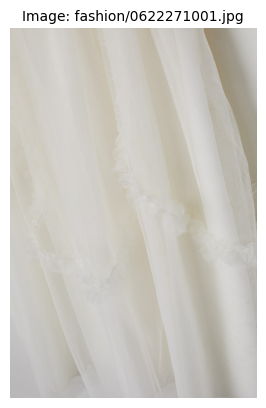

In [34]:
view_image(point1)

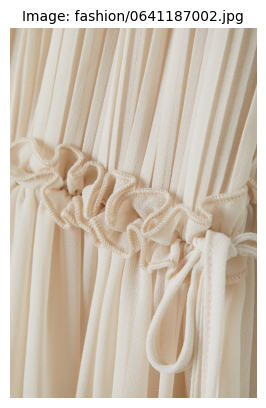

In [35]:
view_image(point2)

### An example of a map:

![Image](map1.png)

> In the next notebook we will do some visual search 

### We can use UMAP to reduce the dimensions and views some similar images

Dimensionality reduction is a valuable tool utilized by machine learning practitioners to gain insights and interpret large, complex datasets that have a high number of dimensions. Among the visualization techniques available, t-SNE is popular, but it may be challenging to use and may perform poorly with larger datasets. Recently, McInnes et al. developed a new method called UMAP, which offers several advantages over t-SNE, such as faster computation and better preservation of the data's global structure. This article aims to delve into the theory behind UMAP, explore its effectiveness in practice, and compare its performance with that of t-SNE.

In [36]:
print("Running Umap on the images vectors embeddings...")

start = time.time()
umap_2d = UMAP(n_components=2, init="random", random_state=0)
proj_2d = umap_2d.fit_transform(list_emb)

print("Done")
elapsed = time.time() - start
print(
    "Elapsed time: "
    + time.strftime(
        "%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)
    )
)

Running Umap on the images vectors embeddings...


ValueError: Expected 2D array, got 1D array instead:
array=[].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

In [37]:
fig_2d = px.scatter(
    proj_2d,
    x=0,
    y=1,
    color=image_files,
    title="Images Vectors Embeddings UMAP Projections",
)

fig_2d.update_traces(marker_size=5, showlegend=False)
fig_2d.show()

NameError: name 'px' is not defined

## Image output:
![Image](umap1.png)

In [38]:
print("Running Umap on the images vectors embeddings...")

start = time.time()
umap_3d = UMAP(n_components=3, init="random", random_state=0)
proj_3d = umap_3d.fit_transform(list_emb)

print("Done")
elapsed = time.time() - start
print(
    "Elapsed time: "
    + time.strftime(
        "%H:%M:%S.{}".format(str(elapsed % 1)[2:])[:15], time.gmtime(elapsed)
    )
)

Running Umap on the images vectors embeddings...


ValueError: Expected 2D array, got 1D array instead:
array=[].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.

In [39]:
fig_3d = px.scatter_3d(
    proj_3d,
    x=0,
    y=1,
    z=2,
    color=image_files,
    title="Images Vectors Embeddings UMAP Projections",
)

fig_3d.update_traces(marker_size=3, showlegend=False)
fig_3d.show()

NameError: name 'px' is not defined

## Image output:
![Image](umap2.png)